In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math

In [2]:
data = pd.read_excel('diabetic_glucose.xlsx')
data.describe()

,FGLU,GLU15,GLU30,GLU60,GLU90,GLU120
count,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000
mean,188.383465,218.811024,276.921260,350.077323,378.771654,383.113701
std,59.173536,69.484123,75.783066,94.773995,103.725002,108.819886
min,106.470000,0.000000,171.000000,194.940000,158.000000,120.060000
25%,138.735000,164.500000,217.000000,280.530000,308.500000,312.930000
50%,182.970000,213.000000,265.000000,336.960000,364.000000,383.040000
75%,218.250000,263.500000,320.000000,389.070000,429.500000,437.040000
max,401.490000,465.000000,549.000000,790.920000,769.000000,727.920000


In [3]:
data[data['GLU15'] == 0]

,FGLU,GLU15,GLU30,GLU60,GLU90,GLU120
104,115.47,0,218,320.94,386,349.02


In [4]:
data.drop(data.index[104], inplace = True)
data.reset_index(drop=True, inplace=True)
data.describe()

,FGLU,GLU15,GLU30,GLU60,GLU90,GLU120
count,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000
mean,188.962143,220.547619,277.388889,350.308571,378.714286,383.384286
std,59.047869,66.937297,75.901407,95.116356,104.137053,109.211396
min,106.470000,117.000000,171.000000,194.940000,158.000000,120.060000
25%,138.982500,165.000000,216.750000,279.765000,308.250000,312.435000
50%,183.015000,213.000000,266.500000,337.950000,364.000000,383.490000
75%,218.385000,263.750000,320.000000,389.565000,429.750000,437.040000
max,401.490000,465.000000,549.000000,790.920000,769.000000,727.920000


Following heatmap clearly indicates that neighboring elements are closely related.

We try exploiting this in methods we shall try: <br>
<ul>
    <li>Linear Regression(but from what direction? I know values FGLU and GLU120. So we shall trail values being predicted using Linear regression from both sides, and maybe take average, or keep iterating till AOC stabilizes(AOC vs # iterations plot))</li>
    <li>If all curves are convex polygons(examine this), we will use algorithms to predict farthest distance of a point from the line joining FGLU and GLU120, in aim of increasing AOC</li>
</ul>

We examined second part, and realised not all curves are convex

<AxesSubplot:>

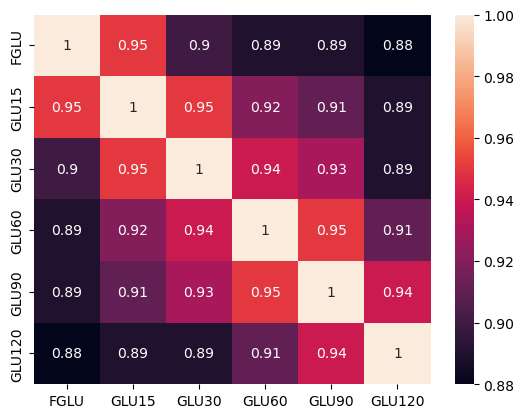

In [5]:
sns.heatmap(data.corr().round(2), annot=True)

## Method 1: Linear Regression 

### Approach 1

In [6]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [7]:
fglu_values = np.array(data['FGLU'].values)
glu15_values = np.array(data['GLU15'].values)
glu30_values = np.array(data['GLU30'].values)
glu60_values = np.array(data['GLU60'].values)
glu90_values = np.array(data['GLU90'].values)
glu120_values = np.array(data['GLU120'].values)

#### Seeding

In [8]:
np.random.seed(0)

def obtain_regression_parameters(values1, values2, train_size):
    X_train, X_val, y_train, y_val = train_test_split(values1, values2, train_size=train_size)

    lr = LinearRegression()
    lr.fit(X_train.reshape(-1, 1), y_train.reshape(-1, 1))

    train_preds = lr.predict(X_train.reshape(-1, 1))
    print('On Training Data')
    print('Score:',lr.score(X_train.reshape(-1,1), y_train.reshape(-1,1)))
    print('MAE:', mean_absolute_error(train_preds, y_train.reshape(-1,1)))

    val_preds = lr.predict(X_val.reshape(-1, 1))
    print('On Validation Data')
    print('Score:',lr.score(X_val.reshape(-1,1), y_val.reshape(-1,1)))
    print('MAE:', mean_absolute_error(val_preds, y_val.reshape(-1,1)))
    
    return lr.coef_, lr.intercept_

#### FGLU vs GLU15

In [9]:
slope1, intercept1 = obtain_regression_parameters(fglu_values, glu15_values, 0.8)

def glu15_from_fglu(x):
    return slope1*x + intercept1

On Training Data
Score: 0.8943667441108487
MAE: 16.410724454842594
On Validation Data
Score: 0.9276105089724107
MAE: 16.160263681341394


#### GLU15 vs GLU30

In [10]:
slope2, intercept2 = obtain_regression_parameters(glu15_values, glu30_values, 0.8)

def glu30_from_glu15(x):
    return slope2*x + intercept2
def glu15_from_glu30(x):
    return (x-intercept2)/slope2

On Training Data
Score: 0.9010570211320704
MAE: 18.744583608462737
On Validation Data
Score: 0.9216974773852821
MAE: 16.364922954099992


#### GLU30 vs GLU60

In [11]:
slope3, intercept3 = obtain_regression_parameters(glu30_values, glu60_values, 0.8)

def glu60_from_glu30(x):
    return slope3*x + intercept3
def glu30_from_glu60(x):
    return (x-intercept3)/slope3

On Training Data
Score: 0.8782912391068586
MAE: 24.735720278072826
On Validation Data
Score: 0.8903898413889946
MAE: 22.393126128695947


#### GLU60 vs GLU90

In [12]:
slope4, intercept4 = obtain_regression_parameters(glu60_values, glu90_values, 0.8)

def glu90_from_glu60(x):
    return slope4*x + intercept4
def glu60_from_glu90(x):
    return (x-intercept4)/slope4

On Training Data
Score: 0.912295313904217
MAE: 22.721790220652494
On Validation Data
Score: 0.9011418249311189
MAE: 26.199798413113776


#### GLU90 vs GLU120

In [13]:
slope5, intercept5 = obtain_regression_parameters(glu60_values, glu90_values, 0.8)

def glu90_from_glu120(x):
    return (x-intercept5)/slope5

On Training Data
Score: 0.9134375644144617
MAE: 24.046165363369983
On Validation Data
Score: 0.8920880547524894
MAE: 20.20251260474224


#### True AOC values

In [14]:
AOC = []

x = [0, 15, 30, 60, 90, 120]
for i in range(len(data)):
    AOC.append(np.trapz(data.loc[i].values, x))
    
pd.DataFrame(AOC).describe()

,0
count,126.000000
mean,38588.130357
std,10451.950164
min,20348.400000
25%,30520.462500
50%,37033.087500
75%,42819.806250
max,80055.075000


### Stage 1 AOC Approximation

AOC only with points FGLU and GLU120

In [15]:
Approx_AOC1 = []

for i in range(len(data)):
    Approx_AOC1.append(np.trapz([data.loc[i].values[0], data.loc[i].values[-1]], [0,120]))

pd.DataFrame(Approx_AOC1).describe()

,0
count,126.000000
mean,34340.785714
std,9819.391387
min,13683.600000
25%,27368.550000
50%,34379.100000
75%,39240.450000
max,67764.600000


#### Cases where the the Approx AOC 1 exceed true AOC

This means that some/all post prandial values lie below the line joining FGLU and GLU120<br>
*****We can remove these points, considering them outliers. We shall analyse both way***

In [16]:
for i in range(len(data)):
    if AOC[i] < Approx_AOC1[i]:
        print(f'Case {i}: AOC = {AOC[i]}, Approx_AOC = {Approx_AOC1[i]}')

Case 6: AOC = 55663.200000000004, Approx_AOC = 56462.399999999994
Case 18: AOC = 40951.8, Approx_AOC = 42001.2
Case 38: AOC = 32387.925, Approx_AOC = 32491.8
Case 66: AOC = 28848.675000000003, Approx_AOC = 28884.600000000002
Case 91: AOC = 32574.975, Approx_AOC = 32761.8
Case 94: AOC = 26404.725, Approx_AOC = 28290.6


In [17]:
# data.drop(index = [6,18,38,66,91,94], inplace = True)
# data.reset_index(drop=True, inplace=True)
# data.describe()

#### Mean Absolute error after Stage 1 Approximation

In [18]:
mean_absolute_error(AOC, Approx_AOC1)

4311.8065476190495

### Stage 2 AOC Approximation

#### Part 1

In [19]:
glu15_preds_f = glu15_from_fglu(fglu_values)[0]
glu30_preds_f = glu30_from_glu15(glu15_preds_f)[0]
glu60_preds_f = glu60_from_glu30(glu30_preds_f)[0]
glu90_preds_f = glu90_from_glu60(glu60_preds_f)[0]

In [20]:
Approx_AOC2_1 = []

for i in range(len(data)):
    Approx_AOC2_1.append(np.trapz([data.loc[i].values[0], glu15_preds_f[i], glu30_preds_f[i], glu60_preds_f[i], glu90_preds_f[i],
                                 data.loc[i].values[-1]], x))
    
pd.DataFrame(Approx_AOC2_1).describe()

,0
count,126.000000
mean,38631.659434
std,9198.806367
min,24093.796174
25%,31160.247442
50%,37920.397493
75%,43565.202359
max,71593.484368


In [21]:
mean_absolute_error(Approx_AOC2_1, AOC)

2499.568376700056

#### Part 2

In [22]:
glu90_preds_b = glu90_from_glu120(glu120_values)[0]
glu60_preds_b = glu60_from_glu90(glu90_preds_b)[0]
glu30_preds_b = glu30_from_glu60(glu60_preds_b)[0]
glu15_preds_b = glu15_from_glu30(glu30_preds_b)[0]

In [23]:
Approx_AOC2_2 = []

for i in range(len(data)):
    Approx_AOC2_2.append(np.trapz([data.loc[i].values[0], glu15_preds_b[i], glu30_preds_b[i], glu60_preds_b[i], glu90_preds_b[i],
                                 data.loc[i].values[-1]], x))
    
pd.DataFrame(Approx_AOC2_2).describe()

,0
count,126.000000
mean,36536.156264
std,11325.907027
min,9566.526366
25%,29136.263737
50%,36263.523659
75%,42128.509003
max,72622.919582


In [24]:
mean_absolute_error(Approx_AOC2_2, AOC)

3010.1214921482106

### Part 3
Combining Part 1 and Part 2

In [25]:
glu90_preds = (glu90_preds_f*0.95*0.94*0.91*0.89 + glu90_preds_b*0.94)/(0.95*0.94*0.91*0.89+0.94)
glu60_preds = (glu60_preds_f*0.94*0.92*0.89 + glu60_preds_b*0.95*0.91)/(0.94*0.92*0.89+0.95*0.91)
glu30_preds = (glu30_preds_f*0.9*0.95 + glu30_preds_b*0.94*0.93*0.89)/(0.9*0.95+0.94*0.93*0.89)
glu15_preds = (glu15_preds_f*0.95 + glu15_preds_b*0.95*0.92*0.91*0.89)/(0.95+0.95*0.92*0.91*0.89)

In [26]:
Approx_AOC2_3 = []

for i in range(len(data)):
    Approx_AOC2_3.append(np.trapz([data.loc[i].values[0], glu15_preds[i], glu30_preds[i], glu60_preds[i], glu90_preds[i],
                                 data.loc[i].values[-1]], x))
    
pd.DataFrame(Approx_AOC2_3).describe()

,0
count,126.000000
mean,37548.927662
std,10107.315522
min,16587.657881
25%,30316.752360
50%,37679.877571
75%,42612.459343
max,72125.386314


In [27]:
mean_absolute_error(Approx_AOC2_3, AOC)

1996.6498520847592

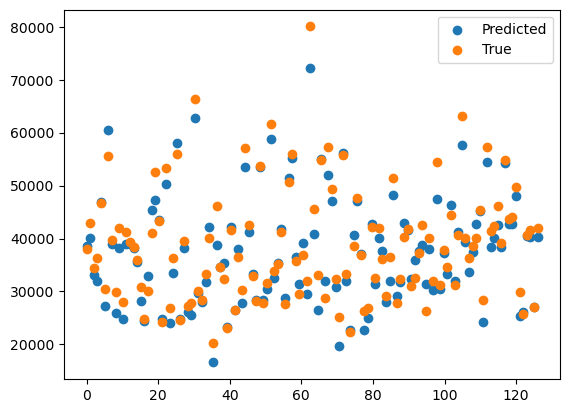

In [28]:
plt.scatter(np.linspace(0,126,126), Approx_AOC2_3, label='Predicted')
plt.scatter(np.linspace(0,126,126), AOC, label='True')
plt.legend()
plt.show()

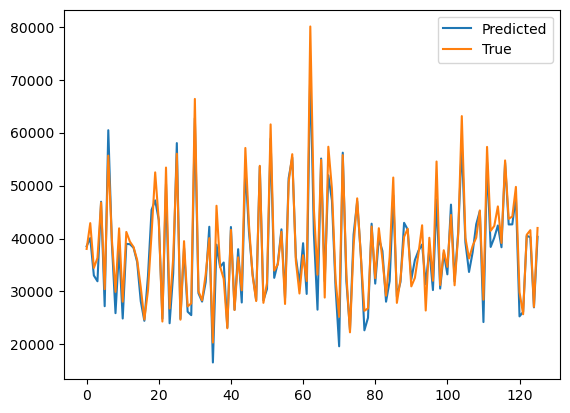

In [29]:
plt.plot(Approx_AOC2_3, label='Predicted')
plt.plot(AOC, label='True')
plt.legend()
plt.show()

In [30]:
def predict_approach1(fglu, glu120):
    
    glu15_f = glu15_from_fglu(fglu)[0][0]
    glu30_f = glu30_from_glu15(glu15_f)[0][0]
    glu60_f = glu60_from_glu30(glu30_f)[0][0]
    glu90_f = glu90_from_glu60(glu60_f)[0][0]

    glu90_b = glu90_from_glu120(glu120)[0][0]
    glu60_b = glu60_from_glu90(glu90_b)[0][0]
    glu30_b = glu30_from_glu60(glu60_b)[0][0]
    glu15_b = glu15_from_glu30(glu30_b)[0][0]

    glu90 = (glu90_f*0.95*0.94*0.91*0.89 + glu90_b*0.94)/(0.95*0.94*0.91*0.89+0.94)
    glu60 = (glu60_f*0.94*0.92*0.89 + glu60_b*0.95*0.91)/(0.94*0.92*0.89+0.95*0.91)
    glu30 = (glu30_f*0.9*0.95 + glu30_b*0.94*0.93*0.89)/(0.9*0.95+0.94*0.93*0.89)
    glu15 = (glu15_f*0.95 + glu15_b*0.95*0.92*0.91*0.89)/(0.95+0.95*0.92*0.91*0.89)
    
    area = np.trapz([fglu, glu15, glu30, glu60, glu90,glu120], [0,15,30,60,90,120])
    return {'glu90':glu90, 'glu60':glu60, 'glu30':glu30, 'glu15':glu15, 'area': area}

In [31]:
data.iloc[0], AOC[0]

(FGLU      202.50
 GLU15     237.00
 GLU30     279.00
 GLU60     313.02
 GLU90     384.00
 GLU120    385.02
 Name: 0, dtype: float64,
 38037.149999999994)

In [32]:
predict_approach1(202.50,385.02)

{'glu90': 373.1644394289618,
 'glu60': 348.5821715596243,
 'glu30': 278.4596710671568,
 'glu15': 222.78244128572678,
 'area': 38553.52754795451}

### Stage 3 AOC Approximation

In [33]:
glu15_preds_copy = glu15_preds.copy()
glu30_preds_copy = glu30_preds.copy()
glu60_preds_copy = glu60_preds.copy()
glu90_preds_copy = glu90_preds.copy()


num_iterations = 100
Approx_AOC3_1 = []
for i in range(num_iterations):
    
    Approx = []
    glu30_preds_nf = glu30_from_glu15(glu15_preds_copy)[0]
    glu60_preds_nf = glu60_from_glu30(glu30_preds_nf)[0]
    glu90_preds_nf = glu90_from_glu60(glu60_preds_nf)[0]
    
    glu60_preds_nb = glu60_from_glu90(glu90_preds_copy)[0]
    glu30_preds_nb = glu30_from_glu60(glu60_preds_nb)[0]
    glu15_preds_nb = glu15_from_glu30(glu30_preds_nb)[0]
    
    glu15_preds_copy = (glu15_preds[0] + glu15_preds_nb*0.95*0.92*0.91)/(0.95*0.92*0.91+1)
    glu30_preds_copy = (glu30_preds_nf*0.95 + glu30_preds_nb*0.94*0.93)/(0.95+0.94*0.93)
    glu60_preds_copy = (glu60_preds_nf*0.94*0.92+glu60_preds_nb*0.95)/(0.94*0.92+0.95)
    glu90_preds_copy = (glu90_preds[0] + glu90_preds_nf*0.95*0.93*0.91)/(0.95*0.93*0.91+1)
    
    for i in range(len(data)):
        Approx.append(np.trapz([data.loc[i].values[0], glu15_preds_copy[i], glu30_preds_copy[i], glu60_preds_copy[i],
                                glu90_preds_copy[i], data.loc[i].values[-1]], x))
    
    Approx_AOC3_1.append(Approx)

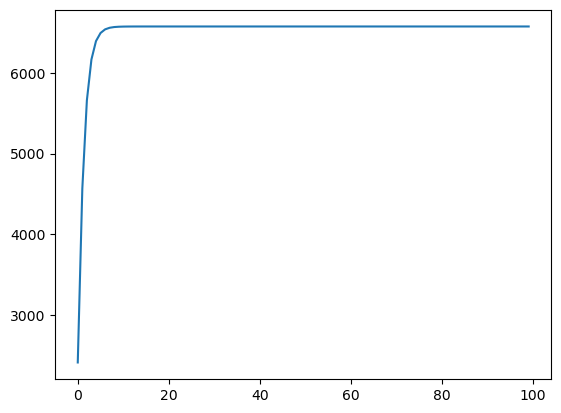

In [34]:
errors = []
for i in range(num_iterations):
    errors.append(mean_absolute_error(Approx_AOC3_1[i], AOC))
    
plt.plot(errors)
plt.show()

#### We wanted the mean absolute error to decrease, here things are rather worsening. Why?

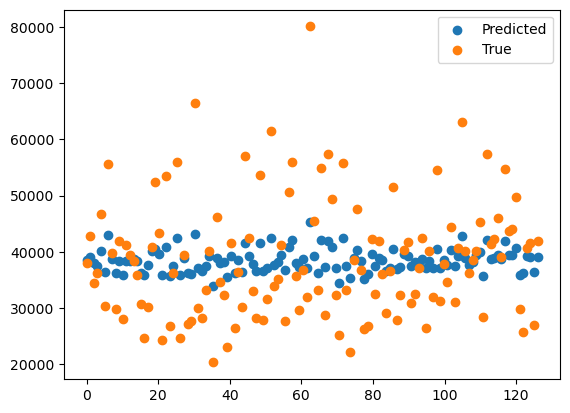

In [35]:
plt.scatter(np.linspace(0,126,126), Approx_AOC3_1[9], label='Predicted')
plt.scatter(np.linspace(0,126,126), AOC, label='True')
plt.legend()
plt.show()

In [36]:
glu15_preds_copy = glu15_preds.copy()
glu30_preds_copy = glu30_preds.copy()
glu60_preds_copy = glu60_preds.copy()
glu90_preds_copy = glu90_preds.copy()


num_iterations = 10
Approx_AOC3_2 = []
for i in range(num_iterations):
    
    Approx = []
    glu30_preds_copy = (glu30_from_glu15(glu15_preds_copy)[0]*0.95 + glu30_preds_copy)/1.95
    glu60_preds_copy = (glu60_from_glu30(glu30_preds_copy)[0]*0.94 + glu60_preds_copy)/1.94
    glu90_preds_copy = (glu90_from_glu60(glu60_preds_copy)[0]*0.95 + glu90_preds_copy)/1.95
    
    for i in range(len(data)):
        Approx.append(np.trapz([data.loc[i].values[0], glu15_preds_copy[i], glu30_preds_copy[i], glu60_preds_copy[i],
                                glu90_preds_copy[i], data.loc[i].values[-1]], x))
    
    Approx_AOC3_2.append(Approx)
    
    Approx = []    
    
    glu60_preds_copy = (glu60_from_glu90(glu90_preds_copy)[0]*0.95 + glu60_preds_copy)/1.95
    glu30_preds_copy = (glu30_from_glu60(glu60_preds_copy)[0]*0.94 + glu30_preds_copy)/1.94
    glu15_preds_copy = (glu15_from_glu30(glu30_preds_copy)[0]*0.95 + glu15_preds_copy)/1.95
    
    for i in range(len(data)):
        Approx.append(np.trapz([data.loc[i].values[0], glu15_preds_copy[i], glu30_preds_copy[i], glu60_preds_copy[i],
                                glu90_preds_copy[i], data.loc[i].values[-1]], x))
    
    Approx_AOC3_2.append(Approx)

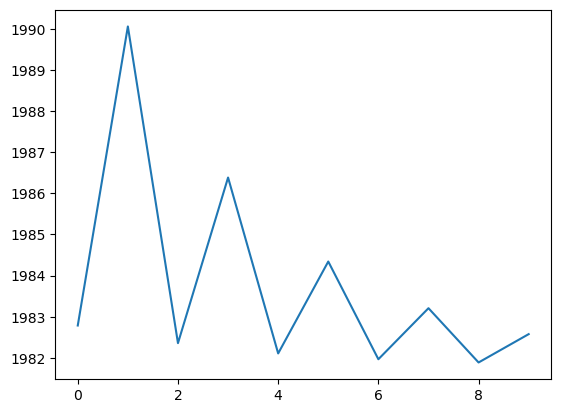

In [37]:
errors = []
for i in range(num_iterations):
    errors.append(mean_absolute_error(Approx_AOC3_2[i], AOC))
    
plt.plot(errors)
plt.show()

#### Again, we didn't want this!

Predicted values deviate heavily from true values<br>
Reason?<br>
#### We have killed dependence on FGLU and GLU120 in our iterative approaches of Stage 3.<br>
We need to modify stage 3 for desired results

In [38]:
glu15_preds_copy = glu15_preds.copy()
glu30_preds_copy = glu30_preds.copy()
glu60_preds_copy = glu60_preds.copy()
glu90_preds_copy = glu90_preds.copy()


num_iterations = 10
Approx_AOC3_3 = []
for i in range(num_iterations):
    
    Approx = []
    glu30_preds_copy = (glu30_from_glu15(glu15_preds_copy)[0]*0.95 + glu30_preds_copy)/1.95
    glu60_preds_copy = (glu60_from_glu30(glu30_preds_copy)[0]*0.94 + glu60_preds_copy)/1.94
    glu90_preds_copy = (glu90_from_glu60(glu60_preds_copy)[0]*0.95 + glu90_preds_copy + glu90_from_glu120(glu120_values)[0]*0.94)/(1.95+0.94)
    
    for i in range(len(data)):
        Approx.append(np.trapz([data.loc[i].values[0], glu15_preds_copy[i], glu30_preds_copy[i], glu60_preds_copy[i],
                                glu90_preds_copy[i], data.loc[i].values[-1]], x))
    
    Approx_AOC3_3.append(Approx)
    
    Approx = []    
    
    glu60_preds_copy = (glu60_from_glu90(glu90_preds_copy)[0]*0.95 + glu60_preds_copy)/1.95
    glu30_preds_copy = (glu30_from_glu60(glu60_preds_copy)[0]*0.94 + glu30_preds_copy)/1.94
    glu15_preds_copy = (glu15_from_glu30(glu30_preds_copy)[0]*0.95 + glu15_preds_copy + glu15_from_fglu(fglu_values)[0]*0.95)/(1.95+0.95)
    
    for i in range(len(data)):
        Approx.append(np.trapz([data.loc[i].values[0], glu15_preds_copy[i], glu30_preds_copy[i], glu60_preds_copy[i],
                                glu90_preds_copy[i], data.loc[i].values[-1]], x))
    
    Approx_AOC3_3.append(Approx)

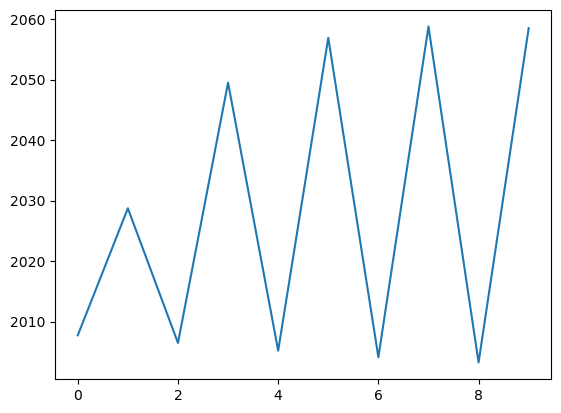

In [39]:
errors = []
for i in range(num_iterations):
    errors.append(mean_absolute_error(Approx_AOC3_3[i], AOC))
    
plt.plot(errors)
plt.show()

#### Not much of a benefit. We stop at stage 2 of our Approximation

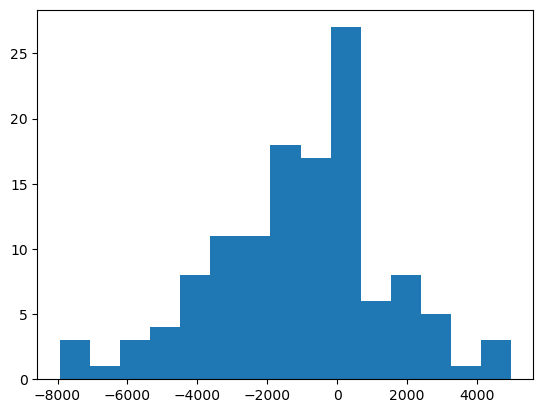

In [40]:
errors = [Approx_AOC2_3[i]- AOC[i] for i in range(len(AOC))]
plt.hist(errors, bins=15)
plt.show()

In [41]:
print(slope1[0][0], intercept1[0])
print(slope2[0][0], intercept2[0])
print(slope3[0][0], intercept3[0])
print(slope4[0][0], intercept4[0])
print(slope5[0][0], intercept5[0])

1.0756093508364044 18.476704039713184
1.0716581742461595 41.38979986091411
1.1554643005932366 28.891267687604795
1.0323944577882995 14.75178033880519
1.053341561927553 10.47111862294571


In [42]:
slopes = [slope1[0][0],slope2[0][0],slope3[0][0],slope4[0][0],slope5[0][0]]
intercepts = [intercept1[0],intercept2[0],intercept3[0],intercept4[0],intercept5[0]]

In [43]:
df = pd.DataFrame({'Slope': slopes, 'Intercept': intercepts}, index =['fglu-glu15','glu15-glu30','glu30-glu60','glu60-glu90','glu90-glu120'])

In [44]:
# df.to_csv("Approach1.csv")

In [45]:
# df = pd.read_csv("Approach1.csv", index_col=0)
# df

### Approach 2

In [46]:
fglu_values = np.array(data['FGLU'].values)
glu15_values = np.array(data['GLU15'].values)
glu30_values = np.array(data['GLU30'].values)
glu60_values = np.array(data['GLU60'].values)
glu90_values = np.array(data['GLU90'].values)
glu120_values = np.array(data['GLU120'].values)

In [92]:
np.random.seed(0)

def obtain_linear_regressor(inputs, output, train_size):
    model = LinearRegression()
    X = np.column_stack(inputs)
    y = np.array(output)
    X_train, X_val, y_train, y_val = train_test_split(X, y, train_size = train_size, random_state=10)
    model.fit(X_train, y_train)
    
    train_preds = model.predict(X_train)
    print('On Training Data')
    print('Score:',model.score(X_train, y_train))
    print('MAE:', mean_absolute_error(train_preds, y_train))

    val_preds = model.predict(X_val)
    print('On Validation Data')
    print('Score:',model.score(X_val, y_val))
    print('MAE:', mean_absolute_error(val_preds, y_val))
    
    return model

#### GLU15 from FGLU and GLU120

In [48]:
lr1 = obtain_linear_regressor([fglu_values, glu120_values], glu15_values, 0.8)
lr1.coef_, lr1.intercept_

On Training Data
Score: 0.918354937566227
MAE: 15.255590053230522
On Validation Data
Score: 0.8773959632936964
MAE: 16.099670649948358


(array([0.90504135, 0.10075951]), 10.651305219884534)

#### GLU30 from FGLU, GLU120 and GLU15

In [49]:
lr2 = obtain_linear_regressor([fglu_values, glu120_values, glu15_values], glu30_values, 0.8)
lr2.coef_, lr2.intercept_

On Training Data
Score: 0.9109035453829655
MAE: 17.96004666993655
On Validation Data
Score: 0.9265866827136522
MAE: 14.865160034898631


(array([-0.2279615 ,  0.14550729,  1.04908789]), 32.880706912326616)

#### GLU60 from FGLU, GLU120 ,GLU15 and GLU30

In [50]:
lr3 = obtain_linear_regressor([fglu_values, glu120_values, glu15_values, glu30_values], glu60_values, 0.8)
lr3.coef_, lr3.intercept_

On Training Data
Score: 0.9109889622541872
MAE: 20.712588348244207
On Validation Data
Score: 0.9228104994011926
MAE: 18.90041803537002


(array([ 0.289407  ,  0.29440864, -0.13230927,  0.70043677]),
 16.80949410307528)

#### GLU90 from FGLU, GLU120 ,GLU15, GLU30 and GLU60

In [51]:
lr4 = obtain_linear_regressor([fglu_values, glu120_values, glu15_values, glu30_values, glu60_values], glu90_values, 0.8)
lr4.coef_, lr4.intercept_

On Training Data
Score: 0.9456150641997316
MAE: 17.460718573738337
On Validation Data
Score: 0.919408538769276
MAE: 21.6103726976976


(array([ 0.10645438,  0.37295267, -0.07526322,  0.22848065,  0.44718747]),
 12.603804552611052)

#### Predictions

In [52]:
glu15_preds_adv = lr1.predict(np.column_stack((fglu_values, glu120_values)))
glu30_preds_adv = lr2.predict(np.column_stack((fglu_values, glu120_values, glu15_preds_adv)))
glu60_preds_adv = lr3.predict(np.column_stack((fglu_values, glu120_values, glu15_preds_adv, glu30_preds_adv)))
glu90_preds_adv = lr4.predict(np.column_stack((fglu_values, glu120_values, glu15_preds_adv, glu30_preds_adv, glu60_preds_adv)))

In [53]:
Approx_AOC_Approach2 = []
for i in range(len(data)):
        Approx_AOC_Approach2.append(np.trapz([data.loc[i].values[0], glu15_preds_adv[i], glu30_preds_adv[i], glu60_preds_adv[i],
                                glu90_preds_adv[i], data.loc[i].values[-1]], x))

In [54]:
mean_absolute_error(Approx_AOC_Approach2, AOC)

1881.1293888565033

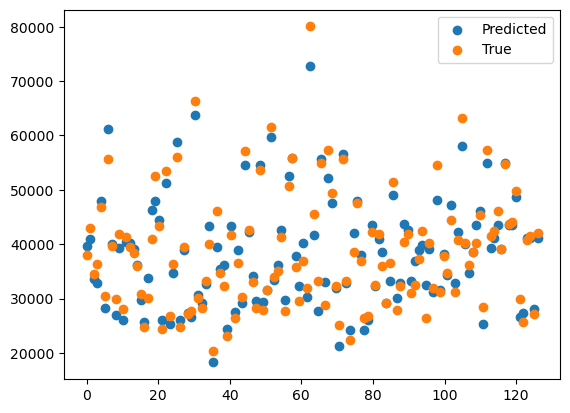

In [55]:
plt.scatter(np.linspace(0,126,126), Approx_AOC_Approach2, label='Predicted')
plt.scatter(np.linspace(0,126,126), AOC, label='True')
plt.legend()
plt.show()

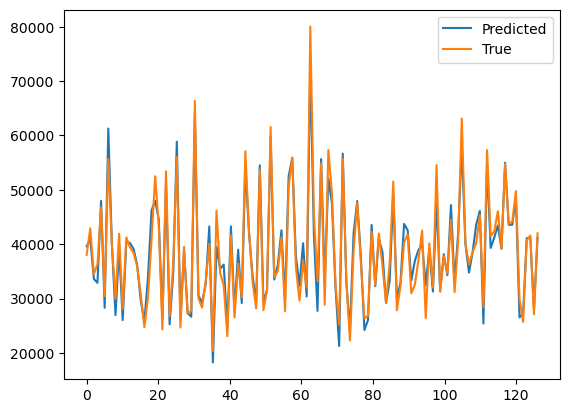

In [56]:
plt.plot(np.linspace(0,126,126), Approx_AOC_Approach2, label='Predicted')
plt.plot(np.linspace(0,126,126), AOC, label='True')
plt.legend()
plt.show()

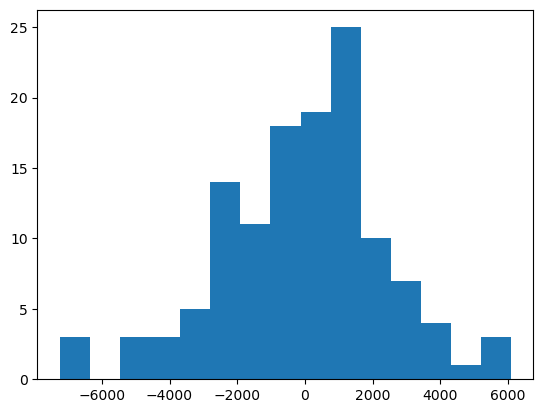

In [57]:
errors = [Approx_AOC_Approach2[i]- AOC[i] for i in range(len(AOC))]
plt.hist(errors, bins=15)
plt.show()

In [58]:
def predict_approach2(fglu, glu120):
    
    glu15 = lr1.predict(np.column_stack((fglu, glu120)))[0]
    glu30 = lr2.predict(np.column_stack((fglu, glu120, glu15)))[0]
    glu60 = lr3.predict(np.column_stack((fglu, glu120, glu15, glu30)))[0]
    glu90 = lr4.predict(np.column_stack((fglu, glu120, glu15, glu30, glu60)))[0]
    
    area = np.trapz([fglu, glu15, glu30, glu60, glu90,glu120], [0,15,30,60,90,120])
    return {'glu90':glu90, 'glu60':glu60, 'glu30':glu30, 'glu15':glu15, 'area': area}

In [59]:
data.iloc[0]

FGLU      202.50
GLU15     237.00
GLU30     279.00
GLU60     313.02
GLU90     384.00
GLU120    385.02
Name: 0, dtype: float64

In [60]:
predict_approach2(202.50,385.02)

{'glu90': 386.2914006277863,
 'glu60': 358.9196869009542,
 'glu30': 286.88189068218765,
 'glu15': 232.71660345065203,
 'area': 39595.97421797122}

In [97]:
lr5 = obtain_linear_regressor([fglu_values, glu120_values], glu90_values, 0.8)
lr6 = obtain_linear_regressor([fglu_values, glu120_values, glu90_values], glu15_values, 0.8)
lr7 = obtain_linear_regressor([fglu_values, glu120_values, glu90_values, glu15_values], glu60_values, 0.8)
lr8 = obtain_linear_regressor([fglu_values, glu120_values, glu90_values, glu15_values, glu60_values], glu30_values, 0.8)

On Training Data
Score: 0.9091850880843523
MAE: 22.946855635902175
On Validation Data
Score: 0.8560579993009378
MAE: 29.287736692900598
On Training Data
Score: 0.9243644524496039
MAE: 14.753006654755424
On Validation Data
Score: 0.9024130211472845
MAE: 14.884982883291418
On Training Data
Score: 0.921904696650359
MAE: 19.003011504609283
On Validation Data
Score: 0.9286797231144576
MAE: 18.924527981629964
On Training Data
Score: 0.9343545249958324
MAE: 15.561851978535879
On Validation Data
Score: 0.9448806376152694
MAE: 13.962426577572002


In [98]:
glu90_preds_adv2 = lr5.predict(np.column_stack((fglu_values, glu120_values)))
glu15_preds_adv2 = lr6.predict(np.column_stack((fglu_values, glu120_values, glu90_preds_adv2)))
glu60_preds_adv2 = lr7.predict(np.column_stack((fglu_values, glu120_values, glu90_preds_adv2, glu15_preds_adv2)))
glu30_preds_adv2 = lr8.predict(np.column_stack((fglu_values, glu120_values, glu90_preds_adv2, glu15_preds_adv2, glu60_preds_adv2)))

In [99]:
Approx_AOC_Approach2_2 = []
for i in range(len(data)):
        Approx_AOC_Approach2_2.append(np.trapz([data.loc[i].values[0], glu15_preds_adv2[i], glu30_preds_adv2[i], glu60_preds_adv2[i],
                                glu90_preds_adv2[i], data.loc[i].values[-1]], x))

In [100]:
mean_absolute_error(Approx_AOC_Approach2_2, AOC)

1881.1293888565028

#### Both are good enough predictions

In [62]:
# with open("Approach2.txt", "w") as f:
#     f.write(f"glu15 = {lr1.coef_[0]}*fglu + {lr1.coef_[1]}*glu120 + {lr1.intercept_}\n")
#     f.write(f"glu30 = {lr2.coef_[0]}*fglu + {lr2.coef_[1]}*glu120 + {lr2.coef_[2]}*glu15 + {lr1.intercept_}\n")
#     f.write(f"glu60 = {lr3.coef_[0]}*fglu + {lr3.coef_[1]}*glu120 + {lr3.coef_[2]}*glu15 + {lr3.coef_[3]}*glu30 + {lr3.intercept_}\n")
#     f.write(f"glu90 = {lr4.coef_[0]}*fglu + {lr4.coef_[1]}*glu120 + {lr4.coef_[2]}*glu15 + {lr4.coef_[3]}*glu30 + {lr4.coef_[4]}*glu60 +{lr4.intercept_}\n")

In [63]:
approach1_box = []
approach2_box = []
for i in range(len(Approx_AOC_Approach2)):
    a = abs(Approx_AOC2_3[i] - AOC[i])
    b = abs(Approx_AOC_Approach2[i] - AOC[i])
    if(a < b): approach1_box.append(i)
    else: approach2_box.append(i)

In [64]:
len(approach1_box), len(approach2_box)

(56, 70)

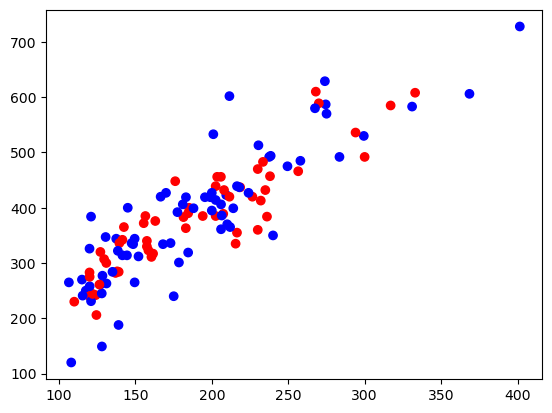

In [65]:
colors = ['r' if i in approach1_box else 'b' for i in range(len(data))]
plt.scatter(fglu_values, glu120_values, c=colors)
plt.show()

In [66]:
data_new = data.copy()
data_new['type'] = 1
data_new.loc[approach2_box , 'type'] = 2
data_new

,FGLU,GLU15,GLU30,GLU60,GLU90,GLU120,type
0,202.50,237,279,313.02,384,385.02,1
1,195.48,263,314,385.92,419,419.04,2
2,120.96,154,232,311.04,364,383.94,2
3,148.50,194,249,347.04,376,334.08,2
4,256.50,299,320,417.96,455,466.02,1
...,...,...,...,...,...,...,...
121,126.45,173,196,216.00,245,261.00,1
122,176.04,228,284,343.98,418,448.02,1
123,202.50,234,319,372.06,400,414.00,2
124,119.97,134,171,246.06,290,282.96,1


In [67]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

In [68]:
np.random.seed(0)

def obtain_rf_clf(inputs, output, train_size):
    model = RandomForestClassifier(random_state = 0)
#     model = LogisticRegression(random_state=0)
#     model = SVC(kernel='linear', random_state=42)
    X = np.column_stack(inputs)
    y = np.array(output)
    X_train, X_val, y_train, y_val = train_test_split(X, y, train_size = train_size, random_state=10)
#     print(X_val)
    model.fit(X_train, y_train)
    
    train_preds = model.predict(X_train)
    print('On Training Data')
    print('Score:',model.score(X_train, y_train))
    print('Accuracy:', accuracy_score(y_train, train_preds))

    val_preds = model.predict(X_val)
    print('On Validation Data')
    print('Score:',model.score(X_val, y_val))
    print('ACcuracy:', accuracy_score(y_val,val_preds))
    
    return model

In [69]:
rf_clf = obtain_rf_clf([data['FGLU'].values, data['GLU120'].values], data_new['type'].values, 0.8)

On Training Data
Score: 1.0
Accuracy: 1.0
On Validation Data
Score: 0.6153846153846154
ACcuracy: 0.6153846153846154


In [70]:
rf_clf = obtain_rf_clf([data['FGLU'].values, data['GLU120'].values], data_new['type'].values, 0.99)

On Training Data
Score: 1.0
Accuracy: 1.0
On Validation Data
Score: 0.0
ACcuracy: 0.0


In [71]:
def predict_approach1n2(fglu, glu120):
    approach_type = rf_clf.predict(np.column_stack(([fglu],[glu120])))[0]
    if (approach_type == 1): return predict_approach1(fglu, glu120)
    elif (approach_type == 2): return predict_approach2(fglu, glu120)
    else: print("Invalid")

In [72]:
data_new.iloc[10]

FGLU      117.54
GLU15     165.00
GLU30     225.00
GLU60     270.00
GLU90     260.00
GLU120    250.02
type        2.00
Name: 10, dtype: float64

In [73]:
predict_approach1n2(117.54, 250.02)

{'glu90': 258.71715269670733,
 'glu60': 239.86917696623712,
 'glu30': 191.6689681095419,
 'glu15': 142.22175711096816,
 'area': 26035.31802901755}

In [74]:
Approx_AOC_Approach1n2 = []
for i in range(len(data)):
    Approx_AOC_Approach1n2.append(predict_approach1n2(data.iloc[i]['FGLU'], data.iloc[i]['GLU120'])['area'])

In [75]:
mean_absolute_error(Approx_AOC_Approach1n2, AOC)

1503.145846578049

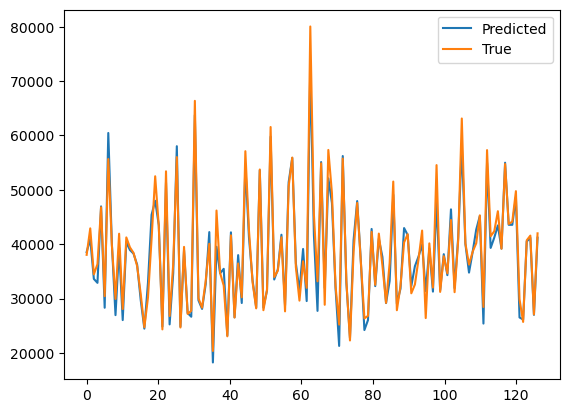

In [76]:
plt.plot(np.linspace(0,126,126), Approx_AOC_Approach1n2, label='Predicted')
plt.plot(np.linspace(0,126,126), AOC, label='True')
plt.legend()
plt.show()

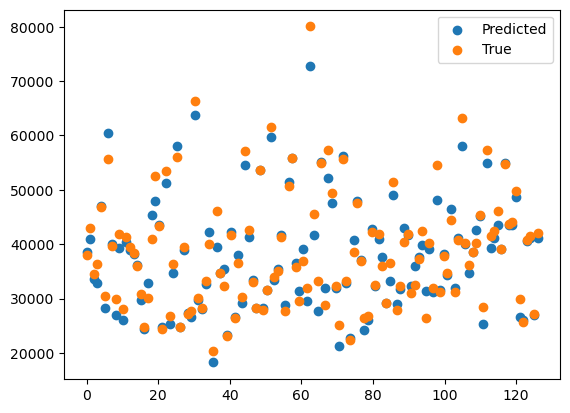

In [77]:
plt.scatter(np.linspace(0,126,126), Approx_AOC_Approach1n2, label='Predicted')
plt.scatter(np.linspace(0,126,126), AOC, label='True')
plt.legend()
plt.show()

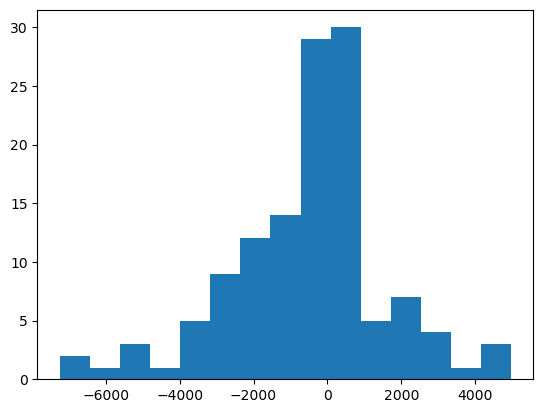

In [78]:
errors = [Approx_AOC_Approach1n2[i]- AOC[i] for i in range(len(AOC))]
plt.hist(errors, bins=15)
plt.show()

### Further Ideas

<ul>
    <li>Can we divide into further number of classes?</li>
    We probably can, but we have such small data, may not be a very good choice. Also for binary classification itself, we were obtaining poor validation accuracy ~0.6
    <li>What if we do the entire analysis for FGLU and GLU60</li>
</ul>

In [79]:
import torch.nn as nn
import torch.optim as optim
import torch
import torch.nn.functional as F

In [80]:
from sklearn.model_selection import train_test_split

input_values = torch.tensor(np.array(data[['FGLU', 'GLU120']]), dtype=torch.float32) #shape torch.Size([126,2])
# output_values = torch.tensor(np.array(data[['GLU15' ,'GLU30', 'GLU60', 'GLU90']])) #shape torch.Size([126,4])
output_values = torch.tensor(np.trapz(data.values, x), dtype=torch.float32) #shape torch.size([126])

X_train, X_test, y_train, y_test = train_test_split(input_values, output_values, train_size=0.85, random_state=1)
X_train.shape, y_train.shape, X_test.shape, y_test.shape

(torch.Size([107, 2]),
 torch.Size([107]),
 torch.Size([19, 2]),
 torch.Size([19]))

In [81]:
y_test

tensor([29870.2500, 33010.4258, 22283.0254, 30960.4492, 31167.9004, 35108.9258,
        49756.8750, 27083.4746, 54752.3984, 36448.8008, 32574.9746, 61558.0508,
        36246.4492, 20348.4004, 57107.6250, 44149.8750, 38642.0234, 63124.8008,
        41578.0508])

In [82]:
X_mean = X_train.mean(0)
y_mean = y_train.mean(0)
X_std = X_train.std(0)
y_std = y_train.std(0)
X_train = (X_train-X_mean)/X_std
y_train = (y_train-y_mean)/y_std

X_test = (X_test-X_mean)/X_std
y_test = (y_test-y_mean)/y_std
y_test

tensor([-0.8542, -0.5423, -1.6077, -0.7459, -0.7253, -0.3339,  1.1210, -1.1309,
         1.6171, -0.2008, -0.5855,  2.2930, -0.2209, -1.7999,  1.8510,  0.5641,
         0.0170,  2.4487,  0.3087])

In [83]:
y_mean, y_std

(tensor(38470.3906), tensor(10068.5430))

In [84]:
X_mean, X_std

(tensor([187.9385, 382.1821]), tensor([ 58.1336, 105.3185]))

In [85]:
class SimpleNet(nn.Module):
    def __init__(self):
        super(SimpleNet, self).__init__()
        self.fc1 = nn.Linear(2, 32)
        self.fc2 = nn.Linear(32, 8)
        self.fc3 = nn.Linear(8, 1)
    
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

In [86]:
import math

def train(model, optimizer, criterion, train_loader, batch_size, training_size, display_size):
    i = 0
    running_loss = 0 #Accumulates loss over display_step number of minibatches
    for data in train_loader:
        inputs, labels = data
        optimizer.zero_grad() # To avoid accumulation of gradients
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward() 
        optimizer.step() # Backpropagation
        i += 1
        
        running_loss += loss.item()
        if(i%display_size == 0):
#             print(running_loss, display_size)
            print(f"Training Loss at {i}/{math.ceil(training_size/batch_size)} mini-batches: {running_loss/display_size}")
            running_loss = 0

In [87]:
class MyDataset(torch.utils.data.Dataset):

    def __init__(self, inputs, labels):
        self.inputs = inputs
        self.labels = labels

    def __len__(self):
        return len(self.inputs)

    def __getitem__(self, idx):
        return self.inputs[idx], self.labels[idx]

In [88]:
from torchsummary import summary

model_SimpleNet = SimpleNet()
model_SimpleNet, summary(model_SimpleNet,(107,2))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1              [-1, 107, 32]              96
            Linear-2               [-1, 107, 8]             264
            Linear-3               [-1, 107, 1]               9
Total params: 369
Trainable params: 369
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.03
Params size (MB): 0.00
Estimated Total Size (MB): 0.04
----------------------------------------------------------------


(SimpleNet(
   (fc1): Linear(in_features=2, out_features=32, bias=True)
   (fc2): Linear(in_features=32, out_features=8, bias=True)
   (fc3): Linear(in_features=8, out_features=1, bias=True)
 ),
 None)

In [89]:
dataset = MyDataset(X_train, y_train)
torch.manual_seed(1)
optimizer = optim.SGD(model_SimpleNet.parameters(), lr=0.01, momentum=0.9) # Stochastic Gradient Descent Optimiser
criterion = nn.MSELoss() # Mean Squared Error Loss criterion

In [90]:
from torch.utils.data import DataLoader

def automate_training(batch_size, training_size, display_size, dataset, num_epochs):
    training_errors = []
    test_errors = []
    train_loader = DataLoader(dataset, batch_size = batch_size)
    for i in range(num_epochs):
        print(f"Training Epoch {i+1}")
        train(model_SimpleNet, optimizer, criterion, train_loader, batch_size, training_size, display_size)
        print("*********************")
        with torch.no_grad():
            train_preds = model_SimpleNet(X_train)
            training_errors.append(mean_squared_error(train_preds, y_train))
            test_preds = model_SimpleNet(X_test)
            test_errors.append(mean_squared_error(test_preds, y_test))
    return training_errors, test_errors

In [91]:
training_errors1, test_errors1 = automate_training(5, len(y_train), 4, dataset, 10000)

Training Epoch 1
Training Loss at 4/22 mini-batches: 0.9100976884365082
Training Loss at 8/22 mini-batches: 1.6718422323465347
Training Loss at 12/22 mini-batches: 0.8970241397619247
Training Loss at 16/22 mini-batches: 1.0316072329878807
Training Loss at 20/22 mini-batches: 1.075178638100624
*********************
Training Epoch 2
Training Loss at 4/22 mini-batches: 1.0041839629411697
Training Loss at 8/22 mini-batches: 1.6070604622364044
Training Loss at 12/22 mini-batches: 0.8827235698699951
Training Loss at 16/22 mini-batches: 1.036925733089447
Training Loss at 20/22 mini-batches: 0.8430515080690384
*********************
Training Epoch 3
Training Loss at 4/22 mini-batches: 0.9568266719579697
Training Loss at 8/22 mini-batches: 1.6269712895154953
Training Loss at 12/22 mini-batches: 0.7270830273628235
Training Loss at 16/22 mini-batches: 1.0230071693658829
Training Loss at 20/22 mini-batches: 0.8476717062294483
*********************
Training Epoch 4
Training Loss at 4/22 mini-batches

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.9295014292001724
Training Loss at 8/22 mini-batches: 1.6175113022327423
Training Loss at 12/22 mini-batches: 0.7194692268967628
Training Loss at 16/22 mini-batches: 1.034176230430603
Training Loss at 20/22 mini-batches: 0.779474962502718
*********************
Training Epoch 13
Training Loss at 4/22 mini-batches: 0.9270265698432922
Training Loss at 8/22 mini-batches: 1.6173518002033234
Training Loss at 12/22 mini-batches: 0.7181775718927383
Training Loss at 16/22 mini-batches: 1.0343912094831467
Training Loss at 20/22 mini-batches: 0.7800483591854572
*********************
Training Epoch 14
Training Loss at 4/22 mini-batches: 0.9267677515745163
Training Loss at 8/22 mini-batches: 1.617548644542694
Training Loss at 12/22 mini-batches: 0.7153468206524849
Training Loss at 16/22 mini-batches: 1.033985085785389
Training Loss at 20/22 mini-batches: 0.7790950201451778
*********************
Training Epoch 15
Training Loss at 4/22 mini-batches: 0.924604624509

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.7045573741197586
Training Loss at 16/22 mini-batches: 1.0336379259824753
Training Loss at 20/22 mini-batches: 0.7757676988840103
*********************
Training Epoch 22
Training Loss at 4/22 mini-batches: 0.9213371127843857
Training Loss at 8/22 mini-batches: 1.6152290850877762
Training Loss at 12/22 mini-batches: 0.7068128287792206
Training Loss at 16/22 mini-batches: 1.0336215794086456
Training Loss at 20/22 mini-batches: 0.77189901471138
*********************
Training Epoch 23
Training Loss at 4/22 mini-batches: 0.9206014275550842
Training Loss at 8/22 mini-batches: 1.6110302209854126
Training Loss at 12/22 mini-batches: 0.7048560380935669
Training Loss at 16/22 mini-batches: 1.0323261320590973
Training Loss at 20/22 mini-batches: 0.7704978249967098
*********************
Training Epoch 24
Training Loss at 4/22 mini-batches: 0.9230109453201294
Training Loss at 8/22 mini-batches: 1.6128705888986588
Training Loss at 12/22 mini-batches: 0.698051735

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.6068270057439804
Training Loss at 12/22 mini-batches: 0.6795718595385551
Training Loss at 16/22 mini-batches: 1.0341194719076157
Training Loss at 20/22 mini-batches: 0.7514380142092705
*********************
Training Epoch 40
Training Loss at 4/22 mini-batches: 0.9110497832298279
Training Loss at 8/22 mini-batches: 1.6055066287517548
Training Loss at 12/22 mini-batches: 0.6765045821666718
Training Loss at 16/22 mini-batches: 1.0335523635149002
Training Loss at 20/22 mini-batches: 0.7535719685256481
*********************
Training Epoch 41
Training Loss at 4/22 mini-batches: 0.9075887501239777
Training Loss at 8/22 mini-batches: 1.606982409954071
Training Loss at 12/22 mini-batches: 0.683250717818737
Training Loss at 16/22 mini-batches: 1.0326231271028519
Training Loss at 20/22 mini-batches: 0.7543351501226425
*********************
Training Epoch 42
Training Loss at 4/22 mini-batches: 0.9096683710813522
Training Loss at 8/22 mini-batches: 1.6057550311

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 1.0327426344156265
Training Loss at 20/22 mini-batches: 0.746538557112217
*********************
Training Epoch 53
Training Loss at 4/22 mini-batches: 0.9063093811273575
Training Loss at 8/22 mini-batches: 1.6034015268087387
Training Loss at 12/22 mini-batches: 0.6737552955746651
Training Loss at 16/22 mini-batches: 1.0321785062551498
Training Loss at 20/22 mini-batches: 0.7418797947466373
*********************
Training Epoch 54
Training Loss at 4/22 mini-batches: 0.9034699946641922
Training Loss at 8/22 mini-batches: 1.6051069647073746
Training Loss at 12/22 mini-batches: 0.6717268750071526
Training Loss at 16/22 mini-batches: 1.032983660697937
Training Loss at 20/22 mini-batches: 0.7426530458033085
*********************
Training Epoch 55
Training Loss at 4/22 mini-batches: 0.905035212635994
Training Loss at 8/22 mini-batches: 1.6050561517477036
Training Loss at 12/22 mini-batches: 0.6747706457972527
Training Loss at 16/22 mini-batches: 1.0322815328

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.667594313621521
Training Loss at 16/22 mini-batches: 1.0324632227420807
Training Loss at 20/22 mini-batches: 0.7396267205476761
*********************
Training Epoch 65
Training Loss at 4/22 mini-batches: 0.9032679349184036
Training Loss at 8/22 mini-batches: 1.6019612103700638
Training Loss at 12/22 mini-batches: 0.6702010855078697
Training Loss at 16/22 mini-batches: 1.0317811071872711
Training Loss at 20/22 mini-batches: 0.7380418665707111
*********************
Training Epoch 66
Training Loss at 4/22 mini-batches: 0.900324746966362
Training Loss at 8/22 mini-batches: 1.6081289052963257
Training Loss at 12/22 mini-batches: 0.6747163087129593
Training Loss at 16/22 mini-batches: 1.0321723371744156
Training Loss at 20/22 mini-batches: 0.7380981855094433
*********************
Training Epoch 67
Training Loss at 4/22 mini-batches: 0.9037538319826126
Training Loss at 8/22 mini-batches: 1.6026190221309662
Training Loss at 12/22 mini-batches: 0.671897895

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 77
Training Loss at 4/22 mini-batches: 0.8990385383367538
Training Loss at 8/22 mini-batches: 1.607208251953125
Training Loss at 12/22 mini-batches: 0.6748141199350357
Training Loss at 16/22 mini-batches: 1.0336769074201584
Training Loss at 20/22 mini-batches: 0.7313423976302147
*********************
Training Epoch 78
Training Loss at 4/22 mini-batches: 0.9004573225975037
Training Loss at 8/22 mini-batches: 1.6024183183908463
Training Loss at 12/22 mini-batches: 0.6693426594138145
Training Loss at 16/22 mini-batches: 1.03329436480999
Training Loss at 20/22 mini-batches: 0.7280557118356228
*********************
Training Epoch 79
Training Loss at 4/22 mini-batches: 0.8989620804786682
Training Loss at 8/22 mini-batches: 1.6038230508565903
Training Loss at 12/22 mini-batches: 0.6670471653342247
Training Loss at 16/22 mini-batches: 1.0353631228208542
Training Loss at 20/22 mini-batches: 0.7258145324885845
*********************
Training Epoch 80
Training Loss at 4/22 mini-batc

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8964561372995377
Training Loss at 8/22 mini-batches: 1.6028133928775787
Training Loss at 12/22 mini-batches: 0.6691848188638687
Training Loss at 16/22 mini-batches: 1.0309250503778458
Training Loss at 20/22 mini-batches: 0.7240076325833797
*********************
Training Epoch 90
Training Loss at 4/22 mini-batches: 0.8967132419347763
Training Loss at 8/22 mini-batches: 1.604405164718628
Training Loss at 12/22 mini-batches: 0.6676168814301491
Training Loss at 16/22 mini-batches: 1.0324783027172089
Training Loss at 20/22 mini-batches: 0.7238455973565578
*********************
Training Epoch 91
Training Loss at 4/22 mini-batches: 0.8961717486381531
Training Loss at 8/22 mini-batches: 1.6028344482183456
Training Loss at 12/22 mini-batches: 0.6699830666184425
Training Loss at 16/22 mini-batches: 1.0301153361797333
Training Loss at 20/22 mini-batches: 0.7256285510957241
*********************
Training Epoch 92
Training Loss at 4/22 mini-batches: 0.895854160

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8952979296445847
Training Loss at 8/22 mini-batches: 1.6034450978040695
Training Loss at 12/22 mini-batches: 0.6698934510350227
Training Loss at 16/22 mini-batches: 1.0302827805280685
Training Loss at 20/22 mini-batches: 0.7227408662438393
*********************
Training Epoch 101
Training Loss at 4/22 mini-batches: 0.8960502296686172
Training Loss at 8/22 mini-batches: 1.6031484156847
Training Loss at 12/22 mini-batches: 0.6704909950494766
Training Loss at 16/22 mini-batches: 1.0311063826084137
Training Loss at 20/22 mini-batches: 0.7204259447753429
*********************
Training Epoch 102
Training Loss at 4/22 mini-batches: 0.8963392972946167
Training Loss at 8/22 mini-batches: 1.6033347249031067
Training Loss at 12/22 mini-batches: 0.6690361872315407
Training Loss at 16/22 mini-batches: 1.0301198959350586
Training Loss at 20/22 mini-batches: 0.7193999886512756
*********************
Training Epoch 103
Training Loss at 4/22 mini-batches: 0.89599104

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 112
Training Loss at 4/22 mini-batches: 0.8958640098571777
Training Loss at 8/22 mini-batches: 1.6014626324176788
Training Loss at 12/22 mini-batches: 0.6680567860603333
Training Loss at 16/22 mini-batches: 1.0295689553022385
Training Loss at 20/22 mini-batches: 0.7197872698307037
*********************
Training Epoch 113
Training Loss at 4/22 mini-batches: 0.8951619118452072
Training Loss at 8/22 mini-batches: 1.6035946905612946
Training Loss at 12/22 mini-batches: 0.6707313805818558
Training Loss at 16/22 mini-batches: 1.0295996516942978
Training Loss at 20/22 mini-batches: 0.7165365107357502
*********************
Training Epoch 114
Training Loss at 4/22 mini-batches: 0.8954213857650757
Training Loss at 8/22 mini-batches: 1.6047177910804749
Training Loss at 12/22 mini-batches: 0.6671876758337021
Training Loss at 16/22 mini-batches: 1.0299496054649353
Training Loss at 20/22 mini-batches: 0.7178518548607826
*********************
Training Epoch 115
Tr

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 1.0280987471342087
Training Loss at 20/22 mini-batches: 0.7144513428211212
*********************
Training Epoch 125
Training Loss at 4/22 mini-batches: 0.8943203389644623
Training Loss at 8/22 mini-batches: 1.6036991477012634
Training Loss at 12/22 mini-batches: 0.6708358898758888
Training Loss at 16/22 mini-batches: 1.0289932489395142
Training Loss at 20/22 mini-batches: 0.7167501039803028
*********************
Training Epoch 126
Training Loss at 4/22 mini-batches: 0.8961771875619888
Training Loss at 8/22 mini-batches: 1.5999820679426193
Training Loss at 12/22 mini-batches: 0.6697364524006844
Training Loss at 16/22 mini-batches: 1.0290356129407883
Training Loss at 20/22 mini-batches: 0.7140077389776707
*********************
Training Epoch 127
Training Loss at 4/22 mini-batches: 0.8932198137044907
Training Loss at 8/22 mini-batches: 1.6029491573572159
Training Loss at 12/22 mini-batches: 0.6698181107640266
Training Loss at 16/22 mini-batches: 1.0283

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 138
Training Loss at 4/22 mini-batches: 0.8942787349224091
Training Loss at 8/22 mini-batches: 1.6015915423631668
Training Loss at 12/22 mini-batches: 0.6735353618860245
Training Loss at 16/22 mini-batches: 1.025818020105362
Training Loss at 20/22 mini-batches: 0.7142650187015533
*********************
Training Epoch 139
Training Loss at 4/22 mini-batches: 0.8936126232147217
Training Loss at 8/22 mini-batches: 1.6012410074472427
Training Loss at 12/22 mini-batches: 0.6714445203542709
Training Loss at 16/22 mini-batches: 1.0273647457361221
Training Loss at 20/22 mini-batches: 0.7126861102879047
*********************
Training Epoch 140
Training Loss at 4/22 mini-batches: 0.8938475400209427
Training Loss at 8/22 mini-batches: 1.6039167642593384
Training Loss at 12/22 mini-batches: 0.6707069650292397
Training Loss at 16/22 mini-batches: 1.0268568992614746
Training Loss at 20/22 mini-batches: 0.7114609330892563
*********************
Training Epoch 141
Tra

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.893300861120224
Training Loss at 8/22 mini-batches: 1.6027837991714478
Training Loss at 12/22 mini-batches: 0.67129747569561
Training Loss at 16/22 mini-batches: 1.0253056287765503
Training Loss at 20/22 mini-batches: 0.7096810862421989
*********************
Training Epoch 150
Training Loss at 4/22 mini-batches: 0.8927585482597351
Training Loss at 8/22 mini-batches: 1.6019232422113419
Training Loss at 12/22 mini-batches: 0.6735007241368294
Training Loss at 16/22 mini-batches: 1.0244955271482468
Training Loss at 20/22 mini-batches: 0.7109822183847427
*********************
Training Epoch 151
Training Loss at 4/22 mini-batches: 0.8924820125102997
Training Loss at 8/22 mini-batches: 1.6019018292427063
Training Loss at 12/22 mini-batches: 0.672669067978859
Training Loss at 16/22 mini-batches: 1.0242224335670471
Training Loss at 20/22 mini-batches: 0.710907842963934
*********************
Training Epoch 152
Training Loss at 4/22 mini-batches: 0.8933488279

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 1.023500457406044
Training Loss at 20/22 mini-batches: 0.709320742636919
*********************
Training Epoch 161
Training Loss at 4/22 mini-batches: 0.8942772895097733
Training Loss at 8/22 mini-batches: 1.5998763740062714
Training Loss at 12/22 mini-batches: 0.6742748245596886
Training Loss at 16/22 mini-batches: 1.0239933282136917
Training Loss at 20/22 mini-batches: 0.7062920220196247
*********************
Training Epoch 162
Training Loss at 4/22 mini-batches: 0.8927396982908249
Training Loss at 8/22 mini-batches: 1.6029480248689651
Training Loss at 12/22 mini-batches: 0.6715423315763474
Training Loss at 16/22 mini-batches: 1.0233397334814072
Training Loss at 20/22 mini-batches: 0.7063540481030941
*********************
Training Epoch 163
Training Loss at 4/22 mini-batches: 0.8918060511350632
Training Loss at 8/22 mini-batches: 1.6031801998615265
Training Loss at 12/22 mini-batches: 0.6713708788156509
Training Loss at 16/22 mini-batches: 1.022837

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 1.0219271332025528
Training Loss at 20/22 mini-batches: 0.7059826031327248
*********************
Training Epoch 173
Training Loss at 4/22 mini-batches: 0.8925465792417526
Training Loss at 8/22 mini-batches: 1.603430837392807
Training Loss at 12/22 mini-batches: 0.6693777218461037
Training Loss at 16/22 mini-batches: 1.0228632986545563
Training Loss at 20/22 mini-batches: 0.705500602722168
*********************
Training Epoch 174
Training Loss at 4/22 mini-batches: 0.8915552943944931
Training Loss at 8/22 mini-batches: 1.6018370687961578
Training Loss at 12/22 mini-batches: 0.6717561036348343
Training Loss at 16/22 mini-batches: 1.021689087152481
Training Loss at 20/22 mini-batches: 0.7080124020576477
*********************
Training Epoch 175
Training Loss at 4/22 mini-batches: 0.8941356539726257
Training Loss at 8/22 mini-batches: 1.6002254784107208
Training Loss at 12/22 mini-batches: 0.6731423437595367
Training Loss at 16/22 mini-batches: 1.0225711

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8944603651762009
Training Loss at 8/22 mini-batches: 1.6011154651641846
Training Loss at 12/22 mini-batches: 0.6734253540635109
Training Loss at 16/22 mini-batches: 1.0223446041345596
Training Loss at 20/22 mini-batches: 0.702028214931488
*********************
Training Epoch 186
Training Loss at 4/22 mini-batches: 0.8920959234237671
Training Loss at 8/22 mini-batches: 1.6016824692487717
Training Loss at 12/22 mini-batches: 0.6707612052559853
Training Loss at 16/22 mini-batches: 1.0210532993078232
Training Loss at 20/22 mini-batches: 0.7059762850403786
*********************
Training Epoch 187
Training Loss at 4/22 mini-batches: 0.8923806399106979
Training Loss at 8/22 mini-batches: 1.6002826392650604
Training Loss at 12/22 mini-batches: 0.6744001433253288
Training Loss at 16/22 mini-batches: 1.0209774821996689
Training Loss at 20/22 mini-batches: 0.7038691937923431
*********************
Training Epoch 188
Training Loss at 4/22 mini-batches: 0.893139

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6736266538500786
Training Loss at 16/22 mini-batches: 1.0203163772821426
Training Loss at 20/22 mini-batches: 0.7034384459257126
*********************
Training Epoch 199
Training Loss at 4/22 mini-batches: 0.892005980014801
Training Loss at 8/22 mini-batches: 1.6014042347669601
Training Loss at 12/22 mini-batches: 0.6721780523657799
Training Loss at 16/22 mini-batches: 1.019803747534752
Training Loss at 20/22 mini-batches: 0.7053213454782963
*********************
Training Epoch 200
Training Loss at 4/22 mini-batches: 0.8943448215723038
Training Loss at 8/22 mini-batches: 1.598127394914627
Training Loss at 12/22 mini-batches: 0.6742927804589272
Training Loss at 16/22 mini-batches: 1.02064548432827
Training Loss at 20/22 mini-batches: 0.7016144543886185
*********************
Training Epoch 201
Training Loss at 4/22 mini-batches: 0.8920223265886307
Training Loss at 8/22 mini-batches: 1.60062076151371
Training Loss at 12/22 mini-batches: 0.67288856953

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6726235151290894
Training Loss at 16/22 mini-batches: 1.0198191851377487
Training Loss at 20/22 mini-batches: 0.7013687454164028
*********************
Training Epoch 211
Training Loss at 4/22 mini-batches: 0.8923394232988358
Training Loss at 8/22 mini-batches: 1.5980039983987808
Training Loss at 12/22 mini-batches: 0.6771102845668793
Training Loss at 16/22 mini-batches: 1.0197099447250366
Training Loss at 20/22 mini-batches: 0.702581312507391
*********************
Training Epoch 212
Training Loss at 4/22 mini-batches: 0.8923131227493286
Training Loss at 8/22 mini-batches: 1.5987726747989655
Training Loss at 12/22 mini-batches: 0.6762730777263641
Training Loss at 16/22 mini-batches: 1.0196498781442642
Training Loss at 20/22 mini-batches: 0.7028704211115837
*********************
Training Epoch 213
Training Loss at 4/22 mini-batches: 0.8911212682723999
Training Loss at 8/22 mini-batches: 1.5998403280973434
Training Loss at 12/22 mini-batches: 0.67268

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8912487030029297
Training Loss at 8/22 mini-batches: 1.600115567445755
Training Loss at 12/22 mini-batches: 0.6751052439212799
Training Loss at 16/22 mini-batches: 1.019469439983368
Training Loss at 20/22 mini-batches: 0.7004109360277653
*********************
Training Epoch 224
Training Loss at 4/22 mini-batches: 0.8932061940431595
Training Loss at 8/22 mini-batches: 1.5977510958909988
Training Loss at 12/22 mini-batches: 0.6723712086677551
Training Loss at 16/22 mini-batches: 1.0205978453159332
Training Loss at 20/22 mini-batches: 0.6994000971317291
*********************
Training Epoch 225
Training Loss at 4/22 mini-batches: 0.8906027972698212
Training Loss at 8/22 mini-batches: 1.5992460399866104
Training Loss at 12/22 mini-batches: 0.674955852329731
Training Loss at 16/22 mini-batches: 1.0189011693000793
Training Loss at 20/22 mini-batches: 0.7017055451869965
*********************
Training Epoch 226
Training Loss at 4/22 mini-batches: 0.89369118

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6728275492787361
Training Loss at 16/22 mini-batches: 1.0195416510105133
Training Loss at 20/22 mini-batches: 0.6989905834197998
*********************
Training Epoch 249
Training Loss at 4/22 mini-batches: 0.890724778175354
Training Loss at 8/22 mini-batches: 1.598765715956688
Training Loss at 12/22 mini-batches: 0.673048622906208
Training Loss at 16/22 mini-batches: 1.0193082392215729
Training Loss at 20/22 mini-batches: 0.6981904953718185
*********************
Training Epoch 250
Training Loss at 4/22 mini-batches: 0.8921516537666321
Training Loss at 8/22 mini-batches: 1.5967982858419418
Training Loss at 12/22 mini-batches: 0.6728771924972534
Training Loss at 16/22 mini-batches: 1.019197404384613
Training Loss at 20/22 mini-batches: 0.6980434246361256
*********************
Training Epoch 251
Training Loss at 4/22 mini-batches: 0.8910636305809021
Training Loss at 8/22 mini-batches: 1.5978634655475616
Training Loss at 12/22 mini-batches: 0.67282970

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8916948735713959
Training Loss at 8/22 mini-batches: 1.5964363068342209
Training Loss at 12/22 mini-batches: 0.6742032319307327
Training Loss at 16/22 mini-batches: 1.0194923132658005
Training Loss at 20/22 mini-batches: 0.6963798254728317
*********************
Training Epoch 264
Training Loss at 4/22 mini-batches: 0.8902715295553207
Training Loss at 8/22 mini-batches: 1.5973955243825912
Training Loss at 12/22 mini-batches: 0.6691162064671516
Training Loss at 16/22 mini-batches: 1.0195430368185043
Training Loss at 20/22 mini-batches: 0.6970485150814056
*********************
Training Epoch 265
Training Loss at 4/22 mini-batches: 0.8909298032522202
Training Loss at 8/22 mini-batches: 1.5961570292711258
Training Loss at 12/22 mini-batches: 0.6739125177264214
Training Loss at 16/22 mini-batches: 1.0196164399385452
Training Loss at 20/22 mini-batches: 0.6978405639529228
*********************
Training Epoch 266
Training Loss at 4/22 mini-batches: 0.89084

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.595092162489891
Training Loss at 12/22 mini-batches: 0.6717686429619789
Training Loss at 16/22 mini-batches: 1.01852747797966
Training Loss at 20/22 mini-batches: 0.696413017809391
*********************
Training Epoch 290
Training Loss at 4/22 mini-batches: 0.8888156414031982
Training Loss at 8/22 mini-batches: 1.594698280096054
Training Loss at 12/22 mini-batches: 0.6707361936569214
Training Loss at 16/22 mini-batches: 1.0179951041936874
Training Loss at 20/22 mini-batches: 0.6982504241168499
*********************
Training Epoch 291
Training Loss at 4/22 mini-batches: 0.8917727768421173
Training Loss at 8/22 mini-batches: 1.593907356262207
Training Loss at 12/22 mini-batches: 0.6722221300005913
Training Loss at 16/22 mini-batches: 1.0195834189653397
Training Loss at 20/22 mini-batches: 0.6955660730600357
*********************
Training Epoch 292
Training Loss at 4/22 mini-batches: 0.889234185218811
Training Loss at 8/22 mini-batches: 1.596589088439

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.592334821820259
Training Loss at 12/22 mini-batches: 0.6723928973078728
Training Loss at 16/22 mini-batches: 1.0187309980392456
Training Loss at 20/22 mini-batches: 0.6960302665829659
*********************
Training Epoch 304
Training Loss at 4/22 mini-batches: 0.8888055086135864
Training Loss at 8/22 mini-batches: 1.5941510945558548
Training Loss at 12/22 mini-batches: 0.6704579964280128
Training Loss at 16/22 mini-batches: 1.0184496194124222
Training Loss at 20/22 mini-batches: 0.6970886625349522
*********************
Training Epoch 305
Training Loss at 4/22 mini-batches: 0.8914424479007721
Training Loss at 8/22 mini-batches: 1.5939241796731949
Training Loss at 12/22 mini-batches: 0.6693217307329178
Training Loss at 16/22 mini-batches: 1.0197020173072815
Training Loss at 20/22 mini-batches: 0.6943225786089897
*********************
Training Epoch 306
Training Loss at 4/22 mini-batches: 0.8892803192138672
Training Loss at 8/22 mini-batches: 1.595662

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6943951360881329
*********************
Training Epoch 317
Training Loss at 4/22 mini-batches: 0.887981042265892
Training Loss at 8/22 mini-batches: 1.5951180458068848
Training Loss at 12/22 mini-batches: 0.6691681370139122
Training Loss at 16/22 mini-batches: 1.017607033252716
Training Loss at 20/22 mini-batches: 0.6977027915418148
*********************
Training Epoch 318
Training Loss at 4/22 mini-batches: 0.8917940706014633
Training Loss at 8/22 mini-batches: 1.591334417462349
Training Loss at 12/22 mini-batches: 0.6722086519002914
Training Loss at 16/22 mini-batches: 1.0187809765338898
Training Loss at 20/22 mini-batches: 0.6953252367675304
*********************
Training Epoch 319
Training Loss at 4/22 mini-batches: 0.8881507813930511
Training Loss at 8/22 mini-batches: 1.5937192291021347
Training Loss at 12/22 mini-batches: 0.6687848120927811
Training Loss at 16/22 mini-batches: 1.0186822935938835
Training Loss at 20/22 mini-batches: 0.6952336

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8895480036735535
Training Loss at 8/22 mini-batches: 1.5920222401618958
Training Loss at 12/22 mini-batches: 0.6681289672851562
Training Loss at 16/22 mini-batches: 1.018530786037445
Training Loss at 20/22 mini-batches: 0.6954553164541721
*********************
Training Epoch 330
Training Loss at 4/22 mini-batches: 0.8893952369689941
Training Loss at 8/22 mini-batches: 1.5921950787305832
Training Loss at 12/22 mini-batches: 0.6698089390993118
Training Loss at 16/22 mini-batches: 1.0197450146079063
Training Loss at 20/22 mini-batches: 0.6937094777822495
*********************
Training Epoch 331
Training Loss at 4/22 mini-batches: 0.8880632221698761
Training Loss at 8/22 mini-batches: 1.594039410352707
Training Loss at 12/22 mini-batches: 0.6695270985364914
Training Loss at 16/22 mini-batches: 1.0178449973464012
Training Loss at 20/22 mini-batches: 0.6953998766839504
*********************
Training Epoch 332
Training Loss at 4/22 mini-batches: 0.8903967

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6678673774003983
Training Loss at 16/22 mini-batches: 1.0183712467551231
Training Loss at 20/22 mini-batches: 0.6950383707880974
*********************
Training Epoch 343
Training Loss at 4/22 mini-batches: 0.8894247114658356
Training Loss at 8/22 mini-batches: 1.5914357900619507
Training Loss at 12/22 mini-batches: 0.6693358197808266
Training Loss at 16/22 mini-batches: 1.018801860511303
Training Loss at 20/22 mini-batches: 0.6943595595657825
*********************
Training Epoch 344
Training Loss at 4/22 mini-batches: 0.8885751664638519
Training Loss at 8/22 mini-batches: 1.592719167470932
Training Loss at 12/22 mini-batches: 0.6685283780097961
Training Loss at 16/22 mini-batches: 1.0176464319229126
Training Loss at 20/22 mini-batches: 0.6941107325255871
*********************
Training Epoch 345
Training Loss at 4/22 mini-batches: 0.8876305967569351
Training Loss at 8/22 mini-batches: 1.5915759056806564
Training Loss at 12/22 mini-batches: 0.669898

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 354
Training Loss at 4/22 mini-batches: 0.8889444768428802
Training Loss at 8/22 mini-batches: 1.591958299279213
Training Loss at 12/22 mini-batches: 0.670546181499958
Training Loss at 16/22 mini-batches: 1.0184429287910461
Training Loss at 20/22 mini-batches: 0.694153681397438
*********************
Training Epoch 355
Training Loss at 4/22 mini-batches: 0.8886608928442001
Training Loss at 8/22 mini-batches: 1.5917491018772125
Training Loss at 12/22 mini-batches: 0.6688313409686089
Training Loss at 16/22 mini-batches: 1.017410859465599
Training Loss at 20/22 mini-batches: 0.6963292509317398
*********************
Training Epoch 356
Training Loss at 4/22 mini-batches: 0.8891082108020782
Training Loss at 8/22 mini-batches: 1.590552106499672
Training Loss at 12/22 mini-batches: 0.6693213731050491
Training Loss at 16/22 mini-batches: 1.0191559493541718
Training Loss at 20/22 mini-batches: 0.6936558485031128
*********************
Training Epoch 357
Training Loss at 4/22 mini-ba

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 1.018596664071083
Training Loss at 20/22 mini-batches: 0.6935109160840511
*********************
Training Epoch 368
Training Loss at 4/22 mini-batches: 0.8884927928447723
Training Loss at 8/22 mini-batches: 1.5911129713058472
Training Loss at 12/22 mini-batches: 0.6685445159673691
Training Loss at 16/22 mini-batches: 1.0187058001756668
Training Loss at 20/22 mini-batches: 0.6938533447682858
*********************
Training Epoch 369
Training Loss at 4/22 mini-batches: 0.8875259160995483
Training Loss at 8/22 mini-batches: 1.590155839920044
Training Loss at 12/22 mini-batches: 0.6710746362805367
Training Loss at 16/22 mini-batches: 1.0179677233099937
Training Loss at 20/22 mini-batches: 0.6948842890560627
*********************
Training Epoch 370
Training Loss at 4/22 mini-batches: 0.8890882581472397
Training Loss at 8/22 mini-batches: 1.5904964059591293
Training Loss at 12/22 mini-batches: 0.6690333858132362
Training Loss at 16/22 mini-batches: 1.018243

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.887594997882843
Training Loss at 8/22 mini-batches: 1.5902605056762695
Training Loss at 12/22 mini-batches: 0.6655976250767708
Training Loss at 16/22 mini-batches: 1.0185756534337997
Training Loss at 20/22 mini-batches: 0.6951691806316376
*********************
Training Epoch 382
Training Loss at 4/22 mini-batches: 0.8867106288671494
Training Loss at 8/22 mini-batches: 1.587995320558548
Training Loss at 12/22 mini-batches: 0.6705489605665207
Training Loss at 16/22 mini-batches: 1.0168560147285461
Training Loss at 20/22 mini-batches: 0.6967894807457924
*********************
Training Epoch 383
Training Loss at 4/22 mini-batches: 0.8895612806081772
Training Loss at 8/22 mini-batches: 1.589410200715065
Training Loss at 12/22 mini-batches: 0.6702477782964706
Training Loss at 16/22 mini-batches: 1.0180616602301598
Training Loss at 20/22 mini-batches: 0.6933644711971283
*********************
Training Epoch 384
Training Loss at 4/22 mini-batches: 0.88703256

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8881741762161255
Training Loss at 8/22 mini-batches: 1.586924895644188
Training Loss at 12/22 mini-batches: 0.6706085577607155
Training Loss at 16/22 mini-batches: 1.0189297571778297
Training Loss at 20/22 mini-batches: 0.6922186873853207
*********************
Training Epoch 396
Training Loss at 4/22 mini-batches: 0.8866594731807709
Training Loss at 8/22 mini-batches: 1.5905108749866486
Training Loss at 12/22 mini-batches: 0.6672026440501213
Training Loss at 16/22 mini-batches: 1.018686667084694
Training Loss at 20/22 mini-batches: 0.6934268772602081
*********************
Training Epoch 397
Training Loss at 4/22 mini-batches: 0.8872843235731125
Training Loss at 8/22 mini-batches: 1.5874806642532349
Training Loss at 12/22 mini-batches: 0.6658007875084877
Training Loss at 16/22 mini-batches: 1.0176982209086418
Training Loss at 20/22 mini-batches: 0.6941948682069778
*********************
Training Epoch 398
Training Loss at 4/22 mini-batches: 0.8863499

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5889297127723694
Training Loss at 12/22 mini-batches: 0.6649668514728546
Training Loss at 16/22 mini-batches: 1.0184727385640144
Training Loss at 20/22 mini-batches: 0.6929639130830765
*********************
Training Epoch 409
Training Loss at 4/22 mini-batches: 0.886413186788559
Training Loss at 8/22 mini-batches: 1.5872634649276733
Training Loss at 12/22 mini-batches: 0.6687856465578079
Training Loss at 16/22 mini-batches: 1.0179077237844467
Training Loss at 20/22 mini-batches: 0.69381432980299
*********************
Training Epoch 410
Training Loss at 4/22 mini-batches: 0.8876901865005493
Training Loss at 8/22 mini-batches: 1.5872468799352646
Training Loss at 12/22 mini-batches: 0.6714077144861221
Training Loss at 16/22 mini-batches: 1.0173710212111473
Training Loss at 20/22 mini-batches: 0.6941927075386047
*********************
Training Epoch 411
Training Loss at 4/22 mini-batches: 0.8875032216310501
Training Loss at 8/22 mini-batches: 1.58741910

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8856297433376312
Training Loss at 8/22 mini-batches: 1.58822001516819
Training Loss at 12/22 mini-batches: 0.6701686829328537
Training Loss at 16/22 mini-batches: 1.0178972035646439
Training Loss at 20/22 mini-batches: 0.6916345208883286
*********************
Training Epoch 422
Training Loss at 4/22 mini-batches: 0.88653364777565
Training Loss at 8/22 mini-batches: 1.5879302620887756
Training Loss at 12/22 mini-batches: 0.6683334186673164
Training Loss at 16/22 mini-batches: 1.016864500939846
Training Loss at 20/22 mini-batches: 0.6929296553134918
*********************
Training Epoch 423
Training Loss at 4/22 mini-batches: 0.8868921548128128
Training Loss at 8/22 mini-batches: 1.5870169550180435
Training Loss at 12/22 mini-batches: 0.6649146154522896
Training Loss at 16/22 mini-batches: 1.017786219716072
Training Loss at 20/22 mini-batches: 0.6926198936998844
*********************
Training Epoch 424
Training Loss at 4/22 mini-batches: 0.88598728179

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8858669400215149
Training Loss at 8/22 mini-batches: 1.5879740566015244
Training Loss at 12/22 mini-batches: 0.6646164804697037
Training Loss at 16/22 mini-batches: 1.0169019103050232
Training Loss at 20/22 mini-batches: 0.6945172101259232
*********************
Training Epoch 434
Training Loss at 4/22 mini-batches: 0.8894827216863632
Training Loss at 8/22 mini-batches: 1.5867990404367447
Training Loss at 12/22 mini-batches: 0.6637653633952141
Training Loss at 16/22 mini-batches: 1.0191278159618378
Training Loss at 20/22 mini-batches: 0.6893340982496738
*********************
Training Epoch 435
Training Loss at 4/22 mini-batches: 0.8851241767406464
Training Loss at 8/22 mini-batches: 1.58880153298378
Training Loss at 12/22 mini-batches: 0.6660451367497444
Training Loss at 16/22 mini-batches: 1.0165130570530891
Training Loss at 20/22 mini-batches: 0.6937706433236599
*********************
Training Epoch 436
Training Loss at 4/22 mini-batches: 0.8866928

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6641945466399193
Training Loss at 16/22 mini-batches: 1.0180093944072723
Training Loss at 20/22 mini-batches: 0.6913243904709816
*********************
Training Epoch 446
Training Loss at 4/22 mini-batches: 0.8852253258228302
Training Loss at 8/22 mini-batches: 1.5856557935476303
Training Loss at 12/22 mini-batches: 0.667542926967144
Training Loss at 16/22 mini-batches: 1.0174555629491806
Training Loss at 20/22 mini-batches: 0.6929296292364597
*********************
Training Epoch 447
Training Loss at 4/22 mini-batches: 0.8863545954227448
Training Loss at 8/22 mini-batches: 1.5856753140687943
Training Loss at 12/22 mini-batches: 0.6641672849655151
Training Loss at 16/22 mini-batches: 1.0174291133880615
Training Loss at 20/22 mini-batches: 0.693994726985693
*********************
Training Epoch 448
Training Loss at 4/22 mini-batches: 0.8884058892726898
Training Loss at 8/22 mini-batches: 1.5848315507173538
Training Loss at 12/22 mini-batches: 0.669394

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5847927182912827
Training Loss at 12/22 mini-batches: 0.665341891348362
Training Loss at 16/22 mini-batches: 1.0165232047438622
Training Loss at 20/22 mini-batches: 0.6943797543644905
*********************
Training Epoch 459
Training Loss at 4/22 mini-batches: 0.8881005197763443
Training Loss at 8/22 mini-batches: 1.5834733545780182
Training Loss at 12/22 mini-batches: 0.6640857383608818
Training Loss at 16/22 mini-batches: 1.0177964344620705
Training Loss at 20/22 mini-batches: 0.6920310631394386
*********************
Training Epoch 460
Training Loss at 4/22 mini-batches: 0.8874218463897705
Training Loss at 8/22 mini-batches: 1.5852681398391724
Training Loss at 12/22 mini-batches: 0.6660698652267456
Training Loss at 16/22 mini-batches: 1.0175662636756897
Training Loss at 20/22 mini-batches: 0.6934484913945198
*********************
Training Epoch 461
Training Loss at 4/22 mini-batches: 0.8863125145435333
Training Loss at 8/22 mini-batches: 1.583688

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6914224252104759
*********************
Training Epoch 472
Training Loss at 4/22 mini-batches: 0.8853347599506378
Training Loss at 8/22 mini-batches: 1.5840938240289688
Training Loss at 12/22 mini-batches: 0.6650462374091148
Training Loss at 16/22 mini-batches: 1.0174731314182281
Training Loss at 20/22 mini-batches: 0.6917642988264561
*********************
Training Epoch 473
Training Loss at 4/22 mini-batches: 0.8857818096876144
Training Loss at 8/22 mini-batches: 1.5853735208511353
Training Loss at 12/22 mini-batches: 0.666430689394474
Training Loss at 16/22 mini-batches: 1.0172161683440208
Training Loss at 20/22 mini-batches: 0.6916264481842518
*********************
Training Epoch 474
Training Loss at 4/22 mini-batches: 0.889830932021141
Training Loss at 8/22 mini-batches: 1.5826697647571564
Training Loss at 12/22 mini-batches: 0.6615155041217804
Training Loss at 16/22 mini-batches: 1.019385203719139
Training Loss at 20/22 mini-batches: 0.6885730

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 1.017348736524582
Training Loss at 20/22 mini-batches: 0.6915604881942272
*********************
Training Epoch 487
Training Loss at 4/22 mini-batches: 0.8868086487054825
Training Loss at 8/22 mini-batches: 1.5838653147220612
Training Loss at 12/22 mini-batches: 0.6616046726703644
Training Loss at 16/22 mini-batches: 1.0166996642947197
Training Loss at 20/22 mini-batches: 0.6920502185821533
*********************
Training Epoch 488
Training Loss at 4/22 mini-batches: 0.8860377371311188
Training Loss at 8/22 mini-batches: 1.5817998051643372
Training Loss at 12/22 mini-batches: 0.6643204614520073
Training Loss at 16/22 mini-batches: 1.0174015760421753
Training Loss at 20/22 mini-batches: 0.6934622228145599
*********************
Training Epoch 489
Training Loss at 4/22 mini-batches: 0.8874009251594543
Training Loss at 8/22 mini-batches: 1.5822308212518692
Training Loss at 12/22 mini-batches: 0.6680498868227005
Training Loss at 16/22 mini-batches: 1.01808

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6958117671310902
*********************
Training Epoch 500
Training Loss at 4/22 mini-batches: 0.8879309296607971
Training Loss at 8/22 mini-batches: 1.5804131925106049
Training Loss at 12/22 mini-batches: 0.6698580533266068
Training Loss at 16/22 mini-batches: 1.0167360231280327
Training Loss at 20/22 mini-batches: 0.6915104277431965
*********************
Training Epoch 501
Training Loss at 4/22 mini-batches: 0.8859112709760666
Training Loss at 8/22 mini-batches: 1.5821629017591476
Training Loss at 12/22 mini-batches: 0.6636901721358299
Training Loss at 16/22 mini-batches: 1.0178893357515335
Training Loss at 20/22 mini-batches: 0.6894532516598701
*********************
Training Epoch 502
Training Loss at 4/22 mini-batches: 0.8869378119707108
Training Loss at 8/22 mini-batches: 1.5817118287086487
Training Loss at 12/22 mini-batches: 0.6612850874662399
Training Loss at 16/22 mini-batches: 1.017730601131916
Training Loss at 20/22 mini-batches: 0.69149

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 1.0189150422811508
Training Loss at 20/22 mini-batches: 0.6886534802615643
*********************
Training Epoch 512
Training Loss at 4/22 mini-batches: 0.882753312587738
Training Loss at 8/22 mini-batches: 1.582109972834587
Training Loss at 12/22 mini-batches: 0.6623202040791512
Training Loss at 16/22 mini-batches: 1.0171440467238426
Training Loss at 20/22 mini-batches: 0.694352276623249
*********************
Training Epoch 513
Training Loss at 4/22 mini-batches: 0.8869917839765549
Training Loss at 8/22 mini-batches: 1.5807913392782211
Training Loss at 12/22 mini-batches: 0.6640551835298538
Training Loss at 16/22 mini-batches: 1.0173670053482056
Training Loss at 20/22 mini-batches: 0.6911872066557407
*********************
Training Epoch 514
Training Loss at 4/22 mini-batches: 0.8849140703678131
Training Loss at 8/22 mini-batches: 1.581042006611824
Training Loss at 12/22 mini-batches: 0.6646567061543465
Training Loss at 16/22 mini-batches: 1.01674480

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5821948200464249
Training Loss at 12/22 mini-batches: 0.6648929566144943
Training Loss at 16/22 mini-batches: 1.0166843011975288
Training Loss at 20/22 mini-batches: 0.6898033395409584
*********************
Training Epoch 524
Training Loss at 4/22 mini-batches: 0.8891436457633972
Training Loss at 8/22 mini-batches: 1.5793678611516953
Training Loss at 12/22 mini-batches: 0.6605278104543686
Training Loss at 16/22 mini-batches: 1.0174177885055542
Training Loss at 20/22 mini-batches: 0.6883654668927193
*********************
Training Epoch 525
Training Loss at 4/22 mini-batches: 0.8864971250295639
Training Loss at 8/22 mini-batches: 1.5821769088506699
Training Loss at 12/22 mini-batches: 0.6612816825509071
Training Loss at 16/22 mini-batches: 1.0174421966075897
Training Loss at 20/22 mini-batches: 0.6926535665988922
*********************
Training Epoch 526
Training Loss at 4/22 mini-batches: 0.886004239320755
Training Loss at 8/22 mini-batches: 1.579789

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6916741468012333
*********************
Training Epoch 535
Training Loss at 4/22 mini-batches: 0.8893720209598541
Training Loss at 8/22 mini-batches: 1.578225627541542
Training Loss at 12/22 mini-batches: 0.6592411026358604
Training Loss at 16/22 mini-batches: 1.0187764540314674
Training Loss at 20/22 mini-batches: 0.6870139464735985
*********************
Training Epoch 536
Training Loss at 4/22 mini-batches: 0.8839983493089676
Training Loss at 8/22 mini-batches: 1.5804122984409332
Training Loss at 12/22 mini-batches: 0.6646294519305229
Training Loss at 16/22 mini-batches: 1.0167113468050957
Training Loss at 20/22 mini-batches: 0.6951621137559414
*********************
Training Epoch 537
Training Loss at 4/22 mini-batches: 0.8871595859527588
Training Loss at 8/22 mini-batches: 1.5776707381010056
Training Loss at 12/22 mini-batches: 0.6633171588182449
Training Loss at 16/22 mini-batches: 1.0181287974119186
Training Loss at 20/22 mini-batches: 0.69033

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5780004411935806
Training Loss at 12/22 mini-batches: 0.6597224026918411
Training Loss at 16/22 mini-batches: 1.028490036725998
Training Loss at 20/22 mini-batches: 0.6835685595870018
*********************
Training Epoch 548
Training Loss at 4/22 mini-batches: 0.8817057311534882
Training Loss at 8/22 mini-batches: 1.579057365655899
Training Loss at 12/22 mini-batches: 0.6581826284527779
Training Loss at 16/22 mini-batches: 1.0275982320308685
Training Loss at 20/22 mini-batches: 0.6864438578486443
*********************
Training Epoch 549
Training Loss at 4/22 mini-batches: 0.8832494914531708
Training Loss at 8/22 mini-batches: 1.577074408531189
Training Loss at 12/22 mini-batches: 0.6612865105271339
Training Loss at 16/22 mini-batches: 1.0267115533351898
Training Loss at 20/22 mini-batches: 0.6828578263521194
*********************
Training Epoch 550
Training Loss at 4/22 mini-batches: 0.881474956870079
Training Loss at 8/22 mini-batches: 1.579013422

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8812273740768433
Training Loss at 8/22 mini-batches: 1.5747745633125305
Training Loss at 12/22 mini-batches: 0.6568025946617126
Training Loss at 16/22 mini-batches: 1.0253517478704453
Training Loss at 20/22 mini-batches: 0.6898329816758633
*********************
Training Epoch 562
Training Loss at 4/22 mini-batches: 0.8863331079483032
Training Loss at 8/22 mini-batches: 1.5759496986865997
Training Loss at 12/22 mini-batches: 0.6563588380813599
Training Loss at 16/22 mini-batches: 1.0266825184226036
Training Loss at 20/22 mini-batches: 0.6842501945793629
*********************
Training Epoch 563
Training Loss at 4/22 mini-batches: 0.8811028003692627
Training Loss at 8/22 mini-batches: 1.5762586295604706
Training Loss at 12/22 mini-batches: 0.6604353860020638
Training Loss at 16/22 mini-batches: 1.0258671417832375
Training Loss at 20/22 mini-batches: 0.6853987537324429
*********************
Training Epoch 564
Training Loss at 4/22 mini-batches: 0.88331

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 575
Training Loss at 4/22 mini-batches: 0.8825213313102722
Training Loss at 8/22 mini-batches: 1.5760664194822311
Training Loss at 12/22 mini-batches: 0.6568578705191612
Training Loss at 16/22 mini-batches: 1.0244997814297676
Training Loss at 20/22 mini-batches: 0.6872192844748497
*********************
Training Epoch 576
Training Loss at 4/22 mini-batches: 0.8811646550893784
Training Loss at 8/22 mini-batches: 1.5738035440444946
Training Loss at 12/22 mini-batches: 0.6610525250434875
Training Loss at 16/22 mini-batches: 1.0242716744542122
Training Loss at 20/22 mini-batches: 0.6866455301642418
*********************
Training Epoch 577
Training Loss at 4/22 mini-batches: 0.8825270235538483
Training Loss at 8/22 mini-batches: 1.575020655989647
Training Loss at 12/22 mini-batches: 0.658374734222889
Training Loss at 16/22 mini-batches: 1.0246554240584373
Training Loss at 20/22 mini-batches: 0.6870393790304661
*********************
Training Epoch 578
Trai

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5745121240615845
Training Loss at 12/22 mini-batches: 0.6598528176546097
Training Loss at 16/22 mini-batches: 1.024612419307232
Training Loss at 20/22 mini-batches: 0.6850619986653328
*********************
Training Epoch 585
Training Loss at 4/22 mini-batches: 0.8832194954156876
Training Loss at 8/22 mini-batches: 1.5761822015047073
Training Loss at 12/22 mini-batches: 0.6534294337034225
Training Loss at 16/22 mini-batches: 1.0254592895507812
Training Loss at 20/22 mini-batches: 0.6849546022713184
*********************
Training Epoch 586
Training Loss at 4/22 mini-batches: 0.8802774548530579
Training Loss at 8/22 mini-batches: 1.5743949562311172
Training Loss at 12/22 mini-batches: 0.6603035628795624
Training Loss at 16/22 mini-batches: 1.023171953856945
Training Loss at 20/22 mini-batches: 0.6893298849463463
*********************
Training Epoch 587
Training Loss at 4/22 mini-batches: 0.8829162269830704
Training Loss at 8/22 mini-batches: 1.5728903

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6573481783270836
Training Loss at 16/22 mini-batches: 1.0248646140098572
Training Loss at 20/22 mini-batches: 0.6864147521555424
*********************
Training Epoch 593
Training Loss at 4/22 mini-batches: 0.8819328993558884
Training Loss at 8/22 mini-batches: 1.5736375600099564
Training Loss at 12/22 mini-batches: 0.6587524116039276
Training Loss at 16/22 mini-batches: 1.0242300108075142
Training Loss at 20/22 mini-batches: 0.6860808730125427
*********************
Training Epoch 594
Training Loss at 4/22 mini-batches: 0.8818492889404297
Training Loss at 8/22 mini-batches: 1.5741289556026459
Training Loss at 12/22 mini-batches: 0.6549869179725647
Training Loss at 16/22 mini-batches: 1.0242392718791962
Training Loss at 20/22 mini-batches: 0.6868602335453033
*********************
Training Epoch 595
Training Loss at 4/22 mini-batches: 0.8813930600881577
Training Loss at 8/22 mini-batches: 1.5725630819797516
Training Loss at 12/22 mini-batches: 0.6616

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8821006864309311
Training Loss at 8/22 mini-batches: 1.5727040767669678
Training Loss at 12/22 mini-batches: 0.6584543734788895
Training Loss at 16/22 mini-batches: 1.023969791829586
Training Loss at 20/22 mini-batches: 0.6862634494900703
*********************
Training Epoch 603
Training Loss at 4/22 mini-batches: 0.8818915337324142
Training Loss at 8/22 mini-batches: 1.5735838413238525
Training Loss at 12/22 mini-batches: 0.6549001932144165
Training Loss at 16/22 mini-batches: 1.0240716189146042
Training Loss at 20/22 mini-batches: 0.6865243948996067
*********************
Training Epoch 604
Training Loss at 4/22 mini-batches: 0.8815913498401642
Training Loss at 8/22 mini-batches: 1.5724367052316666
Training Loss at 12/22 mini-batches: 0.6610260978341103
Training Loss at 16/22 mini-batches: 1.0233008190989494
Training Loss at 20/22 mini-batches: 0.6858809776604176
*********************
Training Epoch 605
Training Loss at 4/22 mini-batches: 0.883695

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8811304122209549
Training Loss at 8/22 mini-batches: 1.5724602788686752
Training Loss at 12/22 mini-batches: 0.659536100924015
Training Loss at 16/22 mini-batches: 1.0239125341176987
Training Loss at 20/22 mini-batches: 0.6863263808190823
*********************
Training Epoch 613
Training Loss at 4/22 mini-batches: 0.8826933205127716
Training Loss at 8/22 mini-batches: 1.572871595621109
Training Loss at 12/22 mini-batches: 0.6541115045547485
Training Loss at 16/22 mini-batches: 1.0247206687927246
Training Loss at 20/22 mini-batches: 0.6839771866798401
*********************
Training Epoch 614
Training Loss at 4/22 mini-batches: 0.8805975317955017
Training Loss at 8/22 mini-batches: 1.5724542140960693
Training Loss at 12/22 mini-batches: 0.6577718928456306
Training Loss at 16/22 mini-batches: 1.023566983640194
Training Loss at 20/22 mini-batches: 0.6861304454505444
*********************
Training Epoch 615
Training Loss at 4/22 mini-batches: 0.88261374

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.882063627243042
Training Loss at 8/22 mini-batches: 1.5706828981637955
Training Loss at 12/22 mini-batches: 0.6572249233722687
Training Loss at 16/22 mini-batches: 1.0240744650363922
Training Loss at 20/22 mini-batches: 0.6829194687306881
*********************
Training Epoch 627
Training Loss at 4/22 mini-batches: 0.8836465328931808
Training Loss at 8/22 mini-batches: 1.5731205344200134
Training Loss at 12/22 mini-batches: 0.6532221734523773
Training Loss at 16/22 mini-batches: 1.0251175835728645
Training Loss at 20/22 mini-batches: 0.6826697364449501
*********************
Training Epoch 628
Training Loss at 4/22 mini-batches: 0.881051242351532
Training Loss at 8/22 mini-batches: 1.5707494765520096
Training Loss at 12/22 mini-batches: 0.6587216556072235
Training Loss at 16/22 mini-batches: 1.0231999605894089
Training Loss at 20/22 mini-batches: 0.686394028365612
*********************
Training Epoch 629
Training Loss at 4/22 mini-batches: 0.88334645

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.572284460067749
Training Loss at 12/22 mini-batches: 0.657402753829956
Training Loss at 16/22 mini-batches: 1.0242856293916702
Training Loss at 20/22 mini-batches: 0.6814995743334293
*********************
Training Epoch 642
Training Loss at 4/22 mini-batches: 0.8812908232212067
Training Loss at 8/22 mini-batches: 1.5696781873703003
Training Loss at 12/22 mini-batches: 0.6541868597269058
Training Loss at 16/22 mini-batches: 1.0231449231505394
Training Loss at 20/22 mini-batches: 0.6854187436401844
*********************
Training Epoch 643
Training Loss at 4/22 mini-batches: 0.883142739534378
Training Loss at 8/22 mini-batches: 1.5709021985530853
Training Loss at 12/22 mini-batches: 0.6559448689222336
Training Loss at 16/22 mini-batches: 1.0231559947133064
Training Loss at 20/22 mini-batches: 0.6810356117784977
*********************
Training Epoch 644
Training Loss at 4/22 mini-batches: 0.8826737105846405
Training Loss at 8/22 mini-batches: 1.57100164

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5706977546215057
Training Loss at 12/22 mini-batches: 0.6538637280464172
Training Loss at 16/22 mini-batches: 1.024034395813942
Training Loss at 20/22 mini-batches: 0.682286012917757
*********************
Training Epoch 653
Training Loss at 4/22 mini-batches: 0.8813881874084473
Training Loss at 8/22 mini-batches: 1.569407507777214
Training Loss at 12/22 mini-batches: 0.6551482751965523
Training Loss at 16/22 mini-batches: 1.0230962932109833
Training Loss at 20/22 mini-batches: 0.6833471171557903
*********************
Training Epoch 654
Training Loss at 4/22 mini-batches: 0.8840208649635315
Training Loss at 8/22 mini-batches: 1.5705803036689758
Training Loss at 12/22 mini-batches: 0.6548856571316719
Training Loss at 16/22 mini-batches: 1.0235095545649529
Training Loss at 20/22 mini-batches: 0.6815166808664799
*********************
Training Epoch 655
Training Loss at 4/22 mini-batches: 0.8819878548383713
Training Loss at 8/22 mini-batches: 1.56979469

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 661
Training Loss at 4/22 mini-batches: 0.8843152970075607
Training Loss at 8/22 mini-batches: 1.5727394819259644
Training Loss at 12/22 mini-batches: 0.6535453200340271
Training Loss at 16/22 mini-batches: 1.023580126464367
Training Loss at 20/22 mini-batches: 0.6841998808085918
*********************
Training Epoch 662
Training Loss at 4/22 mini-batches: 0.8814537972211838
Training Loss at 8/22 mini-batches: 1.5678362548351288
Training Loss at 12/22 mini-batches: 0.6569245010614395
Training Loss at 16/22 mini-batches: 1.0225365161895752
Training Loss at 20/22 mini-batches: 0.6841168664395809
*********************
Training Epoch 663
Training Loss at 4/22 mini-batches: 0.8837175816297531
Training Loss at 8/22 mini-batches: 1.570134237408638
Training Loss at 12/22 mini-batches: 0.6540698632597923
Training Loss at 16/22 mini-batches: 1.0227658450603485
Training Loss at 20/22 mini-batches: 0.6792225725948811
*********************
Training Epoch 664
Training Loss at 4/22 mini

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 1.0221557468175888
Training Loss at 20/22 mini-batches: 0.6855865344405174
*********************
Training Epoch 672
Training Loss at 4/22 mini-batches: 0.8838769048452377
Training Loss at 8/22 mini-batches: 1.5694187879562378
Training Loss at 12/22 mini-batches: 0.6560523808002472
Training Loss at 16/22 mini-batches: 1.021543838083744
Training Loss at 20/22 mini-batches: 0.6798669099807739
*********************
Training Epoch 673
Training Loss at 4/22 mini-batches: 0.8822895586490631
Training Loss at 8/22 mini-batches: 1.5693993419408798
Training Loss at 12/22 mini-batches: 0.6552298441529274
Training Loss at 16/22 mini-batches: 1.0239184498786926
Training Loss at 20/22 mini-batches: 0.6808975115418434
*********************
Training Epoch 674
Training Loss at 4/22 mini-batches: 0.8829004317522049
Training Loss at 8/22 mini-batches: 1.570160835981369
Training Loss at 12/22 mini-batches: 0.6528554633259773
Training Loss at 16/22 mini-batches: 1.021464

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6551414728164673
Training Loss at 16/22 mini-batches: 1.0235989540815353
Training Loss at 20/22 mini-batches: 0.6815235055983067
*********************
Training Epoch 684
Training Loss at 4/22 mini-batches: 0.8813328444957733
Training Loss at 8/22 mini-batches: 1.5673580169677734
Training Loss at 12/22 mini-batches: 0.6521581783890724
Training Loss at 16/22 mini-batches: 1.0219185575842857
Training Loss at 20/22 mini-batches: 0.6850244328379631
*********************
Training Epoch 685
Training Loss at 4/22 mini-batches: 0.8840230852365494
Training Loss at 8/22 mini-batches: 1.5692341774702072
Training Loss at 12/22 mini-batches: 0.6552044525742531
Training Loss at 16/22 mini-batches: 1.0212874040007591
Training Loss at 20/22 mini-batches: 0.6800222508609295
*********************
Training Epoch 686
Training Loss at 4/22 mini-batches: 0.8823394924402237
Training Loss at 8/22 mini-batches: 1.5695938467979431
Training Loss at 12/22 mini-batches: 0.6533

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6541604399681091
Training Loss at 16/22 mini-batches: 1.020195759832859
Training Loss at 20/22 mini-batches: 0.6830104850232601
*********************
Training Epoch 692
Training Loss at 4/22 mini-batches: 0.8843740820884705
Training Loss at 8/22 mini-batches: 1.5703491866588593
Training Loss at 12/22 mini-batches: 0.656663604080677
Training Loss at 16/22 mini-batches: 1.0231449082493782
Training Loss at 20/22 mini-batches: 0.681228794157505
*********************
Training Epoch 693
Training Loss at 4/22 mini-batches: 0.8821658045053482
Training Loss at 8/22 mini-batches: 1.5669626593589783
Training Loss at 12/22 mini-batches: 0.6525547355413437
Training Loss at 16/22 mini-batches: 1.02077304571867
Training Loss at 20/22 mini-batches: 0.6818264722824097
*********************
Training Epoch 694
Training Loss at 4/22 mini-batches: 0.8829275220632553
Training Loss at 8/22 mini-batches: 1.5692648887634277
Training Loss at 12/22 mini-batches: 0.652958795

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5708032548427582
Training Loss at 12/22 mini-batches: 0.6557848155498505
Training Loss at 16/22 mini-batches: 1.0223367288708687
Training Loss at 20/22 mini-batches: 0.679106418043375
*********************
Training Epoch 705
Training Loss at 4/22 mini-batches: 0.880872368812561
Training Loss at 8/22 mini-batches: 1.5657779425382614
Training Loss at 12/22 mini-batches: 0.6516573429107666
Training Loss at 16/22 mini-batches: 1.0210969597101212
Training Loss at 20/22 mini-batches: 0.6838024780154228
*********************
Training Epoch 706
Training Loss at 4/22 mini-batches: 0.8834697157144547
Training Loss at 8/22 mini-batches: 1.5690825283527374
Training Loss at 12/22 mini-batches: 0.6549417898058891
Training Loss at 16/22 mini-batches: 1.0202087759971619
Training Loss at 20/22 mini-batches: 0.6800089552998543
*********************
Training Epoch 707
Training Loss at 4/22 mini-batches: 0.8835014849901199
Training Loss at 8/22 mini-batches: 1.5691784

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8818964064121246
Training Loss at 8/22 mini-batches: 1.5662077367305756
Training Loss at 12/22 mini-batches: 0.6551557034254074
Training Loss at 16/22 mini-batches: 1.020713210105896
Training Loss at 20/22 mini-batches: 0.681008443236351
*********************
Training Epoch 717
Training Loss at 4/22 mini-batches: 0.8828393369913101
Training Loss at 8/22 mini-batches: 1.5674034655094147
Training Loss at 12/22 mini-batches: 0.6505514159798622
Training Loss at 16/22 mini-batches: 1.0210484266281128
Training Loss at 20/22 mini-batches: 0.6805954277515411
*********************
Training Epoch 718
Training Loss at 4/22 mini-batches: 0.8843101859092712
Training Loss at 8/22 mini-batches: 1.5683133602142334
Training Loss at 12/22 mini-batches: 0.6513786464929581
Training Loss at 16/22 mini-batches: 1.0205155462026596
Training Loss at 20/22 mini-batches: 0.6811234019696712
*********************
Training Epoch 719
Training Loss at 4/22 mini-batches: 0.8811668

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6511131897568703
Training Loss at 16/22 mini-batches: 1.0203319936990738
Training Loss at 20/22 mini-batches: 0.6814249008893967
*********************
Training Epoch 730
Training Loss at 4/22 mini-batches: 0.8825989663600922
Training Loss at 8/22 mini-batches: 1.5682321339845657
Training Loss at 12/22 mini-batches: 0.6544122397899628
Training Loss at 16/22 mini-batches: 1.0204418301582336
Training Loss at 20/22 mini-batches: 0.6810095272958279
*********************
Training Epoch 731
Training Loss at 4/22 mini-batches: 0.8833844214677811
Training Loss at 8/22 mini-batches: 1.5675596594810486
Training Loss at 12/22 mini-batches: 0.6504818499088287
Training Loss at 16/22 mini-batches: 1.0201067551970482
Training Loss at 20/22 mini-batches: 0.6801748387515545
*********************
Training Epoch 732
Training Loss at 4/22 mini-batches: 0.8811774998903275
Training Loss at 8/22 mini-batches: 1.5653433948755264
Training Loss at 12/22 mini-batches: 0.6557

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8829314261674881
Training Loss at 8/22 mini-batches: 1.5663736313581467
Training Loss at 12/22 mini-batches: 0.6562488451600075
Training Loss at 16/22 mini-batches: 1.019474744796753
Training Loss at 20/22 mini-batches: 0.6810043640434742
*********************
Training Epoch 742
Training Loss at 4/22 mini-batches: 0.8835302889347076
Training Loss at 8/22 mini-batches: 1.5687589049339294
Training Loss at 12/22 mini-batches: 0.6536780074238777
Training Loss at 16/22 mini-batches: 1.0208870694041252
Training Loss at 20/22 mini-batches: 0.6782949380576611
*********************
Training Epoch 743
Training Loss at 4/22 mini-batches: 0.8836056143045425
Training Loss at 8/22 mini-batches: 1.566125527024269
Training Loss at 12/22 mini-batches: 0.6523297652602196
Training Loss at 16/22 mini-batches: 1.0209332183003426
Training Loss at 20/22 mini-batches: 0.6792277731001377
*********************
Training Epoch 744
Training Loss at 4/22 mini-batches: 0.8817544

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5681074410676956
Training Loss at 12/22 mini-batches: 0.6525641977787018
Training Loss at 16/22 mini-batches: 1.02091945707798
Training Loss at 20/22 mini-batches: 0.679074190557003
*********************
Training Epoch 753
Training Loss at 4/22 mini-batches: 0.8826726377010345
Training Loss at 8/22 mini-batches: 1.5647998303174973
Training Loss at 12/22 mini-batches: 0.6539816334843636
Training Loss at 16/22 mini-batches: 1.0202953517436981
Training Loss at 20/22 mini-batches: 0.6787534765899181
*********************
Training Epoch 754
Training Loss at 4/22 mini-batches: 0.8824719190597534
Training Loss at 8/22 mini-batches: 1.5639733970165253
Training Loss at 12/22 mini-batches: 0.6529678925871849
Training Loss at 16/22 mini-batches: 1.0207154899835587
Training Loss at 20/22 mini-batches: 0.6773553751409054
*********************
Training Epoch 755
Training Loss at 4/22 mini-batches: 0.885072723031044
Training Loss at 8/22 mini-batches: 1.567787140

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5626551359891891
Training Loss at 12/22 mini-batches: 0.6521930396556854
Training Loss at 16/22 mini-batches: 1.0199404135346413
Training Loss at 20/22 mini-batches: 0.6749530471861362
*********************
Training Epoch 767
Training Loss at 4/22 mini-batches: 0.8877623528242111
Training Loss at 8/22 mini-batches: 1.5672215670347214
Training Loss at 12/22 mini-batches: 0.6519884169101715
Training Loss at 16/22 mini-batches: 1.020580492913723
Training Loss at 20/22 mini-batches: 0.6738751158118248
*********************
Training Epoch 768
Training Loss at 4/22 mini-batches: 0.8842100948095322
Training Loss at 8/22 mini-batches: 1.5615563243627548
Training Loss at 12/22 mini-batches: 0.6496385857462883
Training Loss at 16/22 mini-batches: 1.0204059779644012
Training Loss at 20/22 mini-batches: 0.6736426018178463
*********************
Training Epoch 769
Training Loss at 4/22 mini-batches: 0.8871746063232422
Training Loss at 8/22 mini-batches: 1.565971

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8880904465913773
Training Loss at 8/22 mini-batches: 1.5642968863248825
Training Loss at 12/22 mini-batches: 0.6504753679037094
Training Loss at 16/22 mini-batches: 1.0223935171961784
Training Loss at 20/22 mini-batches: 0.6685404852032661
*********************
Training Epoch 781
Training Loss at 4/22 mini-batches: 0.8878801167011261
Training Loss at 8/22 mini-batches: 1.5634318143129349
Training Loss at 12/22 mini-batches: 0.6481048688292503
Training Loss at 16/22 mini-batches: 1.0207467302680016
Training Loss at 20/22 mini-batches: 0.6702118664979935
*********************
Training Epoch 782
Training Loss at 4/22 mini-batches: 0.885417103767395
Training Loss at 8/22 mini-batches: 1.5606058537960052
Training Loss at 12/22 mini-batches: 0.6534849628806114
Training Loss at 16/22 mini-batches: 1.02244371175766
Training Loss at 20/22 mini-batches: 0.6729611456394196
*********************
Training Epoch 783
Training Loss at 4/22 mini-batches: 0.88861069

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 1.0184547305107117
Training Loss at 20/22 mini-batches: 0.6722413301467896
*********************
Training Epoch 795
Training Loss at 4/22 mini-batches: 0.8863644003868103
Training Loss at 8/22 mini-batches: 1.5592645704746246
Training Loss at 12/22 mini-batches: 0.654735304415226
Training Loss at 16/22 mini-batches: 1.0212091654539108
Training Loss at 20/22 mini-batches: 0.67102961987257
*********************
Training Epoch 796
Training Loss at 4/22 mini-batches: 0.8896118551492691
Training Loss at 8/22 mini-batches: 1.5648860484361649
Training Loss at 12/22 mini-batches: 0.6496861949563026
Training Loss at 16/22 mini-batches: 1.0215293914079666
Training Loss at 20/22 mini-batches: 0.6701560840010643
*********************
Training Epoch 797
Training Loss at 4/22 mini-batches: 0.8873004913330078
Training Loss at 8/22 mini-batches: 1.5594825893640518
Training Loss at 12/22 mini-batches: 0.6507479697465897
Training Loss at 16/22 mini-batches: 1.0185824

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6522113010287285
Training Loss at 16/22 mini-batches: 1.0197793841362
Training Loss at 20/22 mini-batches: 0.6768296398222446
*********************
Training Epoch 809
Training Loss at 4/22 mini-batches: 0.8870344460010529
Training Loss at 8/22 mini-batches: 1.558068037033081
Training Loss at 12/22 mini-batches: 0.6541651263833046
Training Loss at 16/22 mini-batches: 1.020357072353363
Training Loss at 20/22 mini-batches: 0.669895600527525
*********************
Training Epoch 810
Training Loss at 4/22 mini-batches: 0.8878796994686127
Training Loss at 8/22 mini-batches: 1.5628563314676285
Training Loss at 12/22 mini-batches: 0.6512900218367577
Training Loss at 16/22 mini-batches: 1.0206019207835197
Training Loss at 20/22 mini-batches: 0.6677578575909138
*********************
Training Epoch 811
Training Loss at 4/22 mini-batches: 0.8868052810430527
Training Loss at 8/22 mini-batches: 1.5604965388774872
Training Loss at 12/22 mini-batches: 0.6544428840

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 821
Training Loss at 4/22 mini-batches: 0.8887974917888641
Training Loss at 8/22 mini-batches: 1.5607361048460007
Training Loss at 12/22 mini-batches: 0.6574464365839958
Training Loss at 16/22 mini-batches: 1.0218708887696266
Training Loss at 20/22 mini-batches: 0.6659830398857594
*********************
Training Epoch 822
Training Loss at 4/22 mini-batches: 0.8887415379285812
Training Loss at 8/22 mini-batches: 1.5608291029930115
Training Loss at 12/22 mini-batches: 0.6475417241454124
Training Loss at 16/22 mini-batches: 1.021146483719349
Training Loss at 20/22 mini-batches: 0.6657898984849453
*********************
Training Epoch 823
Training Loss at 4/22 mini-batches: 0.8879892826080322
Training Loss at 8/22 mini-batches: 1.5591283291578293
Training Loss at 12/22 mini-batches: 0.6500461027026176
Training Loss at 16/22 mini-batches: 1.0190849378705025
Training Loss at 20/22 mini-batches: 0.6711086742579937
*********************
Training Epoch 824
Tra

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6639333292841911
*********************
Training Epoch 849
Training Loss at 4/22 mini-batches: 0.8869712054729462
Training Loss at 8/22 mini-batches: 1.5561249256134033
Training Loss at 12/22 mini-batches: 0.6467963829636574
Training Loss at 16/22 mini-batches: 1.0202887579798698
Training Loss at 20/22 mini-batches: 0.6681856662034988
*********************
Training Epoch 850
Training Loss at 4/22 mini-batches: 0.8865933269262314
Training Loss at 8/22 mini-batches: 1.5559517443180084
Training Loss at 12/22 mini-batches: 0.6510967388749123
Training Loss at 16/22 mini-batches: 1.0183079689741135
Training Loss at 20/22 mini-batches: 0.6697767712175846
*********************
Training Epoch 851
Training Loss at 4/22 mini-batches: 0.8901704102754593
Training Loss at 8/22 mini-batches: 1.558028757572174
Training Loss at 12/22 mini-batches: 0.6554274782538414
Training Loss at 16/22 mini-batches: 1.0184479653835297
Training Loss at 20/22 mini-batches: 0.66405

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8917775303125381
Training Loss at 8/22 mini-batches: 1.5615879893302917
Training Loss at 12/22 mini-batches: 0.6583814844489098
Training Loss at 16/22 mini-batches: 1.0195816308259964
Training Loss at 20/22 mini-batches: 0.6673365607857704
*********************
Training Epoch 866
Training Loss at 4/22 mini-batches: 0.8915803879499435
Training Loss at 8/22 mini-batches: 1.5527739375829697
Training Loss at 12/22 mini-batches: 0.652298167347908
Training Loss at 16/22 mini-batches: 1.017878495156765
Training Loss at 20/22 mini-batches: 0.6643621549010277
*********************
Training Epoch 867
Training Loss at 4/22 mini-batches: 0.8877180218696594
Training Loss at 8/22 mini-batches: 1.5583538860082626
Training Loss at 12/22 mini-batches: 0.6503739506006241
Training Loss at 16/22 mini-batches: 1.0178856998682022
Training Loss at 20/22 mini-batches: 0.6657815389335155
*********************
Training Epoch 868
Training Loss at 4/22 mini-batches: 0.8888713

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5573085993528366
Training Loss at 12/22 mini-batches: 0.6514345556497574
Training Loss at 16/22 mini-batches: 1.0191414877772331
Training Loss at 20/22 mini-batches: 0.6670129224658012
*********************
Training Epoch 879
Training Loss at 4/22 mini-batches: 0.8922001421451569
Training Loss at 8/22 mini-batches: 1.5566989183425903
Training Loss at 12/22 mini-batches: 0.6497502028942108
Training Loss at 16/22 mini-batches: 1.0158283933997154
Training Loss at 20/22 mini-batches: 0.6696448847651482
*********************
Training Epoch 880
Training Loss at 4/22 mini-batches: 0.8866999000310898
Training Loss at 8/22 mini-batches: 1.5529318451881409
Training Loss at 12/22 mini-batches: 0.6520244032144547
Training Loss at 16/22 mini-batches: 1.0158346518874168
Training Loss at 20/22 mini-batches: 0.6762914396822453
*********************
Training Epoch 881
Training Loss at 4/22 mini-batches: 0.8884406089782715
Training Loss at 8/22 mini-batches: 1.55893

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8879955112934113
Training Loss at 8/22 mini-batches: 1.5543899089097977
Training Loss at 12/22 mini-batches: 0.651122510433197
Training Loss at 16/22 mini-batches: 1.01796393096447
Training Loss at 20/22 mini-batches: 0.6680476292967796
*********************
Training Epoch 893
Training Loss at 4/22 mini-batches: 0.8907999843358994
Training Loss at 8/22 mini-batches: 1.5517689436674118
Training Loss at 12/22 mini-batches: 0.6515391245484352
Training Loss at 16/22 mini-batches: 1.0134164318442345
Training Loss at 20/22 mini-batches: 0.671174630522728
*********************
Training Epoch 894
Training Loss at 4/22 mini-batches: 0.889474630355835
Training Loss at 8/22 mini-batches: 1.5559902489185333
Training Loss at 12/22 mini-batches: 0.6538122221827507
Training Loss at 16/22 mini-batches: 1.017682559788227
Training Loss at 20/22 mini-batches: 0.6651244759559631
*********************
Training Epoch 895
Training Loss at 4/22 mini-batches: 0.89348782598

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6593404486775398
Training Loss at 16/22 mini-batches: 1.019098311662674
Training Loss at 20/22 mini-batches: 0.6642013192176819
*********************
Training Epoch 906
Training Loss at 4/22 mini-batches: 0.8918093591928482
Training Loss at 8/22 mini-batches: 1.5544786006212234
Training Loss at 12/22 mini-batches: 0.6489817500114441
Training Loss at 16/22 mini-batches: 1.012549415230751
Training Loss at 20/22 mini-batches: 0.6700736433267593
*********************
Training Epoch 907
Training Loss at 4/22 mini-batches: 0.88850237429142
Training Loss at 8/22 mini-batches: 1.5554792881011963
Training Loss at 12/22 mini-batches: 0.6500585153698921
Training Loss at 16/22 mini-batches: 1.017211876809597
Training Loss at 20/22 mini-batches: 0.6662723310291767
*********************
Training Epoch 908
Training Loss at 4/22 mini-batches: 0.8932665437459946
Training Loss at 8/22 mini-batches: 1.5531595051288605
Training Loss at 12/22 mini-batches: 0.650417380

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 1.0176341533660889
Training Loss at 20/22 mini-batches: 0.6639723032712936
*********************
Training Epoch 919
Training Loss at 4/22 mini-batches: 0.8915788978338242
Training Loss at 8/22 mini-batches: 1.5535615980625153
Training Loss at 12/22 mini-batches: 0.6527730375528336
Training Loss at 16/22 mini-batches: 1.0138803198933601
Training Loss at 20/22 mini-batches: 0.6664019860327244
*********************
Training Epoch 920
Training Loss at 4/22 mini-batches: 0.889035627245903
Training Loss at 8/22 mini-batches: 1.5555223524570465
Training Loss at 12/22 mini-batches: 0.6521829813718796
Training Loss at 16/22 mini-batches: 1.0165465027093887
Training Loss at 20/22 mini-batches: 0.6645983941853046
*********************
Training Epoch 921
Training Loss at 4/22 mini-batches: 0.8912047445774078
Training Loss at 8/22 mini-batches: 1.551720842719078
Training Loss at 12/22 mini-batches: 0.6503793895244598
Training Loss at 16/22 mini-batches: 1.012896

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6661630682647228
*********************
Training Epoch 931
Training Loss at 4/22 mini-batches: 0.8892654031515121
Training Loss at 8/22 mini-batches: 1.5542717427015305
Training Loss at 12/22 mini-batches: 0.6499524414539337
Training Loss at 16/22 mini-batches: 1.0155335739254951
Training Loss at 20/22 mini-batches: 0.6677279472351074
*********************
Training Epoch 932
Training Loss at 4/22 mini-batches: 0.8936923146247864
Training Loss at 8/22 mini-batches: 1.5538294613361359
Training Loss at 12/22 mini-batches: 0.6512497216463089
Training Loss at 16/22 mini-batches: 1.0129647254943848
Training Loss at 20/22 mini-batches: 0.6682145409286022
*********************
Training Epoch 933
Training Loss at 4/22 mini-batches: 0.8876415938138962
Training Loss at 8/22 mini-batches: 1.5547155290842056
Training Loss at 12/22 mini-batches: 0.653391607105732
Training Loss at 16/22 mini-batches: 1.0165002942085266
Training Loss at 20/22 mini-batches: 0.66433

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8928653746843338
Training Loss at 8/22 mini-batches: 1.5531693547964096
Training Loss at 12/22 mini-batches: 0.6505530625581741
Training Loss at 16/22 mini-batches: 1.0132715553045273
Training Loss at 20/22 mini-batches: 0.6645426824688911
*********************
Training Epoch 947
Training Loss at 4/22 mini-batches: 0.8889435231685638
Training Loss at 8/22 mini-batches: 1.551546260714531
Training Loss at 12/22 mini-batches: 0.6495977863669395
Training Loss at 16/22 mini-batches: 1.0143876671791077
Training Loss at 20/22 mini-batches: 0.6641736887395382
*********************
Training Epoch 948
Training Loss at 4/22 mini-batches: 0.8913073688745499
Training Loss at 8/22 mini-batches: 1.5509548783302307
Training Loss at 12/22 mini-batches: 0.6499112546443939
Training Loss at 16/22 mini-batches: 1.0123988687992096
Training Loss at 20/22 mini-batches: 0.6704008840024471
*********************
Training Epoch 949
Training Loss at 4/22 mini-batches: 0.887854

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 959
Training Loss at 4/22 mini-batches: 0.8932962864637375
Training Loss at 8/22 mini-batches: 1.5508720576763153
Training Loss at 12/22 mini-batches: 0.6504478454589844
Training Loss at 16/22 mini-batches: 1.0131812542676926
Training Loss at 20/22 mini-batches: 0.670179970562458
*********************
Training Epoch 960
Training Loss at 4/22 mini-batches: 0.887133777141571
Training Loss at 8/22 mini-batches: 1.5493700802326202
Training Loss at 12/22 mini-batches: 0.6511289328336716
Training Loss at 16/22 mini-batches: 1.0136569887399673
Training Loss at 20/22 mini-batches: 0.6758984439074993
*********************
Training Epoch 961
Training Loss at 4/22 mini-batches: 0.8892001360654831
Training Loss at 8/22 mini-batches: 1.5563008040189743
Training Loss at 12/22 mini-batches: 0.660848394036293
Training Loss at 16/22 mini-batches: 1.0143719166517258
Training Loss at 20/22 mini-batches: 0.6831074506044388
*********************
Training Epoch 962
Training Loss at 4/22 mini-

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8905955106019974
Training Loss at 8/22 mini-batches: 1.5523652136325836
Training Loss at 12/22 mini-batches: 0.6555929034948349
Training Loss at 16/22 mini-batches: 1.0154194831848145
Training Loss at 20/22 mini-batches: 0.6613451018929482
*********************
Training Epoch 973
Training Loss at 4/22 mini-batches: 0.892637312412262
Training Loss at 8/22 mini-batches: 1.5585457235574722
Training Loss at 12/22 mini-batches: 0.6510507687926292
Training Loss at 16/22 mini-batches: 1.0170883908867836
Training Loss at 20/22 mini-batches: 0.6790703125298023
*********************
Training Epoch 974
Training Loss at 4/22 mini-batches: 0.8863652497529984
Training Loss at 8/22 mini-batches: 1.5531027615070343
Training Loss at 12/22 mini-batches: 0.6591270342469215
Training Loss at 16/22 mini-batches: 1.013285294175148
Training Loss at 20/22 mini-batches: 0.6857703365385532
*********************
Training Epoch 975
Training Loss at 4/22 mini-batches: 0.8915864

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5515724122524261
Training Loss at 12/22 mini-batches: 0.6456445828080177
Training Loss at 16/22 mini-batches: 1.0138654187321663
Training Loss at 20/22 mini-batches: 0.6723311953246593
*********************
Training Epoch 986
Training Loss at 4/22 mini-batches: 0.8917499929666519
Training Loss at 8/22 mini-batches: 1.551957830786705
Training Loss at 12/22 mini-batches: 0.6540690660476685
Training Loss at 16/22 mini-batches: 1.0135574787855148
Training Loss at 20/22 mini-batches: 0.6755862608551979
*********************
Training Epoch 987
Training Loss at 4/22 mini-batches: 0.8896957337856293
Training Loss at 8/22 mini-batches: 1.565399557352066
Training Loss at 12/22 mini-batches: 0.6557701826095581
Training Loss at 16/22 mini-batches: 1.0197712555527687
Training Loss at 20/22 mini-batches: 0.6842432655394077
*********************
Training Epoch 988
Training Loss at 4/22 mini-batches: 0.8948886394500732
Training Loss at 8/22 mini-batches: 1.5649228

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6403838396072388
Training Loss at 16/22 mini-batches: 1.0236200541257858
Training Loss at 20/22 mini-batches: 0.6947798952460289
*********************
Training Epoch 998
Training Loss at 4/22 mini-batches: 0.8880024701356888
Training Loss at 8/22 mini-batches: 1.5598521828651428
Training Loss at 12/22 mini-batches: 0.6616911888122559
Training Loss at 16/22 mini-batches: 1.0159260034561157
Training Loss at 20/22 mini-batches: 0.6688543669879436
*********************
Training Epoch 999
Training Loss at 4/22 mini-batches: 0.8985824286937714
Training Loss at 8/22 mini-batches: 1.5861035883426666
Training Loss at 12/22 mini-batches: 0.6498785242438316
Training Loss at 16/22 mini-batches: 1.0272360295057297
Training Loss at 20/22 mini-batches: 0.6905468925833702
*********************
Training Epoch 1000
Training Loss at 4/22 mini-batches: 0.8915637135505676
Training Loss at 8/22 mini-batches: 1.562256321310997
Training Loss at 12/22 mini-batches: 0.6627

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.670897863805294
*********************
Training Epoch 1010
Training Loss at 4/22 mini-batches: 0.8902773261070251
Training Loss at 8/22 mini-batches: 1.5554667860269547
Training Loss at 12/22 mini-batches: 0.6631432324647903
Training Loss at 16/22 mini-batches: 1.0136211961507797
Training Loss at 20/22 mini-batches: 0.6745770871639252
*********************
Training Epoch 1011
Training Loss at 4/22 mini-batches: 0.8899785131216049
Training Loss at 8/22 mini-batches: 1.582098439335823
Training Loss at 12/22 mini-batches: 0.6557037830352783
Training Loss at 16/22 mini-batches: 1.0180287882685661
Training Loss at 20/22 mini-batches: 0.6995035260915756
*********************
Training Epoch 1012
Training Loss at 4/22 mini-batches: 0.9000484198331833
Training Loss at 8/22 mini-batches: 1.557429939508438
Training Loss at 12/22 mini-batches: 0.6640215218067169
Training Loss at 16/22 mini-batches: 1.0129259675741196
Training Loss at 20/22 mini-batches: 0.6608

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6774399317800999
*********************
Training Epoch 1024
Training Loss at 4/22 mini-batches: 0.8961205333471298
Training Loss at 8/22 mini-batches: 1.5620830953121185
Training Loss at 12/22 mini-batches: 0.6606948226690292
Training Loss at 16/22 mini-batches: 1.0121625438332558
Training Loss at 20/22 mini-batches: 0.6618384458124638
*********************
Training Epoch 1025
Training Loss at 4/22 mini-batches: 0.8876256048679352
Training Loss at 8/22 mini-batches: 1.5626992732286453
Training Loss at 12/22 mini-batches: 0.6423258483409882
Training Loss at 16/22 mini-batches: 1.0165859907865524
Training Loss at 20/22 mini-batches: 0.6739212460815907
*********************
Training Epoch 1026
Training Loss at 4/22 mini-batches: 0.8899719566106796
Training Loss at 8/22 mini-batches: 1.5541840344667435
Training Loss at 12/22 mini-batches: 0.6591641306877136
Training Loss at 16/22 mini-batches: 1.0120039954781532
Training Loss at 20/22 mini-batches: 0.6

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8889437913894653
Training Loss at 8/22 mini-batches: 1.5500315874814987
Training Loss at 12/22 mini-batches: 0.646364614367485
Training Loss at 16/22 mini-batches: 1.0142088159918785
Training Loss at 20/22 mini-batches: 0.665958046913147
*********************
Training Epoch 1040
Training Loss at 4/22 mini-batches: 0.8894457370042801
Training Loss at 8/22 mini-batches: 1.5482232868671417
Training Loss at 12/22 mini-batches: 0.6564096733927727
Training Loss at 16/22 mini-batches: 1.010724849998951
Training Loss at 20/22 mini-batches: 0.6666473932564259
*********************
Training Epoch 1041
Training Loss at 4/22 mini-batches: 0.8880357146263123
Training Loss at 8/22 mini-batches: 1.5489752739667892
Training Loss at 12/22 mini-batches: 0.6510718986392021
Training Loss at 16/22 mini-batches: 1.0140671730041504
Training Loss at 20/22 mini-batches: 0.6622770726680756
*********************
Training Epoch 1042
Training Loss at 4/22 mini-batches: 0.89320

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5537493228912354
Training Loss at 12/22 mini-batches: 0.6456489488482475
Training Loss at 16/22 mini-batches: 1.0143616124987602
Training Loss at 20/22 mini-batches: 0.6650933846831322
*********************
Training Epoch 1068
Training Loss at 4/22 mini-batches: 0.8872758001089096
Training Loss at 8/22 mini-batches: 1.551550418138504
Training Loss at 12/22 mini-batches: 0.6516354903578758
Training Loss at 16/22 mini-batches: 1.0131598263978958
Training Loss at 20/22 mini-batches: 0.6603010147809982
*********************
Training Epoch 1069
Training Loss at 4/22 mini-batches: 0.8953746259212494
Training Loss at 8/22 mini-batches: 1.5506278574466705
Training Loss at 12/22 mini-batches: 0.6488074287772179
Training Loss at 16/22 mini-batches: 1.0130467265844345
Training Loss at 20/22 mini-batches: 0.6633951663970947
*********************
Training Epoch 1070
Training Loss at 4/22 mini-batches: 0.8861055076122284
Training Loss at 8/22 mini-batches: 1.549

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5615962445735931
Training Loss at 12/22 mini-batches: 0.6626744121313095
Training Loss at 16/22 mini-batches: 1.016400545835495
Training Loss at 20/22 mini-batches: 0.6549499817192554
*********************
Training Epoch 1081
Training Loss at 4/22 mini-batches: 0.8902783244848251
Training Loss at 8/22 mini-batches: 1.5571164637804031
Training Loss at 12/22 mini-batches: 0.644095167517662
Training Loss at 16/22 mini-batches: 1.014167994260788
Training Loss at 20/22 mini-batches: 0.6762346737086773
*********************
Training Epoch 1082
Training Loss at 4/22 mini-batches: 0.8959250301122665
Training Loss at 8/22 mini-batches: 1.5477780848741531
Training Loss at 12/22 mini-batches: 0.653167225420475
Training Loss at 16/22 mini-batches: 1.0139631032943726
Training Loss at 20/22 mini-batches: 0.665723592042923
*********************
Training Epoch 1083
Training Loss at 4/22 mini-batches: 0.888350710272789
Training Loss at 8/22 mini-batches: 1.55182649

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5556943118572235
Training Loss at 12/22 mini-batches: 0.6546922475099564
Training Loss at 16/22 mini-batches: 1.0122194737195969
Training Loss at 20/22 mini-batches: 0.6743494644761086
*********************
Training Epoch 1094
Training Loss at 4/22 mini-batches: 0.8985867649316788
Training Loss at 8/22 mini-batches: 1.5521003156900406
Training Loss at 12/22 mini-batches: 0.6581759676337242
Training Loss at 16/22 mini-batches: 1.0121145248413086
Training Loss at 20/22 mini-batches: 0.6585430651903152
*********************
Training Epoch 1095
Training Loss at 4/22 mini-batches: 0.8900281935930252
Training Loss at 8/22 mini-batches: 1.5492040663957596
Training Loss at 12/22 mini-batches: 0.6471931785345078
Training Loss at 16/22 mini-batches: 1.0108244493603706
Training Loss at 20/22 mini-batches: 0.6690930835902691
*********************
Training Epoch 1096
Training Loss at 4/22 mini-batches: 0.8954172432422638
Training Loss at 8/22 mini-batches: 1.54

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5494378358125687
Training Loss at 12/22 mini-batches: 0.6550984382629395
Training Loss at 16/22 mini-batches: 1.0076710656285286
Training Loss at 20/22 mini-batches: 0.6615750193595886
*********************
Training Epoch 1109
Training Loss at 4/22 mini-batches: 0.8905132859945297
Training Loss at 8/22 mini-batches: 1.5541724264621735
Training Loss at 12/22 mini-batches: 0.6474614590406418
Training Loss at 16/22 mini-batches: 1.0188033878803253
Training Loss at 20/22 mini-batches: 0.6641963869333267
*********************
Training Epoch 1110
Training Loss at 4/22 mini-batches: 0.8894326984882355
Training Loss at 8/22 mini-batches: 1.546025425195694
Training Loss at 12/22 mini-batches: 0.6527248471975327
Training Loss at 16/22 mini-batches: 1.005066305398941
Training Loss at 20/22 mini-batches: 0.6779273860156536
*********************
Training Epoch 1111
Training Loss at 4/22 mini-batches: 0.8873100727796555
Training Loss at 8/22 mini-batches: 1.5548

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5440989285707474
Training Loss at 12/22 mini-batches: 0.6529885232448578
Training Loss at 16/22 mini-batches: 1.0066600367426872
Training Loss at 20/22 mini-batches: 0.6775891296565533
*********************
Training Epoch 1123
Training Loss at 4/22 mini-batches: 0.8878301382064819
Training Loss at 8/22 mini-batches: 1.5543276518583298
Training Loss at 12/22 mini-batches: 0.6610778644680977
Training Loss at 16/22 mini-batches: 1.011382170021534
Training Loss at 20/22 mini-batches: 0.6783422902226448
*********************
Training Epoch 1124
Training Loss at 4/22 mini-batches: 0.9031370431184769
Training Loss at 8/22 mini-batches: 1.569888949394226
Training Loss at 12/22 mini-batches: 0.658101923763752
Training Loss at 16/22 mini-batches: 1.0164094343781471
Training Loss at 20/22 mini-batches: 0.6527975648641586
*********************
Training Epoch 1125
Training Loss at 4/22 mini-batches: 0.8924479633569717
Training Loss at 8/22 mini-batches: 1.55938

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6755370870232582
*********************
Training Epoch 1137
Training Loss at 4/22 mini-batches: 0.8872756808996201
Training Loss at 8/22 mini-batches: 1.5548841059207916
Training Loss at 12/22 mini-batches: 0.6587680652737617
Training Loss at 16/22 mini-batches: 1.0104615092277527
Training Loss at 20/22 mini-batches: 0.6796118468046188
*********************
Training Epoch 1138
Training Loss at 4/22 mini-batches: 0.9029562622308731
Training Loss at 8/22 mini-batches: 1.5552738159894943
Training Loss at 12/22 mini-batches: 0.658634714782238
Training Loss at 16/22 mini-batches: 1.0113647729158401
Training Loss at 20/22 mini-batches: 0.655775535851717
*********************
Training Epoch 1139
Training Loss at 4/22 mini-batches: 0.8904137462377548
Training Loss at 8/22 mini-batches: 1.5515506118535995
Training Loss at 12/22 mini-batches: 0.6422522068023682
Training Loss at 16/22 mini-batches: 1.0155584961175919
Training Loss at 20/22 mini-batches: 0.661

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 1153
Training Loss at 4/22 mini-batches: 0.8869770616292953
Training Loss at 8/22 mini-batches: 1.562724843621254
Training Loss at 12/22 mini-batches: 0.6557423025369644
Training Loss at 16/22 mini-batches: 1.0138229951262474
Training Loss at 20/22 mini-batches: 0.6802880577743053
*********************
Training Epoch 1154
Training Loss at 4/22 mini-batches: 0.9029815793037415
Training Loss at 8/22 mini-batches: 1.5619857907295227
Training Loss at 12/22 mini-batches: 0.6580695286393166
Training Loss at 16/22 mini-batches: 1.011568196117878
Training Loss at 20/22 mini-batches: 0.6543255895376205
*********************
Training Epoch 1155
Training Loss at 4/22 mini-batches: 0.8913102447986603
Training Loss at 8/22 mini-batches: 1.5554576069116592
Training Loss at 12/22 mini-batches: 0.6431004554033279
Training Loss at 16/22 mini-batches: 1.0130015462636948
Training Loss at 20/22 mini-batches: 0.669136680662632
*********************
Training Epoch 1156
Training Loss at 4/22 m

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 1.0074657127261162
Training Loss at 20/22 mini-batches: 0.6595363691449165
*********************
Training Epoch 1167
Training Loss at 4/22 mini-batches: 0.8896531313657761
Training Loss at 8/22 mini-batches: 1.547535464167595
Training Loss at 12/22 mini-batches: 0.6445598676800728
Training Loss at 16/22 mini-batches: 1.0118541345000267
Training Loss at 20/22 mini-batches: 0.6572566404938698
*********************
Training Epoch 1168
Training Loss at 4/22 mini-batches: 0.8937119841575623
Training Loss at 8/22 mini-batches: 1.545191928744316
Training Loss at 12/22 mini-batches: 0.6481416076421738
Training Loss at 16/22 mini-batches: 1.0071418061852455
Training Loss at 20/22 mini-batches: 0.671060360968113
*********************
Training Epoch 1169
Training Loss at 4/22 mini-batches: 0.8847062885761261
Training Loss at 8/22 mini-batches: 1.5518040657043457
Training Loss at 12/22 mini-batches: 0.6550169438123703
Training Loss at 16/22 mini-batches: 1.0088

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 1.013051025569439
Training Loss at 20/22 mini-batches: 0.6621154397726059
*********************
Training Epoch 1180
Training Loss at 4/22 mini-batches: 0.8944080919027328
Training Loss at 8/22 mini-batches: 1.5445574074983597
Training Loss at 12/22 mini-batches: 0.6491967961192131
Training Loss at 16/22 mini-batches: 1.0062285959720612
Training Loss at 20/22 mini-batches: 0.6719918921589851
*********************
Training Epoch 1181
Training Loss at 4/22 mini-batches: 0.8851307481527328
Training Loss at 8/22 mini-batches: 1.5559953451156616
Training Loss at 12/22 mini-batches: 0.6547474563121796
Training Loss at 16/22 mini-batches: 1.0101370587944984
Training Loss at 20/22 mini-batches: 0.6740392744541168
*********************
Training Epoch 1182
Training Loss at 4/22 mini-batches: 0.8980578631162643
Training Loss at 8/22 mini-batches: 1.5556779503822327
Training Loss at 12/22 mini-batches: 0.657967634499073
Training Loss at 16/22 mini-batches: 1.009

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8883799016475677
Training Loss at 8/22 mini-batches: 1.5489664524793625
Training Loss at 12/22 mini-batches: 0.6466287076473236
Training Loss at 16/22 mini-batches: 1.0122169330716133
Training Loss at 20/22 mini-batches: 0.6631983742117882
*********************
Training Epoch 1194
Training Loss at 4/22 mini-batches: 0.891356885433197
Training Loss at 8/22 mini-batches: 1.5440422147512436
Training Loss at 12/22 mini-batches: 0.6499599814414978
Training Loss at 16/22 mini-batches: 1.00478196144104
Training Loss at 20/22 mini-batches: 0.6706711649894714
*********************
Training Epoch 1195
Training Loss at 4/22 mini-batches: 0.8853897899389267
Training Loss at 8/22 mini-batches: 1.5550448596477509
Training Loss at 12/22 mini-batches: 0.6562970578670502
Training Loss at 16/22 mini-batches: 1.0099100321531296
Training Loss at 20/22 mini-batches: 0.6784012950956821
*********************
Training Epoch 1196
Training Loss at 4/22 mini-batches: 0.90089

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 1208
Training Loss at 4/22 mini-batches: 0.8908684551715851
Training Loss at 8/22 mini-batches: 1.5446211248636246
Training Loss at 12/22 mini-batches: 0.6535010784864426
Training Loss at 16/22 mini-batches: 1.0036374777555466
Training Loss at 20/22 mini-batches: 0.6704020388424397
*********************
Training Epoch 1209
Training Loss at 4/22 mini-batches: 0.8872381001710892
Training Loss at 8/22 mini-batches: 1.5547931343317032
Training Loss at 12/22 mini-batches: 0.6556256636977196
Training Loss at 16/22 mini-batches: 1.0089711099863052
Training Loss at 20/22 mini-batches: 0.6758061721920967
*********************
Training Epoch 1210
Training Loss at 4/22 mini-batches: 0.9031770378351212
Training Loss at 8/22 mini-batches: 1.5591063499450684
Training Loss at 12/22 mini-batches: 0.6596877202391624
Training Loss at 16/22 mini-batches: 1.0107469111680984
Training Loss at 20/22 mini-batches: 0.6510491482913494
*********************
Training Epoch 121

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.547173485159874
Training Loss at 12/22 mini-batches: 0.6489878445863724
Training Loss at 16/22 mini-batches: 1.0077976062893867
Training Loss at 20/22 mini-batches: 0.6583359614014626
*********************
Training Epoch 1235
Training Loss at 4/22 mini-batches: 0.8923297822475433
Training Loss at 8/22 mini-batches: 1.5460081547498703
Training Loss at 12/22 mini-batches: 0.6474994346499443
Training Loss at 16/22 mini-batches: 1.004092276096344
Training Loss at 20/22 mini-batches: 0.666906327009201
*********************
Training Epoch 1236
Training Loss at 4/22 mini-batches: 0.8921221196651459
Training Loss at 8/22 mini-batches: 1.544500708580017
Training Loss at 12/22 mini-batches: 0.6494429260492325
Training Loss at 16/22 mini-batches: 1.004115216434002
Training Loss at 20/22 mini-batches: 0.6588221229612827
*********************
Training Epoch 1237
Training Loss at 4/22 mini-batches: 0.8847657144069672
Training Loss at 8/22 mini-batches: 1.5480959

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6456670165061951
Training Loss at 16/22 mini-batches: 1.0029935464262962
Training Loss at 20/22 mini-batches: 0.6648244820535183
*********************
Training Epoch 1248
Training Loss at 4/22 mini-batches: 0.8861386924982071
Training Loss at 8/22 mini-batches: 1.5467888116836548
Training Loss at 12/22 mini-batches: 0.6472315862774849
Training Loss at 16/22 mini-batches: 1.0071778297424316
Training Loss at 20/22 mini-batches: 0.6689186841249466
*********************
Training Epoch 1249
Training Loss at 4/22 mini-batches: 0.8885980844497681
Training Loss at 8/22 mini-batches: 1.5519639700651169
Training Loss at 12/22 mini-batches: 0.6532534509897232
Training Loss at 16/22 mini-batches: 1.0002837777137756
Training Loss at 20/22 mini-batches: 0.6799265071749687
*********************
Training Epoch 1250
Training Loss at 4/22 mini-batches: 0.8997417092323303
Training Loss at 8/22 mini-batches: 1.5582691133022308
Training Loss at 12/22 mini-batches: 0.6

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8866347819566727
Training Loss at 8/22 mini-batches: 1.5485760569572449
Training Loss at 12/22 mini-batches: 0.6486160606145859
Training Loss at 16/22 mini-batches: 1.0028803795576096
Training Loss at 20/22 mini-batches: 0.6706159859895706
*********************
Training Epoch 1263
Training Loss at 4/22 mini-batches: 0.8864379078149796
Training Loss at 8/22 mini-batches: 1.5714439451694489
Training Loss at 12/22 mini-batches: 0.6564409136772156
Training Loss at 16/22 mini-batches: 1.004123717546463
Training Loss at 20/22 mini-batches: 0.6838443614542484
*********************
Training Epoch 1264
Training Loss at 4/22 mini-batches: 0.9016696661710739
Training Loss at 8/22 mini-batches: 1.5740584284067154
Training Loss at 12/22 mini-batches: 0.6658117175102234
Training Loss at 16/22 mini-batches: 1.0086007118225098
Training Loss at 20/22 mini-batches: 0.6474819146096706
*********************
Training Epoch 1265
Training Loss at 4/22 mini-batches: 0.896

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.9008966535329819
Training Loss at 8/22 mini-batches: 1.5508263409137726
Training Loss at 12/22 mini-batches: 0.6607454493641853
Training Loss at 16/22 mini-batches: 1.0044933184981346
Training Loss at 20/22 mini-batches: 0.650628674775362
*********************
Training Epoch 1277
Training Loss at 4/22 mini-batches: 0.8916460275650024
Training Loss at 8/22 mini-batches: 1.5526658445596695
Training Loss at 12/22 mini-batches: 0.6464212834835052
Training Loss at 16/22 mini-batches: 1.0038838535547256
Training Loss at 20/22 mini-batches: 0.6647696532309055
*********************
Training Epoch 1278
Training Loss at 4/22 mini-batches: 0.8948439657688141
Training Loss at 8/22 mini-batches: 1.544472947716713
Training Loss at 12/22 mini-batches: 0.6432074308395386
Training Loss at 16/22 mini-batches: 1.0101647302508354
Training Loss at 20/22 mini-batches: 0.6547544449567795
*********************
Training Epoch 1279
Training Loss at 4/22 mini-batches: 0.8931

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 1289
Training Loss at 4/22 mini-batches: 0.8812193721532822
Training Loss at 8/22 mini-batches: 1.5539502948522568
Training Loss at 12/22 mini-batches: 0.6573556065559387
Training Loss at 16/22 mini-batches: 1.0017085075378418
Training Loss at 20/22 mini-batches: 0.6787283010780811
*********************
Training Epoch 1290
Training Loss at 4/22 mini-batches: 0.8974431455135345
Training Loss at 8/22 mini-batches: 1.560756504535675
Training Loss at 12/22 mini-batches: 0.6633275523781776
Training Loss at 16/22 mini-batches: 1.0032809004187584
Training Loss at 20/22 mini-batches: 0.6492912471294403
*********************
Training Epoch 1291
Training Loss at 4/22 mini-batches: 0.8953007310628891
Training Loss at 8/22 mini-batches: 1.5606225281953812
Training Loss at 12/22 mini-batches: 0.6439590752124786
Training Loss at 16/22 mini-batches: 1.0078800916671753
Training Loss at 20/22 mini-batches: 0.6595806963741779
*********************
Training Epoch 1292

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8864438980817795
Training Loss at 8/22 mini-batches: 1.5438152551651
Training Loss at 12/22 mini-batches: 0.6538008600473404
Training Loss at 16/22 mini-batches: 1.0015646442770958
Training Loss at 20/22 mini-batches: 0.6575445421040058
*********************
Training Epoch 1303
Training Loss at 4/22 mini-batches: 0.896050214767456
Training Loss at 8/22 mini-batches: 1.5490894466638565
Training Loss at 12/22 mini-batches: 0.6580808535218239
Training Loss at 16/22 mini-batches: 1.006989598274231
Training Loss at 20/22 mini-batches: 0.6548363193869591
*********************
Training Epoch 1304
Training Loss at 4/22 mini-batches: 0.8930282741785049
Training Loss at 8/22 mini-batches: 1.5462276190519333
Training Loss at 12/22 mini-batches: 0.6497213393449783
Training Loss at 16/22 mini-batches: 1.004508450627327
Training Loss at 20/22 mini-batches: 0.6489623449742794
*********************
Training Epoch 1305
Training Loss at 4/22 mini-batches: 0.89324049

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 1313
Training Loss at 4/22 mini-batches: 0.9009918123483658
Training Loss at 8/22 mini-batches: 1.5881386697292328
Training Loss at 12/22 mini-batches: 0.6512208729982376
Training Loss at 16/22 mini-batches: 1.0053544715046883
Training Loss at 20/22 mini-batches: 0.6497455351054668
*********************
Training Epoch 1314
Training Loss at 4/22 mini-batches: 0.8869695961475372
Training Loss at 8/22 mini-batches: 1.552635744214058
Training Loss at 12/22 mini-batches: 0.6354580819606781
Training Loss at 16/22 mini-batches: 1.0061344876885414
Training Loss at 20/22 mini-batches: 0.6507521606981754
*********************
Training Epoch 1315
Training Loss at 4/22 mini-batches: 0.8866190612316132
Training Loss at 8/22 mini-batches: 1.5496759861707687
Training Loss at 12/22 mini-batches: 0.6391724348068237
Training Loss at 16/22 mini-batches: 1.0038712099194527
Training Loss at 20/22 mini-batches: 0.6632778123021126
*********************
Training Epoch 1316

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6440870687365532
*********************
Training Epoch 1327
Training Loss at 4/22 mini-batches: 0.9055518507957458
Training Loss at 8/22 mini-batches: 1.621004357933998
Training Loss at 12/22 mini-batches: 0.6406321749091148
Training Loss at 16/22 mini-batches: 1.003910593688488
Training Loss at 20/22 mini-batches: 0.6771597526967525
*********************
Training Epoch 1328
Training Loss at 4/22 mini-batches: 0.9030165374279022
Training Loss at 8/22 mini-batches: 1.5546063631772995
Training Loss at 12/22 mini-batches: 0.6318618878722191
Training Loss at 16/22 mini-batches: 1.0025883316993713
Training Loss at 20/22 mini-batches: 0.6621232256293297
*********************
Training Epoch 1329
Training Loss at 4/22 mini-batches: 0.8848688453435898
Training Loss at 8/22 mini-batches: 1.5610433965921402
Training Loss at 12/22 mini-batches: 0.6379176899790764
Training Loss at 16/22 mini-batches: 1.0086367726325989
Training Loss at 20/22 mini-batches: 0.675

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 1.0000583082437515
Training Loss at 20/22 mini-batches: 0.6441153287887573
*********************
Training Epoch 1341
Training Loss at 4/22 mini-batches: 0.8866577595472336
Training Loss at 8/22 mini-batches: 1.5475987046957016
Training Loss at 12/22 mini-batches: 0.6320339292287827
Training Loss at 16/22 mini-batches: 0.9992468878626823
Training Loss at 20/22 mini-batches: 0.6464846059679985
*********************
Training Epoch 1342
Training Loss at 4/22 mini-batches: 0.8859316110610962
Training Loss at 8/22 mini-batches: 1.5462085157632828
Training Loss at 12/22 mini-batches: 0.6336637288331985
Training Loss at 16/22 mini-batches: 1.0030965059995651
Training Loss at 20/22 mini-batches: 0.6479436121881008
*********************
Training Epoch 1343
Training Loss at 4/22 mini-batches: 0.8880385309457779
Training Loss at 8/22 mini-batches: 1.542744293808937
Training Loss at 12/22 mini-batches: 0.6352146193385124
Training Loss at 16/22 mini-batches: 0.99

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6410368382930756
Training Loss at 16/22 mini-batches: 1.0050171688199043
Training Loss at 20/22 mini-batches: 0.6589261814951897
*********************
Training Epoch 1354
Training Loss at 4/22 mini-batches: 0.9014480113983154
Training Loss at 8/22 mini-batches: 1.5401496440172195
Training Loss at 12/22 mini-batches: 0.6452092006802559
Training Loss at 16/22 mini-batches: 0.9991546422243118
Training Loss at 20/22 mini-batches: 0.6529562249779701
*********************
Training Epoch 1355
Training Loss at 4/22 mini-batches: 0.8900236934423447
Training Loss at 8/22 mini-batches: 1.543367087841034
Training Loss at 12/22 mini-batches: 0.6421748101711273
Training Loss at 16/22 mini-batches: 0.9910580515861511
Training Loss at 20/22 mini-batches: 0.6542917639017105
*********************
Training Epoch 1356
Training Loss at 4/22 mini-batches: 0.8868124932050705
Training Loss at 8/22 mini-batches: 1.550752505660057
Training Loss at 12/22 mini-batches: 0.642

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.547965332865715
Training Loss at 12/22 mini-batches: 0.627137191593647
Training Loss at 16/22 mini-batches: 0.9942781254649162
Training Loss at 20/22 mini-batches: 0.6451700627803802
*********************
Training Epoch 1369
Training Loss at 4/22 mini-batches: 0.8865124434232712
Training Loss at 8/22 mini-batches: 1.5479459017515182
Training Loss at 12/22 mini-batches: 0.6345909759402275
Training Loss at 16/22 mini-batches: 1.0003547668457031
Training Loss at 20/22 mini-batches: 0.6484792903065681
*********************
Training Epoch 1370
Training Loss at 4/22 mini-batches: 0.8975713849067688
Training Loss at 8/22 mini-batches: 1.542898640036583
Training Loss at 12/22 mini-batches: 0.6420956254005432
Training Loss at 16/22 mini-batches: 0.9979115426540375
Training Loss at 20/22 mini-batches: 0.6720729470252991
*********************
Training Epoch 1371
Training Loss at 4/22 mini-batches: 0.8835912346839905
Training Loss at 8/22 mini-batches: 1.54698

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5420835763216019
Training Loss at 12/22 mini-batches: 0.6351091116666794
Training Loss at 16/22 mini-batches: 0.990840882062912
Training Loss at 20/22 mini-batches: 0.6681748107075691
*********************
Training Epoch 1382
Training Loss at 4/22 mini-batches: 0.882944867014885
Training Loss at 8/22 mini-batches: 1.5461033284664154
Training Loss at 12/22 mini-batches: 0.6316537857055664
Training Loss at 16/22 mini-batches: 0.9970791414380074
Training Loss at 20/22 mini-batches: 0.6514975614845753
*********************
Training Epoch 1383
Training Loss at 4/22 mini-batches: 0.882526159286499
Training Loss at 8/22 mini-batches: 1.5455968230962753
Training Loss at 12/22 mini-batches: 0.6420815512537956
Training Loss at 16/22 mini-batches: 1.0040867552161217
Training Loss at 20/22 mini-batches: 0.6467528492212296
*********************
Training Epoch 1384
Training Loss at 4/22 mini-batches: 0.8985916972160339
Training Loss at 8/22 mini-batches: 1.54334

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9966800957918167
Training Loss at 20/22 mini-batches: 0.6499253250658512
*********************
Training Epoch 1396
Training Loss at 4/22 mini-batches: 0.8938123434782028
Training Loss at 8/22 mini-batches: 1.5396482944488525
Training Loss at 12/22 mini-batches: 0.6349672824144363
Training Loss at 16/22 mini-batches: 0.9930936098098755
Training Loss at 20/22 mini-batches: 0.6617662161588669
*********************
Training Epoch 1397
Training Loss at 4/22 mini-batches: 0.8804887533187866
Training Loss at 8/22 mini-batches: 1.5468509942293167
Training Loss at 12/22 mini-batches: 0.6348963230848312
Training Loss at 16/22 mini-batches: 0.9956078231334686
Training Loss at 20/22 mini-batches: 0.6482913717627525
*********************
Training Epoch 1398
Training Loss at 4/22 mini-batches: 0.8816205114126205
Training Loss at 8/22 mini-batches: 1.545923501253128
Training Loss at 12/22 mini-batches: 0.640611506998539
Training Loss at 16/22 mini-batches: 1.004

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9913287907838821
Training Loss at 20/22 mini-batches: 0.6486640498042107
*********************
Training Epoch 1411
Training Loss at 4/22 mini-batches: 0.885886088013649
Training Loss at 8/22 mini-batches: 1.5604809671640396
Training Loss at 12/22 mini-batches: 0.6366146132349968
Training Loss at 16/22 mini-batches: 0.9916682243347168
Training Loss at 20/22 mini-batches: 0.6398642845451832
*********************
Training Epoch 1412
Training Loss at 4/22 mini-batches: 0.8894745260477066
Training Loss at 8/22 mini-batches: 1.5654944032430649
Training Loss at 12/22 mini-batches: 0.6393003240227699
Training Loss at 16/22 mini-batches: 1.003559097647667
Training Loss at 20/22 mini-batches: 0.6479625031352043
*********************
Training Epoch 1413
Training Loss at 4/22 mini-batches: 0.906782403588295
Training Loss at 8/22 mini-batches: 1.5516414791345596
Training Loss at 12/22 mini-batches: 0.6460947021842003
Training Loss at 16/22 mini-batches: 0.9990

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 1426
Training Loss at 4/22 mini-batches: 0.8858351707458496
Training Loss at 8/22 mini-batches: 1.5745694041252136
Training Loss at 12/22 mini-batches: 0.626222737133503
Training Loss at 16/22 mini-batches: 0.9955549240112305
Training Loss at 20/22 mini-batches: 0.6474665589630604
*********************
Training Epoch 1427
Training Loss at 4/22 mini-batches: 0.8973255753517151
Training Loss at 8/22 mini-batches: 1.54597669839859
Training Loss at 12/22 mini-batches: 0.629491500556469
Training Loss at 16/22 mini-batches: 0.9899475127458572
Training Loss at 20/22 mini-batches: 0.6436564773321152
*********************
Training Epoch 1428
Training Loss at 4/22 mini-batches: 0.8807456642389297
Training Loss at 8/22 mini-batches: 1.548604890704155
Training Loss at 12/22 mini-batches: 0.6309732124209404
Training Loss at 16/22 mini-batches: 0.9980319887399673
Training Loss at 20/22 mini-batches: 0.6439980082213879
*********************
Training Epoch 1429
Tra

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9935689345002174
Training Loss at 20/22 mini-batches: 0.6555007137358189
*********************
Training Epoch 1440
Training Loss at 4/22 mini-batches: 0.8841720372438431
Training Loss at 8/22 mini-batches: 1.5454396158456802
Training Loss at 12/22 mini-batches: 0.6369524747133255
Training Loss at 16/22 mini-batches: 0.9965624734759331
Training Loss at 20/22 mini-batches: 0.6508779600262642
*********************
Training Epoch 1441
Training Loss at 4/22 mini-batches: 0.8957877904176712
Training Loss at 8/22 mini-batches: 1.5397095531225204
Training Loss at 12/22 mini-batches: 0.6344522163271904
Training Loss at 16/22 mini-batches: 0.9868163093924522
Training Loss at 20/22 mini-batches: 0.6649810448288918
*********************
Training Epoch 1442
Training Loss at 4/22 mini-batches: 0.8777310252189636
Training Loss at 8/22 mini-batches: 1.5539195835590363
Training Loss at 12/22 mini-batches: 0.646634005010128
Training Loss at 16/22 mini-batches: 0.99

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6659331656992435
*********************
Training Epoch 1454
Training Loss at 4/22 mini-batches: 0.8907908946275711
Training Loss at 8/22 mini-batches: 1.5467632859945297
Training Loss at 12/22 mini-batches: 0.6382444202899933
Training Loss at 16/22 mini-batches: 1.00302092730999
Training Loss at 20/22 mini-batches: 0.6516751088202
*********************
Training Epoch 1455
Training Loss at 4/22 mini-batches: 0.8993410766124725
Training Loss at 8/22 mini-batches: 1.5399850606918335
Training Loss at 12/22 mini-batches: 0.6395443752408028
Training Loss at 16/22 mini-batches: 0.9820045679807663
Training Loss at 20/22 mini-batches: 0.654939379543066
*********************
Training Epoch 1456
Training Loss at 4/22 mini-batches: 0.8829934746026993
Training Loss at 8/22 mini-batches: 1.5554700046777725
Training Loss at 12/22 mini-batches: 0.6493975445628166
Training Loss at 16/22 mini-batches: 0.9985980689525604
Training Loss at 20/22 mini-batches: 0.6404820

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5406127870082855
Training Loss at 12/22 mini-batches: 0.6310454159975052
Training Loss at 16/22 mini-batches: 0.9883714020252228
Training Loss at 20/22 mini-batches: 0.6603798381984234
*********************
Training Epoch 1468
Training Loss at 4/22 mini-batches: 0.8813015669584274
Training Loss at 8/22 mini-batches: 1.5501756221055984
Training Loss at 12/22 mini-batches: 0.6329037919640541
Training Loss at 16/22 mini-batches: 0.9979026839137077
Training Loss at 20/22 mini-batches: 0.6463887095451355
*********************
Training Epoch 1469
Training Loss at 4/22 mini-batches: 0.8958192318677902
Training Loss at 8/22 mini-batches: 1.539485439658165
Training Loss at 12/22 mini-batches: 0.6317050829529762
Training Loss at 16/22 mini-batches: 0.9881304502487183
Training Loss at 20/22 mini-batches: 0.68501166254282
*********************
Training Epoch 1470
Training Loss at 4/22 mini-batches: 0.8792552500963211
Training Loss at 8/22 mini-batches: 1.55200

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5440894216299057
Training Loss at 12/22 mini-batches: 0.6343121826648712
Training Loss at 16/22 mini-batches: 0.9925378710031509
Training Loss at 20/22 mini-batches: 0.6482399515807629
*********************
Training Epoch 1479
Training Loss at 4/22 mini-batches: 0.8815404176712036
Training Loss at 8/22 mini-batches: 1.5454493761062622
Training Loss at 12/22 mini-batches: 0.6323919743299484
Training Loss at 16/22 mini-batches: 0.9954062178730965
Training Loss at 20/22 mini-batches: 0.6636657491326332
*********************
Training Epoch 1480
Training Loss at 4/22 mini-batches: 0.8941186964511871
Training Loss at 8/22 mini-batches: 1.537224918603897
Training Loss at 12/22 mini-batches: 0.6386163830757141
Training Loss at 16/22 mini-batches: 0.9970862418413162
Training Loss at 20/22 mini-batches: 0.6512709148228168
*********************
Training Epoch 1481
Training Loss at 4/22 mini-batches: 0.8838416635990143
Training Loss at 8/22 mini-batches: 1.544

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6477054730057716
Training Loss at 16/22 mini-batches: 0.9923192784190178
Training Loss at 20/22 mini-batches: 0.647607646882534
*********************
Training Epoch 1493
Training Loss at 4/22 mini-batches: 0.885016992688179
Training Loss at 8/22 mini-batches: 1.5520641803741455
Training Loss at 12/22 mini-batches: 0.6401679217815399
Training Loss at 16/22 mini-batches: 0.9951314628124237
Training Loss at 20/22 mini-batches: 0.6397584415972233
*********************
Training Epoch 1494
Training Loss at 4/22 mini-batches: 0.8993201106786728
Training Loss at 8/22 mini-batches: 1.5441168397665024
Training Loss at 12/22 mini-batches: 0.638692706823349
Training Loss at 16/22 mini-batches: 0.9843797013163567
Training Loss at 20/22 mini-batches: 0.6507129333913326
*********************
Training Epoch 1495
Training Loss at 4/22 mini-batches: 0.8872748464345932
Training Loss at 8/22 mini-batches: 1.5486546456813812
Training Loss at 12/22 mini-batches: 0.6360

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 1507
Training Loss at 4/22 mini-batches: 0.882987305521965
Training Loss at 8/22 mini-batches: 1.554263949394226
Training Loss at 12/22 mini-batches: 0.6395191997289658
Training Loss at 16/22 mini-batches: 0.9845529273152351
Training Loss at 20/22 mini-batches: 0.6432734429836273
*********************
Training Epoch 1508
Training Loss at 4/22 mini-batches: 0.8895663022994995
Training Loss at 8/22 mini-batches: 1.559356689453125
Training Loss at 12/22 mini-batches: 0.6389624252915382
Training Loss at 16/22 mini-batches: 0.9835905581712723
Training Loss at 20/22 mini-batches: 0.6437775567173958
*********************
Training Epoch 1509
Training Loss at 4/22 mini-batches: 0.8937557935714722
Training Loss at 8/22 mini-batches: 1.5610843300819397
Training Loss at 12/22 mini-batches: 0.6357485204935074
Training Loss at 16/22 mini-batches: 0.9884867817163467
Training Loss at 20/22 mini-batches: 0.6432486660778522
*********************
Training Epoch 1510
T

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8894187211990356
Training Loss at 8/22 mini-batches: 1.5868244469165802
Training Loss at 12/22 mini-batches: 0.6544438824057579
Training Loss at 16/22 mini-batches: 0.9835723713040352
Training Loss at 20/22 mini-batches: 0.6531806364655495
*********************
Training Epoch 1521
Training Loss at 4/22 mini-batches: 0.9050147980451584
Training Loss at 8/22 mini-batches: 1.5831790268421173
Training Loss at 12/22 mini-batches: 0.6502997875213623
Training Loss at 16/22 mini-batches: 0.9759097695350647
Training Loss at 20/22 mini-batches: 0.6559822745621204
*********************
Training Epoch 1522
Training Loss at 4/22 mini-batches: 0.8901264816522598
Training Loss at 8/22 mini-batches: 1.571537271142006
Training Loss at 12/22 mini-batches: 0.6476016640663147
Training Loss at 16/22 mini-batches: 0.981468915939331
Training Loss at 20/22 mini-batches: 0.6558070257306099
*********************
Training Epoch 1523
Training Loss at 4/22 mini-batches: 0.9070

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6456790938973427
Training Loss at 16/22 mini-batches: 0.9869651198387146
Training Loss at 20/22 mini-batches: 0.6593651473522186
*********************
Training Epoch 1535
Training Loss at 4/22 mini-batches: 0.902857705950737
Training Loss at 8/22 mini-batches: 1.5670316219329834
Training Loss at 12/22 mini-batches: 0.6410739123821259
Training Loss at 16/22 mini-batches: 0.9740608781576157
Training Loss at 20/22 mini-batches: 0.660062201321125
*********************
Training Epoch 1536
Training Loss at 4/22 mini-batches: 0.8934395164251328
Training Loss at 8/22 mini-batches: 1.5707190334796906
Training Loss at 12/22 mini-batches: 0.6524817049503326
Training Loss at 16/22 mini-batches: 0.982028029859066
Training Loss at 20/22 mini-batches: 0.653311375528574
*********************
Training Epoch 1537
Training Loss at 4/22 mini-batches: 0.8962612450122833
Training Loss at 8/22 mini-batches: 1.5662110298871994
Training Loss at 12/22 mini-batches: 0.64219

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5675112456083298
Training Loss at 12/22 mini-batches: 0.6481941789388657
Training Loss at 16/22 mini-batches: 0.9846925064921379
Training Loss at 20/22 mini-batches: 0.6538988202810287
*********************
Training Epoch 1550
Training Loss at 4/22 mini-batches: 0.8899881541728973
Training Loss at 8/22 mini-batches: 1.5677870512008667
Training Loss at 12/22 mini-batches: 0.6350672692060471
Training Loss at 16/22 mini-batches: 0.973676472902298
Training Loss at 20/22 mini-batches: 0.6522543877363205
*********************
Training Epoch 1551
Training Loss at 4/22 mini-batches: 0.8789041936397552
Training Loss at 8/22 mini-batches: 1.5738085806369781
Training Loss at 12/22 mini-batches: 0.6443194001913071
Training Loss at 16/22 mini-batches: 0.9845058172941208
Training Loss at 20/22 mini-batches: 0.6548708379268646
*********************
Training Epoch 1552
Training Loss at 4/22 mini-batches: 0.898178294301033
Training Loss at 8/22 mini-batches: 1.5669

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 1564
Training Loss at 4/22 mini-batches: 0.8898483961820602
Training Loss at 8/22 mini-batches: 1.5722924172878265
Training Loss at 12/22 mini-batches: 0.6517550870776176
Training Loss at 16/22 mini-batches: 0.9793423041701317
Training Loss at 20/22 mini-batches: 0.6492061279714108
*********************
Training Epoch 1565
Training Loss at 4/22 mini-batches: 0.8875225335359573
Training Loss at 8/22 mini-batches: 1.5680277347564697
Training Loss at 12/22 mini-batches: 0.6398804485797882
Training Loss at 16/22 mini-batches: 0.9682722687721252
Training Loss at 20/22 mini-batches: 0.6481507159769535
*********************
Training Epoch 1566
Training Loss at 4/22 mini-batches: 0.8926464021205902
Training Loss at 8/22 mini-batches: 1.5659460425376892
Training Loss at 12/22 mini-batches: 0.6432105973362923
Training Loss at 16/22 mini-batches: 0.970015749335289
Training Loss at 20/22 mini-batches: 0.6528974659740925
*********************
Training Epoch 1567
Training Loss at 4/22

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6420982331037521
Training Loss at 16/22 mini-batches: 0.9682662039995193
Training Loss at 20/22 mini-batches: 0.6618161648511887
*********************
Training Epoch 1579
Training Loss at 4/22 mini-batches: 0.8958662301301956
Training Loss at 8/22 mini-batches: 1.57180754840374
Training Loss at 12/22 mini-batches: 0.6489444002509117
Training Loss at 16/22 mini-batches: 0.9790097177028656
Training Loss at 20/22 mini-batches: 0.6492388695478439
*********************
Training Epoch 1580
Training Loss at 4/22 mini-batches: 0.8941035717725754
Training Loss at 8/22 mini-batches: 1.5668761730194092
Training Loss at 12/22 mini-batches: 0.640728659927845
Training Loss at 16/22 mini-batches: 0.9712096005678177
Training Loss at 20/22 mini-batches: 0.6469315178692341
*********************
Training Epoch 1581
Training Loss at 4/22 mini-batches: 0.8896084427833557
Training Loss at 8/22 mini-batches: 1.5698548555374146
Training Loss at 12/22 mini-batches: 0.6435

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5665633231401443
Training Loss at 12/22 mini-batches: 0.6405915841460228
Training Loss at 16/22 mini-batches: 0.9707601740956306
Training Loss at 20/22 mini-batches: 0.6498600244522095
*********************
Training Epoch 1591
Training Loss at 4/22 mini-batches: 0.8871327787637711
Training Loss at 8/22 mini-batches: 1.5677231550216675
Training Loss at 12/22 mini-batches: 0.6470836624503136
Training Loss at 16/22 mini-batches: 0.9672262072563171
Training Loss at 20/22 mini-batches: 0.6450500339269638
*********************
Training Epoch 1592
Training Loss at 4/22 mini-batches: 0.8877061307430267
Training Loss at 8/22 mini-batches: 1.56649249792099
Training Loss at 12/22 mini-batches: 0.6454274877905846
Training Loss at 16/22 mini-batches: 0.9660658314824104
Training Loss at 20/22 mini-batches: 0.6472901701927185
*********************
Training Epoch 1593
Training Loss at 4/22 mini-batches: 0.8807558566331863
Training Loss at 8/22 mini-batches: 1.5753

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6628812626004219
*********************
Training Epoch 1601
Training Loss at 4/22 mini-batches: 0.8888329267501831
Training Loss at 8/22 mini-batches: 1.5722246915102005
Training Loss at 12/22 mini-batches: 0.6481579542160034
Training Loss at 16/22 mini-batches: 0.9759653359651566
Training Loss at 20/22 mini-batches: 0.6559086106717587
*********************
Training Epoch 1602
Training Loss at 4/22 mini-batches: 0.8940759897232056
Training Loss at 8/22 mini-batches: 1.5660538077354431
Training Loss at 12/22 mini-batches: 0.6438007652759552
Training Loss at 16/22 mini-batches: 0.9694316610693932
Training Loss at 20/22 mini-batches: 0.6465097405016422
*********************
Training Epoch 1603
Training Loss at 4/22 mini-batches: 0.8869545310735703
Training Loss at 8/22 mini-batches: 1.5678576231002808
Training Loss at 12/22 mini-batches: 0.6437740921974182
Training Loss at 16/22 mini-batches: 0.9694228023290634
Training Loss at 20/22 mini-batches: 0.6

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6388576999306679
Training Loss at 16/22 mini-batches: 0.9717865139245987
Training Loss at 20/22 mini-batches: 0.6472191624343395
*********************
Training Epoch 1614
Training Loss at 4/22 mini-batches: 0.8924650996923447
Training Loss at 8/22 mini-batches: 1.5690033733844757
Training Loss at 12/22 mini-batches: 0.6393348500132561
Training Loss at 16/22 mini-batches: 0.9675283059477806
Training Loss at 20/22 mini-batches: 0.6512566730380058
*********************
Training Epoch 1615
Training Loss at 4/22 mini-batches: 0.8874924331903458
Training Loss at 8/22 mini-batches: 1.5694015324115753
Training Loss at 12/22 mini-batches: 0.6482307240366936
Training Loss at 16/22 mini-batches: 0.9662161096930504
Training Loss at 20/22 mini-batches: 0.6436922140419483
*********************
Training Epoch 1616
Training Loss at 4/22 mini-batches: 0.8892739862203598
Training Loss at 8/22 mini-batches: 1.5757987797260284
Training Loss at 12/22 mini-batches: 0.6

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.573199450969696
Training Loss at 12/22 mini-batches: 0.6369594931602478
Training Loss at 16/22 mini-batches: 0.9640701413154602
Training Loss at 20/22 mini-batches: 0.6651178225874901
*********************
Training Epoch 1626
Training Loss at 4/22 mini-batches: 0.9025051444768906
Training Loss at 8/22 mini-batches: 1.5731686800718307
Training Loss at 12/22 mini-batches: 0.6378835439682007
Training Loss at 16/22 mini-batches: 0.9654649794101715
Training Loss at 20/22 mini-batches: 0.6670626625418663
*********************
Training Epoch 1627
Training Loss at 4/22 mini-batches: 0.9025841355323792
Training Loss at 8/22 mini-batches: 1.574277102947235
Training Loss at 12/22 mini-batches: 0.6342544108629227
Training Loss at 16/22 mini-batches: 0.9632031321525574
Training Loss at 20/22 mini-batches: 0.666970893740654
*********************
Training Epoch 1628
Training Loss at 4/22 mini-batches: 0.9020897150039673
Training Loss at 8/22 mini-batches: 1.57528

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6340285837650299
Training Loss at 16/22 mini-batches: 0.962833471596241
Training Loss at 20/22 mini-batches: 0.6610688976943493
*********************
Training Epoch 1639
Training Loss at 4/22 mini-batches: 0.8974805325269699
Training Loss at 8/22 mini-batches: 1.578074797987938
Training Loss at 12/22 mini-batches: 0.63804642111063
Training Loss at 16/22 mini-batches: 0.9636697918176651
Training Loss at 20/22 mini-batches: 0.6665801852941513
*********************
Training Epoch 1640
Training Loss at 4/22 mini-batches: 0.9014151841402054
Training Loss at 8/22 mini-batches: 1.5780802220106125
Training Loss at 12/22 mini-batches: 0.6387129798531532
Training Loss at 16/22 mini-batches: 0.9741965904831886
Training Loss at 20/22 mini-batches: 0.66732032969594
*********************
Training Epoch 1641
Training Loss at 4/22 mini-batches: 0.8973348736763
Training Loss at 8/22 mini-batches: 1.5768336653709412
Training Loss at 12/22 mini-batches: 0.6317881718

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8976941406726837
Training Loss at 8/22 mini-batches: 1.5789714306592941
Training Loss at 12/22 mini-batches: 0.6376048028469086
Training Loss at 16/22 mini-batches: 0.9704501405358315
Training Loss at 20/22 mini-batches: 0.6630599647760391
*********************
Training Epoch 1652
Training Loss at 4/22 mini-batches: 0.9020217061042786
Training Loss at 8/22 mini-batches: 1.577175334095955
Training Loss at 12/22 mini-batches: 0.6328016743063927
Training Loss at 16/22 mini-batches: 0.9616010040044785
Training Loss at 20/22 mini-batches: 0.6619273349642754
*********************
Training Epoch 1653
Training Loss at 4/22 mini-batches: 0.897213950753212
Training Loss at 8/22 mini-batches: 1.5789561420679092
Training Loss at 12/22 mini-batches: 0.6370249167084694
Training Loss at 16/22 mini-batches: 0.9620947986841202
Training Loss at 20/22 mini-batches: 0.6595705077052116
*********************
Training Epoch 1654
Training Loss at 4/22 mini-batches: 0.8979

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.896923840045929
Training Loss at 8/22 mini-batches: 1.5792637318372726
Training Loss at 12/22 mini-batches: 0.6356887817382812
Training Loss at 16/22 mini-batches: 0.9630123898386955
Training Loss at 20/22 mini-batches: 0.6617570705711842
*********************
Training Epoch 1664
Training Loss at 4/22 mini-batches: 0.9001673758029938
Training Loss at 8/22 mini-batches: 1.5798126012086868
Training Loss at 12/22 mini-batches: 0.6339289993047714
Training Loss at 16/22 mini-batches: 0.9654594883322716
Training Loss at 20/22 mini-batches: 0.6589518710970879
*********************
Training Epoch 1665
Training Loss at 4/22 mini-batches: 0.8934970647096634
Training Loss at 8/22 mini-batches: 1.5812047272920609
Training Loss at 12/22 mini-batches: 0.6329886764287949
Training Loss at 16/22 mini-batches: 0.9639134779572487
Training Loss at 20/22 mini-batches: 0.6629794836044312
*********************
Training Epoch 1666
Training Loss at 4/22 mini-batches: 0.895

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 1678
Training Loss at 4/22 mini-batches: 0.9004346281290054
Training Loss at 8/22 mini-batches: 1.573960319161415
Training Loss at 12/22 mini-batches: 0.6356683075428009
Training Loss at 16/22 mini-batches: 0.9636541306972504
Training Loss at 20/22 mini-batches: 0.6616706773638725
*********************
Training Epoch 1679
Training Loss at 4/22 mini-batches: 0.900091141462326
Training Loss at 8/22 mini-batches: 1.575757548213005
Training Loss at 12/22 mini-batches: 0.6310323625802994
Training Loss at 16/22 mini-batches: 0.9652481451630592
Training Loss at 20/22 mini-batches: 0.6653529852628708
*********************
Training Epoch 1680
Training Loss at 4/22 mini-batches: 0.9007261544466019
Training Loss at 8/22 mini-batches: 1.604843258857727
Training Loss at 12/22 mini-batches: 0.6325268521904945
Training Loss at 16/22 mini-batches: 0.9748308211565018
Training Loss at 20/22 mini-batches: 0.6779377683997154
*********************
Training Epoch 1681
Tr

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.895786926150322
Training Loss at 8/22 mini-batches: 1.5742651522159576
Training Loss at 12/22 mini-batches: 0.629034236073494
Training Loss at 16/22 mini-batches: 0.9629495218396187
Training Loss at 20/22 mini-batches: 0.6552263237535954
*********************
Training Epoch 1692
Training Loss at 4/22 mini-batches: 0.8970225900411606
Training Loss at 8/22 mini-batches: 1.5737902969121933
Training Loss at 12/22 mini-batches: 0.6278899684548378
Training Loss at 16/22 mini-batches: 0.9624342396855354
Training Loss at 20/22 mini-batches: 0.6576699651777744
*********************
Training Epoch 1693
Training Loss at 4/22 mini-batches: 0.8978337794542313
Training Loss at 8/22 mini-batches: 1.5735637694597244
Training Loss at 12/22 mini-batches: 0.6303152740001678
Training Loss at 16/22 mini-batches: 0.9647699519991875
Training Loss at 20/22 mini-batches: 0.6551810838282108
*********************
Training Epoch 1694
Training Loss at 4/22 mini-batches: 0.9032

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9629581049084663
Training Loss at 20/22 mini-batches: 0.6588714756071568
*********************
Training Epoch 1704
Training Loss at 4/22 mini-batches: 0.8922038525342941
Training Loss at 8/22 mini-batches: 1.5723773539066315
Training Loss at 12/22 mini-batches: 0.6281130015850067
Training Loss at 16/22 mini-batches: 0.9616613462567329
Training Loss at 20/22 mini-batches: 0.6562482677400112
*********************
Training Epoch 1705
Training Loss at 4/22 mini-batches: 0.8939419835805893
Training Loss at 8/22 mini-batches: 1.5728918462991714
Training Loss at 12/22 mini-batches: 0.6270996257662773
Training Loss at 16/22 mini-batches: 0.9616691023111343
Training Loss at 20/22 mini-batches: 0.6552760154008865
*********************
Training Epoch 1706
Training Loss at 4/22 mini-batches: 0.8951548933982849
Training Loss at 8/22 mini-batches: 1.5740330219268799
Training Loss at 12/22 mini-batches: 0.626875065267086
Training Loss at 16/22 mini-batches: 0.96

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6296977624297142
Training Loss at 16/22 mini-batches: 0.957397036254406
Training Loss at 20/22 mini-batches: 0.6574433371424675
*********************
Training Epoch 1719
Training Loss at 4/22 mini-batches: 0.896298348903656
Training Loss at 8/22 mini-batches: 1.5727219730615616
Training Loss at 12/22 mini-batches: 0.6325574070215225
Training Loss at 16/22 mini-batches: 0.9598400816321373
Training Loss at 20/22 mini-batches: 0.6544328927993774
*********************
Training Epoch 1720
Training Loss at 4/22 mini-batches: 0.8934018760919571
Training Loss at 8/22 mini-batches: 1.5708406865596771
Training Loss at 12/22 mini-batches: 0.6249122470617294
Training Loss at 16/22 mini-batches: 0.9605182558298111
Training Loss at 20/22 mini-batches: 0.6553778052330017
*********************
Training Epoch 1721
Training Loss at 4/22 mini-batches: 0.892265796661377
Training Loss at 8/22 mini-batches: 1.5755650997161865
Training Loss at 12/22 mini-batches: 0.6255

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8928913921117783
Training Loss at 8/22 mini-batches: 1.5777250826358795
Training Loss at 12/22 mini-batches: 0.6315744891762733
Training Loss at 16/22 mini-batches: 0.9621145278215408
Training Loss at 20/22 mini-batches: 0.6612218730151653
*********************
Training Epoch 1732
Training Loss at 4/22 mini-batches: 0.8958054035902023
Training Loss at 8/22 mini-batches: 1.5726768672466278
Training Loss at 12/22 mini-batches: 0.6266911774873734
Training Loss at 16/22 mini-batches: 0.9620721116662025
Training Loss at 20/22 mini-batches: 0.6562706753611565
*********************
Training Epoch 1733
Training Loss at 4/22 mini-batches: 0.8945843875408173
Training Loss at 8/22 mini-batches: 1.57477667927742
Training Loss at 12/22 mini-batches: 0.6267735660076141
Training Loss at 16/22 mini-batches: 0.9604286104440689
Training Loss at 20/22 mini-batches: 0.6540268361568451
*********************
Training Epoch 1734
Training Loss at 4/22 mini-batches: 0.8928

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6705274842679501
*********************
Training Epoch 1744
Training Loss at 4/22 mini-batches: 0.8922760635614395
Training Loss at 8/22 mini-batches: 1.5916366875171661
Training Loss at 12/22 mini-batches: 0.6419479474425316
Training Loss at 16/22 mini-batches: 0.9569251090288162
Training Loss at 20/22 mini-batches: 0.6581423990428448
*********************
Training Epoch 1745
Training Loss at 4/22 mini-batches: 0.888552114367485
Training Loss at 8/22 mini-batches: 1.5932820588350296
Training Loss at 12/22 mini-batches: 0.6311177387833595
Training Loss at 16/22 mini-batches: 0.9567258507013321
Training Loss at 20/22 mini-batches: 0.6558443158864975
*********************
Training Epoch 1746
Training Loss at 4/22 mini-batches: 0.8904857784509659
Training Loss at 8/22 mini-batches: 1.5942320227622986
Training Loss at 12/22 mini-batches: 0.626507006585598
Training Loss at 16/22 mini-batches: 0.9570754319429398
Training Loss at 20/22 mini-batches: 0.659

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5949989259243011
Training Loss at 12/22 mini-batches: 0.628255307674408
Training Loss at 16/22 mini-batches: 0.9562036618590355
Training Loss at 20/22 mini-batches: 0.6625644825398922
*********************
Training Epoch 1757
Training Loss at 4/22 mini-batches: 0.8864750862121582
Training Loss at 8/22 mini-batches: 1.5957032144069672
Training Loss at 12/22 mini-batches: 0.6317089274525642
Training Loss at 16/22 mini-batches: 0.9550471901893616
Training Loss at 20/22 mini-batches: 0.6585607826709747
*********************
Training Epoch 1758
Training Loss at 4/22 mini-batches: 0.8881744146347046
Training Loss at 8/22 mini-batches: 1.5940834432840347
Training Loss at 12/22 mini-batches: 0.6347744390368462
Training Loss at 16/22 mini-batches: 0.9547349661588669
Training Loss at 20/22 mini-batches: 0.6564241200685501
*********************
Training Epoch 1759
Training Loss at 4/22 mini-batches: 0.8884945809841156
Training Loss at 8/22 mini-batches: 1.593

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9551400169730186
Training Loss at 20/22 mini-batches: 0.669123686850071
*********************
Training Epoch 1771
Training Loss at 4/22 mini-batches: 0.8850593864917755
Training Loss at 8/22 mini-batches: 1.5914655476808548
Training Loss at 12/22 mini-batches: 0.6351619884371758
Training Loss at 16/22 mini-batches: 0.9525177851319313
Training Loss at 20/22 mini-batches: 0.6561855785548687
*********************
Training Epoch 1772
Training Loss at 4/22 mini-batches: 0.8856421113014221
Training Loss at 8/22 mini-batches: 1.5915741622447968
Training Loss at 12/22 mini-batches: 0.6278165951371193
Training Loss at 16/22 mini-batches: 0.958671472966671
Training Loss at 20/22 mini-batches: 0.6571974903345108
*********************
Training Epoch 1773
Training Loss at 4/22 mini-batches: 0.8863853514194489
Training Loss at 8/22 mini-batches: 1.5948068052530289
Training Loss at 12/22 mini-batches: 0.6271020621061325
Training Loss at 16/22 mini-batches: 0.954

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6574137210845947
*********************
Training Epoch 1785
Training Loss at 4/22 mini-batches: 0.8877279162406921
Training Loss at 8/22 mini-batches: 1.5881711542606354
Training Loss at 12/22 mini-batches: 0.6318029388785362
Training Loss at 16/22 mini-batches: 0.9530689641833305
Training Loss at 20/22 mini-batches: 0.6530498042702675
*********************
Training Epoch 1786
Training Loss at 4/22 mini-batches: 0.8860863447189331
Training Loss at 8/22 mini-batches: 1.5906156152486801
Training Loss at 12/22 mini-batches: 0.6235973760485649
Training Loss at 16/22 mini-batches: 0.9530563578009605
Training Loss at 20/22 mini-batches: 0.665943581610918
*********************
Training Epoch 1787
Training Loss at 4/22 mini-batches: 0.8815966695547104
Training Loss at 8/22 mini-batches: 1.5923762023448944
Training Loss at 12/22 mini-batches: 0.6372243985533714
Training Loss at 16/22 mini-batches: 0.9744734913110733
Training Loss at 20/22 mini-batches: 0.67

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6636226028203964
*********************
Training Epoch 1799
Training Loss at 4/22 mini-batches: 0.8809027373790741
Training Loss at 8/22 mini-batches: 1.5886465311050415
Training Loss at 12/22 mini-batches: 0.6297323182225227
Training Loss at 16/22 mini-batches: 0.9505339413881302
Training Loss at 20/22 mini-batches: 0.660150371491909
*********************
Training Epoch 1800
Training Loss at 4/22 mini-batches: 0.8841696530580521
Training Loss at 8/22 mini-batches: 1.5863797515630722
Training Loss at 12/22 mini-batches: 0.629419632256031
Training Loss at 16/22 mini-batches: 0.9530574753880501
Training Loss at 20/22 mini-batches: 0.65368228033185
*********************
Training Epoch 1801
Training Loss at 4/22 mini-batches: 0.8854013383388519
Training Loss at 8/22 mini-batches: 1.5897863507270813
Training Loss at 12/22 mini-batches: 0.6214803755283356
Training Loss at 16/22 mini-batches: 0.9548512771725655
Training Loss at 20/22 mini-batches: 0.66240

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 1813
Training Loss at 4/22 mini-batches: 0.8801844120025635
Training Loss at 8/22 mini-batches: 1.5879171788692474
Training Loss at 12/22 mini-batches: 0.630164124071598
Training Loss at 16/22 mini-batches: 0.9513963833451271
Training Loss at 20/22 mini-batches: 0.6605698466300964
*********************
Training Epoch 1814
Training Loss at 4/22 mini-batches: 0.8860307782888412
Training Loss at 8/22 mini-batches: 1.586085855960846
Training Loss at 12/22 mini-batches: 0.6263193786144257
Training Loss at 16/22 mini-batches: 0.9532438963651657
Training Loss at 20/22 mini-batches: 0.6551728881895542
*********************
Training Epoch 1815
Training Loss at 4/22 mini-batches: 0.8815599679946899
Training Loss at 8/22 mini-batches: 1.5879906564950943
Training Loss at 12/22 mini-batches: 0.6210734322667122
Training Loss at 16/22 mini-batches: 0.9578652009367943
Training Loss at 20/22 mini-batches: 0.6596403494477272
*********************
Training Epoch 1816


C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 1825
Training Loss at 4/22 mini-batches: 0.8891069144010544
Training Loss at 8/22 mini-batches: 1.5882265716791153
Training Loss at 12/22 mini-batches: 0.6394589468836784
Training Loss at 16/22 mini-batches: 0.9558496847748756
Training Loss at 20/22 mini-batches: 0.6602938026189804
*********************
Training Epoch 1826
Training Loss at 4/22 mini-batches: 0.8969387263059616
Training Loss at 8/22 mini-batches: 1.587723821401596
Training Loss at 12/22 mini-batches: 0.6324450001120567
Training Loss at 16/22 mini-batches: 0.9709880575537682
Training Loss at 20/22 mini-batches: 0.6634230017662048
*********************
Training Epoch 1827
Training Loss at 4/22 mini-batches: 0.8859153538942337
Training Loss at 8/22 mini-batches: 1.59425787627697
Training Loss at 12/22 mini-batches: 0.6219286993145943
Training Loss at 16/22 mini-batches: 0.9615719988942146
Training Loss at 20/22 mini-batches: 0.6769905015826225
*********************
Training Epoch 1828
T

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5862684696912766
Training Loss at 12/22 mini-batches: 0.6218672767281532
Training Loss at 16/22 mini-batches: 0.953145295381546
Training Loss at 20/22 mini-batches: 0.6540439762175083
*********************
Training Epoch 1853
Training Loss at 4/22 mini-batches: 0.8806747794151306
Training Loss at 8/22 mini-batches: 1.5856672525405884
Training Loss at 12/22 mini-batches: 0.6170259565114975
Training Loss at 16/22 mini-batches: 0.9562951475381851
Training Loss at 20/22 mini-batches: 0.6593914069235325
*********************
Training Epoch 1854
Training Loss at 4/22 mini-batches: 0.8747933655977249
Training Loss at 8/22 mini-batches: 1.5870298892259598
Training Loss at 12/22 mini-batches: 0.6201201304793358
Training Loss at 16/22 mini-batches: 0.9509531557559967
Training Loss at 20/22 mini-batches: 0.6604861468076706
*********************
Training Epoch 1855
Training Loss at 4/22 mini-batches: 0.8799677491188049
Training Loss at 8/22 mini-batches: 1.585

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8810001313686371
Training Loss at 8/22 mini-batches: 1.586357519030571
Training Loss at 12/22 mini-batches: 0.6170201525092125
Training Loss at 16/22 mini-batches: 0.9600011110305786
Training Loss at 20/22 mini-batches: 0.6583643592894077
*********************
Training Epoch 1865
Training Loss at 4/22 mini-batches: 0.8746306002140045
Training Loss at 8/22 mini-batches: 1.5885765999555588
Training Loss at 12/22 mini-batches: 0.6190225481987
Training Loss at 16/22 mini-batches: 0.9513731524348259
Training Loss at 20/22 mini-batches: 0.6730714105069637
*********************
Training Epoch 1866
Training Loss at 4/22 mini-batches: 0.8778018951416016
Training Loss at 8/22 mini-batches: 1.5858270525932312
Training Loss at 12/22 mini-batches: 0.6283657252788544
Training Loss at 16/22 mini-batches: 0.9491890296339989
Training Loss at 20/22 mini-batches: 0.6558344066143036
*********************
Training Epoch 1867
Training Loss at 4/22 mini-batches: 0.878228

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 1877
Training Loss at 4/22 mini-batches: 0.87324458360672
Training Loss at 8/22 mini-batches: 1.5869355648756027
Training Loss at 12/22 mini-batches: 0.6249756887555122
Training Loss at 16/22 mini-batches: 0.9499989822506905
Training Loss at 20/22 mini-batches: 0.6630777306854725
*********************
Training Epoch 1878
Training Loss at 4/22 mini-batches: 0.8781242221593857
Training Loss at 8/22 mini-batches: 1.5873819142580032
Training Loss at 12/22 mini-batches: 0.6294046938419342
Training Loss at 16/22 mini-batches: 0.9509682133793831
Training Loss at 20/22 mini-batches: 0.6567310616374016
*********************
Training Epoch 1879
Training Loss at 4/22 mini-batches: 0.8814911246299744
Training Loss at 8/22 mini-batches: 1.5868698060512543
Training Loss at 12/22 mini-batches: 0.6205027848482132
Training Loss at 16/22 mini-batches: 0.9601481109857559
Training Loss at 20/22 mini-batches: 0.659746415913105
*********************
Training Epoch 1880
Training Loss at 4/22 m

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8819534629583359
Training Loss at 8/22 mini-batches: 1.6176117360591888
Training Loss at 12/22 mini-batches: 0.623168595135212
Training Loss at 16/22 mini-batches: 0.9773107916116714
Training Loss at 20/22 mini-batches: 0.7482212632894516
*********************
Training Epoch 1891
Training Loss at 4/22 mini-batches: 0.8907237499952316
Training Loss at 8/22 mini-batches: 1.5972963869571686
Training Loss at 12/22 mini-batches: 0.6305960118770599
Training Loss at 16/22 mini-batches: 0.9910059496760368
Training Loss at 20/22 mini-batches: 0.6664748713374138
*********************
Training Epoch 1892
Training Loss at 4/22 mini-batches: 0.8932367116212845
Training Loss at 8/22 mini-batches: 1.6052222847938538
Training Loss at 12/22 mini-batches: 0.6373659670352936
Training Loss at 16/22 mini-batches: 0.9549036026000977
Training Loss at 20/22 mini-batches: 0.6985766589641571
*********************
Training Epoch 1893
Training Loss at 4/22 mini-batches: 0.891

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9535256400704384
Training Loss at 20/22 mini-batches: 0.6556428968906403
*********************
Training Epoch 1903
Training Loss at 4/22 mini-batches: 0.8743257969617844
Training Loss at 8/22 mini-batches: 1.585491120815277
Training Loss at 12/22 mini-batches: 0.6126163601875305
Training Loss at 16/22 mini-batches: 0.9525057896971703
Training Loss at 20/22 mini-batches: 0.6535291038453579
*********************
Training Epoch 1904
Training Loss at 4/22 mini-batches: 0.87333844602108
Training Loss at 8/22 mini-batches: 1.5864808112382889
Training Loss at 12/22 mini-batches: 0.6184828355908394
Training Loss at 16/22 mini-batches: 0.9523424953222275
Training Loss at 20/22 mini-batches: 0.6572339236736298
*********************
Training Epoch 1905
Training Loss at 4/22 mini-batches: 0.876616045832634
Training Loss at 8/22 mini-batches: 1.5847399532794952
Training Loss at 12/22 mini-batches: 0.614340029656887
Training Loss at 16/22 mini-batches: 0.952235

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6528889760375023
*********************
Training Epoch 1918
Training Loss at 4/22 mini-batches: 0.8734749555587769
Training Loss at 8/22 mini-batches: 1.585909366607666
Training Loss at 12/22 mini-batches: 0.6191751658916473
Training Loss at 16/22 mini-batches: 0.9521100893616676
Training Loss at 20/22 mini-batches: 0.6562202945351601
*********************
Training Epoch 1919
Training Loss at 4/22 mini-batches: 0.8751921653747559
Training Loss at 8/22 mini-batches: 1.5860065519809723
Training Loss at 12/22 mini-batches: 0.6237765848636627
Training Loss at 16/22 mini-batches: 0.9786774069070816
Training Loss at 20/22 mini-batches: 0.6621047295629978
*********************
Training Epoch 1920
Training Loss at 4/22 mini-batches: 0.8766570389270782
Training Loss at 8/22 mini-batches: 1.5863017141819
Training Loss at 12/22 mini-batches: 0.6107258126139641
Training Loss at 16/22 mini-batches: 0.9682005047798157
Training Loss at 20/22 mini-batches: 0.65848

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5842005014419556
Training Loss at 12/22 mini-batches: 0.6217046827077866
Training Loss at 16/22 mini-batches: 0.9493709355592728
Training Loss at 20/22 mini-batches: 0.6539845764636993
*********************
Training Epoch 1931
Training Loss at 4/22 mini-batches: 0.8750071972608566
Training Loss at 8/22 mini-batches: 1.5864055454730988
Training Loss at 12/22 mini-batches: 0.6182236149907112
Training Loss at 16/22 mini-batches: 0.9514192640781403
Training Loss at 20/22 mini-batches: 0.6553377062082291
*********************
Training Epoch 1932
Training Loss at 4/22 mini-batches: 0.874517560005188
Training Loss at 8/22 mini-batches: 1.5841076076030731
Training Loss at 12/22 mini-batches: 0.6217965930700302
Training Loss at 16/22 mini-batches: 0.9498347193002701
Training Loss at 20/22 mini-batches: 0.6563902385532856
*********************
Training Epoch 1933
Training Loss at 4/22 mini-batches: 0.8747714310884476
Training Loss at 8/22 mini-batches: 1.583

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6597289331257343
*********************
Training Epoch 1942
Training Loss at 4/22 mini-batches: 0.8786031901836395
Training Loss at 8/22 mini-batches: 1.5871717631816864
Training Loss at 12/22 mini-batches: 0.6117445826530457
Training Loss at 16/22 mini-batches: 0.9690692201256752
Training Loss at 20/22 mini-batches: 0.660307664424181
*********************
Training Epoch 1943
Training Loss at 4/22 mini-batches: 0.8705045580863953
Training Loss at 8/22 mini-batches: 1.5853324681520462
Training Loss at 12/22 mini-batches: 0.6226528808474541
Training Loss at 16/22 mini-batches: 0.9519909173250198
Training Loss at 20/22 mini-batches: 0.6581704504787922
*********************
Training Epoch 1944
Training Loss at 4/22 mini-batches: 0.8844531029462814
Training Loss at 8/22 mini-batches: 1.5868283659219742
Training Loss at 12/22 mini-batches: 0.6352240517735481
Training Loss at 16/22 mini-batches: 0.95854751765728
Training Loss at 20/22 mini-batches: 0.6580

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8960331827402115
Training Loss at 8/22 mini-batches: 1.6172138452529907
Training Loss at 12/22 mini-batches: 0.6371270790696144
Training Loss at 16/22 mini-batches: 0.994411364197731
Training Loss at 20/22 mini-batches: 0.7612048722803593
*********************
Training Epoch 1957
Training Loss at 4/22 mini-batches: 0.8960397839546204
Training Loss at 8/22 mini-batches: 1.5835387259721756
Training Loss at 12/22 mini-batches: 0.6222535967826843
Training Loss at 16/22 mini-batches: 0.9643117785453796
Training Loss at 20/22 mini-batches: 0.6614474691450596
*********************
Training Epoch 1958
Training Loss at 4/22 mini-batches: 0.8782941550016403
Training Loss at 8/22 mini-batches: 1.5982137471437454
Training Loss at 12/22 mini-batches: 0.6324781477451324
Training Loss at 16/22 mini-batches: 0.9529089629650116
Training Loss at 20/22 mini-batches: 0.6560982465744019
*********************
Training Epoch 1959
Training Loss at 4/22 mini-batches: 0.888

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6529005318880081
*********************
Training Epoch 1972
Training Loss at 4/22 mini-batches: 0.8743394017219543
Training Loss at 8/22 mini-batches: 1.585758239030838
Training Loss at 12/22 mini-batches: 0.6123965233564377
Training Loss at 16/22 mini-batches: 0.953533872961998
Training Loss at 20/22 mini-batches: 0.6568137854337692
*********************
Training Epoch 1973
Training Loss at 4/22 mini-batches: 0.8742835372686386
Training Loss at 8/22 mini-batches: 1.5851968228816986
Training Loss at 12/22 mini-batches: 0.617630735039711
Training Loss at 16/22 mini-batches: 0.9558661580085754
Training Loss at 20/22 mini-batches: 0.6609433256089687
*********************
Training Epoch 1974
Training Loss at 4/22 mini-batches: 0.873920276761055
Training Loss at 8/22 mini-batches: 1.5836358815431595
Training Loss at 12/22 mini-batches: 0.6218369901180267
Training Loss at 16/22 mini-batches: 0.9510702863335609
Training Loss at 20/22 mini-batches: 0.65212

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.654634390026331
*********************
Training Epoch 1987
Training Loss at 4/22 mini-batches: 0.8718137741088867
Training Loss at 8/22 mini-batches: 1.5862798690795898
Training Loss at 12/22 mini-batches: 0.6224648207426071
Training Loss at 16/22 mini-batches: 0.9507733806967735
Training Loss at 20/22 mini-batches: 0.6604734472930431
*********************
Training Epoch 1988
Training Loss at 4/22 mini-batches: 0.8733285069465637
Training Loss at 8/22 mini-batches: 1.5848607569932938
Training Loss at 12/22 mini-batches: 0.6196300312876701
Training Loss at 16/22 mini-batches: 0.9484783038496971
Training Loss at 20/22 mini-batches: 0.6561853922903538
*********************
Training Epoch 1989
Training Loss at 4/22 mini-batches: 0.8709621727466583
Training Loss at 8/22 mini-batches: 1.5838263183832169
Training Loss at 12/22 mini-batches: 0.6306503564119339
Training Loss at 16/22 mini-batches: 0.9462858960032463
Training Loss at 20/22 mini-batches: 0.65

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6249822527170181
Training Loss at 16/22 mini-batches: 0.9490885175764561
Training Loss at 20/22 mini-batches: 0.6568552106618881
*********************
Training Epoch 2002
Training Loss at 4/22 mini-batches: 0.8681360334157944
Training Loss at 8/22 mini-batches: 1.584398791193962
Training Loss at 12/22 mini-batches: 0.6225436329841614
Training Loss at 16/22 mini-batches: 0.946707122027874
Training Loss at 20/22 mini-batches: 0.6495679281651974
*********************
Training Epoch 2003
Training Loss at 4/22 mini-batches: 0.8697706311941147
Training Loss at 8/22 mini-batches: 1.5842412263154984
Training Loss at 12/22 mini-batches: 0.624541275203228
Training Loss at 16/22 mini-batches: 0.948320209980011
Training Loss at 20/22 mini-batches: 0.6554456204175949
*********************
Training Epoch 2004
Training Loss at 4/22 mini-batches: 0.8695980310440063
Training Loss at 8/22 mini-batches: 1.584986761212349
Training Loss at 12/22 mini-batches: 0.620546

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 2015
Training Loss at 4/22 mini-batches: 0.8665377199649811
Training Loss at 8/22 mini-batches: 1.5840287506580353
Training Loss at 12/22 mini-batches: 0.6176304519176483
Training Loss at 16/22 mini-batches: 0.9536040425300598
Training Loss at 20/22 mini-batches: 0.6540886834263802
*********************
Training Epoch 2016
Training Loss at 4/22 mini-batches: 0.8698459416627884
Training Loss at 8/22 mini-batches: 1.5911172330379486
Training Loss at 12/22 mini-batches: 0.6185777187347412
Training Loss at 16/22 mini-batches: 0.9512939117848873
Training Loss at 20/22 mini-batches: 0.6724575124680996
*********************
Training Epoch 2017
Training Loss at 4/22 mini-batches: 0.8696813583374023
Training Loss at 8/22 mini-batches: 1.5853509604930878
Training Loss at 12/22 mini-batches: 0.6242144107818604
Training Loss at 16/22 mini-batches: 0.9457369707524776
Training Loss at 20/22 mini-batches: 0.6635908000171185
*********************
Training Epoch 201

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8680567741394043
Training Loss at 8/22 mini-batches: 1.5843515992164612
Training Loss at 12/22 mini-batches: 0.6265296339988708
Training Loss at 16/22 mini-batches: 0.9481153562664986
Training Loss at 20/22 mini-batches: 0.6630036421120167
*********************
Training Epoch 2045
Training Loss at 4/22 mini-batches: 0.8699922412633896
Training Loss at 8/22 mini-batches: 1.5810753852128983
Training Loss at 12/22 mini-batches: 0.6272266954183578
Training Loss at 16/22 mini-batches: 0.9469483606517315
Training Loss at 20/22 mini-batches: 0.6517515331506729
*********************
Training Epoch 2046
Training Loss at 4/22 mini-batches: 0.8667006939649582
Training Loss at 8/22 mini-batches: 1.5834232568740845
Training Loss at 12/22 mini-batches: 0.6204158142209053
Training Loss at 16/22 mini-batches: 0.9459296800196171
Training Loss at 20/22 mini-batches: 0.6531746909022331
*********************
Training Epoch 2047
Training Loss at 4/22 mini-batches: 0.86

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6307228729128838
Training Loss at 16/22 mini-batches: 0.9452346414327621
Training Loss at 20/22 mini-batches: 0.6501217670738697
*********************
Training Epoch 2058
Training Loss at 4/22 mini-batches: 0.8677217066287994
Training Loss at 8/22 mini-batches: 1.5839662998914719
Training Loss at 12/22 mini-batches: 0.6199387386441231
Training Loss at 16/22 mini-batches: 0.948696531355381
Training Loss at 20/22 mini-batches: 0.6531168259680271
*********************
Training Epoch 2059
Training Loss at 4/22 mini-batches: 0.8678574413061142
Training Loss at 8/22 mini-batches: 1.5868263691663742
Training Loss at 12/22 mini-batches: 0.6162998974323273
Training Loss at 16/22 mini-batches: 0.9478183872997761
Training Loss at 20/22 mini-batches: 0.6627020910382271
*********************
Training Epoch 2060
Training Loss at 4/22 mini-batches: 0.8643182218074799
Training Loss at 8/22 mini-batches: 1.5813259482383728
Training Loss at 12/22 mini-batches: 0.62

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5874816477298737
Training Loss at 12/22 mini-batches: 0.6157963648438454
Training Loss at 16/22 mini-batches: 0.9517034068703651
Training Loss at 20/22 mini-batches: 0.6780109517276287
*********************
Training Epoch 2071
Training Loss at 4/22 mini-batches: 0.8679605275392532
Training Loss at 8/22 mini-batches: 1.576338306069374
Training Loss at 12/22 mini-batches: 0.6264776736497879
Training Loss at 16/22 mini-batches: 0.9444236420094967
Training Loss at 20/22 mini-batches: 0.6534716226160526
*********************
Training Epoch 2072
Training Loss at 4/22 mini-batches: 0.8653384447097778
Training Loss at 8/22 mini-batches: 1.5837841778993607
Training Loss at 12/22 mini-batches: 0.6244224160909653
Training Loss at 16/22 mini-batches: 0.9448197074234486
Training Loss at 20/22 mini-batches: 0.6533318944275379
*********************
Training Epoch 2073
Training Loss at 4/22 mini-batches: 0.8724728226661682
Training Loss at 8/22 mini-batches: 1.594

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6224974766373634
Training Loss at 16/22 mini-batches: 0.949493907392025
Training Loss at 20/22 mini-batches: 0.6641845144331455
*********************
Training Epoch 2086
Training Loss at 4/22 mini-batches: 0.876855805516243
Training Loss at 8/22 mini-batches: 1.5917086452245712
Training Loss at 12/22 mini-batches: 0.6322449669241905
Training Loss at 16/22 mini-batches: 0.9546588435769081
Training Loss at 20/22 mini-batches: 0.6943323947489262
*********************
Training Epoch 2087
Training Loss at 4/22 mini-batches: 0.8776576668024063
Training Loss at 8/22 mini-batches: 1.5840524584054947
Training Loss at 12/22 mini-batches: 0.6330501511693001
Training Loss at 16/22 mini-batches: 0.9551136307418346
Training Loss at 20/22 mini-batches: 0.6579269878566265
*********************
Training Epoch 2088
Training Loss at 4/22 mini-batches: 0.8681068271398544
Training Loss at 8/22 mini-batches: 1.583999827504158
Training Loss at 12/22 mini-batches: 0.6256

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9516097754240036
Training Loss at 20/22 mini-batches: 0.699337761849165
*********************
Training Epoch 2098
Training Loss at 4/22 mini-batches: 0.8788928687572479
Training Loss at 8/22 mini-batches: 1.5887450873851776
Training Loss at 12/22 mini-batches: 0.6310285329818726
Training Loss at 16/22 mini-batches: 0.9483396746218204
Training Loss at 20/22 mini-batches: 0.6548269167542458
*********************
Training Epoch 2099
Training Loss at 4/22 mini-batches: 0.8666084855794907
Training Loss at 8/22 mini-batches: 1.610472410917282
Training Loss at 12/22 mini-batches: 0.6161972060799599
Training Loss at 16/22 mini-batches: 0.9514556899666786
Training Loss at 20/22 mini-batches: 0.6984944604337215
*********************
Training Epoch 2100
Training Loss at 4/22 mini-batches: 0.8782230466604233
Training Loss at 8/22 mini-batches: 1.585435763001442
Training Loss at 12/22 mini-batches: 0.6293201372027397
Training Loss at 16/22 mini-batches: 0.9479

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.874048113822937
Training Loss at 8/22 mini-batches: 1.580177679657936
Training Loss at 12/22 mini-batches: 0.6151881814002991
Training Loss at 16/22 mini-batches: 0.9510012418031693
Training Loss at 20/22 mini-batches: 0.651597872376442
*********************
Training Epoch 2111
Training Loss at 4/22 mini-batches: 0.8634477853775024
Training Loss at 8/22 mini-batches: 1.582838460803032
Training Loss at 12/22 mini-batches: 0.6205591708421707
Training Loss at 16/22 mini-batches: 0.9739490002393723
Training Loss at 20/22 mini-batches: 0.6549413055181503
*********************
Training Epoch 2112
Training Loss at 4/22 mini-batches: 0.8726551532745361
Training Loss at 8/22 mini-batches: 1.5782547295093536
Training Loss at 12/22 mini-batches: 0.6156200543045998
Training Loss at 16/22 mini-batches: 0.9501749724149704
Training Loss at 20/22 mini-batches: 0.650761254131794
*********************
Training Epoch 2113
Training Loss at 4/22 mini-batches: 0.8615639

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6504997909069061
*********************
Training Epoch 2123
Training Loss at 4/22 mini-batches: 0.8659902960062027
Training Loss at 8/22 mini-batches: 1.5803939253091812
Training Loss at 12/22 mini-batches: 0.6200066730380058
Training Loss at 16/22 mini-batches: 0.9455806091427803
Training Loss at 20/22 mini-batches: 0.6492367908358574
*********************
Training Epoch 2124
Training Loss at 4/22 mini-batches: 0.8662171810865402
Training Loss at 8/22 mini-batches: 1.5789197236299515
Training Loss at 12/22 mini-batches: 0.6166590228676796
Training Loss at 16/22 mini-batches: 0.9433181285858154
Training Loss at 20/22 mini-batches: 0.6504125446081161
*********************
Training Epoch 2125
Training Loss at 4/22 mini-batches: 0.8677890598773956
Training Loss at 8/22 mini-batches: 1.5768422484397888
Training Loss at 12/22 mini-batches: 0.6229816749691963
Training Loss at 16/22 mini-batches: 0.9447208307683468
Training Loss at 20/22 mini-batches: 0.6

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9419984929263592
Training Loss at 20/22 mini-batches: 0.6459833905100822
*********************
Training Epoch 2136
Training Loss at 4/22 mini-batches: 0.8683205246925354
Training Loss at 8/22 mini-batches: 1.5776787251234055
Training Loss at 12/22 mini-batches: 0.6181783080101013
Training Loss at 16/22 mini-batches: 0.9458540268242359
Training Loss at 20/22 mini-batches: 0.6522584222257137
*********************
Training Epoch 2137
Training Loss at 4/22 mini-batches: 0.8665967285633087
Training Loss at 8/22 mini-batches: 1.5781834572553635
Training Loss at 12/22 mini-batches: 0.6237354651093483
Training Loss at 16/22 mini-batches: 0.9461152888834476
Training Loss at 20/22 mini-batches: 0.650648221373558
*********************
Training Epoch 2138
Training Loss at 4/22 mini-batches: 0.8647481054067612
Training Loss at 8/22 mini-batches: 1.5776176005601883
Training Loss at 12/22 mini-batches: 0.6221908330917358
Training Loss at 16/22 mini-batches: 0.94

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.581173375248909
Training Loss at 12/22 mini-batches: 0.6220687031745911
Training Loss at 16/22 mini-batches: 0.9434210695326328
Training Loss at 20/22 mini-batches: 0.6478242576122284
*********************
Training Epoch 2148
Training Loss at 4/22 mini-batches: 0.8660771548748016
Training Loss at 8/22 mini-batches: 1.5792324095964432
Training Loss at 12/22 mini-batches: 0.6194876432418823
Training Loss at 16/22 mini-batches: 0.9441483989357948
Training Loss at 20/22 mini-batches: 0.6508953832089901
*********************
Training Epoch 2149
Training Loss at 4/22 mini-batches: 0.8666080236434937
Training Loss at 8/22 mini-batches: 1.576322078704834
Training Loss at 12/22 mini-batches: 0.622979111969471
Training Loss at 16/22 mini-batches: 0.9470060802996159
Training Loss at 20/22 mini-batches: 0.6485696919262409
*********************
Training Epoch 2150
Training Loss at 4/22 mini-batches: 0.8662327826023102
Training Loss at 8/22 mini-batches: 1.57970

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8736582845449448
Training Loss at 8/22 mini-batches: 1.5785046070814133
Training Loss at 12/22 mini-batches: 0.6371913999319077
Training Loss at 16/22 mini-batches: 0.9547726064920425
Training Loss at 20/22 mini-batches: 0.6601294167339802
*********************
Training Epoch 2164
Training Loss at 4/22 mini-batches: 0.8699927628040314
Training Loss at 8/22 mini-batches: 1.5799091756343842
Training Loss at 12/22 mini-batches: 0.6249459385871887
Training Loss at 16/22 mini-batches: 0.9494060091674328
Training Loss at 20/22 mini-batches: 0.6496256776154041
*********************
Training Epoch 2165
Training Loss at 4/22 mini-batches: 0.8673121780157089
Training Loss at 8/22 mini-batches: 1.569521963596344
Training Loss at 12/22 mini-batches: 0.6281676813960075
Training Loss at 16/22 mini-batches: 0.9404959492385387
Training Loss at 20/22 mini-batches: 0.6526627540588379
*********************
Training Epoch 2166
Training Loss at 4/22 mini-batches: 0.864

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.786691851913929
*********************
Training Epoch 2180
Training Loss at 4/22 mini-batches: 0.8919936716556549
Training Loss at 8/22 mini-batches: 1.5983296632766724
Training Loss at 12/22 mini-batches: 0.6684319376945496
Training Loss at 16/22 mini-batches: 0.9607317373156548
Training Loss at 20/22 mini-batches: 0.6585912555456161
*********************
Training Epoch 2181
Training Loss at 4/22 mini-batches: 0.8633310049772263
Training Loss at 8/22 mini-batches: 1.6154117733240128
Training Loss at 12/22 mini-batches: 0.6185346245765686
Training Loss at 16/22 mini-batches: 0.9614019766449928
Training Loss at 20/22 mini-batches: 0.6909112557768822
*********************
Training Epoch 2182
Training Loss at 4/22 mini-batches: 0.8715525418519974
Training Loss at 8/22 mini-batches: 1.6050658524036407
Training Loss at 12/22 mini-batches: 0.614900603890419
Training Loss at 16/22 mini-batches: 0.9565276615321636
Training Loss at 20/22 mini-batches: 0.666

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6529814191162586
*********************
Training Epoch 2193
Training Loss at 4/22 mini-batches: 0.8664614260196686
Training Loss at 8/22 mini-batches: 1.5880877375602722
Training Loss at 12/22 mini-batches: 0.6238838881254196
Training Loss at 16/22 mini-batches: 0.9437609687447548
Training Loss at 20/22 mini-batches: 0.6741187013685703
*********************
Training Epoch 2194
Training Loss at 4/22 mini-batches: 0.8674075901508331
Training Loss at 8/22 mini-batches: 1.574210599064827
Training Loss at 12/22 mini-batches: 0.6258940994739532
Training Loss at 16/22 mini-batches: 0.9457093216478825
Training Loss at 20/22 mini-batches: 0.6533621549606323
*********************
Training Epoch 2195
Training Loss at 4/22 mini-batches: 0.862089604139328
Training Loss at 8/22 mini-batches: 1.5767118036746979
Training Loss at 12/22 mini-batches: 0.6175179407000542
Training Loss at 16/22 mini-batches: 0.9459853917360306
Training Loss at 20/22 mini-batches: 0.653

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8648798912763596
Training Loss at 8/22 mini-batches: 1.5820936858654022
Training Loss at 12/22 mini-batches: 0.6279077231884003
Training Loss at 16/22 mini-batches: 0.9441829361021519
Training Loss at 20/22 mini-batches: 0.6785690560936928
*********************
Training Epoch 2207
Training Loss at 4/22 mini-batches: 0.8647753596305847
Training Loss at 8/22 mini-batches: 1.5769288539886475
Training Loss at 12/22 mini-batches: 0.6311501115560532
Training Loss at 16/22 mini-batches: 0.9706077948212624
Training Loss at 20/22 mini-batches: 0.6535906419157982
*********************
Training Epoch 2208
Training Loss at 4/22 mini-batches: 0.8692664504051208
Training Loss at 8/22 mini-batches: 1.5802563428878784
Training Loss at 12/22 mini-batches: 0.6167561560869217
Training Loss at 16/22 mini-batches: 0.9524248577654362
Training Loss at 20/22 mini-batches: 0.6528597697615623
*********************
Training Epoch 2209
Training Loss at 4/22 mini-batches: 0.86

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9457751512527466
Training Loss at 20/22 mini-batches: 0.6537625715136528
*********************
Training Epoch 2221
Training Loss at 4/22 mini-batches: 0.8635163307189941
Training Loss at 8/22 mini-batches: 1.5741312950849533
Training Loss at 12/22 mini-batches: 0.6224041283130646
Training Loss at 16/22 mini-batches: 0.9469504952430725
Training Loss at 20/22 mini-batches: 0.6499359533190727
*********************
Training Epoch 2222
Training Loss at 4/22 mini-batches: 0.8638993203639984
Training Loss at 8/22 mini-batches: 1.5710680037736893
Training Loss at 12/22 mini-batches: 0.6182980388402939
Training Loss at 16/22 mini-batches: 0.9470323882997036
Training Loss at 20/22 mini-batches: 0.6518312394618988
*********************
Training Epoch 2223
Training Loss at 4/22 mini-batches: 0.8641267120838165
Training Loss at 8/22 mini-batches: 1.5727393925189972
Training Loss at 12/22 mini-batches: 0.620370402932167
Training Loss at 16/22 mini-batches: 0.94

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5746491998434067
Training Loss at 12/22 mini-batches: 0.6187766790390015
Training Loss at 16/22 mini-batches: 0.9458819627761841
Training Loss at 20/22 mini-batches: 0.648728858679533
*********************
Training Epoch 2237
Training Loss at 4/22 mini-batches: 0.8655845522880554
Training Loss at 8/22 mini-batches: 1.5745327025651932
Training Loss at 12/22 mini-batches: 0.6234479770064354
Training Loss at 16/22 mini-batches: 0.9460521340370178
Training Loss at 20/22 mini-batches: 0.6668410189449787
*********************
Training Epoch 2238
Training Loss at 4/22 mini-batches: 0.8626762181520462
Training Loss at 8/22 mini-batches: 1.5769134759902954
Training Loss at 12/22 mini-batches: 0.6238024830818176
Training Loss at 16/22 mini-batches: 0.9477134682238102
Training Loss at 20/22 mini-batches: 0.647621501237154
*********************
Training Epoch 2239
Training Loss at 4/22 mini-batches: 0.8625692874193192
Training Loss at 8/22 mini-batches: 1.5737

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6613040864467621
*********************
Training Epoch 2251
Training Loss at 4/22 mini-batches: 0.8673351556062698
Training Loss at 8/22 mini-batches: 1.5812984704971313
Training Loss at 12/22 mini-batches: 0.6199322268366814
Training Loss at 16/22 mini-batches: 0.9527289569377899
Training Loss at 20/22 mini-batches: 0.647293072193861
*********************
Training Epoch 2252
Training Loss at 4/22 mini-batches: 0.8642514795064926
Training Loss at 8/22 mini-batches: 1.5823353081941605
Training Loss at 12/22 mini-batches: 0.6079131439328194
Training Loss at 16/22 mini-batches: 0.9520221203565598
Training Loss at 20/22 mini-batches: 0.6582674197852612
*********************
Training Epoch 2253
Training Loss at 4/22 mini-batches: 0.8663357198238373
Training Loss at 8/22 mini-batches: 1.5744787007570267
Training Loss at 12/22 mini-batches: 0.6424726024270058
Training Loss at 16/22 mini-batches: 0.9464974291622639
Training Loss at 20/22 mini-batches: 0.66

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9464891776442528
Training Loss at 20/22 mini-batches: 0.646258644759655
*********************
Training Epoch 2265
Training Loss at 4/22 mini-batches: 0.8659454733133316
Training Loss at 8/22 mini-batches: 1.5714302510023117
Training Loss at 12/22 mini-batches: 0.6257313117384911
Training Loss at 16/22 mini-batches: 0.9476292170584202
Training Loss at 20/22 mini-batches: 0.6579106822609901
*********************
Training Epoch 2266
Training Loss at 4/22 mini-batches: 0.8611381649971008
Training Loss at 8/22 mini-batches: 1.5751378536224365
Training Loss at 12/22 mini-batches: 0.6213444024324417
Training Loss at 16/22 mini-batches: 0.9491264559328556
Training Loss at 20/22 mini-batches: 0.6485910378396511
*********************
Training Epoch 2267
Training Loss at 4/22 mini-batches: 0.8615658730268478
Training Loss at 8/22 mini-batches: 1.5701795518398285
Training Loss at 12/22 mini-batches: 0.617164820432663
Training Loss at 16/22 mini-batches: 0.946

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8622153401374817
Training Loss at 8/22 mini-batches: 1.5724433362483978
Training Loss at 12/22 mini-batches: 0.6227710396051407
Training Loss at 16/22 mini-batches: 0.9473204426467419
Training Loss at 20/22 mini-batches: 0.647644892334938
*********************
Training Epoch 2280
Training Loss at 4/22 mini-batches: 0.8641175925731659
Training Loss at 8/22 mini-batches: 1.5672554224729538
Training Loss at 12/22 mini-batches: 0.6274184212088585
Training Loss at 16/22 mini-batches: 0.9428985677659512
Training Loss at 20/22 mini-batches: 0.6618175879120827
*********************
Training Epoch 2281
Training Loss at 4/22 mini-batches: 0.8603601008653641
Training Loss at 8/22 mini-batches: 1.5840168595314026
Training Loss at 12/22 mini-batches: 0.6218598932027817
Training Loss at 16/22 mini-batches: 0.9446884356439114
Training Loss at 20/22 mini-batches: 0.6586307249963284
*********************
Training Epoch 2282
Training Loss at 4/22 mini-batches: 0.863

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9436596520245075
Training Loss at 20/22 mini-batches: 0.6489888094365597
*********************
Training Epoch 2293
Training Loss at 4/22 mini-batches: 0.8613524734973907
Training Loss at 8/22 mini-batches: 1.5788281857967377
Training Loss at 12/22 mini-batches: 0.6198770180344582
Training Loss at 16/22 mini-batches: 0.9461900964379311
Training Loss at 20/22 mini-batches: 0.6636378988623619
*********************
Training Epoch 2294
Training Loss at 4/22 mini-batches: 0.8606549352407455
Training Loss at 8/22 mini-batches: 1.5731713622808456
Training Loss at 12/22 mini-batches: 0.6204350292682648
Training Loss at 16/22 mini-batches: 0.9467879384756088
Training Loss at 20/22 mini-batches: 0.6510682329535484
*********************
Training Epoch 2295
Training Loss at 4/22 mini-batches: 0.8624832630157471
Training Loss at 8/22 mini-batches: 1.569822520017624
Training Loss at 12/22 mini-batches: 0.6223821565508842
Training Loss at 16/22 mini-batches: 0.94

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9456670619547367
Training Loss at 20/22 mini-batches: 0.6566741317510605
*********************
Training Epoch 2304
Training Loss at 4/22 mini-batches: 0.8630619943141937
Training Loss at 8/22 mini-batches: 1.5795822441577911
Training Loss at 12/22 mini-batches: 0.6235925778746605
Training Loss at 16/22 mini-batches: 0.944612417370081
Training Loss at 20/22 mini-batches: 0.6614838913083076
*********************
Training Epoch 2305
Training Loss at 4/22 mini-batches: 0.8606452941894531
Training Loss at 8/22 mini-batches: 1.5709412693977356
Training Loss at 12/22 mini-batches: 0.624059408903122
Training Loss at 16/22 mini-batches: 0.9489890560507774
Training Loss at 20/22 mini-batches: 0.6464394144713879
*********************
Training Epoch 2306
Training Loss at 4/22 mini-batches: 0.8631671965122223
Training Loss at 8/22 mini-batches: 1.5694637149572372
Training Loss at 12/22 mini-batches: 0.621858187019825
Training Loss at 16/22 mini-batches: 0.9472

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5856614112854004
Training Loss at 12/22 mini-batches: 0.6165595278143883
Training Loss at 16/22 mini-batches: 0.949367243796587
Training Loss at 20/22 mini-batches: 0.6632492318749428
*********************
Training Epoch 2316
Training Loss at 4/22 mini-batches: 0.8584216386079788
Training Loss at 8/22 mini-batches: 1.5763639509677887
Training Loss at 12/22 mini-batches: 0.6127242147922516
Training Loss at 16/22 mini-batches: 0.9508465901017189
Training Loss at 20/22 mini-batches: 0.6462689973413944
*********************
Training Epoch 2317
Training Loss at 4/22 mini-batches: 0.8619492202997208
Training Loss at 8/22 mini-batches: 1.5803645253181458
Training Loss at 12/22 mini-batches: 0.6385000497102737
Training Loss at 16/22 mini-batches: 0.9495443925261497
Training Loss at 20/22 mini-batches: 0.6627837456762791
*********************
Training Epoch 2318
Training Loss at 4/22 mini-batches: 0.8671874105930328
Training Loss at 8/22 mini-batches: 1.562

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8651818037033081
Training Loss at 8/22 mini-batches: 1.5693583935499191
Training Loss at 12/22 mini-batches: 0.6311783641576767
Training Loss at 16/22 mini-batches: 0.9436199590563774
Training Loss at 20/22 mini-batches: 0.6577580124139786
*********************
Training Epoch 2326
Training Loss at 4/22 mini-batches: 0.8627190440893173
Training Loss at 8/22 mini-batches: 1.5805353969335556
Training Loss at 12/22 mini-batches: 0.6225769519805908
Training Loss at 16/22 mini-batches: 0.9434912391006947
Training Loss at 20/22 mini-batches: 0.654749196022749
*********************
Training Epoch 2327
Training Loss at 4/22 mini-batches: 0.8626597076654434
Training Loss at 8/22 mini-batches: 1.565375104546547
Training Loss at 12/22 mini-batches: 0.623899444937706
Training Loss at 16/22 mini-batches: 0.9476370699703693
Training Loss at 20/22 mini-batches: 0.6456328704953194
*********************
Training Epoch 2328
Training Loss at 4/22 mini-batches: 0.86210

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9459015838801861
Training Loss at 20/22 mini-batches: 0.6459248885512352
*********************
Training Epoch 2338
Training Loss at 4/22 mini-batches: 0.8616763800382614
Training Loss at 8/22 mini-batches: 1.565434992313385
Training Loss at 12/22 mini-batches: 0.6205842643976212
Training Loss at 16/22 mini-batches: 0.947943851351738
Training Loss at 20/22 mini-batches: 0.6453359015285969
*********************
Training Epoch 2339
Training Loss at 4/22 mini-batches: 0.8624260723590851
Training Loss at 8/22 mini-batches: 1.569684013724327
Training Loss at 12/22 mini-batches: 0.6204451695084572
Training Loss at 16/22 mini-batches: 0.946190133690834
Training Loss at 20/22 mini-batches: 0.6484981402754784
*********************
Training Epoch 2340
Training Loss at 4/22 mini-batches: 0.8628300428390503
Training Loss at 8/22 mini-batches: 1.566760167479515
Training Loss at 12/22 mini-batches: 0.6209794133901596
Training Loss at 16/22 mini-batches: 0.946077

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5839131474494934
Training Loss at 12/22 mini-batches: 0.6180288791656494
Training Loss at 16/22 mini-batches: 0.9516832381486893
Training Loss at 20/22 mini-batches: 0.6649815626442432
*********************
Training Epoch 2351
Training Loss at 4/22 mini-batches: 0.8637879937887192
Training Loss at 8/22 mini-batches: 1.5706662982702255
Training Loss at 12/22 mini-batches: 0.6190526708960533
Training Loss at 16/22 mini-batches: 0.9562639929354191
Training Loss at 20/22 mini-batches: 0.6569510139524937
*********************
Training Epoch 2352
Training Loss at 4/22 mini-batches: 0.8654560744762421
Training Loss at 8/22 mini-batches: 1.5666797161102295
Training Loss at 12/22 mini-batches: 0.635414719581604
Training Loss at 16/22 mini-batches: 0.9468804895877838
Training Loss at 20/22 mini-batches: 0.6501263789832592
*********************
Training Epoch 2353
Training Loss at 4/22 mini-batches: 0.8641311526298523
Training Loss at 8/22 mini-batches: 1.582

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6560287661850452
*********************
Training Epoch 2364
Training Loss at 4/22 mini-batches: 0.8595601618289948
Training Loss at 8/22 mini-batches: 1.5705078691244125
Training Loss at 12/22 mini-batches: 0.6207972019910812
Training Loss at 16/22 mini-batches: 0.9493027217686176
Training Loss at 20/22 mini-batches: 0.644824929535389
*********************
Training Epoch 2365
Training Loss at 4/22 mini-batches: 0.8614063858985901
Training Loss at 8/22 mini-batches: 1.569927603006363
Training Loss at 12/22 mini-batches: 0.6208992153406143
Training Loss at 16/22 mini-batches: 0.9512883462011814
Training Loss at 20/22 mini-batches: 0.6491913087666035
*********************
Training Epoch 2366
Training Loss at 4/22 mini-batches: 0.8646364659070969
Training Loss at 8/22 mini-batches: 1.5645127892494202
Training Loss at 12/22 mini-batches: 0.625978983938694
Training Loss at 16/22 mini-batches: 0.9474477171897888
Training Loss at 20/22 mini-batches: 0.6562

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6539092361927032
*********************
Training Epoch 2380
Training Loss at 4/22 mini-batches: 0.8601330071687698
Training Loss at 8/22 mini-batches: 1.570837363600731
Training Loss at 12/22 mini-batches: 0.6180723831057549
Training Loss at 16/22 mini-batches: 0.9478935226798058
Training Loss at 20/22 mini-batches: 0.6449776515364647
*********************
Training Epoch 2381
Training Loss at 4/22 mini-batches: 0.8596800565719604
Training Loss at 8/22 mini-batches: 1.5679461359977722
Training Loss at 12/22 mini-batches: 0.6232584342360497
Training Loss at 16/22 mini-batches: 0.9492020569741726
Training Loss at 20/22 mini-batches: 0.6450120508670807
*********************
Training Epoch 2382
Training Loss at 4/22 mini-batches: 0.8631373941898346
Training Loss at 8/22 mini-batches: 1.565964549779892
Training Loss at 12/22 mini-batches: 0.6218872517347336
Training Loss at 16/22 mini-batches: 0.9489602036774158
Training Loss at 20/22 mini-batches: 0.650

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9506985358893871
Training Loss at 20/22 mini-batches: 0.6506189480423927
*********************
Training Epoch 2396
Training Loss at 4/22 mini-batches: 0.859024703502655
Training Loss at 8/22 mini-batches: 1.5651927143335342
Training Loss at 12/22 mini-batches: 0.621455505490303
Training Loss at 16/22 mini-batches: 0.9498117603361607
Training Loss at 20/22 mini-batches: 0.6429238095879555
*********************
Training Epoch 2397
Training Loss at 4/22 mini-batches: 0.8605988323688507
Training Loss at 8/22 mini-batches: 1.5655714124441147
Training Loss at 12/22 mini-batches: 0.6186670288443565
Training Loss at 16/22 mini-batches: 0.9513977356255054
Training Loss at 20/22 mini-batches: 0.6434456668794155
*********************
Training Epoch 2398
Training Loss at 4/22 mini-batches: 0.8595540374517441
Training Loss at 8/22 mini-batches: 1.5602455139160156
Training Loss at 12/22 mini-batches: 0.6236956119537354
Training Loss at 16/22 mini-batches: 0.950

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9593212530016899
Training Loss at 20/22 mini-batches: 0.7212360128760338
*********************
Training Epoch 2410
Training Loss at 4/22 mini-batches: 0.873239740729332
Training Loss at 8/22 mini-batches: 1.5650996714830399
Training Loss at 12/22 mini-batches: 0.6431141495704651
Training Loss at 16/22 mini-batches: 0.9896584004163742
Training Loss at 20/22 mini-batches: 0.6780283153057098
*********************
Training Epoch 2411
Training Loss at 4/22 mini-batches: 0.8620757162570953
Training Loss at 8/22 mini-batches: 1.5738368779420853
Training Loss at 12/22 mini-batches: 0.6272790059447289
Training Loss at 16/22 mini-batches: 0.9693297073245049
Training Loss at 20/22 mini-batches: 0.6822162345051765
*********************
Training Epoch 2412
Training Loss at 4/22 mini-batches: 0.8692532479763031
Training Loss at 8/22 mini-batches: 1.5767007619142532
Training Loss at 12/22 mini-batches: 0.6337698325514793
Training Loss at 16/22 mini-batches: 0.95

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 2422
Training Loss at 4/22 mini-batches: 0.8738559186458588
Training Loss at 8/22 mini-batches: 1.5644766688346863
Training Loss at 12/22 mini-batches: 0.6451675891876221
Training Loss at 16/22 mini-batches: 0.950249046087265
Training Loss at 20/22 mini-batches: 0.6527081802487373
*********************
Training Epoch 2423
Training Loss at 4/22 mini-batches: 0.856431782245636
Training Loss at 8/22 mini-batches: 1.576345607638359
Training Loss at 12/22 mini-batches: 0.6094001978635788
Training Loss at 16/22 mini-batches: 0.9603445455431938
Training Loss at 20/22 mini-batches: 0.660515658557415
*********************
Training Epoch 2424
Training Loss at 4/22 mini-batches: 0.8663869798183441
Training Loss at 8/22 mini-batches: 1.5750546008348465
Training Loss at 12/22 mini-batches: 0.6228361874818802
Training Loss at 16/22 mini-batches: 0.9548730403184891
Training Loss at 20/22 mini-batches: 0.6401036567986012
*********************
Training Epoch 2425
Tr

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6080911830067635
Training Loss at 16/22 mini-batches: 0.9573957622051239
Training Loss at 20/22 mini-batches: 0.6528856419026852
*********************
Training Epoch 2436
Training Loss at 4/22 mini-batches: 0.8651095628738403
Training Loss at 8/22 mini-batches: 1.576851263642311
Training Loss at 12/22 mini-batches: 0.6144572272896767
Training Loss at 16/22 mini-batches: 0.9550856910645962
Training Loss at 20/22 mini-batches: 0.6349210701882839
*********************
Training Epoch 2437
Training Loss at 4/22 mini-batches: 0.8576771765947342
Training Loss at 8/22 mini-batches: 1.5908720046281815
Training Loss at 12/22 mini-batches: 0.627607598900795
Training Loss at 16/22 mini-batches: 0.955170001834631
Training Loss at 20/22 mini-batches: 0.6725434735417366
*********************
Training Epoch 2438
Training Loss at 4/22 mini-batches: 0.8651190549135208
Training Loss at 8/22 mini-batches: 1.5618334859609604
Training Loss at 12/22 mini-batches: 0.6393

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 2447
Training Loss at 4/22 mini-batches: 0.8595805764198303
Training Loss at 8/22 mini-batches: 1.5626525282859802
Training Loss at 12/22 mini-batches: 0.6151246577501297
Training Loss at 16/22 mini-batches: 0.9514432325959206
Training Loss at 20/22 mini-batches: 0.6469995900988579
*********************
Training Epoch 2448
Training Loss at 4/22 mini-batches: 0.8584959357976913
Training Loss at 8/22 mini-batches: 1.5636357814073563
Training Loss at 12/22 mini-batches: 0.6230014264583588
Training Loss at 16/22 mini-batches: 0.9512819610536098
Training Loss at 20/22 mini-batches: 0.6458073109388351
*********************
Training Epoch 2449
Training Loss at 4/22 mini-batches: 0.858341783285141
Training Loss at 8/22 mini-batches: 1.5617104768753052
Training Loss at 12/22 mini-batches: 0.6180407032370567
Training Loss at 16/22 mini-batches: 0.9536867775022984
Training Loss at 20/22 mini-batches: 0.64462486281991
*********************
Training Epoch 2450
T

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6178596466779709
Training Loss at 16/22 mini-batches: 0.9514717310667038
Training Loss at 20/22 mini-batches: 0.65797258913517
*********************
Training Epoch 2472
Training Loss at 4/22 mini-batches: 0.8590713888406754
Training Loss at 8/22 mini-batches: 1.5672056823968887
Training Loss at 12/22 mini-batches: 0.6328383460640907
Training Loss at 16/22 mini-batches: 0.9496443532407284
Training Loss at 20/22 mini-batches: 0.6451512984931469
*********************
Training Epoch 2473
Training Loss at 4/22 mini-batches: 0.8586158007383347
Training Loss at 8/22 mini-batches: 1.5658671706914902
Training Loss at 12/22 mini-batches: 0.6130078136920929
Training Loss at 16/22 mini-batches: 0.95832334831357
Training Loss at 20/22 mini-batches: 0.6472868248820305
*********************
Training Epoch 2474
Training Loss at 4/22 mini-batches: 0.8606793582439423
Training Loss at 8/22 mini-batches: 1.5669397711753845
Training Loss at 12/22 mini-batches: 0.62489

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6340835206210613
*********************
Training Epoch 2485
Training Loss at 4/22 mini-batches: 0.8581865429878235
Training Loss at 8/22 mini-batches: 1.5797309875488281
Training Loss at 12/22 mini-batches: 0.6210766211152077
Training Loss at 16/22 mini-batches: 0.9544755853712559
Training Loss at 20/22 mini-batches: 0.6674948930740356
*********************
Training Epoch 2486
Training Loss at 4/22 mini-batches: 0.8658501654863358
Training Loss at 8/22 mini-batches: 1.5584454238414764
Training Loss at 12/22 mini-batches: 0.6384752467274666
Training Loss at 16/22 mini-batches: 0.9492188394069672
Training Loss at 20/22 mini-batches: 0.6497961208224297
*********************
Training Epoch 2487
Training Loss at 4/22 mini-batches: 0.8582175821065903
Training Loss at 8/22 mini-batches: 1.5645185112953186
Training Loss at 12/22 mini-batches: 0.6101522147655487
Training Loss at 16/22 mini-batches: 0.9778508022427559
Training Loss at 20/22 mini-batches: 0.6

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6118568107485771
Training Loss at 16/22 mini-batches: 0.9535057283937931
Training Loss at 20/22 mini-batches: 0.6438752748072147
*********************
Training Epoch 2500
Training Loss at 4/22 mini-batches: 0.8585215061903
Training Loss at 8/22 mini-batches: 1.5595000088214874
Training Loss at 12/22 mini-batches: 0.6254633143544197
Training Loss at 16/22 mini-batches: 0.9525826536118984
Training Loss at 20/22 mini-batches: 0.6435383781790733
*********************
Training Epoch 2501
Training Loss at 4/22 mini-batches: 0.8593622595071793
Training Loss at 8/22 mini-batches: 1.5600432306528091
Training Loss at 12/22 mini-batches: 0.615046888589859
Training Loss at 16/22 mini-batches: 0.9549897350370884
Training Loss at 20/22 mini-batches: 0.644879899919033
*********************
Training Epoch 2502
Training Loss at 4/22 mini-batches: 0.860738679766655
Training Loss at 8/22 mini-batches: 1.5590224415063858
Training Loss at 12/22 mini-batches: 0.6198045

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.617413766682148
Training Loss at 16/22 mini-batches: 0.9499118886888027
Training Loss at 20/22 mini-batches: 0.6381053514778614
*********************
Training Epoch 2512
Training Loss at 4/22 mini-batches: 0.8571964055299759
Training Loss at 8/22 mini-batches: 1.558033213019371
Training Loss at 12/22 mini-batches: 0.6164873689413071
Training Loss at 16/22 mini-batches: 0.9510592594742775
Training Loss at 20/22 mini-batches: 0.6413665972650051
*********************
Training Epoch 2513
Training Loss at 4/22 mini-batches: 0.8608503639698029
Training Loss at 8/22 mini-batches: 1.561689630150795
Training Loss at 12/22 mini-batches: 0.6216392517089844
Training Loss at 16/22 mini-batches: 0.9517074376344681
Training Loss at 20/22 mini-batches: 0.6429678834974766
*********************
Training Epoch 2514
Training Loss at 4/22 mini-batches: 0.8603945225477219
Training Loss at 8/22 mini-batches: 1.5584331452846527
Training Loss at 12/22 mini-batches: 0.6202

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8610458970069885
Training Loss at 8/22 mini-batches: 1.5582052618265152
Training Loss at 12/22 mini-batches: 0.6193326413631439
Training Loss at 16/22 mini-batches: 0.9517706520855427
Training Loss at 20/22 mini-batches: 0.6353403329849243
*********************
Training Epoch 2527
Training Loss at 4/22 mini-batches: 0.8575869649648666
Training Loss at 8/22 mini-batches: 1.5594496577978134
Training Loss at 12/22 mini-batches: 0.616462305188179
Training Loss at 16/22 mini-batches: 0.9517378211021423
Training Loss at 20/22 mini-batches: 0.6445907987654209
*********************
Training Epoch 2528
Training Loss at 4/22 mini-batches: 0.8595751971006393
Training Loss at 8/22 mini-batches: 1.5611888617277145
Training Loss at 12/22 mini-batches: 0.619627058506012
Training Loss at 16/22 mini-batches: 0.9533074162900448
Training Loss at 20/22 mini-batches: 0.637701041996479
*********************
Training Epoch 2529
Training Loss at 4/22 mini-batches: 0.86386

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9558077044785023
Training Loss at 20/22 mini-batches: 0.6360961720347404
*********************
Training Epoch 2539
Training Loss at 4/22 mini-batches: 0.8604035526514053
Training Loss at 8/22 mini-batches: 1.5581540912389755
Training Loss at 12/22 mini-batches: 0.6168176233768463
Training Loss at 16/22 mini-batches: 0.9525871984660625
Training Loss at 20/22 mini-batches: 0.6398981027305126
*********************
Training Epoch 2540
Training Loss at 4/22 mini-batches: 0.8584843277931213
Training Loss at 8/22 mini-batches: 1.5641434043645859
Training Loss at 12/22 mini-batches: 0.623450443148613
Training Loss at 16/22 mini-batches: 0.9496464468538761
Training Loss at 20/22 mini-batches: 0.6447631157934666
*********************
Training Epoch 2541
Training Loss at 4/22 mini-batches: 0.859112024307251
Training Loss at 8/22 mini-batches: 1.5605450421571732
Training Loss at 12/22 mini-batches: 0.6253611966967583
Training Loss at 16/22 mini-batches: 0.952

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6389335431158543
*********************
Training Epoch 2554
Training Loss at 4/22 mini-batches: 0.8617585301399231
Training Loss at 8/22 mini-batches: 1.5609593242406845
Training Loss at 12/22 mini-batches: 0.6184966713190079
Training Loss at 16/22 mini-batches: 0.9566263779997826
Training Loss at 20/22 mini-batches: 0.6416023261845112
*********************
Training Epoch 2555
Training Loss at 4/22 mini-batches: 0.8595885187387466
Training Loss at 8/22 mini-batches: 1.5638530850410461
Training Loss at 12/22 mini-batches: 0.6233242228627205
Training Loss at 16/22 mini-batches: 0.9531013406813145
Training Loss at 20/22 mini-batches: 0.6367855072021484
*********************
Training Epoch 2556
Training Loss at 4/22 mini-batches: 0.8597597479820251
Training Loss at 8/22 mini-batches: 1.563958302140236
Training Loss at 12/22 mini-batches: 0.615141399204731
Training Loss at 16/22 mini-batches: 0.951007042080164
Training Loss at 20/22 mini-batches: 0.6495

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8587325662374496
Training Loss at 8/22 mini-batches: 1.5581305474042892
Training Loss at 12/22 mini-batches: 0.6238105595111847
Training Loss at 16/22 mini-batches: 0.9513747431337833
Training Loss at 20/22 mini-batches: 0.6387620642781258
*********************
Training Epoch 2570
Training Loss at 4/22 mini-batches: 0.8603156358003616
Training Loss at 8/22 mini-batches: 1.5594929605722427
Training Loss at 12/22 mini-batches: 0.6132899895310402
Training Loss at 16/22 mini-batches: 0.949834618717432
Training Loss at 20/22 mini-batches: 0.643744982779026
*********************
Training Epoch 2571
Training Loss at 4/22 mini-batches: 0.8572003841400146
Training Loss at 8/22 mini-batches: 1.5620082914829254
Training Loss at 12/22 mini-batches: 0.6230345740914345
Training Loss at 16/22 mini-batches: 0.950746513903141
Training Loss at 20/22 mini-batches: 0.6398676633834839
*********************
Training Epoch 2572
Training Loss at 4/22 mini-batches: 0.85968

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.556338757276535
Training Loss at 12/22 mini-batches: 0.620983712375164
Training Loss at 16/22 mini-batches: 0.9504260383546352
Training Loss at 20/22 mini-batches: 0.6419544294476509
*********************
Training Epoch 2584
Training Loss at 4/22 mini-batches: 0.8582570403814316
Training Loss at 8/22 mini-batches: 1.5621470361948013
Training Loss at 12/22 mini-batches: 0.6139937043190002
Training Loss at 16/22 mini-batches: 0.9561784826219082
Training Loss at 20/22 mini-batches: 0.6451381519436836
*********************
Training Epoch 2585
Training Loss at 4/22 mini-batches: 0.8638222515583038
Training Loss at 8/22 mini-batches: 1.5655206143856049
Training Loss at 12/22 mini-batches: 0.6239769756793976
Training Loss at 16/22 mini-batches: 0.9503948874771595
Training Loss at 20/22 mini-batches: 0.6339145451784134
*********************
Training Epoch 2586
Training Loss at 4/22 mini-batches: 0.8587256371974945
Training Loss at 8/22 mini-batches: 1.5676

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9494591057300568
Training Loss at 20/22 mini-batches: 0.635282788425684
*********************
Training Epoch 2598
Training Loss at 4/22 mini-batches: 0.8606092929840088
Training Loss at 8/22 mini-batches: 1.5629510581493378
Training Loss at 12/22 mini-batches: 0.623460054397583
Training Loss at 16/22 mini-batches: 0.9513955824077129
Training Loss at 20/22 mini-batches: 0.643608707934618
*********************
Training Epoch 2599
Training Loss at 4/22 mini-batches: 0.8595112562179565
Training Loss at 8/22 mini-batches: 1.5605134814977646
Training Loss at 12/22 mini-batches: 0.6263414621353149
Training Loss at 16/22 mini-batches: 0.9496148228645325
Training Loss at 20/22 mini-batches: 0.6375750973820686
*********************
Training Epoch 2600
Training Loss at 4/22 mini-batches: 0.8607935756444931
Training Loss at 8/22 mini-batches: 1.5576394349336624
Training Loss at 12/22 mini-batches: 0.6133282855153084
Training Loss at 16/22 mini-batches: 0.9545

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5566954463720322
Training Loss at 12/22 mini-batches: 0.6161073446273804
Training Loss at 16/22 mini-batches: 0.9495242610573769
Training Loss at 20/22 mini-batches: 0.6358994357287884
*********************
Training Epoch 2614
Training Loss at 4/22 mini-batches: 0.8602946549654007
Training Loss at 8/22 mini-batches: 1.558796301484108
Training Loss at 12/22 mini-batches: 0.6169431656599045
Training Loss at 16/22 mini-batches: 0.9527022317051888
Training Loss at 20/22 mini-batches: 0.6373941078782082
*********************
Training Epoch 2615
Training Loss at 4/22 mini-batches: 0.8594544380903244
Training Loss at 8/22 mini-batches: 1.5576542615890503
Training Loss at 12/22 mini-batches: 0.6206343770027161
Training Loss at 16/22 mini-batches: 0.953038789331913
Training Loss at 20/22 mini-batches: 0.634173322468996
*********************
Training Epoch 2616
Training Loss at 4/22 mini-batches: 0.8592831939458847
Training Loss at 8/22 mini-batches: 1.55650

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6215963438153267
Training Loss at 16/22 mini-batches: 0.9515043720602989
Training Loss at 20/22 mini-batches: 0.6437153182923794
*********************
Training Epoch 2627
Training Loss at 4/22 mini-batches: 0.8622233718633652
Training Loss at 8/22 mini-batches: 1.5555939376354218
Training Loss at 12/22 mini-batches: 0.6252652406692505
Training Loss at 16/22 mini-batches: 0.9484454095363617
Training Loss at 20/22 mini-batches: 0.6354028172791004
*********************
Training Epoch 2628
Training Loss at 4/22 mini-batches: 0.8607944846153259
Training Loss at 8/22 mini-batches: 1.557167410850525
Training Loss at 12/22 mini-batches: 0.6144518330693245
Training Loss at 16/22 mini-batches: 0.9541037641465664
Training Loss at 20/22 mini-batches: 0.637308806180954
*********************
Training Epoch 2629
Training Loss at 4/22 mini-batches: 0.8588800877332687
Training Loss at 8/22 mini-batches: 1.555903434753418
Training Loss at 12/22 mini-batches: 0.6189

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 2639
Training Loss at 4/22 mini-batches: 0.8602492064237595
Training Loss at 8/22 mini-batches: 1.5551683008670807
Training Loss at 12/22 mini-batches: 0.6124695017933846
Training Loss at 16/22 mini-batches: 0.9576418623328209
Training Loss at 20/22 mini-batches: 0.6361148245632648
*********************
Training Epoch 2640
Training Loss at 4/22 mini-batches: 0.8678250312805176
Training Loss at 8/22 mini-batches: 1.5604618936777115
Training Loss at 12/22 mini-batches: 0.6303688138723373
Training Loss at 16/22 mini-batches: 0.961063452064991
Training Loss at 20/22 mini-batches: 0.641693465411663
*********************
Training Epoch 2641
Training Loss at 4/22 mini-batches: 0.865346297621727
Training Loss at 8/22 mini-batches: 1.5515622645616531
Training Loss at 12/22 mini-batches: 0.6234295517206192
Training Loss at 16/22 mini-batches: 0.9508964866399765
Training Loss at 20/22 mini-batches: 0.6411386840045452
*********************
Training Epoch 2642
T

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6328999176621437
*********************
Training Epoch 2652
Training Loss at 4/22 mini-batches: 0.8623393923044205
Training Loss at 8/22 mini-batches: 1.556303545832634
Training Loss at 12/22 mini-batches: 0.6195762231945992
Training Loss at 16/22 mini-batches: 0.9510556310415268
Training Loss at 20/22 mini-batches: 0.6361839435994625
*********************
Training Epoch 2653
Training Loss at 4/22 mini-batches: 0.8573147505521774
Training Loss at 8/22 mini-batches: 1.554976999759674
Training Loss at 12/22 mini-batches: 0.6161705628037453
Training Loss at 16/22 mini-batches: 0.9522269517183304
Training Loss at 20/22 mini-batches: 0.6342528238892555
*********************
Training Epoch 2654
Training Loss at 4/22 mini-batches: 0.860288456082344
Training Loss at 8/22 mini-batches: 1.5563945919275284
Training Loss at 12/22 mini-batches: 0.6202502697706223
Training Loss at 16/22 mini-batches: 0.9509792178869247
Training Loss at 20/22 mini-batches: 0.6391

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6204478368163109
Training Loss at 16/22 mini-batches: 0.952963300049305
Training Loss at 20/22 mini-batches: 0.632505688816309
*********************
Training Epoch 2667
Training Loss at 4/22 mini-batches: 0.8605341762304306
Training Loss at 8/22 mini-batches: 1.5566484034061432
Training Loss at 12/22 mini-batches: 0.6136234402656555
Training Loss at 16/22 mini-batches: 0.9555180259048939
Training Loss at 20/22 mini-batches: 0.6433306746184826
*********************
Training Epoch 2668
Training Loss at 4/22 mini-batches: 0.8558372110128403
Training Loss at 8/22 mini-batches: 1.563048928976059
Training Loss at 12/22 mini-batches: 0.6232556253671646
Training Loss at 16/22 mini-batches: 0.9581783451139927
Training Loss at 20/22 mini-batches: 0.6428748667240143
*********************
Training Epoch 2669
Training Loss at 4/22 mini-batches: 0.8647806942462921
Training Loss at 8/22 mini-batches: 1.5563052892684937
Training Loss at 12/22 mini-batches: 0.6242

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6151613369584084
Training Loss at 16/22 mini-batches: 0.9534413404762745
Training Loss at 20/22 mini-batches: 0.6398419812321663
*********************
Training Epoch 2680
Training Loss at 4/22 mini-batches: 0.8605790585279465
Training Loss at 8/22 mini-batches: 1.5569227188825607
Training Loss at 12/22 mini-batches: 0.6229088380932808
Training Loss at 16/22 mini-batches: 0.9539915733039379
Training Loss at 20/22 mini-batches: 0.6376848481595516
*********************
Training Epoch 2681
Training Loss at 4/22 mini-batches: 0.8602669984102249
Training Loss at 8/22 mini-batches: 1.5552129000425339
Training Loss at 12/22 mini-batches: 0.6186415404081345
Training Loss at 16/22 mini-batches: 0.9498306289315224
Training Loss at 20/22 mini-batches: 0.631983146071434
*********************
Training Epoch 2682
Training Loss at 4/22 mini-batches: 0.8561434149742126
Training Loss at 8/22 mini-batches: 1.5545101910829544
Training Loss at 12/22 mini-batches: 0.61

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.955727681517601
Training Loss at 20/22 mini-batches: 0.6382913626730442
*********************
Training Epoch 2695
Training Loss at 4/22 mini-batches: 0.8615886121988297
Training Loss at 8/22 mini-batches: 1.5550670623779297
Training Loss at 12/22 mini-batches: 0.6233848333358765
Training Loss at 16/22 mini-batches: 0.9519413821399212
Training Loss at 20/22 mini-batches: 0.633034247905016
*********************
Training Epoch 2696
Training Loss at 4/22 mini-batches: 0.8569659888744354
Training Loss at 8/22 mini-batches: 1.5552108734846115
Training Loss at 12/22 mini-batches: 0.61468256264925
Training Loss at 16/22 mini-batches: 0.9557471945881844
Training Loss at 20/22 mini-batches: 0.6388956345617771
*********************
Training Epoch 2697
Training Loss at 4/22 mini-batches: 0.8617704510688782
Training Loss at 8/22 mini-batches: 1.5554022192955017
Training Loss at 12/22 mini-batches: 0.6204675734043121
Training Loss at 16/22 mini-batches: 0.95408

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8643740713596344
Training Loss at 8/22 mini-batches: 1.5566693544387817
Training Loss at 12/22 mini-batches: 0.6255814880132675
Training Loss at 16/22 mini-batches: 0.953992173075676
Training Loss at 20/22 mini-batches: 0.635460302233696
*********************
Training Epoch 2710
Training Loss at 4/22 mini-batches: 0.8591515272855759
Training Loss at 8/22 mini-batches: 1.5538733899593353
Training Loss at 12/22 mini-batches: 0.6155002787709236
Training Loss at 16/22 mini-batches: 0.9550295509397984
Training Loss at 20/22 mini-batches: 0.6382535398006439
*********************
Training Epoch 2711
Training Loss at 4/22 mini-batches: 0.8602898120880127
Training Loss at 8/22 mini-batches: 1.552975594997406
Training Loss at 12/22 mini-batches: 0.621095784008503
Training Loss at 16/22 mini-batches: 0.9533600434660912
Training Loss at 20/22 mini-batches: 0.6366759352385998
*********************
Training Epoch 2712
Training Loss at 4/22 mini-batches: 0.863472

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8617027848958969
Training Loss at 8/22 mini-batches: 1.5540278404951096
Training Loss at 12/22 mini-batches: 0.6235100701451302
Training Loss at 16/22 mini-batches: 0.9532356411218643
Training Loss at 20/22 mini-batches: 0.6337726786732674
*********************
Training Epoch 2724
Training Loss at 4/22 mini-batches: 0.8623642176389694
Training Loss at 8/22 mini-batches: 1.5537362694740295
Training Loss at 12/22 mini-batches: 0.6210042908787727
Training Loss at 16/22 mini-batches: 0.9521966800093651
Training Loss at 20/22 mini-batches: 0.6338710077106953
*********************
Training Epoch 2725
Training Loss at 4/22 mini-batches: 0.8563407063484192
Training Loss at 8/22 mini-batches: 1.5525540113449097
Training Loss at 12/22 mini-batches: 0.6149914190173149
Training Loss at 16/22 mini-batches: 0.9534482434391975
Training Loss at 20/22 mini-batches: 0.6372604928910732
*********************
Training Epoch 2726
Training Loss at 4/22 mini-batches: 0.85

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8628578633069992
Training Loss at 8/22 mini-batches: 1.5526887774467468
Training Loss at 12/22 mini-batches: 0.618654690682888
Training Loss at 16/22 mini-batches: 0.949450146406889
Training Loss at 20/22 mini-batches: 0.6323774978518486
*********************
Training Epoch 2738
Training Loss at 4/22 mini-batches: 0.8540548980236053
Training Loss at 8/22 mini-batches: 1.5560622960329056
Training Loss at 12/22 mini-batches: 0.6157295852899551
Training Loss at 16/22 mini-batches: 0.9529552310705185
Training Loss at 20/22 mini-batches: 0.6395853795111179
*********************
Training Epoch 2739
Training Loss at 4/22 mini-batches: 0.861522912979126
Training Loss at 8/22 mini-batches: 1.5524787604808807
Training Loss at 12/22 mini-batches: 0.6211351305246353
Training Loss at 16/22 mini-batches: 0.952645730227232
Training Loss at 20/22 mini-batches: 0.6324754506349564
*********************
Training Epoch 2740
Training Loss at 4/22 mini-batches: 0.863521

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6164420172572136
Training Loss at 16/22 mini-batches: 0.9516330882906914
Training Loss at 20/22 mini-batches: 0.636626448482275
*********************
Training Epoch 2766
Training Loss at 4/22 mini-batches: 0.8612987250089645
Training Loss at 8/22 mini-batches: 1.552401214838028
Training Loss at 12/22 mini-batches: 0.6217472702264786
Training Loss at 16/22 mini-batches: 0.9517017938196659
Training Loss at 20/22 mini-batches: 0.6370312348008156
*********************
Training Epoch 2767
Training Loss at 4/22 mini-batches: 0.8604595810174942
Training Loss at 8/22 mini-batches: 1.5562756061553955
Training Loss at 12/22 mini-batches: 0.6215805113315582
Training Loss at 16/22 mini-batches: 0.9529850296676159
Training Loss at 20/22 mini-batches: 0.632953692227602
*********************
Training Epoch 2768
Training Loss at 4/22 mini-batches: 0.8615615665912628
Training Loss at 8/22 mini-batches: 1.5512816458940506
Training Loss at 12/22 mini-batches: 0.6226

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6321326903998852
*********************
Training Epoch 2783
Training Loss at 4/22 mini-batches: 0.8620581477880478
Training Loss at 8/22 mini-batches: 1.552245318889618
Training Loss at 12/22 mini-batches: 0.6205595508217812
Training Loss at 16/22 mini-batches: 0.9499194733798504
Training Loss at 20/22 mini-batches: 0.6329192258417606
*********************
Training Epoch 2784
Training Loss at 4/22 mini-batches: 0.8544300943613052
Training Loss at 8/22 mini-batches: 1.5526133626699448
Training Loss at 12/22 mini-batches: 0.6146096959710121
Training Loss at 16/22 mini-batches: 0.9515077583491802
Training Loss at 20/22 mini-batches: 0.6354766674339771
*********************
Training Epoch 2785
Training Loss at 4/22 mini-batches: 0.8595585972070694
Training Loss at 8/22 mini-batches: 1.5521008968353271
Training Loss at 12/22 mini-batches: 0.6210610270500183
Training Loss at 16/22 mini-batches: 0.9517382718622684
Training Loss at 20/22 mini-batches: 0.63

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.553548350930214
Training Loss at 12/22 mini-batches: 0.6192919909954071
Training Loss at 16/22 mini-batches: 0.9511248245835304
Training Loss at 20/22 mini-batches: 0.6307308562099934
*********************
Training Epoch 2797
Training Loss at 4/22 mini-batches: 0.8560426980257034
Training Loss at 8/22 mini-batches: 1.553499475121498
Training Loss at 12/22 mini-batches: 0.6176371350884438
Training Loss at 16/22 mini-batches: 0.9783613309264183
Training Loss at 20/22 mini-batches: 0.6403874307870865
*********************
Training Epoch 2798
Training Loss at 4/22 mini-batches: 0.8675389587879181
Training Loss at 8/22 mini-batches: 1.549560010433197
Training Loss at 12/22 mini-batches: 0.6222567781805992
Training Loss at 16/22 mini-batches: 0.9554864652454853
Training Loss at 20/22 mini-batches: 0.6348066590726376
*********************
Training Epoch 2799
Training Loss at 4/22 mini-batches: 0.8624900728464127
Training Loss at 8/22 mini-batches: 1.55018

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5505778938531876
Training Loss at 12/22 mini-batches: 0.6209057494997978
Training Loss at 16/22 mini-batches: 0.9476019702851772
Training Loss at 20/22 mini-batches: 0.6346637345850468
*********************
Training Epoch 2812
Training Loss at 4/22 mini-batches: 0.8610150963068008
Training Loss at 8/22 mini-batches: 1.5521703660488129
Training Loss at 12/22 mini-batches: 0.6192092522978783
Training Loss at 16/22 mini-batches: 0.9487312361598015
Training Loss at 20/22 mini-batches: 0.6297363042831421
*********************
Training Epoch 2813
Training Loss at 4/22 mini-batches: 0.8575552254915237
Training Loss at 8/22 mini-batches: 1.554555132985115
Training Loss at 12/22 mini-batches: 0.6198450028896332
Training Loss at 16/22 mini-batches: 0.9508290588855743
Training Loss at 20/22 mini-batches: 0.6340597569942474
*********************
Training Epoch 2814
Training Loss at 4/22 mini-batches: 0.8632527440786362
Training Loss at 8/22 mini-batches: 1.551

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5532633811235428
Training Loss at 12/22 mini-batches: 0.6181842610239983
Training Loss at 16/22 mini-batches: 0.9502692595124245
Training Loss at 20/22 mini-batches: 0.6349632255733013
*********************
Training Epoch 2827
Training Loss at 4/22 mini-batches: 0.8641451150178909
Training Loss at 8/22 mini-batches: 1.5521239191293716
Training Loss at 12/22 mini-batches: 0.6235237643122673
Training Loss at 16/22 mini-batches: 0.9528884813189507
Training Loss at 20/22 mini-batches: 0.6306737698614597
*********************
Training Epoch 2828
Training Loss at 4/22 mini-batches: 0.858834832906723
Training Loss at 8/22 mini-batches: 1.5504352301359177
Training Loss at 12/22 mini-batches: 0.6126459762454033
Training Loss at 16/22 mini-batches: 0.9537641108036041
Training Loss at 20/22 mini-batches: 0.6368588022887707
*********************
Training Epoch 2829
Training Loss at 4/22 mini-batches: 0.8600697666406631
Training Loss at 8/22 mini-batches: 1.551

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5493767857551575
Training Loss at 12/22 mini-batches: 0.6183032616972923
Training Loss at 16/22 mini-batches: 0.9533128775656223
Training Loss at 20/22 mini-batches: 0.6363126300275326
*********************
Training Epoch 2842
Training Loss at 4/22 mini-batches: 0.8561572730541229
Training Loss at 8/22 mini-batches: 1.5543045103549957
Training Loss at 12/22 mini-batches: 0.6222324222326279
Training Loss at 16/22 mini-batches: 0.9532725922763348
Training Loss at 20/22 mini-batches: 0.6355541422963142
*********************
Training Epoch 2843
Training Loss at 4/22 mini-batches: 0.8594097793102264
Training Loss at 8/22 mini-batches: 1.5510441362857819
Training Loss at 12/22 mini-batches: 0.6218269094824791
Training Loss at 16/22 mini-batches: 0.950925450772047
Training Loss at 20/22 mini-batches: 0.6330677308142185
*********************
Training Epoch 2844
Training Loss at 4/22 mini-batches: 0.863018661737442
Training Loss at 8/22 mini-batches: 1.5530

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 2856
Training Loss at 4/22 mini-batches: 0.8563140630722046
Training Loss at 8/22 mini-batches: 1.5568232089281082
Training Loss at 12/22 mini-batches: 0.6235786825418472
Training Loss at 16/22 mini-batches: 0.9729802384972572
Training Loss at 20/22 mini-batches: 0.6339147202670574
*********************
Training Epoch 2857
Training Loss at 4/22 mini-batches: 0.8664019405841827
Training Loss at 8/22 mini-batches: 1.5475593954324722
Training Loss at 12/22 mini-batches: 0.6219867691397667
Training Loss at 16/22 mini-batches: 0.9524491839110851
Training Loss at 20/22 mini-batches: 0.6350276209414005
*********************
Training Epoch 2858
Training Loss at 4/22 mini-batches: 0.8606764823198318
Training Loss at 8/22 mini-batches: 1.551293522119522
Training Loss at 12/22 mini-batches: 0.6170974224805832
Training Loss at 16/22 mini-batches: 0.9461368843913078
Training Loss at 20/22 mini-batches: 0.6288710534572601
*********************
Training Epoch 2859

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5540864318609238
Training Loss at 12/22 mini-batches: 0.6187996044754982
Training Loss at 16/22 mini-batches: 0.9530252441763878
Training Loss at 20/22 mini-batches: 0.6382173895835876
*********************
Training Epoch 2885
Training Loss at 4/22 mini-batches: 0.8614872097969055
Training Loss at 8/22 mini-batches: 1.55188450217247
Training Loss at 12/22 mini-batches: 0.6230670586228371
Training Loss at 16/22 mini-batches: 0.9515129663050175
Training Loss at 20/22 mini-batches: 0.6305900290608406
*********************
Training Epoch 2886
Training Loss at 4/22 mini-batches: 0.8635074645280838
Training Loss at 8/22 mini-batches: 1.5506644397974014
Training Loss at 12/22 mini-batches: 0.6186748445034027
Training Loss at 16/22 mini-batches: 0.948255680501461
Training Loss at 20/22 mini-batches: 0.6329014785587788
*********************
Training Epoch 2887
Training Loss at 4/22 mini-batches: 0.85569629073143
Training Loss at 8/22 mini-batches: 1.5531991

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6226449981331825
Training Loss at 16/22 mini-batches: 0.9508073143661022
Training Loss at 20/22 mini-batches: 0.6401171460747719
*********************
Training Epoch 2901
Training Loss at 4/22 mini-batches: 0.8579258322715759
Training Loss at 8/22 mini-batches: 1.5536858886480331
Training Loss at 12/22 mini-batches: 0.6185120344161987
Training Loss at 16/22 mini-batches: 0.9497381523251534
Training Loss at 20/22 mini-batches: 0.6349163725972176
*********************
Training Epoch 2902
Training Loss at 4/22 mini-batches: 0.861792117357254
Training Loss at 8/22 mini-batches: 1.5524957180023193
Training Loss at 12/22 mini-batches: 0.6225992888212204
Training Loss at 16/22 mini-batches: 0.94804772362113
Training Loss at 20/22 mini-batches: 0.6338737979531288
*********************
Training Epoch 2903
Training Loss at 4/22 mini-batches: 0.8557987660169601
Training Loss at 8/22 mini-batches: 1.5522629171609879
Training Loss at 12/22 mini-batches: 0.6143

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9502385631203651
Training Loss at 20/22 mini-batches: 0.636886477470398
*********************
Training Epoch 2915
Training Loss at 4/22 mini-batches: 0.8582285642623901
Training Loss at 8/22 mini-batches: 1.5506140440702438
Training Loss at 12/22 mini-batches: 0.6187951490283012
Training Loss at 16/22 mini-batches: 0.9495550841093063
Training Loss at 20/22 mini-batches: 0.6297396719455719
*********************
Training Epoch 2916
Training Loss at 4/22 mini-batches: 0.8644445985555649
Training Loss at 8/22 mini-batches: 1.5520552694797516
Training Loss at 12/22 mini-batches: 0.6203581616282463
Training Loss at 16/22 mini-batches: 0.9507781453430653
Training Loss at 20/22 mini-batches: 0.6353399977087975
*********************
Training Epoch 2917
Training Loss at 4/22 mini-batches: 0.8549778163433075
Training Loss at 8/22 mini-batches: 1.5538515448570251
Training Loss at 12/22 mini-batches: 0.619581513106823
Training Loss at 16/22 mini-batches: 0.950

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.549844354391098
Training Loss at 12/22 mini-batches: 0.6229585707187653
Training Loss at 16/22 mini-batches: 0.9717547819018364
Training Loss at 20/22 mini-batches: 0.639192521572113
*********************
Training Epoch 2930
Training Loss at 4/22 mini-batches: 0.8623132407665253
Training Loss at 8/22 mini-batches: 1.549756184220314
Training Loss at 12/22 mini-batches: 0.6202698275446892
Training Loss at 16/22 mini-batches: 0.9518832787871361
Training Loss at 20/22 mini-batches: 0.6373458504676819
*********************
Training Epoch 2931
Training Loss at 4/22 mini-batches: 0.8615902960300446
Training Loss at 8/22 mini-batches: 1.552797257900238
Training Loss at 12/22 mini-batches: 0.6170930415391922
Training Loss at 16/22 mini-batches: 0.9496428482234478
Training Loss at 20/22 mini-batches: 0.6312784813344479
*********************
Training Epoch 2932
Training Loss at 4/22 mini-batches: 0.8573783040046692
Training Loss at 8/22 mini-batches: 1.552972

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9526036232709885
Training Loss at 20/22 mini-batches: 0.6365116350352764
*********************
Training Epoch 2942
Training Loss at 4/22 mini-batches: 0.8603068143129349
Training Loss at 8/22 mini-batches: 1.5500748008489609
Training Loss at 12/22 mini-batches: 0.6248646825551987
Training Loss at 16/22 mini-batches: 0.9506182931363583
Training Loss at 20/22 mini-batches: 0.6314442753791809
*********************
Training Epoch 2943
Training Loss at 4/22 mini-batches: 0.8646966964006424
Training Loss at 8/22 mini-batches: 1.5503938347101212
Training Loss at 12/22 mini-batches: 0.616516038775444
Training Loss at 16/22 mini-batches: 0.9493533633649349
Training Loss at 20/22 mini-batches: 0.6365025565028191
*********************
Training Epoch 2944
Training Loss at 4/22 mini-batches: 0.8543693572282791
Training Loss at 8/22 mini-batches: 1.5548368990421295
Training Loss at 12/22 mini-batches: 0.6248131543397903
Training Loss at 16/22 mini-batches: 0.95

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.946707259863615
Training Loss at 20/22 mini-batches: 0.6340834610164165
*********************
Training Epoch 2958
Training Loss at 4/22 mini-batches: 0.8589480817317963
Training Loss at 8/22 mini-batches: 1.5513074696063995
Training Loss at 12/22 mini-batches: 0.6228764280676842
Training Loss at 16/22 mini-batches: 0.9474248252809048
Training Loss at 20/22 mini-batches: 0.6340110003948212
*********************
Training Epoch 2959
Training Loss at 4/22 mini-batches: 0.8601488471031189
Training Loss at 8/22 mini-batches: 1.5533162951469421
Training Loss at 12/22 mini-batches: 0.619574286043644
Training Loss at 16/22 mini-batches: 0.9497210271656513
Training Loss at 20/22 mini-batches: 0.6289514005184174
*********************
Training Epoch 2960
Training Loss at 4/22 mini-batches: 0.8605451136827469
Training Loss at 8/22 mini-batches: 1.5481940656900406
Training Loss at 12/22 mini-batches: 0.6215323060750961
Training Loss at 16/22 mini-batches: 0.952

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9498777911067009
Training Loss at 20/22 mini-batches: 0.63437220454216
*********************
Training Epoch 2971
Training Loss at 4/22 mini-batches: 0.860800564289093
Training Loss at 8/22 mini-batches: 1.5506778210401535
Training Loss at 12/22 mini-batches: 0.6217431873083115
Training Loss at 16/22 mini-batches: 0.9493232294917107
Training Loss at 20/22 mini-batches: 0.6320655681192875
*********************
Training Epoch 2972
Training Loss at 4/22 mini-batches: 0.8628198504447937
Training Loss at 8/22 mini-batches: 1.5486488938331604
Training Loss at 12/22 mini-batches: 0.617922231554985
Training Loss at 16/22 mini-batches: 0.9480822049081326
Training Loss at 20/22 mini-batches: 0.629472840577364
*********************
Training Epoch 2973
Training Loss at 4/22 mini-batches: 0.8556829988956451
Training Loss at 8/22 mini-batches: 1.5530965626239777
Training Loss at 12/22 mini-batches: 0.6171158030629158
Training Loss at 16/22 mini-batches: 0.951331

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9502530954778194
Training Loss at 20/22 mini-batches: 0.6358274668455124
*********************
Training Epoch 2984
Training Loss at 4/22 mini-batches: 0.860898420214653
Training Loss at 8/22 mini-batches: 1.5498977899551392
Training Loss at 12/22 mini-batches: 0.6209367662668228
Training Loss at 16/22 mini-batches: 0.9471278823912144
Training Loss at 20/22 mini-batches: 0.6356953829526901
*********************
Training Epoch 2985
Training Loss at 4/22 mini-batches: 0.864217221736908
Training Loss at 8/22 mini-batches: 1.5505454987287521
Training Loss at 12/22 mini-batches: 0.6214703693985939
Training Loss at 16/22 mini-batches: 0.946851871907711
Training Loss at 20/22 mini-batches: 0.6324564330279827
*********************
Training Epoch 2986
Training Loss at 4/22 mini-batches: 0.8561903089284897
Training Loss at 8/22 mini-batches: 1.5540182143449783
Training Loss at 12/22 mini-batches: 0.6183489114046097
Training Loss at 16/22 mini-batches: 0.9498

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5506280362606049
Training Loss at 12/22 mini-batches: 0.6197617277503014
Training Loss at 16/22 mini-batches: 0.9482235498726368
Training Loss at 20/22 mini-batches: 0.6388809271156788
*********************
Training Epoch 2999
Training Loss at 4/22 mini-batches: 0.8547489792108536
Training Loss at 8/22 mini-batches: 1.5557687282562256
Training Loss at 12/22 mini-batches: 0.6230140179395676
Training Loss at 16/22 mini-batches: 0.9478272013366222
Training Loss at 20/22 mini-batches: 0.634000901132822
*********************
Training Epoch 3000
Training Loss at 4/22 mini-batches: 0.8623843044042587
Training Loss at 8/22 mini-batches: 1.5504960268735886
Training Loss at 12/22 mini-batches: 0.623420774936676
Training Loss at 16/22 mini-batches: 0.9498748928308487
Training Loss at 20/22 mini-batches: 0.6312881968915462
*********************
Training Epoch 3001
Training Loss at 4/22 mini-batches: 0.864053413271904
Training Loss at 8/22 mini-batches: 1.55024

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9465275146067142
Training Loss at 20/22 mini-batches: 0.6303309835493565
*********************
Training Epoch 3012
Training Loss at 4/22 mini-batches: 0.8603515028953552
Training Loss at 8/22 mini-batches: 1.5491904616355896
Training Loss at 12/22 mini-batches: 0.6220696941018105
Training Loss at 16/22 mini-batches: 0.9455244727432728
Training Loss at 20/22 mini-batches: 0.6345350034534931
*********************
Training Epoch 3013
Training Loss at 4/22 mini-batches: 0.8535457402467728
Training Loss at 8/22 mini-batches: 1.553371861577034
Training Loss at 12/22 mini-batches: 0.6166861280798912
Training Loss at 16/22 mini-batches: 0.9527560248970985
Training Loss at 20/22 mini-batches: 0.6298515349626541
*********************
Training Epoch 3014
Training Loss at 4/22 mini-batches: 0.8620874285697937
Training Loss at 8/22 mini-batches: 1.549532800912857
Training Loss at 12/22 mini-batches: 0.6231573075056076
Training Loss at 16/22 mini-batches: 0.947

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5504127144813538
Training Loss at 12/22 mini-batches: 0.6228145286440849
Training Loss at 16/22 mini-batches: 0.9474987462162971
Training Loss at 20/22 mini-batches: 0.6299577504396439
*********************
Training Epoch 3027
Training Loss at 4/22 mini-batches: 0.8652483969926834
Training Loss at 8/22 mini-batches: 1.5503243952989578
Training Loss at 12/22 mini-batches: 0.6219644844532013
Training Loss at 16/22 mini-batches: 0.9477312602102757
Training Loss at 20/22 mini-batches: 0.6324238181114197
*********************
Training Epoch 3028
Training Loss at 4/22 mini-batches: 0.8546314388513565
Training Loss at 8/22 mini-batches: 1.552174061536789
Training Loss at 12/22 mini-batches: 0.6158421635627747
Training Loss at 16/22 mini-batches: 0.9522973746061325
Training Loss at 20/22 mini-batches: 0.6349689997732639
*********************
Training Epoch 3029
Training Loss at 4/22 mini-batches: 0.8622184693813324
Training Loss at 8/22 mini-batches: 1.551

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6332028172910213
*********************
Training Epoch 3042
Training Loss at 4/22 mini-batches: 0.8540585488080978
Training Loss at 8/22 mini-batches: 1.552608922123909
Training Loss at 12/22 mini-batches: 0.6204050555825233
Training Loss at 16/22 mini-batches: 0.947408203035593
Training Loss at 20/22 mini-batches: 0.6363916806876659
*********************
Training Epoch 3043
Training Loss at 4/22 mini-batches: 0.8628773838281631
Training Loss at 8/22 mini-batches: 1.5516121685504913
Training Loss at 12/22 mini-batches: 0.621042288839817
Training Loss at 16/22 mini-batches: 0.9467818774282932
Training Loss at 20/22 mini-batches: 0.6279092952609062
*********************
Training Epoch 3044
Training Loss at 4/22 mini-batches: 0.8668113499879837
Training Loss at 8/22 mini-batches: 1.5484618544578552
Training Loss at 12/22 mini-batches: 0.6195368394255638
Training Loss at 16/22 mini-batches: 0.9483826979994774
Training Loss at 20/22 mini-batches: 0.6342

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8644464462995529
Training Loss at 8/22 mini-batches: 1.5519401580095291
Training Loss at 12/22 mini-batches: 0.6246124282479286
Training Loss at 16/22 mini-batches: 0.9485025554895401
Training Loss at 20/22 mini-batches: 0.6343324035406113
*********************
Training Epoch 3056
Training Loss at 4/22 mini-batches: 0.8545091301202774
Training Loss at 8/22 mini-batches: 1.552229031920433
Training Loss at 12/22 mini-batches: 0.6165940836071968
Training Loss at 16/22 mini-batches: 0.9506719745695591
Training Loss at 20/22 mini-batches: 0.6315781772136688
*********************
Training Epoch 3057
Training Loss at 4/22 mini-batches: 0.8626163452863693
Training Loss at 8/22 mini-batches: 1.5495410561561584
Training Loss at 12/22 mini-batches: 0.6215699315071106
Training Loss at 16/22 mini-batches: 0.9443918168544769
Training Loss at 20/22 mini-batches: 0.633718952536583
*********************
Training Epoch 3058
Training Loss at 4/22 mini-batches: 0.8530

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5489333868026733
Training Loss at 12/22 mini-batches: 0.6182031631469727
Training Loss at 16/22 mini-batches: 0.9485380835831165
Training Loss at 20/22 mini-batches: 0.6305404826998711
*********************
Training Epoch 3071
Training Loss at 4/22 mini-batches: 0.8531162142753601
Training Loss at 8/22 mini-batches: 1.5520681738853455
Training Loss at 12/22 mini-batches: 0.6163741648197174
Training Loss at 16/22 mini-batches: 0.9517122022807598
Training Loss at 20/22 mini-batches: 0.6352694034576416
*********************
Training Epoch 3072
Training Loss at 4/22 mini-batches: 0.8620415478944778
Training Loss at 8/22 mini-batches: 1.5492888391017914
Training Loss at 12/22 mini-batches: 0.6208094134926796
Training Loss at 16/22 mini-batches: 0.9453459084033966
Training Loss at 20/22 mini-batches: 0.6308385692536831
*********************
Training Epoch 3073
Training Loss at 4/22 mini-batches: 0.8630731254816055
Training Loss at 8/22 mini-batches: 1.55

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6168017536401749
Training Loss at 16/22 mini-batches: 0.9501807652413845
Training Loss at 20/22 mini-batches: 0.6362650841474533
*********************
Training Epoch 3085
Training Loss at 4/22 mini-batches: 0.8625555783510208
Training Loss at 8/22 mini-batches: 1.5501162707805634
Training Loss at 12/22 mini-batches: 0.6211864724755287
Training Loss at 16/22 mini-batches: 0.9508064799010754
Training Loss at 20/22 mini-batches: 0.6325498968362808
*********************
Training Epoch 3086
Training Loss at 4/22 mini-batches: 0.8597362786531448
Training Loss at 8/22 mini-batches: 1.5458858758211136
Training Loss at 12/22 mini-batches: 0.6172231510281563
Training Loss at 16/22 mini-batches: 0.9485222063958645
Training Loss at 20/22 mini-batches: 0.6330633461475372
*********************
Training Epoch 3087
Training Loss at 4/22 mini-batches: 0.8518413752317429
Training Loss at 8/22 mini-batches: 1.5528694093227386
Training Loss at 12/22 mini-batches: 0.6

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6233740523457527
Training Loss at 16/22 mini-batches: 0.9462984092533588
Training Loss at 20/22 mini-batches: 0.6292077042162418
*********************
Training Epoch 3097
Training Loss at 4/22 mini-batches: 0.8664442300796509
Training Loss at 8/22 mini-batches: 1.5517650693655014
Training Loss at 12/22 mini-batches: 0.6178080439567566
Training Loss at 16/22 mini-batches: 0.9464818425476551
Training Loss at 20/22 mini-batches: 0.6279064826667309
*********************
Training Epoch 3098
Training Loss at 4/22 mini-batches: 0.8546588122844696
Training Loss at 8/22 mini-batches: 1.5507163256406784
Training Loss at 12/22 mini-batches: 0.6122723892331123
Training Loss at 16/22 mini-batches: 0.9480347223579884
Training Loss at 20/22 mini-batches: 0.6327036581933498
*********************
Training Epoch 3099
Training Loss at 4/22 mini-batches: 0.8612937480211258
Training Loss at 8/22 mini-batches: 1.5508287250995636
Training Loss at 12/22 mini-batches: 0.6

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.856159508228302
Training Loss at 8/22 mini-batches: 1.5561479926109314
Training Loss at 12/22 mini-batches: 0.6235328614711761
Training Loss at 16/22 mini-batches: 0.9490496516227722
Training Loss at 20/22 mini-batches: 0.6354457847774029
*********************
Training Epoch 3113
Training Loss at 4/22 mini-batches: 0.8608560860157013
Training Loss at 8/22 mini-batches: 1.5486619174480438
Training Loss at 12/22 mini-batches: 0.6158378198742867
Training Loss at 16/22 mini-batches: 0.9438326023519039
Training Loss at 20/22 mini-batches: 0.6262249946594238
*********************
Training Epoch 3114
Training Loss at 4/22 mini-batches: 0.8578078150749207
Training Loss at 8/22 mini-batches: 1.545710027217865
Training Loss at 12/22 mini-batches: 0.6101472154259682
Training Loss at 16/22 mini-batches: 0.9447963051497936
Training Loss at 20/22 mini-batches: 0.6319654621183872
*********************
Training Epoch 3115
Training Loss at 4/22 mini-batches: 0.8548

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5483642220497131
Training Loss at 12/22 mini-batches: 0.6156769245862961
Training Loss at 16/22 mini-batches: 0.9428005255758762
Training Loss at 20/22 mini-batches: 0.629352692514658
*********************
Training Epoch 3126
Training Loss at 4/22 mini-batches: 0.8552898317575455
Training Loss at 8/22 mini-batches: 1.5538126826286316
Training Loss at 12/22 mini-batches: 0.6195004731416702
Training Loss at 16/22 mini-batches: 0.9481592103838921
Training Loss at 20/22 mini-batches: 0.6310643702745438
*********************
Training Epoch 3127
Training Loss at 4/22 mini-batches: 0.8648955076932907
Training Loss at 8/22 mini-batches: 1.5498152822256088
Training Loss at 12/22 mini-batches: 0.6202475652098656
Training Loss at 16/22 mini-batches: 0.9466429427266121
Training Loss at 20/22 mini-batches: 0.6269568242132664
*********************
Training Epoch 3128
Training Loss at 4/22 mini-batches: 0.8615307211875916
Training Loss at 8/22 mini-batches: 1.545

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8612512350082397
Training Loss at 8/22 mini-batches: 1.549828976392746
Training Loss at 12/22 mini-batches: 0.6244925707578659
Training Loss at 16/22 mini-batches: 0.9451636038720608
Training Loss at 20/22 mini-batches: 0.6287490352988243
*********************
Training Epoch 3137
Training Loss at 4/22 mini-batches: 0.8620669543743134
Training Loss at 8/22 mini-batches: 1.546130195260048
Training Loss at 12/22 mini-batches: 0.6189004331827164
Training Loss at 16/22 mini-batches: 0.9480623938143253
Training Loss at 20/22 mini-batches: 0.6345229148864746
*********************
Training Epoch 3138
Training Loss at 4/22 mini-batches: 0.8574293702840805
Training Loss at 8/22 mini-batches: 1.5555206835269928
Training Loss at 12/22 mini-batches: 0.6228334754705429
Training Loss at 16/22 mini-batches: 0.9474858492612839
Training Loss at 20/22 mini-batches: 0.6348877102136612
*********************
Training Epoch 3139
Training Loss at 4/22 mini-batches: 0.8611

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9473539441823959
Training Loss at 20/22 mini-batches: 0.6331668123602867
*********************
Training Epoch 3165
Training Loss at 4/22 mini-batches: 0.8542847186326981
Training Loss at 8/22 mini-batches: 1.5532508790493011
Training Loss at 12/22 mini-batches: 0.6230261474847794
Training Loss at 16/22 mini-batches: 0.948824092745781
Training Loss at 20/22 mini-batches: 0.6352349892258644
*********************
Training Epoch 3166
Training Loss at 4/22 mini-batches: 0.8599313199520111
Training Loss at 8/22 mini-batches: 1.5513551384210587
Training Loss at 12/22 mini-batches: 0.6184436231851578
Training Loss at 16/22 mini-batches: 0.9508354105055332
Training Loss at 20/22 mini-batches: 0.6286940649151802
*********************
Training Epoch 3167
Training Loss at 4/22 mini-batches: 0.8653389662504196
Training Loss at 8/22 mini-batches: 1.5506167113780975
Training Loss at 12/22 mini-batches: 0.6231141909956932
Training Loss at 16/22 mini-batches: 0.95

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8547128140926361
Training Loss at 8/22 mini-batches: 1.553328737616539
Training Loss at 12/22 mini-batches: 0.6149909198284149
Training Loss at 16/22 mini-batches: 0.9444223716855049
Training Loss at 20/22 mini-batches: 0.6311029568314552
*********************
Training Epoch 3180
Training Loss at 4/22 mini-batches: 0.8596278131008148
Training Loss at 8/22 mini-batches: 1.549982488155365
Training Loss at 12/22 mini-batches: 0.6207564026117325
Training Loss at 16/22 mini-batches: 0.9431550800800323
Training Loss at 20/22 mini-batches: 0.6260682009160519
*********************
Training Epoch 3181
Training Loss at 4/22 mini-batches: 0.8622278422117233
Training Loss at 8/22 mini-batches: 1.5451833307743073
Training Loss at 12/22 mini-batches: 0.6118515357375145
Training Loss at 16/22 mini-batches: 0.9469006098806858
Training Loss at 20/22 mini-batches: 0.6290079094469547
*********************
Training Epoch 3182
Training Loss at 4/22 mini-batches: 0.8542

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9456140510737896
Training Loss at 20/22 mini-batches: 0.6337210796773434
*********************
Training Epoch 3191
Training Loss at 4/22 mini-batches: 0.8588441908359528
Training Loss at 8/22 mini-batches: 1.5507911145687103
Training Loss at 12/22 mini-batches: 0.6170625016093254
Training Loss at 16/22 mini-batches: 0.947662178426981
Training Loss at 20/22 mini-batches: 0.6295270770788193
*********************
Training Epoch 3192
Training Loss at 4/22 mini-batches: 0.8606216013431549
Training Loss at 8/22 mini-batches: 1.5450977832078934
Training Loss at 12/22 mini-batches: 0.6147461384534836
Training Loss at 16/22 mini-batches: 0.9475628435611725
Training Loss at 20/22 mini-batches: 0.63786631077528
*********************
Training Epoch 3193
Training Loss at 4/22 mini-batches: 0.8554872572422028
Training Loss at 8/22 mini-batches: 1.559141144156456
Training Loss at 12/22 mini-batches: 0.6139738038182259
Training Loss at 16/22 mini-batches: 0.94879

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6371236182749271
*********************
Training Epoch 3208
Training Loss at 4/22 mini-batches: 0.8611238449811935
Training Loss at 8/22 mini-batches: 1.5519985407590866
Training Loss at 12/22 mini-batches: 0.6267308071255684
Training Loss at 16/22 mini-batches: 0.9455245286226273
Training Loss at 20/22 mini-batches: 0.6255560740828514
*********************
Training Epoch 3209
Training Loss at 4/22 mini-batches: 0.8680391162633896
Training Loss at 8/22 mini-batches: 1.549508273601532
Training Loss at 12/22 mini-batches: 0.6119714453816414
Training Loss at 16/22 mini-batches: 0.9470411576330662
Training Loss at 20/22 mini-batches: 0.6320128887891769
*********************
Training Epoch 3210
Training Loss at 4/22 mini-batches: 0.8551284968852997
Training Loss at 8/22 mini-batches: 1.5570522546768188
Training Loss at 12/22 mini-batches: 0.6152564361691475
Training Loss at 16/22 mini-batches: 0.9471017308533192
Training Loss at 20/22 mini-batches: 0.63

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6318889111280441
*********************
Training Epoch 3221
Training Loss at 4/22 mini-batches: 0.8633123338222504
Training Loss at 8/22 mini-batches: 1.549706220626831
Training Loss at 12/22 mini-batches: 0.614956833422184
Training Loss at 16/22 mini-batches: 0.9430476687848568
Training Loss at 20/22 mini-batches: 0.6347421295940876
*********************
Training Epoch 3222
Training Loss at 4/22 mini-batches: 0.8525454699993134
Training Loss at 8/22 mini-batches: 1.5542282909154892
Training Loss at 12/22 mini-batches: 0.6172170117497444
Training Loss at 16/22 mini-batches: 0.9470283649861813
Training Loss at 20/22 mini-batches: 0.6320365220308304
*********************
Training Epoch 3223
Training Loss at 4/22 mini-batches: 0.8623412549495697
Training Loss at 8/22 mini-batches: 1.5534751862287521
Training Loss at 12/22 mini-batches: 0.6235943958163261
Training Loss at 16/22 mini-batches: 0.9465228989720345
Training Loss at 20/22 mini-batches: 0.638

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9488800764083862
Training Loss at 20/22 mini-batches: 0.6373857781291008
*********************
Training Epoch 3236
Training Loss at 4/22 mini-batches: 0.8597967028617859
Training Loss at 8/22 mini-batches: 1.5542484521865845
Training Loss at 12/22 mini-batches: 0.6138238906860352
Training Loss at 16/22 mini-batches: 0.9463318288326263
Training Loss at 20/22 mini-batches: 0.6275719366967678
*********************
Training Epoch 3237
Training Loss at 4/22 mini-batches: 0.8615756034851074
Training Loss at 8/22 mini-batches: 1.5443886071443558
Training Loss at 12/22 mini-batches: 0.6165027394890785
Training Loss at 16/22 mini-batches: 0.944926742464304
Training Loss at 20/22 mini-batches: 0.6374553702771664
*********************
Training Epoch 3238
Training Loss at 4/22 mini-batches: 0.8536351174116135
Training Loss at 8/22 mini-batches: 1.5614708960056305
Training Loss at 12/22 mini-batches: 0.6139153391122818
Training Loss at 16/22 mini-batches: 0.94

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 3249
Training Loss at 4/22 mini-batches: 0.8623448610305786
Training Loss at 8/22 mini-batches: 1.5495807230472565
Training Loss at 12/22 mini-batches: 0.614825502038002
Training Loss at 16/22 mini-batches: 0.9451688341796398
Training Loss at 20/22 mini-batches: 0.6311100944876671
*********************
Training Epoch 3250
Training Loss at 4/22 mini-batches: 0.853042796254158
Training Loss at 8/22 mini-batches: 1.557383880019188
Training Loss at 12/22 mini-batches: 0.6112817525863647
Training Loss at 16/22 mini-batches: 0.9463583268225193
Training Loss at 20/22 mini-batches: 0.6308600828051567
*********************
Training Epoch 3251
Training Loss at 4/22 mini-batches: 0.8608949184417725
Training Loss at 8/22 mini-batches: 1.5511772334575653
Training Loss at 12/22 mini-batches: 0.6251529082655907
Training Loss at 16/22 mini-batches: 0.944006972014904
Training Loss at 20/22 mini-batches: 0.6258493475615978
*********************
Training Epoch 3252
Tr

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.628064326941967
*********************
Training Epoch 3275
Training Loss at 4/22 mini-batches: 0.8572995215654373
Training Loss at 8/22 mini-batches: 1.553462103009224
Training Loss at 12/22 mini-batches: 0.6147097647190094
Training Loss at 16/22 mini-batches: 0.9668198153376579
Training Loss at 20/22 mini-batches: 0.633557990193367
*********************
Training Epoch 3276
Training Loss at 4/22 mini-batches: 0.8628693521022797
Training Loss at 8/22 mini-batches: 1.5512730032205582
Training Loss at 12/22 mini-batches: 0.6262910142540932
Training Loss at 16/22 mini-batches: 0.9488446339964867
Training Loss at 20/22 mini-batches: 0.6329259797930717
*********************
Training Epoch 3277
Training Loss at 4/22 mini-batches: 0.8679556846618652
Training Loss at 8/22 mini-batches: 1.5489599406719208
Training Loss at 12/22 mini-batches: 0.6194290146231651
Training Loss at 16/22 mini-batches: 0.9437464848160744
Training Loss at 20/22 mini-batches: 0.6347

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5580789148807526
Training Loss at 12/22 mini-batches: 0.6183387190103531
Training Loss at 16/22 mini-batches: 0.9443805851042271
Training Loss at 20/22 mini-batches: 0.624950747936964
*********************
Training Epoch 3288
Training Loss at 4/22 mini-batches: 0.8605727106332779
Training Loss at 8/22 mini-batches: 1.5474783927202225
Training Loss at 12/22 mini-batches: 0.6156567260622978
Training Loss at 16/22 mini-batches: 0.942338727414608
Training Loss at 20/22 mini-batches: 0.625750970095396
*********************
Training Epoch 3289
Training Loss at 4/22 mini-batches: 0.8622409403324127
Training Loss at 8/22 mini-batches: 1.5513571053743362
Training Loss at 12/22 mini-batches: 0.6261057406663895
Training Loss at 16/22 mini-batches: 0.9407173916697502
Training Loss at 20/22 mini-batches: 0.6261748634278774
*********************
Training Epoch 3290
Training Loss at 4/22 mini-batches: 0.8554865717887878
Training Loss at 8/22 mini-batches: 1.55565

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6251880284398794
*********************
Training Epoch 3303
Training Loss at 4/22 mini-batches: 0.8665247112512589
Training Loss at 8/22 mini-batches: 1.5579967498779297
Training Loss at 12/22 mini-batches: 0.6047579869627953
Training Loss at 16/22 mini-batches: 0.9474368579685688
Training Loss at 20/22 mini-batches: 0.6184982638806105
*********************
Training Epoch 3304
Training Loss at 4/22 mini-batches: 0.8631717562675476
Training Loss at 8/22 mini-batches: 1.5493857711553574
Training Loss at 12/22 mini-batches: 0.6092467755079269
Training Loss at 16/22 mini-batches: 0.9490526467561722
Training Loss at 20/22 mini-batches: 0.6232561729848385
*********************
Training Epoch 3305
Training Loss at 4/22 mini-batches: 0.8657199740409851
Training Loss at 8/22 mini-batches: 1.55741485953331
Training Loss at 12/22 mini-batches: 0.6215315461158752
Training Loss at 16/22 mini-batches: 0.9579202085733414
Training Loss at 20/22 mini-batches: 0.639

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 3316
Training Loss at 4/22 mini-batches: 0.862278163433075
Training Loss at 8/22 mini-batches: 1.5624445229768753
Training Loss at 12/22 mini-batches: 0.609587125480175
Training Loss at 16/22 mini-batches: 0.9507661871612072
Training Loss at 20/22 mini-batches: 0.6200220603495836
*********************
Training Epoch 3317
Training Loss at 4/22 mini-batches: 0.8652798384428024
Training Loss at 8/22 mini-batches: 1.559925600886345
Training Loss at 12/22 mini-batches: 0.619530700147152
Training Loss at 16/22 mini-batches: 0.9543502368032932
Training Loss at 20/22 mini-batches: 0.6327064633369446
*********************
Training Epoch 3318
Training Loss at 4/22 mini-batches: 0.8705135881900787
Training Loss at 8/22 mini-batches: 1.5609403997659683
Training Loss at 12/22 mini-batches: 0.6134065613150597
Training Loss at 16/22 mini-batches: 0.9433329030871391
Training Loss at 20/22 mini-batches: 0.6283746138215065
*********************
Training Epoch 3319
Tr

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9453385509550571
Training Loss at 20/22 mini-batches: 0.627985768020153
*********************
Training Epoch 3344
Training Loss at 4/22 mini-batches: 0.854279562830925
Training Loss at 8/22 mini-batches: 1.5554845482110977
Training Loss at 12/22 mini-batches: 0.618048794567585
Training Loss at 16/22 mini-batches: 0.9469565264880657
Training Loss at 20/22 mini-batches: 0.6308583654463291
*********************
Training Epoch 3345
Training Loss at 4/22 mini-batches: 0.862290620803833
Training Loss at 8/22 mini-batches: 1.5516187399625778
Training Loss at 12/22 mini-batches: 0.6213701143860817
Training Loss at 16/22 mini-batches: 0.9461757801473141
Training Loss at 20/22 mini-batches: 0.6331092417240143
*********************
Training Epoch 3346
Training Loss at 4/22 mini-batches: 0.8609180897474289
Training Loss at 8/22 mini-batches: 1.5445336252450943
Training Loss at 12/22 mini-batches: 0.6097470968961716
Training Loss at 16/22 mini-batches: 0.94818

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 3358
Training Loss at 4/22 mini-batches: 0.8678578287363052
Training Loss at 8/22 mini-batches: 1.5465144366025925
Training Loss at 12/22 mini-batches: 0.6151788532733917
Training Loss at 16/22 mini-batches: 0.9478114917874336
Training Loss at 20/22 mini-batches: 0.6282976716756821
*********************
Training Epoch 3359
Training Loss at 4/22 mini-batches: 0.8553203493356705
Training Loss at 8/22 mini-batches: 1.5549006015062332
Training Loss at 12/22 mini-batches: 0.6117865815758705
Training Loss at 16/22 mini-batches: 0.946214072406292
Training Loss at 20/22 mini-batches: 0.6320688351988792
*********************
Training Epoch 3360
Training Loss at 4/22 mini-batches: 0.8621529638767242
Training Loss at 8/22 mini-batches: 1.5468783527612686
Training Loss at 12/22 mini-batches: 0.6200964376330376
Training Loss at 16/22 mini-batches: 0.9445483759045601
Training Loss at 20/22 mini-batches: 0.6299067959189415
*********************
Training Epoch 3361

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 3372
Training Loss at 4/22 mini-batches: 0.8621385246515274
Training Loss at 8/22 mini-batches: 1.5466058254241943
Training Loss at 12/22 mini-batches: 0.6137763410806656
Training Loss at 16/22 mini-batches: 0.9468561857938766
Training Loss at 20/22 mini-batches: 0.6251256540417671
*********************
Training Epoch 3373
Training Loss at 4/22 mini-batches: 0.8642437309026718
Training Loss at 8/22 mini-batches: 1.5455634891986847
Training Loss at 12/22 mini-batches: 0.621642217040062
Training Loss at 16/22 mini-batches: 0.9439187273383141
Training Loss at 20/22 mini-batches: 0.6310763694345951
*********************
Training Epoch 3374
Training Loss at 4/22 mini-batches: 0.8509452939033508
Training Loss at 8/22 mini-batches: 1.55423142015934
Training Loss at 12/22 mini-batches: 0.6089376658201218
Training Loss at 16/22 mini-batches: 0.9448480345308781
Training Loss at 20/22 mini-batches: 0.628088504076004
*********************
Training Epoch 3375
Tr

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8545426577329636
Training Loss at 8/22 mini-batches: 1.5551659315824509
Training Loss at 12/22 mini-batches: 0.6154773384332657
Training Loss at 16/22 mini-batches: 0.9403422884643078
Training Loss at 20/22 mini-batches: 0.6285492293536663
*********************
Training Epoch 3387
Training Loss at 4/22 mini-batches: 0.861699178814888
Training Loss at 8/22 mini-batches: 1.5510012060403824
Training Loss at 12/22 mini-batches: 0.6218139827251434
Training Loss at 16/22 mini-batches: 0.9450328201055527
Training Loss at 20/22 mini-batches: 0.6236657872796059
*********************
Training Epoch 3388
Training Loss at 4/22 mini-batches: 0.8659501373767853
Training Loss at 8/22 mini-batches: 1.5416350215673447
Training Loss at 12/22 mini-batches: 0.6166192144155502
Training Loss at 16/22 mini-batches: 0.9461225979030132
Training Loss at 20/22 mini-batches: 0.622549407184124
*********************
Training Epoch 3389
Training Loss at 4/22 mini-batches: 0.8644

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 3415
Training Loss at 4/22 mini-batches: 0.8588889986276627
Training Loss at 8/22 mini-batches: 1.547970861196518
Training Loss at 12/22 mini-batches: 0.6233669742941856
Training Loss at 16/22 mini-batches: 0.9472983442246914
Training Loss at 20/22 mini-batches: 0.6232527624815702
*********************
Training Epoch 3416
Training Loss at 4/22 mini-batches: 0.8616381883621216
Training Loss at 8/22 mini-batches: 1.5490184873342514
Training Loss at 12/22 mini-batches: 0.6170230433344841
Training Loss at 16/22 mini-batches: 0.9421912990510464
Training Loss at 20/22 mini-batches: 0.6208664104342461
*********************
Training Epoch 3417
Training Loss at 4/22 mini-batches: 0.8700064867734909
Training Loss at 8/22 mini-batches: 1.54435233771801
Training Loss at 12/22 mini-batches: 0.6213611289858818
Training Loss at 16/22 mini-batches: 0.9414464719593525
Training Loss at 20/22 mini-batches: 0.6269974838942289
*********************
Training Epoch 3418
T

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8536710441112518
Training Loss at 8/22 mini-batches: 1.5558387786149979
Training Loss at 12/22 mini-batches: 0.6161300092935562
Training Loss at 16/22 mini-batches: 0.942165058106184
Training Loss at 20/22 mini-batches: 0.621709730476141
*********************
Training Epoch 3429
Training Loss at 4/22 mini-batches: 0.8659049272537231
Training Loss at 8/22 mini-batches: 1.5497427582740784
Training Loss at 12/22 mini-batches: 0.6207446902990341
Training Loss at 16/22 mini-batches: 0.946785744279623
Training Loss at 20/22 mini-batches: 0.6293898411095142
*********************
Training Epoch 3430
Training Loss at 4/22 mini-batches: 0.8623380661010742
Training Loss at 8/22 mini-batches: 1.5441495031118393
Training Loss at 12/22 mini-batches: 0.6228257268667221
Training Loss at 16/22 mini-batches: 0.9480921700596809
Training Loss at 20/22 mini-batches: 0.6265049558132887
*********************
Training Epoch 3431
Training Loss at 4/22 mini-batches: 0.86110

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9454945027828217
Training Loss at 20/22 mini-batches: 0.626146337017417
*********************
Training Epoch 3443
Training Loss at 4/22 mini-batches: 0.8540269136428833
Training Loss at 8/22 mini-batches: 1.5562542527914047
Training Loss at 12/22 mini-batches: 0.6209339499473572
Training Loss at 16/22 mini-batches: 0.9417596496641636
Training Loss at 20/22 mini-batches: 0.6295871064066887
*********************
Training Epoch 3444
Training Loss at 4/22 mini-batches: 0.8604258745908737
Training Loss at 8/22 mini-batches: 1.5523600280284882
Training Loss at 12/22 mini-batches: 0.6169315427541733
Training Loss at 16/22 mini-batches: 0.938171036541462
Training Loss at 20/22 mini-batches: 0.6247940808534622
*********************
Training Epoch 3445
Training Loss at 4/22 mini-batches: 0.8691822439432144
Training Loss at 8/22 mini-batches: 1.546391099691391
Training Loss at 12/22 mini-batches: 0.6106847673654556
Training Loss at 16/22 mini-batches: 0.9430

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5465174168348312
Training Loss at 12/22 mini-batches: 0.6049367487430573
Training Loss at 16/22 mini-batches: 0.9425450451672077
Training Loss at 20/22 mini-batches: 0.616744564846158
*********************
Training Epoch 3460
Training Loss at 4/22 mini-batches: 0.8612457662820816
Training Loss at 8/22 mini-batches: 1.5483760237693787
Training Loss at 12/22 mini-batches: 0.612790584564209
Training Loss at 16/22 mini-batches: 0.9463180936872959
Training Loss at 20/22 mini-batches: 0.6248854547739029
*********************
Training Epoch 3461
Training Loss at 4/22 mini-batches: 0.8630169481039047
Training Loss at 8/22 mini-batches: 1.5478526800870895
Training Loss at 12/22 mini-batches: 0.6221145987510681
Training Loss at 16/22 mini-batches: 0.9428645484149456
Training Loss at 20/22 mini-batches: 0.6310386471450329
*********************
Training Epoch 3462
Training Loss at 4/22 mini-batches: 0.8575890213251114
Training Loss at 8/22 mini-batches: 1.5589

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5546168982982635
Training Loss at 12/22 mini-batches: 0.6093708276748657
Training Loss at 16/22 mini-batches: 0.9387900158762932
Training Loss at 20/22 mini-batches: 0.6230875179171562
*********************
Training Epoch 3475
Training Loss at 4/22 mini-batches: 0.861627072095871
Training Loss at 8/22 mini-batches: 1.5522543787956238
Training Loss at 12/22 mini-batches: 0.6173563078045845
Training Loss at 16/22 mini-batches: 0.9434557408094406
Training Loss at 20/22 mini-batches: 0.6264652442187071
*********************
Training Epoch 3476
Training Loss at 4/22 mini-batches: 0.8635273873806
Training Loss at 8/22 mini-batches: 1.5464727729558945
Training Loss at 12/22 mini-batches: 0.6245668604969978
Training Loss at 16/22 mini-batches: 0.9463324025273323
Training Loss at 20/22 mini-batches: 0.6239722557365894
*********************
Training Epoch 3477
Training Loss at 4/22 mini-batches: 0.8651123046875
Training Loss at 8/22 mini-batches: 1.547054424

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.556009829044342
Training Loss at 12/22 mini-batches: 0.6127475872635841
Training Loss at 16/22 mini-batches: 0.943646389991045
Training Loss at 20/22 mini-batches: 0.6296202540397644
*********************
Training Epoch 3488
Training Loss at 4/22 mini-batches: 0.8634000271558762
Training Loss at 8/22 mini-batches: 1.5474644303321838
Training Loss at 12/22 mini-batches: 0.6155970767140388
Training Loss at 16/22 mini-batches: 0.9397104009985924
Training Loss at 20/22 mini-batches: 0.622617743909359
*********************
Training Epoch 3489
Training Loss at 4/22 mini-batches: 0.8619747012853622
Training Loss at 8/22 mini-batches: 1.544992372393608
Training Loss at 12/22 mini-batches: 0.6217924579977989
Training Loss at 16/22 mini-batches: 0.9430649988353252
Training Loss at 20/22 mini-batches: 0.6213273033499718
*********************
Training Epoch 3490
Training Loss at 4/22 mini-batches: 0.8674906939268112
Training Loss at 8/22 mini-batches: 1.548501

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6267940700054169
*********************
Training Epoch 3500
Training Loss at 4/22 mini-batches: 0.8621465414762497
Training Loss at 8/22 mini-batches: 1.5565363764762878
Training Loss at 12/22 mini-batches: 0.5962486639618874
Training Loss at 16/22 mini-batches: 0.9477020762860775
Training Loss at 20/22 mini-batches: 0.6187540180981159
*********************
Training Epoch 3501
Training Loss at 4/22 mini-batches: 0.8578605651855469
Training Loss at 8/22 mini-batches: 1.5504889637231827
Training Loss at 12/22 mini-batches: 0.6088660210371017
Training Loss at 16/22 mini-batches: 0.9454076960682869
Training Loss at 20/22 mini-batches: 0.624902268871665
*********************
Training Epoch 3502
Training Loss at 4/22 mini-batches: 0.8600710928440094
Training Loss at 8/22 mini-batches: 1.5494045615196228
Training Loss at 12/22 mini-batches: 0.6064849495887756
Training Loss at 16/22 mini-batches: 0.941236287355423
Training Loss at 20/22 mini-batches: 0.621

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6253368724137545
*********************
Training Epoch 3514
Training Loss at 4/22 mini-batches: 0.8546442985534668
Training Loss at 8/22 mini-batches: 1.5523199439048767
Training Loss at 12/22 mini-batches: 0.6086106076836586
Training Loss at 16/22 mini-batches: 0.9419471621513367
Training Loss at 20/22 mini-batches: 0.6233054734766483
*********************
Training Epoch 3515
Training Loss at 4/22 mini-batches: 0.8624055087566376
Training Loss at 8/22 mini-batches: 1.556221291422844
Training Loss at 12/22 mini-batches: 0.6076857224106789
Training Loss at 16/22 mini-batches: 0.9420102089643478
Training Loss at 20/22 mini-batches: 0.6263125091791153
*********************
Training Epoch 3516
Training Loss at 4/22 mini-batches: 0.8614006340503693
Training Loss at 8/22 mini-batches: 1.5496244877576828
Training Loss at 12/22 mini-batches: 0.5979088470339775
Training Loss at 16/22 mini-batches: 0.9441535621881485
Training Loss at 20/22 mini-batches: 0.61

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6217144019901752
*********************
Training Epoch 3527
Training Loss at 4/22 mini-batches: 0.8571556955575943
Training Loss at 8/22 mini-batches: 1.5540731400251389
Training Loss at 12/22 mini-batches: 0.5967881008982658
Training Loss at 16/22 mini-batches: 0.9445198886096478
Training Loss at 20/22 mini-batches: 0.6265348047018051
*********************
Training Epoch 3528
Training Loss at 4/22 mini-batches: 0.8525978922843933
Training Loss at 8/22 mini-batches: 1.5547493994235992
Training Loss at 12/22 mini-batches: 0.604159526526928
Training Loss at 16/22 mini-batches: 0.9470949657261372
Training Loss at 20/22 mini-batches: 0.6238890960812569
*********************
Training Epoch 3529
Training Loss at 4/22 mini-batches: 0.8573750704526901
Training Loss at 8/22 mini-batches: 1.5604576766490936
Training Loss at 12/22 mini-batches: 0.6029757559299469
Training Loss at 16/22 mini-batches: 0.944569680839777
Training Loss at 20/22 mini-batches: 0.639

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6175154373049736
Training Loss at 16/22 mini-batches: 0.9603223279118538
Training Loss at 20/22 mini-batches: 0.652386050671339
*********************
Training Epoch 3541
Training Loss at 4/22 mini-batches: 0.8633603602647781
Training Loss at 8/22 mini-batches: 1.5591506212949753
Training Loss at 12/22 mini-batches: 0.5970942974090576
Training Loss at 16/22 mini-batches: 0.9471458196640015
Training Loss at 20/22 mini-batches: 0.6197433471679688
*********************
Training Epoch 3542
Training Loss at 4/22 mini-batches: 0.8580179512500763
Training Loss at 8/22 mini-batches: 1.5598087161779404
Training Loss at 12/22 mini-batches: 0.5977974832057953
Training Loss at 16/22 mini-batches: 0.9468801654875278
Training Loss at 20/22 mini-batches: 0.6310003846883774
*********************
Training Epoch 3543
Training Loss at 4/22 mini-batches: 0.867654100060463
Training Loss at 8/22 mini-batches: 1.5506147742271423
Training Loss at 12/22 mini-batches: 0.605

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5591495782136917
Training Loss at 12/22 mini-batches: 0.6042194962501526
Training Loss at 16/22 mini-batches: 0.9416947439312935
Training Loss at 20/22 mini-batches: 0.6376583948731422
*********************
Training Epoch 3553
Training Loss at 4/22 mini-batches: 0.8505985587835312
Training Loss at 8/22 mini-batches: 1.5708389282226562
Training Loss at 12/22 mini-batches: 0.59592604637146
Training Loss at 16/22 mini-batches: 0.9459767043590546
Training Loss at 20/22 mini-batches: 0.6311987154185772
*********************
Training Epoch 3554
Training Loss at 4/22 mini-batches: 0.8608252257108688
Training Loss at 8/22 mini-batches: 1.561946913599968
Training Loss at 12/22 mini-batches: 0.6105543524026871
Training Loss at 16/22 mini-batches: 0.9469304047524929
Training Loss at 20/22 mini-batches: 0.6435862071812153
*********************
Training Epoch 3555
Training Loss at 4/22 mini-batches: 0.851456806063652
Training Loss at 8/22 mini-batches: 1.577257

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 3565
Training Loss at 4/22 mini-batches: 0.8569018393754959
Training Loss at 8/22 mini-batches: 1.5542010068893433
Training Loss at 12/22 mini-batches: 0.6022710502147675
Training Loss at 16/22 mini-batches: 0.9471996389329433
Training Loss at 20/22 mini-batches: 0.6216785460710526
*********************
Training Epoch 3566
Training Loss at 4/22 mini-batches: 0.8614794909954071
Training Loss at 8/22 mini-batches: 1.5567115247249603
Training Loss at 12/22 mini-batches: 0.5954201966524124
Training Loss at 16/22 mini-batches: 0.9452055171132088
Training Loss at 20/22 mini-batches: 0.6396275535225868
*********************
Training Epoch 3567
Training Loss at 4/22 mini-batches: 0.8641001582145691
Training Loss at 8/22 mini-batches: 1.548247367143631
Training Loss at 12/22 mini-batches: 0.5971023365855217
Training Loss at 16/22 mini-batches: 0.9492011107504368
Training Loss at 20/22 mini-batches: 0.6193951331079006
*********************
Training Epoch 3568

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6333721280097961
Training Loss at 16/22 mini-batches: 0.9559776820242405
Training Loss at 20/22 mini-batches: 0.642571859061718
*********************
Training Epoch 3593
Training Loss at 4/22 mini-batches: 0.8656238317489624
Training Loss at 8/22 mini-batches: 1.5639684945344925
Training Loss at 12/22 mini-batches: 0.5982684344053268
Training Loss at 16/22 mini-batches: 0.9519932456314564
Training Loss at 20/22 mini-batches: 0.6365419365465641
*********************
Training Epoch 3594
Training Loss at 4/22 mini-batches: 0.8520514070987701
Training Loss at 8/22 mini-batches: 1.5532748401165009
Training Loss at 12/22 mini-batches: 0.603217601776123
Training Loss at 16/22 mini-batches: 0.9528839811682701
Training Loss at 20/22 mini-batches: 0.6463399566709995
*********************
Training Epoch 3595
Training Loss at 4/22 mini-batches: 0.8649748861789703
Training Loss at 8/22 mini-batches: 1.556953027844429
Training Loss at 12/22 mini-batches: 0.6060

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 3605
Training Loss at 4/22 mini-batches: 0.8684647232294083
Training Loss at 8/22 mini-batches: 1.5565429329872131
Training Loss at 12/22 mini-batches: 0.6106210425496101
Training Loss at 16/22 mini-batches: 0.9420370683073997
Training Loss at 20/22 mini-batches: 0.6336988769471645
*********************
Training Epoch 3606
Training Loss at 4/22 mini-batches: 0.8571029752492905
Training Loss at 8/22 mini-batches: 1.5418364256620407
Training Loss at 12/22 mini-batches: 0.6042635217308998
Training Loss at 16/22 mini-batches: 0.9537558332085609
Training Loss at 20/22 mini-batches: 0.6377578377723694
*********************
Training Epoch 3607
Training Loss at 4/22 mini-batches: 0.8605494350194931
Training Loss at 8/22 mini-batches: 1.5666198581457138
Training Loss at 12/22 mini-batches: 0.6026787236332893
Training Loss at 16/22 mini-batches: 0.9510795921087265
Training Loss at 20/22 mini-batches: 0.623602207750082
*********************
Training Epoch 3608

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9452350959181786
Training Loss at 20/22 mini-batches: 0.6225354410707951
*********************
Training Epoch 3632
Training Loss at 4/22 mini-batches: 0.860846608877182
Training Loss at 8/22 mini-batches: 1.5531349927186966
Training Loss at 12/22 mini-batches: 0.5961109772324562
Training Loss at 16/22 mini-batches: 0.948484517633915
Training Loss at 20/22 mini-batches: 0.6196021214127541
*********************
Training Epoch 3633
Training Loss at 4/22 mini-batches: 0.8674513250589371
Training Loss at 8/22 mini-batches: 1.5473353415727615
Training Loss at 12/22 mini-batches: 0.5918964222073555
Training Loss at 16/22 mini-batches: 0.9445995166897774
Training Loss at 20/22 mini-batches: 0.6238127239048481
*********************
Training Epoch 3634
Training Loss at 4/22 mini-batches: 0.8594149947166443
Training Loss at 8/22 mini-batches: 1.5555378049612045
Training Loss at 12/22 mini-batches: 0.5926016420125961
Training Loss at 16/22 mini-batches: 0.950

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8555362820625305
Training Loss at 8/22 mini-batches: 1.5566263794898987
Training Loss at 12/22 mini-batches: 0.5969115048646927
Training Loss at 16/22 mini-batches: 0.9487059637904167
Training Loss at 20/22 mini-batches: 0.624722808599472
*********************
Training Epoch 3646
Training Loss at 4/22 mini-batches: 0.8604018688201904
Training Loss at 8/22 mini-batches: 1.5416408628225327
Training Loss at 12/22 mini-batches: 0.5993007495999336
Training Loss at 16/22 mini-batches: 0.9521496295928955
Training Loss at 20/22 mini-batches: 0.6442561000585556
*********************
Training Epoch 3647
Training Loss at 4/22 mini-batches: 0.8717454075813293
Training Loss at 8/22 mini-batches: 1.5639491230249405
Training Loss at 12/22 mini-batches: 0.6022453457117081
Training Loss at 16/22 mini-batches: 0.9447628743946552
Training Loss at 20/22 mini-batches: 0.6239058822393417
*********************
Training Epoch 3648
Training Loss at 4/22 mini-batches: 0.872

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 3658
Training Loss at 4/22 mini-batches: 0.855874702334404
Training Loss at 8/22 mini-batches: 1.5739034712314606
Training Loss at 12/22 mini-batches: 0.6070971861481667
Training Loss at 16/22 mini-batches: 0.95600900426507
Training Loss at 20/22 mini-batches: 0.6243560686707497
*********************
Training Epoch 3659
Training Loss at 4/22 mini-batches: 0.8633494526147842
Training Loss at 8/22 mini-batches: 1.5461411774158478
Training Loss at 12/22 mini-batches: 0.6091112196445465
Training Loss at 16/22 mini-batches: 0.9482522532343864
Training Loss at 20/22 mini-batches: 0.6356470324099064
*********************
Training Epoch 3660
Training Loss at 4/22 mini-batches: 0.860811322927475
Training Loss at 8/22 mini-batches: 1.5513449311256409
Training Loss at 12/22 mini-batches: 0.6115742176771164
Training Loss at 16/22 mini-batches: 0.9401577226817608
Training Loss at 20/22 mini-batches: 0.6235672682523727
*********************
Training Epoch 3661
Training Loss at 4/22 mi

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 3672
Training Loss at 4/22 mini-batches: 0.8659173548221588
Training Loss at 8/22 mini-batches: 1.5605774223804474
Training Loss at 12/22 mini-batches: 0.6086351424455643
Training Loss at 16/22 mini-batches: 0.9564165771007538
Training Loss at 20/22 mini-batches: 0.6292144283652306
*********************
Training Epoch 3673
Training Loss at 4/22 mini-batches: 0.8571621030569077
Training Loss at 8/22 mini-batches: 1.5484326481819153
Training Loss at 12/22 mini-batches: 0.613066740334034
Training Loss at 16/22 mini-batches: 0.9482659474015236
Training Loss at 20/22 mini-batches: 0.6472903303802013
*********************
Training Epoch 3674
Training Loss at 4/22 mini-batches: 0.8606656491756439
Training Loss at 8/22 mini-batches: 1.5519085973501205
Training Loss at 12/22 mini-batches: 0.6170703321695328
Training Loss at 16/22 mini-batches: 0.9398882053792477
Training Loss at 20/22 mini-batches: 0.6205996312201023
*********************
Training Epoch 3675
Training Loss at 4/22

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6110235005617142
Training Loss at 16/22 mini-batches: 0.9554792083799839
Training Loss at 20/22 mini-batches: 0.6922564581036568
*********************
Training Epoch 3684
Training Loss at 4/22 mini-batches: 0.8689839243888855
Training Loss at 8/22 mini-batches: 1.569070503115654
Training Loss at 12/22 mini-batches: 0.5980345457792282
Training Loss at 16/22 mini-batches: 0.9458247944712639
Training Loss at 20/22 mini-batches: 0.6931592151522636
*********************
Training Epoch 3685
Training Loss at 4/22 mini-batches: 0.8525446802377701
Training Loss at 8/22 mini-batches: 1.5826021879911423
Training Loss at 12/22 mini-batches: 0.5989601165056229
Training Loss at 16/22 mini-batches: 0.9657527133822441
Training Loss at 20/22 mini-batches: 0.6691545583307743
*********************
Training Epoch 3686
Training Loss at 4/22 mini-batches: 0.8746421784162521
Training Loss at 8/22 mini-batches: 1.5575678944587708
Training Loss at 12/22 mini-batches: 0.59

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6084586083889008
Training Loss at 16/22 mini-batches: 0.9436680413782597
Training Loss at 20/22 mini-batches: 0.6202105842530727
*********************
Training Epoch 3696
Training Loss at 4/22 mini-batches: 0.8623033165931702
Training Loss at 8/22 mini-batches: 1.550233632326126
Training Loss at 12/22 mini-batches: 0.6005930602550507
Training Loss at 16/22 mini-batches: 0.9447254352271557
Training Loss at 20/22 mini-batches: 0.6199845187366009
*********************
Training Epoch 3697
Training Loss at 4/22 mini-batches: 0.8546006679534912
Training Loss at 8/22 mini-batches: 1.539594829082489
Training Loss at 12/22 mini-batches: 0.6022975519299507
Training Loss at 16/22 mini-batches: 0.9507887922227383
Training Loss at 20/22 mini-batches: 0.6557646691799164
*********************
Training Epoch 3698
Training Loss at 4/22 mini-batches: 0.8666666448116302
Training Loss at 8/22 mini-batches: 1.5513570308685303
Training Loss at 12/22 mini-batches: 0.613

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9436047337949276
Training Loss at 20/22 mini-batches: 0.6170698665082455
*********************
Training Epoch 3709
Training Loss at 4/22 mini-batches: 0.8581617772579193
Training Loss at 8/22 mini-batches: 1.538335144519806
Training Loss at 12/22 mini-batches: 0.6081680655479431
Training Loss at 16/22 mini-batches: 0.94634660333395
Training Loss at 20/22 mini-batches: 0.6354956701397896
*********************
Training Epoch 3710
Training Loss at 4/22 mini-batches: 0.8612082749605179
Training Loss at 8/22 mini-batches: 1.5562120974063873
Training Loss at 12/22 mini-batches: 0.6039704233407974
Training Loss at 16/22 mini-batches: 0.9389360807836056
Training Loss at 20/22 mini-batches: 0.6210226397961378
*********************
Training Epoch 3711
Training Loss at 4/22 mini-batches: 0.8576928973197937
Training Loss at 8/22 mini-batches: 1.553404062986374
Training Loss at 12/22 mini-batches: 0.605710580945015
Training Loss at 16/22 mini-batches: 0.937602

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6276482194662094
*********************
Training Epoch 3724
Training Loss at 4/22 mini-batches: 0.8666905164718628
Training Loss at 8/22 mini-batches: 1.538441851735115
Training Loss at 12/22 mini-batches: 0.6169897094368935
Training Loss at 16/22 mini-batches: 0.9484095387160778
Training Loss at 20/22 mini-batches: 0.6377877928316593
*********************
Training Epoch 3725
Training Loss at 4/22 mini-batches: 0.8663424849510193
Training Loss at 8/22 mini-batches: 1.5545832514762878
Training Loss at 12/22 mini-batches: 0.6013301759958267
Training Loss at 16/22 mini-batches: 0.9442676082253456
Training Loss at 20/22 mini-batches: 0.6257741153240204
*********************
Training Epoch 3726
Training Loss at 4/22 mini-batches: 0.8634002655744553
Training Loss at 8/22 mini-batches: 1.535992607474327
Training Loss at 12/22 mini-batches: 0.6014921739697456
Training Loss at 16/22 mini-batches: 0.9538790322840214
Training Loss at 20/22 mini-batches: 0.632

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 3737
Training Loss at 4/22 mini-batches: 0.8641285598278046
Training Loss at 8/22 mini-batches: 1.5465716421604156
Training Loss at 12/22 mini-batches: 0.5967855900526047
Training Loss at 16/22 mini-batches: 0.9437768012285233
Training Loss at 20/22 mini-batches: 0.6258975900709629
*********************
Training Epoch 3738
Training Loss at 4/22 mini-batches: 0.8545327484607697
Training Loss at 8/22 mini-batches: 1.5516055822372437
Training Loss at 12/22 mini-batches: 0.5928908362984657
Training Loss at 16/22 mini-batches: 0.9494945108890533
Training Loss at 20/22 mini-batches: 0.6154321394860744
*********************
Training Epoch 3739
Training Loss at 4/22 mini-batches: 0.8633436858654022
Training Loss at 8/22 mini-batches: 1.5355216562747955
Training Loss at 12/22 mini-batches: 0.6054063737392426
Training Loss at 16/22 mini-batches: 0.9494720287621021
Training Loss at 20/22 mini-batches: 0.651565682142973
*********************
Training Epoch 3740
Training Loss at 4/22

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6181691773235798
*********************
Training Epoch 3752
Training Loss at 4/22 mini-batches: 0.8617637604475021
Training Loss at 8/22 mini-batches: 1.5402869284152985
Training Loss at 12/22 mini-batches: 0.6122413501143456
Training Loss at 16/22 mini-batches: 0.9536580853164196
Training Loss at 20/22 mini-batches: 0.6398317404091358
*********************
Training Epoch 3753
Training Loss at 4/22 mini-batches: 0.8635431826114655
Training Loss at 8/22 mini-batches: 1.5596118420362473
Training Loss at 12/22 mini-batches: 0.6043366938829422
Training Loss at 16/22 mini-batches: 0.9472916759550571
Training Loss at 20/22 mini-batches: 0.6207563355565071
*********************
Training Epoch 3754
Training Loss at 4/22 mini-batches: 0.8661496043205261
Training Loss at 8/22 mini-batches: 1.5468631386756897
Training Loss at 12/22 mini-batches: 0.598527267575264
Training Loss at 16/22 mini-batches: 0.9426002614200115
Training Loss at 20/22 mini-batches: 0.62

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8632532060146332
Training Loss at 8/22 mini-batches: 1.5401302725076675
Training Loss at 12/22 mini-batches: 0.6075741797685623
Training Loss at 16/22 mini-batches: 0.9527518600225449
Training Loss at 20/22 mini-batches: 0.6434350349009037
*********************
Training Epoch 3765
Training Loss at 4/22 mini-batches: 0.8644711524248123
Training Loss at 8/22 mini-batches: 1.5583453327417374
Training Loss at 12/22 mini-batches: 0.6019824966788292
Training Loss at 16/22 mini-batches: 0.9517210721969604
Training Loss at 20/22 mini-batches: 0.6198097132146358
*********************
Training Epoch 3766
Training Loss at 4/22 mini-batches: 0.8648098558187485
Training Loss at 8/22 mini-batches: 1.5439857244491577
Training Loss at 12/22 mini-batches: 0.5900435000658035
Training Loss at 16/22 mini-batches: 0.9470875896513462
Training Loss at 20/22 mini-batches: 0.6252080202102661
*********************
Training Epoch 3767
Training Loss at 4/22 mini-batches: 0.85

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5407113283872604
Training Loss at 12/22 mini-batches: 0.6030064597725868
Training Loss at 16/22 mini-batches: 0.9494304284453392
Training Loss at 20/22 mini-batches: 0.647055871784687
*********************
Training Epoch 3778
Training Loss at 4/22 mini-batches: 0.8696150481700897
Training Loss at 8/22 mini-batches: 1.5550123751163483
Training Loss at 12/22 mini-batches: 0.6046917885541916
Training Loss at 16/22 mini-batches: 0.9416372664272785
Training Loss at 20/22 mini-batches: 0.6243133880198002
*********************
Training Epoch 3779
Training Loss at 4/22 mini-batches: 0.8595542907714844
Training Loss at 8/22 mini-batches: 1.5378664582967758
Training Loss at 12/22 mini-batches: 0.6072169840335846
Training Loss at 16/22 mini-batches: 0.9489394873380661
Training Loss at 20/22 mini-batches: 0.6384317725896835
*********************
Training Epoch 3780
Training Loss at 4/22 mini-batches: 0.8608603030443192
Training Loss at 8/22 mini-batches: 1.553

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8598787039518356
Training Loss at 8/22 mini-batches: 1.5562503784894943
Training Loss at 12/22 mini-batches: 0.600101962685585
Training Loss at 16/22 mini-batches: 0.9422531872987747
Training Loss at 20/22 mini-batches: 0.61787024512887
*********************
Training Epoch 3786
Training Loss at 4/22 mini-batches: 0.8572404235601425
Training Loss at 8/22 mini-batches: 1.5487341433763504
Training Loss at 12/22 mini-batches: 0.5931240543723106
Training Loss at 16/22 mini-batches: 0.943749412894249
Training Loss at 20/22 mini-batches: 0.624505527317524
*********************
Training Epoch 3787
Training Loss at 4/22 mini-batches: 0.855137050151825
Training Loss at 8/22 mini-batches: 1.5505621582269669
Training Loss at 12/22 mini-batches: 0.5964604094624519
Training Loss at 16/22 mini-batches: 0.9441009163856506
Training Loss at 20/22 mini-batches: 0.6234745308756828
*********************
Training Epoch 3788
Training Loss at 4/22 mini-batches: 0.85654102

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 3795
Training Loss at 4/22 mini-batches: 0.8601341545581818
Training Loss at 8/22 mini-batches: 1.5350786596536636
Training Loss at 12/22 mini-batches: 0.5968997031450272
Training Loss at 16/22 mini-batches: 0.947460412979126
Training Loss at 20/22 mini-batches: 0.6422285176813602
*********************
Training Epoch 3796
Training Loss at 4/22 mini-batches: 0.856500893831253
Training Loss at 8/22 mini-batches: 1.5559094697237015
Training Loss at 12/22 mini-batches: 0.602702833712101
Training Loss at 16/22 mini-batches: 0.9439571499824524
Training Loss at 20/22 mini-batches: 0.621978297829628
*********************
Training Epoch 3797
Training Loss at 4/22 mini-batches: 0.85593581199646
Training Loss at 8/22 mini-batches: 1.5538349151611328
Training Loss at 12/22 mini-batches: 0.5951831713318825
Training Loss at 16/22 mini-batches: 0.9446980319917202
Training Loss at 20/22 mini-batches: 0.6272733025252819
*********************
Training Epoch 3798
Trai

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8595982939004898
Training Loss at 8/22 mini-batches: 1.5553939491510391
Training Loss at 12/22 mini-batches: 0.6033721193671227
Training Loss at 16/22 mini-batches: 0.940541461110115
Training Loss at 20/22 mini-batches: 0.6182267479598522
*********************
Training Epoch 3820
Training Loss at 4/22 mini-batches: 0.8625189810991287
Training Loss at 8/22 mini-batches: 1.554746150970459
Training Loss at 12/22 mini-batches: 0.5964863449335098
Training Loss at 16/22 mini-batches: 0.9425124377012253
Training Loss at 20/22 mini-batches: 0.6254454478621483
*********************
Training Epoch 3821
Training Loss at 4/22 mini-batches: 0.8478653430938721
Training Loss at 8/22 mini-batches: 1.5499477684497833
Training Loss at 12/22 mini-batches: 0.5953064784407616
Training Loss at 16/22 mini-batches: 0.9537377618253231
Training Loss at 20/22 mini-batches: 0.6696128696203232
*********************
Training Epoch 3822
Training Loss at 4/22 mini-batches: 0.8625

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6084410399198532
Training Loss at 16/22 mini-batches: 0.9408834390342236
Training Loss at 20/22 mini-batches: 0.6289160512387753
*********************
Training Epoch 3834
Training Loss at 4/22 mini-batches: 0.8484279662370682
Training Loss at 8/22 mini-batches: 1.5596073120832443
Training Loss at 12/22 mini-batches: 0.5957420840859413
Training Loss at 16/22 mini-batches: 0.943417701870203
Training Loss at 20/22 mini-batches: 0.620487317442894
*********************
Training Epoch 3835
Training Loss at 4/22 mini-batches: 0.8547738790512085
Training Loss at 8/22 mini-batches: 1.540397122502327
Training Loss at 12/22 mini-batches: 0.5974297076463699
Training Loss at 16/22 mini-batches: 0.9502598568797112
Training Loss at 20/22 mini-batches: 0.6641310565173626
*********************
Training Epoch 3836
Training Loss at 4/22 mini-batches: 0.8623328655958176
Training Loss at 8/22 mini-batches: 1.5569698363542557
Training Loss at 12/22 mini-batches: 0.6041

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5927769318223
Training Loss at 16/22 mini-batches: 0.9433652982115746
Training Loss at 20/22 mini-batches: 0.6170774213969707
*********************
Training Epoch 3846
Training Loss at 4/22 mini-batches: 0.855182871222496
Training Loss at 8/22 mini-batches: 1.5370306968688965
Training Loss at 12/22 mini-batches: 0.6040996462106705
Training Loss at 16/22 mini-batches: 0.950454767793417
Training Loss at 20/22 mini-batches: 0.6471056938171387
*********************
Training Epoch 3847
Training Loss at 4/22 mini-batches: 0.8631311357021332
Training Loss at 8/22 mini-batches: 1.5568552911281586
Training Loss at 12/22 mini-batches: 0.6055160164833069
Training Loss at 16/22 mini-batches: 0.9431852363049984
Training Loss at 20/22 mini-batches: 0.6300744116306305
*********************
Training Epoch 3848
Training Loss at 4/22 mini-batches: 0.8584572672843933
Training Loss at 8/22 mini-batches: 1.5351663678884506
Training Loss at 12/22 mini-batches: 0.601560

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 3859
Training Loss at 4/22 mini-batches: 0.8616888225078583
Training Loss at 8/22 mini-batches: 1.5482176691293716
Training Loss at 12/22 mini-batches: 0.599008820950985
Training Loss at 16/22 mini-batches: 0.945345476269722
Training Loss at 20/22 mini-batches: 0.6341883428394794
*********************
Training Epoch 3860
Training Loss at 4/22 mini-batches: 0.85187928378582
Training Loss at 8/22 mini-batches: 1.548849269747734
Training Loss at 12/22 mini-batches: 0.5989868864417076
Training Loss at 16/22 mini-batches: 0.9413507804274559
Training Loss at 20/22 mini-batches: 0.6210839226841927
*********************
Training Epoch 3861
Training Loss at 4/22 mini-batches: 0.85318523645401
Training Loss at 8/22 mini-batches: 1.5504975467920303
Training Loss at 12/22 mini-batches: 0.5971354022622108
Training Loss at 16/22 mini-batches: 0.9431420750916004
Training Loss at 20/22 mini-batches: 0.6151176653802395
*********************
Training Epoch 3862
Train

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6071468219161034
Training Loss at 16/22 mini-batches: 0.9449037648737431
Training Loss at 20/22 mini-batches: 0.6385690830647945
*********************
Training Epoch 3885
Training Loss at 4/22 mini-batches: 0.8598068207502365
Training Loss at 8/22 mini-batches: 1.5518612414598465
Training Loss at 12/22 mini-batches: 0.606171041727066
Training Loss at 16/22 mini-batches: 0.938081182539463
Training Loss at 20/22 mini-batches: 0.6177659556269646
*********************
Training Epoch 3886
Training Loss at 4/22 mini-batches: 0.8564939200878143
Training Loss at 8/22 mini-batches: 1.552768960595131
Training Loss at 12/22 mini-batches: 0.5964841246604919
Training Loss at 16/22 mini-batches: 0.940404836088419
Training Loss at 20/22 mini-batches: 0.6177743151783943
*********************
Training Epoch 3887
Training Loss at 4/22 mini-batches: 0.8459392040967941
Training Loss at 8/22 mini-batches: 1.5480477511882782
Training Loss at 12/22 mini-batches: 0.59910

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6212713737040758
*********************
Training Epoch 3897
Training Loss at 4/22 mini-batches: 0.8525595366954803
Training Loss at 8/22 mini-batches: 1.551628902554512
Training Loss at 12/22 mini-batches: 0.6032457202672958
Training Loss at 16/22 mini-batches: 0.941438153386116
Training Loss at 20/22 mini-batches: 0.6252751052379608
*********************
Training Epoch 3898
Training Loss at 4/22 mini-batches: 0.8592261672019958
Training Loss at 8/22 mini-batches: 1.5443513840436935
Training Loss at 12/22 mini-batches: 0.6015109494328499
Training Loss at 16/22 mini-batches: 0.9394264444708824
Training Loss at 20/22 mini-batches: 0.6185816414654255
*********************
Training Epoch 3899
Training Loss at 4/22 mini-batches: 0.8511321395635605
Training Loss at 8/22 mini-batches: 1.5553014427423477
Training Loss at 12/22 mini-batches: 0.5940836519002914
Training Loss at 16/22 mini-batches: 0.9425923898816109
Training Loss at 20/22 mini-batches: 0.619

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6050497218966484
Training Loss at 16/22 mini-batches: 0.9380545578896999
Training Loss at 20/22 mini-batches: 0.6259841844439507
*********************
Training Epoch 3911
Training Loss at 4/22 mini-batches: 0.8543670624494553
Training Loss at 8/22 mini-batches: 1.5393905490636826
Training Loss at 12/22 mini-batches: 0.6074704676866531
Training Loss at 16/22 mini-batches: 0.9505587927997112
Training Loss at 20/22 mini-batches: 0.6366863548755646
*********************
Training Epoch 3912
Training Loss at 4/22 mini-batches: 0.8595466762781143
Training Loss at 8/22 mini-batches: 1.5555770695209503
Training Loss at 12/22 mini-batches: 0.6002006977796555
Training Loss at 16/22 mini-batches: 0.9431258849799633
Training Loss at 20/22 mini-batches: 0.6247257627546787
*********************
Training Epoch 3913
Training Loss at 4/22 mini-batches: 0.8624908626079559
Training Loss at 8/22 mini-batches: 1.5436317920684814
Training Loss at 12/22 mini-batches: 0.5

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5526164770126343
Training Loss at 12/22 mini-batches: 0.6087425127625465
Training Loss at 16/22 mini-batches: 0.9387374520301819
Training Loss at 20/22 mini-batches: 0.6214630082249641
*********************
Training Epoch 3924
Training Loss at 4/22 mini-batches: 0.853443831205368
Training Loss at 8/22 mini-batches: 1.5471481680870056
Training Loss at 12/22 mini-batches: 0.5937604531645775
Training Loss at 16/22 mini-batches: 0.9422832541167736
Training Loss at 20/22 mini-batches: 0.6182643622159958
*********************
Training Epoch 3925
Training Loss at 4/22 mini-batches: 0.8511539250612259
Training Loss at 8/22 mini-batches: 1.537924885749817
Training Loss at 12/22 mini-batches: 0.5995496436953545
Training Loss at 16/22 mini-batches: 0.947678130120039
Training Loss at 20/22 mini-batches: 0.6442265436053276
*********************
Training Epoch 3926
Training Loss at 4/22 mini-batches: 0.8590468168258667
Training Loss at 8/22 mini-batches: 1.55638

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6176369339227676
Training Loss at 16/22 mini-batches: 0.9462688565254211
Training Loss at 20/22 mini-batches: 0.6400142908096313
*********************
Training Epoch 3939
Training Loss at 4/22 mini-batches: 0.8591820746660233
Training Loss at 8/22 mini-batches: 1.5566864907741547
Training Loss at 12/22 mini-batches: 0.5959755703806877
Training Loss at 16/22 mini-batches: 0.9444029182195663
Training Loss at 20/22 mini-batches: 0.6233519613742828
*********************
Training Epoch 3940
Training Loss at 4/22 mini-batches: 0.8562578409910202
Training Loss at 8/22 mini-batches: 1.5454010367393494
Training Loss at 12/22 mini-batches: 0.5957188010215759
Training Loss at 16/22 mini-batches: 0.9426799304783344
Training Loss at 20/22 mini-batches: 0.6215885989367962
*********************
Training Epoch 3941
Training Loss at 4/22 mini-batches: 0.855431467294693
Training Loss at 8/22 mini-batches: 1.5517492294311523
Training Loss at 12/22 mini-batches: 0.59

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 3951
Training Loss at 4/22 mini-batches: 0.849775031208992
Training Loss at 8/22 mini-batches: 1.54144486784935
Training Loss at 12/22 mini-batches: 0.6070403233170509
Training Loss at 16/22 mini-batches: 0.9507639706134796
Training Loss at 20/22 mini-batches: 0.6511640287935734
*********************
Training Epoch 3952
Training Loss at 4/22 mini-batches: 0.8579021096229553
Training Loss at 8/22 mini-batches: 1.5503725707530975
Training Loss at 12/22 mini-batches: 0.60513536632061
Training Loss at 16/22 mini-batches: 0.9412589371204376
Training Loss at 20/22 mini-batches: 0.6243661567568779
*********************
Training Epoch 3953
Training Loss at 4/22 mini-batches: 0.8564314246177673
Training Loss at 8/22 mini-batches: 1.5500046014785767
Training Loss at 12/22 mini-batches: 0.6022835969924927
Training Loss at 16/22 mini-batches: 0.9406178444623947
Training Loss at 20/22 mini-batches: 0.6171444933861494
*********************
Training Epoch 3954
Tra

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.602886289358139
Training Loss at 16/22 mini-batches: 0.9436657167971134
Training Loss at 20/22 mini-batches: 0.6189973540604115
*********************
Training Epoch 3964
Training Loss at 4/22 mini-batches: 0.8588928729295731
Training Loss at 8/22 mini-batches: 1.5423612892627716
Training Loss at 12/22 mini-batches: 0.6059864833950996
Training Loss at 16/22 mini-batches: 0.9482235461473465
Training Loss at 20/22 mini-batches: 0.6391045674681664
*********************
Training Epoch 3965
Training Loss at 4/22 mini-batches: 0.86109259724617
Training Loss at 8/22 mini-batches: 1.553027406334877
Training Loss at 12/22 mini-batches: 0.6025271415710449
Training Loss at 16/22 mini-batches: 0.9436973258852959
Training Loss at 20/22 mini-batches: 0.6184382326900959
*********************
Training Epoch 3966
Training Loss at 4/22 mini-batches: 0.8570708930492401
Training Loss at 8/22 mini-batches: 1.542172446846962
Training Loss at 12/22 mini-batches: 0.606476

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8576467484235764
Training Loss at 8/22 mini-batches: 1.5385364294052124
Training Loss at 12/22 mini-batches: 0.605936773121357
Training Loss at 16/22 mini-batches: 0.9452660344541073
Training Loss at 20/22 mini-batches: 0.6376383565366268
*********************
Training Epoch 3977
Training Loss at 4/22 mini-batches: 0.8565566688776016
Training Loss at 8/22 mini-batches: 1.5541745871305466
Training Loss at 12/22 mini-batches: 0.60467579215765
Training Loss at 16/22 mini-batches: 0.9451113604009151
Training Loss at 20/22 mini-batches: 0.6203793995082378
*********************
Training Epoch 3978
Training Loss at 4/22 mini-batches: 0.8615900278091431
Training Loss at 8/22 mini-batches: 1.5457363277673721
Training Loss at 12/22 mini-batches: 0.5957097336649895
Training Loss at 16/22 mini-batches: 0.9408299438655376
Training Loss at 20/22 mini-batches: 0.622889855876565
*********************
Training Epoch 3979
Training Loss at 4/22 mini-batches: 0.850410

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5976778343319893
Training Loss at 16/22 mini-batches: 0.9427425861358643
Training Loss at 20/22 mini-batches: 0.613921508193016
*********************
Training Epoch 3990
Training Loss at 4/22 mini-batches: 0.8567057549953461
Training Loss at 8/22 mini-batches: 1.5362354218959808
Training Loss at 12/22 mini-batches: 0.5986698046326637
Training Loss at 16/22 mini-batches: 0.9450374692678452
Training Loss at 20/22 mini-batches: 0.6248664520680904
*********************
Training Epoch 3991
Training Loss at 4/22 mini-batches: 0.8561231642961502
Training Loss at 8/22 mini-batches: 1.5508364140987396
Training Loss at 12/22 mini-batches: 0.5998019129037857
Training Loss at 16/22 mini-batches: 0.9388532340526581
Training Loss at 20/22 mini-batches: 0.6217616647481918
*********************
Training Epoch 3992
Training Loss at 4/22 mini-batches: 0.8530105203390121
Training Loss at 8/22 mini-batches: 1.5485917627811432
Training Loss at 12/22 mini-batches: 0.59

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8560885041952133
Training Loss at 8/22 mini-batches: 1.5456386655569077
Training Loss at 12/22 mini-batches: 0.6040442958474159
Training Loss at 16/22 mini-batches: 0.9376216791570187
Training Loss at 20/22 mini-batches: 0.6266930140554905
*********************
Training Epoch 4005
Training Loss at 4/22 mini-batches: 0.8470855355262756
Training Loss at 8/22 mini-batches: 1.560475617647171
Training Loss at 12/22 mini-batches: 0.5931139215826988
Training Loss at 16/22 mini-batches: 0.9400155805051327
Training Loss at 20/22 mini-batches: 0.6150910966098309
*********************
Training Epoch 4006
Training Loss at 4/22 mini-batches: 0.855200856924057
Training Loss at 8/22 mini-batches: 1.5398505330085754
Training Loss at 12/22 mini-batches: 0.6037954688072205
Training Loss at 16/22 mini-batches: 0.9483541212975979
Training Loss at 20/22 mini-batches: 0.6476420797407627
*********************
Training Epoch 4007
Training Loss at 4/22 mini-batches: 0.8617

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5555614829063416
Training Loss at 12/22 mini-batches: 0.6042001843452454
Training Loss at 16/22 mini-batches: 0.9443283751606941
Training Loss at 20/22 mini-batches: 0.6197436116635799
*********************
Training Epoch 4019
Training Loss at 4/22 mini-batches: 0.8596814125776291
Training Loss at 8/22 mini-batches: 1.5426307320594788
Training Loss at 12/22 mini-batches: 0.592450313270092
Training Loss at 16/22 mini-batches: 0.9409424662590027
Training Loss at 20/22 mini-batches: 0.6228385083377361
*********************
Training Epoch 4020
Training Loss at 4/22 mini-batches: 0.8543627709150314
Training Loss at 8/22 mini-batches: 1.5486636459827423
Training Loss at 12/22 mini-batches: 0.5995290353894234
Training Loss at 16/22 mini-batches: 0.9369505122303963
Training Loss at 20/22 mini-batches: 0.6219653002917767
*********************
Training Epoch 4021
Training Loss at 4/22 mini-batches: 0.8590855598449707
Training Loss at 8/22 mini-batches: 1.545

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5444336235523224
Training Loss at 12/22 mini-batches: 0.6021910086274147
Training Loss at 16/22 mini-batches: 0.9385966472327709
Training Loss at 20/22 mini-batches: 0.6189395487308502
*********************
Training Epoch 4034
Training Loss at 4/22 mini-batches: 0.8512731343507767
Training Loss at 8/22 mini-batches: 1.5571109056472778
Training Loss at 12/22 mini-batches: 0.5971880927681923
Training Loss at 16/22 mini-batches: 0.9421631135046482
Training Loss at 20/22 mini-batches: 0.6175061389803886
*********************
Training Epoch 4035
Training Loss at 4/22 mini-batches: 0.8560804575681686
Training Loss at 8/22 mini-batches: 1.5422901213169098
Training Loss at 12/22 mini-batches: 0.6086464673280716
Training Loss at 16/22 mini-batches: 0.9537747986614704
Training Loss at 20/22 mini-batches: 0.6567936390638351
*********************
Training Epoch 4036
Training Loss at 4/22 mini-batches: 0.855663388967514
Training Loss at 8/22 mini-batches: 1.551

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 4047
Training Loss at 4/22 mini-batches: 0.8538501113653183
Training Loss at 8/22 mini-batches: 1.5533765107393265
Training Loss at 12/22 mini-batches: 0.6024945005774498
Training Loss at 16/22 mini-batches: 0.9401751309633255
Training Loss at 20/22 mini-batches: 0.6228242926299572
*********************
Training Epoch 4048
Training Loss at 4/22 mini-batches: 0.8606411814689636
Training Loss at 8/22 mini-batches: 1.544186919927597
Training Loss at 12/22 mini-batches: 0.5985182821750641
Training Loss at 16/22 mini-batches: 0.9399096965789795
Training Loss at 20/22 mini-batches: 0.6134457178413868
*********************
Training Epoch 4049
Training Loss at 4/22 mini-batches: 0.8585513979196548
Training Loss at 8/22 mini-batches: 1.5400740653276443
Training Loss at 12/22 mini-batches: 0.6082008630037308
Training Loss at 16/22 mini-batches: 0.9440910033881664
Training Loss at 20/22 mini-batches: 0.6338119171559811
*********************
Training Epoch 4050

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 4061
Training Loss at 4/22 mini-batches: 0.8554650545120239
Training Loss at 8/22 mini-batches: 1.5381563156843185
Training Loss at 12/22 mini-batches: 0.6030863672494888
Training Loss at 16/22 mini-batches: 0.9525899849832058
Training Loss at 20/22 mini-batches: 0.6450246311724186
*********************
Training Epoch 4062
Training Loss at 4/22 mini-batches: 0.858914777636528
Training Loss at 8/22 mini-batches: 1.558023989200592
Training Loss at 12/22 mini-batches: 0.6044022962450981
Training Loss at 16/22 mini-batches: 0.9403543137013912
Training Loss at 20/22 mini-batches: 0.6254650391638279
*********************
Training Epoch 4063
Training Loss at 4/22 mini-batches: 0.8590099513530731
Training Loss at 8/22 mini-batches: 1.5443761199712753
Training Loss at 12/22 mini-batches: 0.6172143220901489
Training Loss at 16/22 mini-batches: 0.9493019878864288
Training Loss at 20/22 mini-batches: 0.6537639573216438
*********************
Training Epoch 4064


C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6370548009872437
*********************
Training Epoch 4088
Training Loss at 4/22 mini-batches: 0.8623814880847931
Training Loss at 8/22 mini-batches: 1.5508258789777756
Training Loss at 12/22 mini-batches: 0.6028683930635452
Training Loss at 16/22 mini-batches: 0.9361489489674568
Training Loss at 20/22 mini-batches: 0.61982536688447
*********************
Training Epoch 4089
Training Loss at 4/22 mini-batches: 0.8574810028076172
Training Loss at 8/22 mini-batches: 1.5452610403299332
Training Loss at 12/22 mini-batches: 0.6219014301896095
Training Loss at 16/22 mini-batches: 0.9433531165122986
Training Loss at 20/22 mini-batches: 0.6397841274738312
*********************
Training Epoch 4090
Training Loss at 4/22 mini-batches: 0.8598977327346802
Training Loss at 8/22 mini-batches: 1.5541877150535583
Training Loss at 12/22 mini-batches: 0.5938463062047958
Training Loss at 16/22 mini-batches: 0.9391233325004578
Training Loss at 20/22 mini-batches: 0.625

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5442983508110046
Training Loss at 12/22 mini-batches: 0.6030512675642967
Training Loss at 16/22 mini-batches: 0.9386343024671078
Training Loss at 20/22 mini-batches: 0.6184838935732841
*********************
Training Epoch 4103
Training Loss at 4/22 mini-batches: 0.8506980389356613
Training Loss at 8/22 mini-batches: 1.5573613196611404
Training Loss at 12/22 mini-batches: 0.5954694151878357
Training Loss at 16/22 mini-batches: 0.9389478117227554
Training Loss at 20/22 mini-batches: 0.6188085153698921
*********************
Training Epoch 4104
Training Loss at 4/22 mini-batches: 0.8531815558671951
Training Loss at 8/22 mini-batches: 1.5395555794239044
Training Loss at 12/22 mini-batches: 0.6086457595229149
Training Loss at 16/22 mini-batches: 0.9459489732980728
Training Loss at 20/22 mini-batches: 0.6506794840097427
*********************
Training Epoch 4105
Training Loss at 4/22 mini-batches: 0.8591712862253189
Training Loss at 8/22 mini-batches: 1.54

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 4115
Training Loss at 4/22 mini-batches: 0.8597005009651184
Training Loss at 8/22 mini-batches: 1.5467843413352966
Training Loss at 12/22 mini-batches: 0.5964035540819168
Training Loss at 16/22 mini-batches: 0.9446026831865311
Training Loss at 20/22 mini-batches: 0.6128411795943975
*********************
Training Epoch 4116
Training Loss at 4/22 mini-batches: 0.8480322659015656
Training Loss at 8/22 mini-batches: 1.5434507578611374
Training Loss at 12/22 mini-batches: 0.6004821360111237
Training Loss at 16/22 mini-batches: 0.944890383630991
Training Loss at 20/22 mini-batches: 0.6315714716911316
*********************
Training Epoch 4117
Training Loss at 4/22 mini-batches: 0.8586305230855942
Training Loss at 8/22 mini-batches: 1.5519136786460876
Training Loss at 12/22 mini-batches: 0.6003788560628891
Training Loss at 16/22 mini-batches: 0.9384010471403599
Training Loss at 20/22 mini-batches: 0.6157868318259716
*********************
Training Epoch 4118

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5460983663797379
Training Loss at 12/22 mini-batches: 0.5999089181423187
Training Loss at 16/22 mini-batches: 0.9399927407503128
Training Loss at 20/22 mini-batches: 0.622594878077507
*********************
Training Epoch 4143
Training Loss at 4/22 mini-batches: 0.8553932756185532
Training Loss at 8/22 mini-batches: 1.5512254983186722
Training Loss at 12/22 mini-batches: 0.5992170944809914
Training Loss at 16/22 mini-batches: 0.9431375041604042
Training Loss at 20/22 mini-batches: 0.6188027858734131
*********************
Training Epoch 4144
Training Loss at 4/22 mini-batches: 0.8575434684753418
Training Loss at 8/22 mini-batches: 1.5345837324857712
Training Loss at 12/22 mini-batches: 0.6036652997136116
Training Loss at 16/22 mini-batches: 0.9464975520968437
Training Loss at 20/22 mini-batches: 0.6373264789581299
*********************
Training Epoch 4145
Training Loss at 4/22 mini-batches: 0.862446740269661
Training Loss at 8/22 mini-batches: 1.5522

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6301366277039051
*********************
Training Epoch 4158
Training Loss at 4/22 mini-batches: 0.857766792178154
Training Loss at 8/22 mini-batches: 1.5421478748321533
Training Loss at 12/22 mini-batches: 0.5940728485584259
Training Loss at 16/22 mini-batches: 0.9422240555286407
Training Loss at 20/22 mini-batches: 0.6245023775845766
*********************
Training Epoch 4159
Training Loss at 4/22 mini-batches: 0.8541482836008072
Training Loss at 8/22 mini-batches: 1.5493625849485397
Training Loss at 12/22 mini-batches: 0.5992677584290504
Training Loss at 16/22 mini-batches: 0.9370643310248852
Training Loss at 20/22 mini-batches: 0.6186818443238735
*********************
Training Epoch 4160
Training Loss at 4/22 mini-batches: 0.8600054681301117
Training Loss at 8/22 mini-batches: 1.544917494058609
Training Loss at 12/22 mini-batches: 0.5970176309347153
Training Loss at 16/22 mini-batches: 0.9399364404380322
Training Loss at 20/22 mini-batches: 0.617

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5944251120090485
Training Loss at 16/22 mini-batches: 0.9415986649692059
Training Loss at 20/22 mini-batches: 0.62485047057271
*********************
Training Epoch 4172
Training Loss at 4/22 mini-batches: 0.8517525494098663
Training Loss at 8/22 mini-batches: 1.5492427349090576
Training Loss at 12/22 mini-batches: 0.5981692224740982
Training Loss at 16/22 mini-batches: 0.9348607212305069
Training Loss at 20/22 mini-batches: 0.6198829375207424
*********************
Training Epoch 4173
Training Loss at 4/22 mini-batches: 0.8595197051763535
Training Loss at 8/22 mini-batches: 1.5472134351730347
Training Loss at 12/22 mini-batches: 0.6030440703034401
Training Loss at 16/22 mini-batches: 0.9397055022418499
Training Loss at 20/22 mini-batches: 0.6142736468464136
*********************
Training Epoch 4174
Training Loss at 4/22 mini-batches: 0.8539595305919647
Training Loss at 8/22 mini-batches: 1.5366201251745224
Training Loss at 12/22 mini-batches: 0.608

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6294772960245609
*********************
Training Epoch 4187
Training Loss at 4/22 mini-batches: 0.8604284971952438
Training Loss at 8/22 mini-batches: 1.5504278540611267
Training Loss at 12/22 mini-batches: 0.6017188206315041
Training Loss at 16/22 mini-batches: 0.9343639723956585
Training Loss at 20/22 mini-batches: 0.620677262544632
*********************
Training Epoch 4188
Training Loss at 4/22 mini-batches: 0.8550162762403488
Training Loss at 8/22 mini-batches: 1.5439410358667374
Training Loss at 12/22 mini-batches: 0.6016162931919098
Training Loss at 16/22 mini-batches: 0.9646837264299393
Training Loss at 20/22 mini-batches: 0.6171233057975769
*********************
Training Epoch 4189
Training Loss at 4/22 mini-batches: 0.8569686263799667
Training Loss at 8/22 mini-batches: 1.5375512838363647
Training Loss at 12/22 mini-batches: 0.6066439747810364
Training Loss at 16/22 mini-batches: 0.9478233829140663
Training Loss at 20/22 mini-batches: 0.64

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 4199
Training Loss at 4/22 mini-batches: 0.8559867441654205
Training Loss at 8/22 mini-batches: 1.5489028245210648
Training Loss at 12/22 mini-batches: 0.6023289859294891
Training Loss at 16/22 mini-batches: 0.9361721947789192
Training Loss at 20/22 mini-batches: 0.621630946174264
*********************
Training Epoch 4200
Training Loss at 4/22 mini-batches: 0.8601711988449097
Training Loss at 8/22 mini-batches: 1.544688418507576
Training Loss at 12/22 mini-batches: 0.6032692939043045
Training Loss at 16/22 mini-batches: 0.9354168884456158
Training Loss at 20/22 mini-batches: 0.6182100679725409
*********************
Training Epoch 4201
Training Loss at 4/22 mini-batches: 0.8506834954023361
Training Loss at 8/22 mini-batches: 1.5561591982841492
Training Loss at 12/22 mini-batches: 0.5956323221325874
Training Loss at 16/22 mini-batches: 0.9351683929562569
Training Loss at 20/22 mini-batches: 0.6171581372618675
*********************
Training Epoch 4202


C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6077406257390976
Training Loss at 16/22 mini-batches: 0.9452711455523968
Training Loss at 20/22 mini-batches: 0.6488391347229481
*********************
Training Epoch 4223
Training Loss at 4/22 mini-batches: 0.8571132272481918
Training Loss at 8/22 mini-batches: 1.5479653626680374
Training Loss at 12/22 mini-batches: 0.6045884341001511
Training Loss at 16/22 mini-batches: 0.9386623911559582
Training Loss at 20/22 mini-batches: 0.6245740167796612
*********************
Training Epoch 4224
Training Loss at 4/22 mini-batches: 0.8557993024587631
Training Loss at 8/22 mini-batches: 1.5442224740982056
Training Loss at 12/22 mini-batches: 0.5963912606239319
Training Loss at 16/22 mini-batches: 0.9406591169536114
Training Loss at 20/22 mini-batches: 0.6184268537908792
*********************
Training Epoch 4225
Training Loss at 4/22 mini-batches: 0.8531552404165268
Training Loss at 8/22 mini-batches: 1.5382180213928223
Training Loss at 12/22 mini-batches: 0.6

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.853315681219101
Training Loss at 8/22 mini-batches: 1.5485601425170898
Training Loss at 12/22 mini-batches: 0.5969764888286591
Training Loss at 16/22 mini-batches: 0.9358956962823868
Training Loss at 20/22 mini-batches: 0.622406430542469
*********************
Training Epoch 4238
Training Loss at 4/22 mini-batches: 0.8583875596523285
Training Loss at 8/22 mini-batches: 1.5440970659255981
Training Loss at 12/22 mini-batches: 0.6046525985002518
Training Loss at 16/22 mini-batches: 0.9359543025493622
Training Loss at 20/22 mini-batches: 0.6186535507440567
*********************
Training Epoch 4239
Training Loss at 4/22 mini-batches: 0.8507290184497833
Training Loss at 8/22 mini-batches: 1.5553228855133057
Training Loss at 12/22 mini-batches: 0.5970815047621727
Training Loss at 16/22 mini-batches: 0.9391879327595234
Training Loss at 20/22 mini-batches: 0.6150677539408207
*********************
Training Epoch 4240
Training Loss at 4/22 mini-batches: 0.8555

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8538335263729095
Training Loss at 8/22 mini-batches: 1.5482500344514847
Training Loss at 12/22 mini-batches: 0.5957314446568489
Training Loss at 16/22 mini-batches: 0.9418813101947308
Training Loss at 20/22 mini-batches: 0.6130218170583248
*********************
Training Epoch 4251
Training Loss at 4/22 mini-batches: 0.8576198220252991
Training Loss at 8/22 mini-batches: 1.5364838391542435
Training Loss at 12/22 mini-batches: 0.6048972010612488
Training Loss at 16/22 mini-batches: 0.9441670700907707
Training Loss at 20/22 mini-batches: 0.6432181745767593
*********************
Training Epoch 4252
Training Loss at 4/22 mini-batches: 0.8614495992660522
Training Loss at 8/22 mini-batches: 1.554650917649269
Training Loss at 12/22 mini-batches: 0.6034272909164429
Training Loss at 16/22 mini-batches: 0.9411381632089615
Training Loss at 20/22 mini-batches: 0.618826150894165
*********************
Training Epoch 4253
Training Loss at 4/22 mini-batches: 0.8603

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5435694009065628
Training Loss at 12/22 mini-batches: 0.5893150344491005
Training Loss at 16/22 mini-batches: 0.939816128462553
Training Loss at 20/22 mini-batches: 0.6211137808859348
*********************
Training Epoch 4264
Training Loss at 4/22 mini-batches: 0.8527389019727707
Training Loss at 8/22 mini-batches: 1.5494753867387772
Training Loss at 12/22 mini-batches: 0.6010514795780182
Training Loss at 16/22 mini-batches: 0.9422922767698765
Training Loss at 20/22 mini-batches: 0.6152875814586878
*********************
Training Epoch 4265
Training Loss at 4/22 mini-batches: 0.861566424369812
Training Loss at 8/22 mini-batches: 1.5377085357904434
Training Loss at 12/22 mini-batches: 0.6116569638252258
Training Loss at 16/22 mini-batches: 0.9482348598539829
Training Loss at 20/22 mini-batches: 0.6479054838418961
*********************
Training Epoch 4266
Training Loss at 4/22 mini-batches: 0.8576045632362366
Training Loss at 8/22 mini-batches: 1.5628

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9468202777206898
Training Loss at 20/22 mini-batches: 0.6473779752850533
*********************
Training Epoch 4278
Training Loss at 4/22 mini-batches: 0.8656046092510223
Training Loss at 8/22 mini-batches: 1.5477333962917328
Training Loss at 12/22 mini-batches: 0.6079502701759338
Training Loss at 16/22 mini-batches: 0.9376979544758797
Training Loss at 20/22 mini-batches: 0.6214697696268559
*********************
Training Epoch 4279
Training Loss at 4/22 mini-batches: 0.8580423444509506
Training Loss at 8/22 mini-batches: 1.5370008945465088
Training Loss at 12/22 mini-batches: 0.6140815615653992
Training Loss at 16/22 mini-batches: 0.9424883760511875
Training Loss at 20/22 mini-batches: 0.6326378546655178
*********************
Training Epoch 4280
Training Loss at 4/22 mini-batches: 0.8604424297809601
Training Loss at 8/22 mini-batches: 1.55335733294487
Training Loss at 12/22 mini-batches: 0.5987901762127876
Training Loss at 16/22 mini-batches: 0.937

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9345813393592834
Training Loss at 20/22 mini-batches: 0.6206331104040146
*********************
Training Epoch 4293
Training Loss at 4/22 mini-batches: 0.8539257943630219
Training Loss at 8/22 mini-batches: 1.5369829684495926
Training Loss at 12/22 mini-batches: 0.6059200838208199
Training Loss at 16/22 mini-batches: 0.9459246955811977
Training Loss at 20/22 mini-batches: 0.6402171924710274
*********************
Training Epoch 4294
Training Loss at 4/22 mini-batches: 0.8580071330070496
Training Loss at 8/22 mini-batches: 1.552611991763115
Training Loss at 12/22 mini-batches: 0.6033063977956772
Training Loss at 16/22 mini-batches: 0.9384168535470963
Training Loss at 20/22 mini-batches: 0.6246788278222084
*********************
Training Epoch 4295
Training Loss at 4/22 mini-batches: 0.8581864237785339
Training Loss at 8/22 mini-batches: 1.5449874848127365
Training Loss at 12/22 mini-batches: 0.5978725552558899
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5361183881759644
Training Loss at 12/22 mini-batches: 0.6060406193137169
Training Loss at 16/22 mini-batches: 0.9465844631195068
Training Loss at 20/22 mini-batches: 0.6367480456829071
*********************
Training Epoch 4308
Training Loss at 4/22 mini-batches: 0.8638559579849243
Training Loss at 8/22 mini-batches: 1.5490733683109283
Training Loss at 12/22 mini-batches: 0.6024207472801208
Training Loss at 16/22 mini-batches: 0.9382123872637749
Training Loss at 20/22 mini-batches: 0.6178446225821972
*********************
Training Epoch 4309
Training Loss at 4/22 mini-batches: 0.857101634144783
Training Loss at 8/22 mini-batches: 1.5446057617664337
Training Loss at 12/22 mini-batches: 0.5938709080219269
Training Loss at 16/22 mini-batches: 0.9390579722821712
Training Loss at 20/22 mini-batches: 0.6216572895646095
*********************
Training Epoch 4310
Training Loss at 4/22 mini-batches: 0.851733922958374
Training Loss at 8/22 mini-batches: 1.5495

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9370496310293674
Training Loss at 20/22 mini-batches: 0.6205132938921452
*********************
Training Epoch 4321
Training Loss at 4/22 mini-batches: 0.8559398502111435
Training Loss at 8/22 mini-batches: 1.5433884859085083
Training Loss at 12/22 mini-batches: 0.5950665101408958
Training Loss at 16/22 mini-batches: 0.937902893871069
Training Loss at 20/22 mini-batches: 0.6164025031030178
*********************
Training Epoch 4322
Training Loss at 4/22 mini-batches: 0.8488282114267349
Training Loss at 8/22 mini-batches: 1.5375619977712631
Training Loss at 12/22 mini-batches: 0.6048550084233284
Training Loss at 16/22 mini-batches: 0.9404338896274567
Training Loss at 20/22 mini-batches: 0.6348362825810909
*********************
Training Epoch 4323
Training Loss at 4/22 mini-batches: 0.8579957783222198
Training Loss at 8/22 mini-batches: 1.551103115081787
Training Loss at 12/22 mini-batches: 0.6024257242679596
Training Loss at 16/22 mini-batches: 0.936

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5994349494576454
Training Loss at 16/22 mini-batches: 0.9367808923125267
Training Loss at 20/22 mini-batches: 0.6237022243440151
*********************
Training Epoch 4336
Training Loss at 4/22 mini-batches: 0.8441877067089081
Training Loss at 8/22 mini-batches: 1.5460101217031479
Training Loss at 12/22 mini-batches: 0.6025459989905357
Training Loss at 16/22 mini-batches: 0.9412924535572529
Training Loss at 20/22 mini-batches: 0.634495884180069
*********************
Training Epoch 4337
Training Loss at 4/22 mini-batches: 0.8591165393590927
Training Loss at 8/22 mini-batches: 1.5513500720262527
Training Loss at 12/22 mini-batches: 0.6002882644534111
Training Loss at 16/22 mini-batches: 0.938332624733448
Training Loss at 20/22 mini-batches: 0.619068456813693
*********************
Training Epoch 4338
Training Loss at 4/22 mini-batches: 0.8530381768941879
Training Loss at 8/22 mini-batches: 1.5475686490535736
Training Loss at 12/22 mini-batches: 0.5981

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8597464561462402
Training Loss at 8/22 mini-batches: 1.5499476343393326
Training Loss at 12/22 mini-batches: 0.6035389229655266
Training Loss at 16/22 mini-batches: 0.9336806759238243
Training Loss at 20/22 mini-batches: 0.6172047406435013
*********************
Training Epoch 4349
Training Loss at 4/22 mini-batches: 0.8576882034540176
Training Loss at 8/22 mini-batches: 1.5466885268688202
Training Loss at 12/22 mini-batches: 0.5932423248887062
Training Loss at 16/22 mini-batches: 0.9366048537194729
Training Loss at 20/22 mini-batches: 0.6185618601739407
*********************
Training Epoch 4350
Training Loss at 4/22 mini-batches: 0.8538641035556793
Training Loss at 8/22 mini-batches: 1.546758994460106
Training Loss at 12/22 mini-batches: 0.5931840986013412
Training Loss at 16/22 mini-batches: 0.9399377107620239
Training Loss at 20/22 mini-batches: 0.6142895258963108
*********************
Training Epoch 4351
Training Loss at 4/22 mini-batches: 0.854

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8492947071790695
Training Loss at 8/22 mini-batches: 1.5489886552095413
Training Loss at 12/22 mini-batches: 0.5981681421399117
Training Loss at 16/22 mini-batches: 0.9427356719970703
Training Loss at 20/22 mini-batches: 0.6305087860673666
*********************
Training Epoch 4363
Training Loss at 4/22 mini-batches: 0.854065403342247
Training Loss at 8/22 mini-batches: 1.5517141819000244
Training Loss at 12/22 mini-batches: 0.5995450541377068
Training Loss at 16/22 mini-batches: 0.9388529099524021
Training Loss at 20/22 mini-batches: 0.6212404668331146
*********************
Training Epoch 4364
Training Loss at 4/22 mini-batches: 0.8610855787992477
Training Loss at 8/22 mini-batches: 1.5448844283819199
Training Loss at 12/22 mini-batches: 0.5993562564253807
Training Loss at 16/22 mini-batches: 0.9377650134265423
Training Loss at 20/22 mini-batches: 0.6164910681545734
*********************
Training Epoch 4365
Training Loss at 4/22 mini-batches: 0.851

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8589479327201843
Training Loss at 8/22 mini-batches: 1.5487346351146698
Training Loss at 12/22 mini-batches: 0.6066590994596481
Training Loss at 16/22 mini-batches: 0.9352125190198421
Training Loss at 20/22 mini-batches: 0.6187892183661461
*********************
Training Epoch 4378
Training Loss at 4/22 mini-batches: 0.8593226671218872
Training Loss at 8/22 mini-batches: 1.5448518842458725
Training Loss at 12/22 mini-batches: 0.5973772257566452
Training Loss at 16/22 mini-batches: 0.9396715834736824
Training Loss at 20/22 mini-batches: 0.625315248966217
*********************
Training Epoch 4379
Training Loss at 4/22 mini-batches: 0.8578806817531586
Training Loss at 8/22 mini-batches: 1.5486805737018585
Training Loss at 12/22 mini-batches: 0.5950274020433426
Training Loss at 16/22 mini-batches: 0.9421439170837402
Training Loss at 20/22 mini-batches: 0.6183975655585527
*********************
Training Epoch 4380
Training Loss at 4/22 mini-batches: 0.852

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8558426052331924
Training Loss at 8/22 mini-batches: 1.5360571593046188
Training Loss at 12/22 mini-batches: 0.6074698939919472
Training Loss at 16/22 mini-batches: 0.9436522424221039
Training Loss at 20/22 mini-batches: 0.6380806975066662
*********************
Training Epoch 4393
Training Loss at 4/22 mini-batches: 0.8587827980518341
Training Loss at 8/22 mini-batches: 1.5486538261175156
Training Loss at 12/22 mini-batches: 0.600047804415226
Training Loss at 16/22 mini-batches: 0.9362549185752869
Training Loss at 20/22 mini-batches: 0.6209408342838287
*********************
Training Epoch 4394
Training Loss at 4/22 mini-batches: 0.8558458536863327
Training Loss at 8/22 mini-batches: 1.5461380332708359
Training Loss at 12/22 mini-batches: 0.5957225188612938
Training Loss at 16/22 mini-batches: 0.9389730207622051
Training Loss at 20/22 mini-batches: 0.6236738488078117
*********************
Training Epoch 4395
Training Loss at 4/22 mini-batches: 0.854

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 4407
Training Loss at 4/22 mini-batches: 0.8574981689453125
Training Loss at 8/22 mini-batches: 1.54213185608387
Training Loss at 12/22 mini-batches: 0.5988088101148605
Training Loss at 16/22 mini-batches: 0.9368522651493549
Training Loss at 20/22 mini-batches: 0.61317771486938
*********************
Training Epoch 4408
Training Loss at 4/22 mini-batches: 0.8579334318637848
Training Loss at 8/22 mini-batches: 1.544538453221321
Training Loss at 12/22 mini-batches: 0.5952111259102821
Training Loss at 16/22 mini-batches: 0.9390673041343689
Training Loss at 20/22 mini-batches: 0.6127350945025682
*********************
Training Epoch 4409
Training Loss at 4/22 mini-batches: 0.8573184460401535
Training Loss at 8/22 mini-batches: 1.534906730055809
Training Loss at 12/22 mini-batches: 0.6053709834814072
Training Loss at 16/22 mini-batches: 0.9423201978206635
Training Loss at 20/22 mini-batches: 0.6376773789525032
*********************
Training Epoch 4410
Trai

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.640572726726532
*********************
Training Epoch 4435
Training Loss at 4/22 mini-batches: 0.8620045185089111
Training Loss at 8/22 mini-batches: 1.545627236366272
Training Loss at 12/22 mini-batches: 0.6106087416410446
Training Loss at 16/22 mini-batches: 0.9351437278091908
Training Loss at 20/22 mini-batches: 0.619205541908741
*********************
Training Epoch 4436
Training Loss at 4/22 mini-batches: 0.8565135598182678
Training Loss at 8/22 mini-batches: 1.5450114905834198
Training Loss at 12/22 mini-batches: 0.5973526909947395
Training Loss at 16/22 mini-batches: 0.9366368055343628
Training Loss at 20/22 mini-batches: 0.6209236159920692
*********************
Training Epoch 4437
Training Loss at 4/22 mini-batches: 0.8458967208862305
Training Loss at 8/22 mini-batches: 1.542883187532425
Training Loss at 12/22 mini-batches: 0.6005869358778
Training Loss at 16/22 mini-batches: 0.9421552419662476
Training Loss at 20/22 mini-batches: 0.64044206

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6022209674119949
Training Loss at 16/22 mini-batches: 0.9428444653749466
Training Loss at 20/22 mini-batches: 0.6337640173733234
*********************
Training Epoch 4449
Training Loss at 4/22 mini-batches: 0.8574996143579483
Training Loss at 8/22 mini-batches: 1.550509124994278
Training Loss at 12/22 mini-batches: 0.6042551249265671
Training Loss at 16/22 mini-batches: 0.9353721104562283
Training Loss at 20/22 mini-batches: 0.6247973777353764
*********************
Training Epoch 4450
Training Loss at 4/22 mini-batches: 0.854667916893959
Training Loss at 8/22 mini-batches: 1.5512391924858093
Training Loss at 12/22 mini-batches: 0.5941663086414337
Training Loss at 16/22 mini-batches: 0.9409654438495636
Training Loss at 20/22 mini-batches: 0.631442479789257
*********************
Training Epoch 4451
Training Loss at 4/22 mini-batches: 0.849012702703476
Training Loss at 8/22 mini-batches: 1.5600336343050003
Training Loss at 12/22 mini-batches: 0.59490

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9400337599217892
Training Loss at 20/22 mini-batches: 0.6181706413626671
*********************
Training Epoch 4464
Training Loss at 4/22 mini-batches: 0.8540380448102951
Training Loss at 8/22 mini-batches: 1.536329984664917
Training Loss at 12/22 mini-batches: 0.6039386764168739
Training Loss at 16/22 mini-batches: 0.9419887103140354
Training Loss at 20/22 mini-batches: 0.6358853653073311
*********************
Training Epoch 4465
Training Loss at 4/22 mini-batches: 0.8608681857585907
Training Loss at 8/22 mini-batches: 1.5502341240644455
Training Loss at 12/22 mini-batches: 0.6021881476044655
Training Loss at 16/22 mini-batches: 0.938442524522543
Training Loss at 20/22 mini-batches: 0.6135341059416533
*********************
Training Epoch 4466
Training Loss at 4/22 mini-batches: 0.8578299582004547
Training Loss at 8/22 mini-batches: 1.5431580990552902
Training Loss at 12/22 mini-batches: 0.594047375023365
Training Loss at 16/22 mini-batches: 0.9366

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.601712740957737
Training Loss at 16/22 mini-batches: 0.9362789914011955
Training Loss at 20/22 mini-batches: 0.6168171539902687
*********************
Training Epoch 4478
Training Loss at 4/22 mini-batches: 0.8588504493236542
Training Loss at 8/22 mini-batches: 1.545142650604248
Training Loss at 12/22 mini-batches: 0.5937342569231987
Training Loss at 16/22 mini-batches: 0.9344176687300205
Training Loss at 20/22 mini-batches: 0.6189545840024948
*********************
Training Epoch 4479
Training Loss at 4/22 mini-batches: 0.8529859483242035
Training Loss at 8/22 mini-batches: 1.5456975251436234
Training Loss at 12/22 mini-batches: 0.5947768613696098
Training Loss at 16/22 mini-batches: 0.9395139925181866
Training Loss at 20/22 mini-batches: 0.6130173578858376
*********************
Training Epoch 4480
Training Loss at 4/22 mini-batches: 0.8548928946256638
Training Loss at 8/22 mini-batches: 1.5355951339006424
Training Loss at 12/22 mini-batches: 0.601

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9401609562337399
Training Loss at 20/22 mini-batches: 0.6197758764028549
*********************
Training Epoch 4492
Training Loss at 4/22 mini-batches: 0.8471557050943375
Training Loss at 8/22 mini-batches: 1.5461733043193817
Training Loss at 12/22 mini-batches: 0.6136787682771683
Training Loss at 16/22 mini-batches: 0.9428882747888565
Training Loss at 20/22 mini-batches: 0.6443021968007088
*********************
Training Epoch 4493
Training Loss at 4/22 mini-batches: 0.8611311316490173
Training Loss at 8/22 mini-batches: 1.5557286888360977
Training Loss at 12/22 mini-batches: 0.6053684279322624
Training Loss at 16/22 mini-batches: 0.9393684603273869
Training Loss at 20/22 mini-batches: 0.6213362775743008
*********************
Training Epoch 4494
Training Loss at 4/22 mini-batches: 0.8484773486852646
Training Loss at 8/22 mini-batches: 1.5418555438518524
Training Loss at 12/22 mini-batches: 0.608349971473217
Training Loss at 16/22 mini-batches: 0.94

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5448179990053177
Training Loss at 12/22 mini-batches: 0.6035454347729683
Training Loss at 16/22 mini-batches: 0.9365425258874893
Training Loss at 20/22 mini-batches: 0.6213754154741764
*********************
Training Epoch 4507
Training Loss at 4/22 mini-batches: 0.8593627512454987
Training Loss at 8/22 mini-batches: 1.5343699753284454
Training Loss at 12/22 mini-batches: 0.6114750877022743
Training Loss at 16/22 mini-batches: 0.9431671015918255
Training Loss at 20/22 mini-batches: 0.6261689886450768
*********************
Training Epoch 4508
Training Loss at 4/22 mini-batches: 0.8580894619226456
Training Loss at 8/22 mini-batches: 1.5484922230243683
Training Loss at 12/22 mini-batches: 0.6009051501750946
Training Loss at 16/22 mini-batches: 0.9372786767780781
Training Loss at 20/22 mini-batches: 0.6207945086061954
*********************
Training Epoch 4509
Training Loss at 4/22 mini-batches: 0.8585175126791
Training Loss at 8/22 mini-batches: 1.53954

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.937627449631691
Training Loss at 20/22 mini-batches: 0.615721557289362
*********************
Training Epoch 4520
Training Loss at 4/22 mini-batches: 0.8493540585041046
Training Loss at 8/22 mini-batches: 1.542185202240944
Training Loss at 12/22 mini-batches: 0.6135830581188202
Training Loss at 16/22 mini-batches: 0.9409385360777378
Training Loss at 20/22 mini-batches: 0.631006583571434
*********************
Training Epoch 4521
Training Loss at 4/22 mini-batches: 0.8615238815546036
Training Loss at 8/22 mini-batches: 1.5506604313850403
Training Loss at 12/22 mini-batches: 0.5993980243802071
Training Loss at 16/22 mini-batches: 0.9406671598553658
Training Loss at 20/22 mini-batches: 0.616451283916831
*********************
Training Epoch 4522
Training Loss at 4/22 mini-batches: 0.8613272458314896
Training Loss at 8/22 mini-batches: 1.5382182896137238
Training Loss at 12/22 mini-batches: 0.5882238820195198
Training Loss at 16/22 mini-batches: 0.939710

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5486008375883102
Training Loss at 12/22 mini-batches: 0.6004620939493179
Training Loss at 16/22 mini-batches: 0.9379751943051815
Training Loss at 20/22 mini-batches: 0.6157475356012583
*********************
Training Epoch 4534
Training Loss at 4/22 mini-batches: 0.8564471453428268
Training Loss at 8/22 mini-batches: 1.5369975119829178
Training Loss at 12/22 mini-batches: 0.6076083704829216
Training Loss at 16/22 mini-batches: 0.9470447488129139
Training Loss at 20/22 mini-batches: 0.6354759559035301
*********************
Training Epoch 4535
Training Loss at 4/22 mini-batches: 0.8609751015901566
Training Loss at 8/22 mini-batches: 1.5448866337537766
Training Loss at 12/22 mini-batches: 0.602824330329895
Training Loss at 16/22 mini-batches: 0.9335407540202141
Training Loss at 20/22 mini-batches: 0.618341289460659
*********************
Training Epoch 4536
Training Loss at 4/22 mini-batches: 0.8556398153305054
Training Loss at 8/22 mini-batches: 1.5410

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8531373888254166
Training Loss at 8/22 mini-batches: 1.5365589559078217
Training Loss at 12/22 mini-batches: 0.6042096018791199
Training Loss at 16/22 mini-batches: 0.9440055005252361
Training Loss at 20/22 mini-batches: 0.637227401137352
*********************
Training Epoch 4547
Training Loss at 4/22 mini-batches: 0.857919454574585
Training Loss at 8/22 mini-batches: 1.550396054983139
Training Loss at 12/22 mini-batches: 0.6023963615298271
Training Loss at 16/22 mini-batches: 0.9348512962460518
Training Loss at 20/22 mini-batches: 0.6216237060725689
*********************
Training Epoch 4548
Training Loss at 4/22 mini-batches: 0.8540776520967484
Training Loss at 8/22 mini-batches: 1.5465600192546844
Training Loss at 12/22 mini-batches: 0.5925954580307007
Training Loss at 16/22 mini-batches: 0.9403093308210373
Training Loss at 20/22 mini-batches: 0.6216849386692047
*********************
Training Epoch 4549
Training Loss at 4/22 mini-batches: 0.85222

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5470556914806366
Training Loss at 12/22 mini-batches: 0.6005030423402786
Training Loss at 16/22 mini-batches: 0.9398948438465595
Training Loss at 20/22 mini-batches: 0.6184410993009806
*********************
Training Epoch 4561
Training Loss at 4/22 mini-batches: 0.8582834005355835
Training Loss at 8/22 mini-batches: 1.5334473550319672
Training Loss at 12/22 mini-batches: 0.6018130034208298
Training Loss at 16/22 mini-batches: 0.941972341388464
Training Loss at 20/22 mini-batches: 0.6266065277159214
*********************
Training Epoch 4562
Training Loss at 4/22 mini-batches: 0.8598112165927887
Training Loss at 8/22 mini-batches: 1.5485622137784958
Training Loss at 12/22 mini-batches: 0.6008122861385345
Training Loss at 16/22 mini-batches: 0.9342724122107029
Training Loss at 20/22 mini-batches: 0.6192998066544533
*********************
Training Epoch 4563
Training Loss at 4/22 mini-batches: 0.8562560528516769
Training Loss at 8/22 mini-batches: 1.541

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8576717227697372
Training Loss at 8/22 mini-batches: 1.5503938645124435
Training Loss at 12/22 mini-batches: 0.6027965843677521
Training Loss at 16/22 mini-batches: 0.93553277105093
Training Loss at 20/22 mini-batches: 0.6158324256539345
*********************
Training Epoch 4576
Training Loss at 4/22 mini-batches: 0.856650322675705
Training Loss at 8/22 mini-batches: 1.5433428287506104
Training Loss at 12/22 mini-batches: 0.5941421389579773
Training Loss at 16/22 mini-batches: 0.936966098845005
Training Loss at 20/22 mini-batches: 0.6157103050500154
*********************
Training Epoch 4577
Training Loss at 4/22 mini-batches: 0.853590652346611
Training Loss at 8/22 mini-batches: 1.5375424027442932
Training Loss at 12/22 mini-batches: 0.6078342273831367
Training Loss at 16/22 mini-batches: 0.9392380341887474
Training Loss at 20/22 mini-batches: 0.630798876285553
*********************
Training Epoch 4578
Training Loss at 4/22 mini-batches: 0.85849124

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6183030493557453
*********************
Training Epoch 4588
Training Loss at 4/22 mini-batches: 0.859295591711998
Training Loss at 8/22 mini-batches: 1.5415315926074982
Training Loss at 12/22 mini-batches: 0.5968526154756546
Training Loss at 16/22 mini-batches: 0.9370776042342186
Training Loss at 20/22 mini-batches: 0.618792911991477
*********************
Training Epoch 4589
Training Loss at 4/22 mini-batches: 0.855197936296463
Training Loss at 8/22 mini-batches: 1.5455502569675446
Training Loss at 12/22 mini-batches: 0.598023883998394
Training Loss at 16/22 mini-batches: 0.9361073970794678
Training Loss at 20/22 mini-batches: 0.6152166668325663
*********************
Training Epoch 4590
Training Loss at 4/22 mini-batches: 0.856940746307373
Training Loss at 8/22 mini-batches: 1.5398172587156296
Training Loss at 12/22 mini-batches: 0.5975895598530769
Training Loss at 16/22 mini-batches: 0.9331259429454803
Training Loss at 20/22 mini-batches: 0.618203

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8534020632505417
Training Loss at 8/22 mini-batches: 1.5361558496952057
Training Loss at 12/22 mini-batches: 0.6072226315736771
Training Loss at 16/22 mini-batches: 0.938957367092371
Training Loss at 20/22 mini-batches: 0.6289684697985649
*********************
Training Epoch 4604
Training Loss at 4/22 mini-batches: 0.8570086359977722
Training Loss at 8/22 mini-batches: 1.547691822052002
Training Loss at 12/22 mini-batches: 0.5987493321299553
Training Loss at 16/22 mini-batches: 0.9361177645623684
Training Loss at 20/22 mini-batches: 0.6168608758598566
*********************
Training Epoch 4605
Training Loss at 4/22 mini-batches: 0.8601693511009216
Training Loss at 8/22 mini-batches: 1.5391163229942322
Training Loss at 12/22 mini-batches: 0.592537172138691
Training Loss at 16/22 mini-batches: 0.9399205669760704
Training Loss at 20/22 mini-batches: 0.620675578713417
*********************
Training Epoch 4606
Training Loss at 4/22 mini-batches: 0.848638

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9394535273313522
Training Loss at 20/22 mini-batches: 0.6154532339423895
*********************
Training Epoch 4617
Training Loss at 4/22 mini-batches: 0.8561399281024933
Training Loss at 8/22 mini-batches: 1.5445474982261658
Training Loss at 12/22 mini-batches: 0.5929645001888275
Training Loss at 16/22 mini-batches: 0.9357459656894207
Training Loss at 20/22 mini-batches: 0.6225597765296698
*********************
Training Epoch 4618
Training Loss at 4/22 mini-batches: 0.8469799011945724
Training Loss at 8/22 mini-batches: 1.5534498542547226
Training Loss at 12/22 mini-batches: 0.5961768329143524
Training Loss at 16/22 mini-batches: 0.9393763542175293
Training Loss at 20/22 mini-batches: 0.6131613496690989
*********************
Training Epoch 4619
Training Loss at 4/22 mini-batches: 0.8547720462083817
Training Loss at 8/22 mini-batches: 1.5380389243364334
Training Loss at 12/22 mini-batches: 0.6049911081790924
Training Loss at 16/22 mini-batches: 0.9

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 4633
Training Loss at 4/22 mini-batches: 0.8557584434747696
Training Loss at 8/22 mini-batches: 1.5444583743810654
Training Loss at 12/22 mini-batches: 0.5937333330512047
Training Loss at 16/22 mini-batches: 0.9399921335279942
Training Loss at 20/22 mini-batches: 0.6213400233536959
*********************
Training Epoch 4634
Training Loss at 4/22 mini-batches: 0.8541482388973236
Training Loss at 8/22 mini-batches: 1.545997142791748
Training Loss at 12/22 mini-batches: 0.5955553501844406
Training Loss at 16/22 mini-batches: 0.9393361397087574
Training Loss at 20/22 mini-batches: 0.6172416396439075
*********************
Training Epoch 4635
Training Loss at 4/22 mini-batches: 0.8572570830583572
Training Loss at 8/22 mini-batches: 1.5345729738473892
Training Loss at 12/22 mini-batches: 0.6018781289458275
Training Loss at 16/22 mini-batches: 0.9418849758803844
Training Loss at 20/22 mini-batches: 0.6264455690979958
*********************
Training Epoch 4636

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5982016250491142
Training Loss at 16/22 mini-batches: 0.9380986094474792
Training Loss at 20/22 mini-batches: 0.6144947912544012
*********************
Training Epoch 4647
Training Loss at 4/22 mini-batches: 0.8567811548709869
Training Loss at 8/22 mini-batches: 1.5358132272958755
Training Loss at 12/22 mini-batches: 0.6066454201936722
Training Loss at 16/22 mini-batches: 0.9426018558442593
Training Loss at 20/22 mini-batches: 0.6255423873662949
*********************
Training Epoch 4648
Training Loss at 4/22 mini-batches: 0.8623394966125488
Training Loss at 8/22 mini-batches: 1.5491502434015274
Training Loss at 12/22 mini-batches: 0.600080095231533
Training Loss at 16/22 mini-batches: 0.9417593143880367
Training Loss at 20/22 mini-batches: 0.6154917981475592
*********************
Training Epoch 4649
Training Loss at 4/22 mini-batches: 0.8589267581701279
Training Loss at 8/22 mini-batches: 1.5367064774036407
Training Loss at 12/22 mini-batches: 0.60

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.546688199043274
Training Loss at 12/22 mini-batches: 0.5983395203948021
Training Loss at 16/22 mini-batches: 0.9359803386032581
Training Loss at 20/22 mini-batches: 0.6201763898134232
*********************
Training Epoch 4662
Training Loss at 4/22 mini-batches: 0.8575774431228638
Training Loss at 8/22 mini-batches: 1.546340823173523
Training Loss at 12/22 mini-batches: 0.6012630835175514
Training Loss at 16/22 mini-batches: 0.9407535791397095
Training Loss at 20/22 mini-batches: 0.6163903586566448
*********************
Training Epoch 4663
Training Loss at 4/22 mini-batches: 0.8485905975103378
Training Loss at 8/22 mini-batches: 1.540559858083725
Training Loss at 12/22 mini-batches: 0.6009422466158867
Training Loss at 16/22 mini-batches: 0.9426422417163849
Training Loss at 20/22 mini-batches: 0.6404673717916012
*********************
Training Epoch 4664
Training Loss at 4/22 mini-batches: 0.8567776679992676
Training Loss at 8/22 mini-batches: 1.54883

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5956835821270943
Training Loss at 16/22 mini-batches: 0.9416390135884285
Training Loss at 20/22 mini-batches: 0.6115397643297911
*********************
Training Epoch 4677
Training Loss at 4/22 mini-batches: 0.8595517575740814
Training Loss at 8/22 mini-batches: 1.5361574292182922
Training Loss at 12/22 mini-batches: 0.6103985980153084
Training Loss at 16/22 mini-batches: 0.9438985325396061
Training Loss at 20/22 mini-batches: 0.6361855007708073
*********************
Training Epoch 4678
Training Loss at 4/22 mini-batches: 0.86099873483181
Training Loss at 8/22 mini-batches: 1.5480222553014755
Training Loss at 12/22 mini-batches: 0.6048252955079079
Training Loss at 16/22 mini-batches: 0.940203245729208
Training Loss at 20/22 mini-batches: 0.6160672381520271
*********************
Training Epoch 4679
Training Loss at 4/22 mini-batches: 0.855703130364418
Training Loss at 8/22 mini-batches: 1.541550174355507
Training Loss at 12/22 mini-batches: 0.590761

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9359001033008099
Training Loss at 20/22 mini-batches: 0.6155220866203308
*********************
Training Epoch 4692
Training Loss at 4/22 mini-batches: 0.8592071384191513
Training Loss at 8/22 mini-batches: 1.5394603908061981
Training Loss at 12/22 mini-batches: 0.6090083718299866
Training Loss at 16/22 mini-batches: 0.9439448416233063
Training Loss at 20/22 mini-batches: 0.6337649747729301
*********************
Training Epoch 4693
Training Loss at 4/22 mini-batches: 0.8627573698759079
Training Loss at 8/22 mini-batches: 1.5477792024612427
Training Loss at 12/22 mini-batches: 0.5981234312057495
Training Loss at 16/22 mini-batches: 0.9353406690061092
Training Loss at 20/22 mini-batches: 0.6125098746269941
*********************
Training Epoch 4694
Training Loss at 4/22 mini-batches: 0.8563295751810074
Training Loss at 8/22 mini-batches: 1.543358713388443
Training Loss at 12/22 mini-batches: 0.6157125234603882
Training Loss at 16/22 mini-batches: 0.94

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 4705
Training Loss at 4/22 mini-batches: 0.8613699078559875
Training Loss at 8/22 mini-batches: 1.549568772315979
Training Loss at 12/22 mini-batches: 0.5981817990541458
Training Loss at 16/22 mini-batches: 0.9353390410542488
Training Loss at 20/22 mini-batches: 0.6169928181916475
*********************
Training Epoch 4706
Training Loss at 4/22 mini-batches: 0.8526042699813843
Training Loss at 8/22 mini-batches: 1.5450287014245987
Training Loss at 12/22 mini-batches: 0.5921270921826363
Training Loss at 16/22 mini-batches: 0.9385927841067314
Training Loss at 20/22 mini-batches: 0.6191004402935505
*********************
Training Epoch 4707
Training Loss at 4/22 mini-batches: 0.8505458235740662
Training Loss at 8/22 mini-batches: 1.5376495271921158
Training Loss at 12/22 mini-batches: 0.6082661747932434
Training Loss at 16/22 mini-batches: 0.9393851831555367
Training Loss at 20/22 mini-batches: 0.6385262310504913
*********************
Training Epoch 4708

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8562274426221848
Training Loss at 8/22 mini-batches: 1.546215996146202
Training Loss at 12/22 mini-batches: 0.6011639907956123
Training Loss at 16/22 mini-batches: 0.9335699826478958
Training Loss at 20/22 mini-batches: 0.6196751706302166
*********************
Training Epoch 4736
Training Loss at 4/22 mini-batches: 0.8518541902303696
Training Loss at 8/22 mini-batches: 1.5352009534835815
Training Loss at 12/22 mini-batches: 0.6004954352974892
Training Loss at 16/22 mini-batches: 0.9458566382527351
Training Loss at 20/22 mini-batches: 0.634384710341692
*********************
Training Epoch 4737
Training Loss at 4/22 mini-batches: 0.8587265759706497
Training Loss at 8/22 mini-batches: 1.5475653260946274
Training Loss at 12/22 mini-batches: 0.6098690181970596
Training Loss at 16/22 mini-batches: 0.9335475116968155
Training Loss at 20/22 mini-batches: 0.619254007935524
*********************
Training Epoch 4738
Training Loss at 4/22 mini-batches: 0.85472

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 4750
Training Loss at 4/22 mini-batches: 0.8500558435916901
Training Loss at 8/22 mini-batches: 1.5458505898714066
Training Loss at 12/22 mini-batches: 0.5945589542388916
Training Loss at 16/22 mini-batches: 0.9378750883042812
Training Loss at 20/22 mini-batches: 0.6159751452505589
*********************
Training Epoch 4751
Training Loss at 4/22 mini-batches: 0.8583709746599197
Training Loss at 8/22 mini-batches: 1.5359210968017578
Training Loss at 12/22 mini-batches: 0.605137825012207
Training Loss at 16/22 mini-batches: 0.9409519992768764
Training Loss at 20/22 mini-batches: 0.6323773991316557
*********************
Training Epoch 4752
Training Loss at 4/22 mini-batches: 0.8616242706775665
Training Loss at 8/22 mini-batches: 1.545156329870224
Training Loss at 12/22 mini-batches: 0.6017870083451271
Training Loss at 16/22 mini-batches: 0.9371547773480415
Training Loss at 20/22 mini-batches: 0.6051525920629501
*********************
Training Epoch 4753


C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5399477779865265
Training Loss at 12/22 mini-batches: 0.6149849221110344
Training Loss at 16/22 mini-batches: 0.9423783421516418
Training Loss at 20/22 mini-batches: 0.6445306353271008
*********************
Training Epoch 4778
Training Loss at 4/22 mini-batches: 0.8596208840608597
Training Loss at 8/22 mini-batches: 1.5520086586475372
Training Loss at 12/22 mini-batches: 0.6034403145313263
Training Loss at 16/22 mini-batches: 0.9364315010607243
Training Loss at 20/22 mini-batches: 0.6235451884567738
*********************
Training Epoch 4779
Training Loss at 4/22 mini-batches: 0.8493141680955887
Training Loss at 8/22 mini-batches: 1.5465454459190369
Training Loss at 12/22 mini-batches: 0.5904620960354805
Training Loss at 16/22 mini-batches: 0.9376811161637306
Training Loss at 20/22 mini-batches: 0.6227277498692274
*********************
Training Epoch 4780
Training Loss at 4/22 mini-batches: 0.8504917919635773
Training Loss at 8/22 mini-batches: 1.54

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.862530529499054
Training Loss at 8/22 mini-batches: 1.5483478158712387
Training Loss at 12/22 mini-batches: 0.60355643928051
Training Loss at 16/22 mini-batches: 0.936380859464407
Training Loss at 20/22 mini-batches: 0.6223172061145306
*********************
Training Epoch 4792
Training Loss at 4/22 mini-batches: 0.8616124093532562
Training Loss at 8/22 mini-batches: 1.5393379181623459
Training Loss at 12/22 mini-batches: 0.5889061465859413
Training Loss at 16/22 mini-batches: 0.9352322220802307
Training Loss at 20/22 mini-batches: 0.6202774234116077
*********************
Training Epoch 4793
Training Loss at 4/22 mini-batches: 0.8508145809173584
Training Loss at 8/22 mini-batches: 1.5460871309041977
Training Loss at 12/22 mini-batches: 0.5946642234921455
Training Loss at 16/22 mini-batches: 0.9382586181163788
Training Loss at 20/22 mini-batches: 0.6128417551517487
*********************
Training Epoch 4794
Training Loss at 4/22 mini-batches: 0.857212

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9431991577148438
Training Loss at 20/22 mini-batches: 0.6312683708965778
*********************
Training Epoch 4804
Training Loss at 4/22 mini-batches: 0.8519893288612366
Training Loss at 8/22 mini-batches: 1.550553098320961
Training Loss at 12/22 mini-batches: 0.5995020568370819
Training Loss at 16/22 mini-batches: 0.9419262744486332
Training Loss at 20/22 mini-batches: 0.6237742472440004
*********************
Training Epoch 4805
Training Loss at 4/22 mini-batches: 0.8565964549779892
Training Loss at 8/22 mini-batches: 1.5390617549419403
Training Loss at 12/22 mini-batches: 0.6010223999619484
Training Loss at 16/22 mini-batches: 0.9466864913702011
Training Loss at 20/22 mini-batches: 0.6345615871250629
*********************
Training Epoch 4806
Training Loss at 4/22 mini-batches: 0.8612160086631775
Training Loss at 8/22 mini-batches: 1.551522433757782
Training Loss at 12/22 mini-batches: 0.6050723940134048
Training Loss at 16/22 mini-batches: 0.939

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6048269644379616
Training Loss at 16/22 mini-batches: 0.943129800260067
Training Loss at 20/22 mini-batches: 0.6293299216777086
*********************
Training Epoch 4819
Training Loss at 4/22 mini-batches: 0.8623600006103516
Training Loss at 8/22 mini-batches: 1.5471574515104294
Training Loss at 12/22 mini-batches: 0.5968428254127502
Training Loss at 16/22 mini-batches: 0.9369321577250957
Training Loss at 20/22 mini-batches: 0.6104590408504009
*********************
Training Epoch 4820
Training Loss at 4/22 mini-batches: 0.858664408326149
Training Loss at 8/22 mini-batches: 1.5442519187927246
Training Loss at 12/22 mini-batches: 0.597624309360981
Training Loss at 16/22 mini-batches: 0.9382987283170223
Training Loss at 20/22 mini-batches: 0.6234365291893482
*********************
Training Epoch 4821
Training Loss at 4/22 mini-batches: 0.8559688180685043
Training Loss at 8/22 mini-batches: 1.5472546517848969
Training Loss at 12/22 mini-batches: 0.5971

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6081131026148796
Training Loss at 16/22 mini-batches: 0.9437735937535763
Training Loss at 20/22 mini-batches: 0.6361074671149254
*********************
Training Epoch 4836
Training Loss at 4/22 mini-batches: 0.8603239357471466
Training Loss at 8/22 mini-batches: 1.5452632308006287
Training Loss at 12/22 mini-batches: 0.602550558745861
Training Loss at 16/22 mini-batches: 0.9331794418394566
Training Loss at 20/22 mini-batches: 0.6181059554219246
*********************
Training Epoch 4837
Training Loss at 4/22 mini-batches: 0.8576349914073944
Training Loss at 8/22 mini-batches: 1.5454539358615875
Training Loss at 12/22 mini-batches: 0.5948471873998642
Training Loss at 16/22 mini-batches: 0.9384585544466972
Training Loss at 20/22 mini-batches: 0.6261896528303623
*********************
Training Epoch 4838
Training Loss at 4/22 mini-batches: 0.853434294462204
Training Loss at 8/22 mini-batches: 1.5487099289894104
Training Loss at 12/22 mini-batches: 0.595

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8599608689546585
Training Loss at 8/22 mini-batches: 1.5473550856113434
Training Loss at 12/22 mini-batches: 0.6022525504231453
Training Loss at 16/22 mini-batches: 0.9326509572565556
Training Loss at 20/22 mini-batches: 0.6141806393861771
*********************
Training Epoch 4852
Training Loss at 4/22 mini-batches: 0.8569397032260895
Training Loss at 8/22 mini-batches: 1.546213373541832
Training Loss at 12/22 mini-batches: 0.6029353365302086
Training Loss at 16/22 mini-batches: 0.9373797923326492
Training Loss at 20/22 mini-batches: 0.6215267851948738
*********************
Training Epoch 4853
Training Loss at 4/22 mini-batches: 0.8529130667448044
Training Loss at 8/22 mini-batches: 1.5353397578001022
Training Loss at 12/22 mini-batches: 0.6025592908263206
Training Loss at 16/22 mini-batches: 0.9446457698941231
Training Loss at 20/22 mini-batches: 0.6305011659860611
*********************
Training Epoch 4854
Training Loss at 4/22 mini-batches: 0.857

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6515637524425983
*********************
Training Epoch 4866
Training Loss at 4/22 mini-batches: 0.8598514497280121
Training Loss at 8/22 mini-batches: 1.5489572435617447
Training Loss at 12/22 mini-batches: 0.6057154461741447
Training Loss at 16/22 mini-batches: 0.9330657571554184
Training Loss at 20/22 mini-batches: 0.6234044916927814
*********************
Training Epoch 4867
Training Loss at 4/22 mini-batches: 0.8469572216272354
Training Loss at 8/22 mini-batches: 1.5462319105863571
Training Loss at 12/22 mini-batches: 0.6144366636872292
Training Loss at 16/22 mini-batches: 0.9389759004116058
Training Loss at 20/22 mini-batches: 0.631209310144186
*********************
Training Epoch 4868
Training Loss at 4/22 mini-batches: 0.8620379418134689
Training Loss at 8/22 mini-batches: 1.5448027700185776
Training Loss at 12/22 mini-batches: 0.5989855974912643
Training Loss at 16/22 mini-batches: 0.933021541684866
Training Loss at 20/22 mini-batches: 0.615

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6127079632133245
*********************
Training Epoch 4879
Training Loss at 4/22 mini-batches: 0.8599690198898315
Training Loss at 8/22 mini-batches: 1.5370068699121475
Training Loss at 12/22 mini-batches: 0.5919975787401199
Training Loss at 16/22 mini-batches: 0.9358953423798084
Training Loss at 20/22 mini-batches: 0.6213985551148653
*********************
Training Epoch 4880
Training Loss at 4/22 mini-batches: 0.8520428091287613
Training Loss at 8/22 mini-batches: 1.5505892038345337
Training Loss at 12/22 mini-batches: 0.5941594317555428
Training Loss at 16/22 mini-batches: 0.9404017254710197
Training Loss at 20/22 mini-batches: 0.6108977198600769
*********************
Training Epoch 4881
Training Loss at 4/22 mini-batches: 0.8558039516210556
Training Loss at 8/22 mini-batches: 1.5359660536050797
Training Loss at 12/22 mini-batches: 0.6011712700128555
Training Loss at 16/22 mini-batches: 0.946666531264782
Training Loss at 20/22 mini-batches: 0.63

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6238859687000513
*********************
Training Epoch 4893
Training Loss at 4/22 mini-batches: 0.8523640483617783
Training Loss at 8/22 mini-batches: 1.5449428707361221
Training Loss at 12/22 mini-batches: 0.5985002368688583
Training Loss at 16/22 mini-batches: 0.9390346147119999
Training Loss at 20/22 mini-batches: 0.6124686319380999
*********************
Training Epoch 4894
Training Loss at 4/22 mini-batches: 0.8597239404916763
Training Loss at 8/22 mini-batches: 1.5356831848621368
Training Loss at 12/22 mini-batches: 0.6106488928198814
Training Loss at 16/22 mini-batches: 0.9391685053706169
Training Loss at 20/22 mini-batches: 0.6345873232930899
*********************
Training Epoch 4895
Training Loss at 4/22 mini-batches: 0.8544143736362457
Training Loss at 8/22 mini-batches: 1.5517672151327133
Training Loss at 12/22 mini-batches: 0.6018235832452774
Training Loss at 16/22 mini-batches: 0.9404468387365341
Training Loss at 20/22 mini-batches: 0.6

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6061854138970375
Training Loss at 16/22 mini-batches: 0.9433773942291737
Training Loss at 20/22 mini-batches: 0.6347967702895403
*********************
Training Epoch 4907
Training Loss at 4/22 mini-batches: 0.8612655103206635
Training Loss at 8/22 mini-batches: 1.5491575747728348
Training Loss at 12/22 mini-batches: 0.5989416539669037
Training Loss at 16/22 mini-batches: 0.934349425137043
Training Loss at 20/22 mini-batches: 0.6152947545051575
*********************
Training Epoch 4908
Training Loss at 4/22 mini-batches: 0.8555213212966919
Training Loss at 8/22 mini-batches: 1.5441724956035614
Training Loss at 12/22 mini-batches: 0.5922592505812645
Training Loss at 16/22 mini-batches: 0.9364752881228924
Training Loss at 20/22 mini-batches: 0.6230989992618561
*********************
Training Epoch 4909
Training Loss at 4/22 mini-batches: 0.8513677567243576
Training Loss at 8/22 mini-batches: 1.5462233573198318
Training Loss at 12/22 mini-batches: 0.59

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9371088221669197
Training Loss at 20/22 mini-batches: 0.6172767225652933
*********************
Training Epoch 4922
Training Loss at 4/22 mini-batches: 0.8516235798597336
Training Loss at 8/22 mini-batches: 1.5401940643787384
Training Loss at 12/22 mini-batches: 0.5906844139099121
Training Loss at 16/22 mini-batches: 0.9380423091351986
Training Loss at 20/22 mini-batches: 0.6189295072108507
*********************
Training Epoch 4923
Training Loss at 4/22 mini-batches: 0.8547931015491486
Training Loss at 8/22 mini-batches: 1.541543886065483
Training Loss at 12/22 mini-batches: 0.5976823046803474
Training Loss at 16/22 mini-batches: 0.9341421648859978
Training Loss at 20/22 mini-batches: 0.6186618693172932
*********************
Training Epoch 4924
Training Loss at 4/22 mini-batches: 0.8567375093698502
Training Loss at 8/22 mini-batches: 1.538631558418274
Training Loss at 12/22 mini-batches: 0.6000084578990936
Training Loss at 16/22 mini-batches: 0.937

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6083750128746033
Training Loss at 16/22 mini-batches: 0.9319140315055847
Training Loss at 20/22 mini-batches: 0.6210784055292606
*********************
Training Epoch 4936
Training Loss at 4/22 mini-batches: 0.8600365817546844
Training Loss at 8/22 mini-batches: 1.5442228466272354
Training Loss at 12/22 mini-batches: 0.5917209312319756
Training Loss at 16/22 mini-batches: 0.9374845176935196
Training Loss at 20/22 mini-batches: 0.6177518665790558
*********************
Training Epoch 4937
Training Loss at 4/22 mini-batches: 0.857131615281105
Training Loss at 8/22 mini-batches: 1.542678952217102
Training Loss at 12/22 mini-batches: 0.5866063088178635
Training Loss at 16/22 mini-batches: 0.9422561675310135
Training Loss at 20/22 mini-batches: 0.6114509236067533
*********************
Training Epoch 4938
Training Loss at 4/22 mini-batches: 0.856068342924118
Training Loss at 8/22 mini-batches: 1.5385877192020416
Training Loss at 12/22 mini-batches: 0.5893

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 4949
Training Loss at 4/22 mini-batches: 0.8589515835046768
Training Loss at 8/22 mini-batches: 1.5416821241378784
Training Loss at 12/22 mini-batches: 0.5944535285234451
Training Loss at 16/22 mini-batches: 0.9385041818022728
Training Loss at 20/22 mini-batches: 0.6208355817943811
*********************
Training Epoch 4950
Training Loss at 4/22 mini-batches: 0.8541663289070129
Training Loss at 8/22 mini-batches: 1.5475035160779953
Training Loss at 12/22 mini-batches: 0.5952140167355537
Training Loss at 16/22 mini-batches: 0.9437176883220673
Training Loss at 20/22 mini-batches: 0.610152518376708
*********************
Training Epoch 4951
Training Loss at 4/22 mini-batches: 0.857084721326828
Training Loss at 8/22 mini-batches: 1.53836128115654
Training Loss at 12/22 mini-batches: 0.5860114768147469
Training Loss at 16/22 mini-batches: 0.9416859336197376
Training Loss at 20/22 mini-batches: 0.624845189973712
*********************
Training Epoch 4952
Tra

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 4963
Training Loss at 4/22 mini-batches: 0.8644029647111893
Training Loss at 8/22 mini-batches: 1.5455051213502884
Training Loss at 12/22 mini-batches: 0.606142669916153
Training Loss at 16/22 mini-batches: 0.9316043965518475
Training Loss at 20/22 mini-batches: 0.617493886500597
*********************
Training Epoch 4964
Training Loss at 4/22 mini-batches: 0.8618796765804291
Training Loss at 8/22 mini-batches: 1.5393182337284088
Training Loss at 12/22 mini-batches: 0.5922940969467163
Training Loss at 16/22 mini-batches: 0.9376317262649536
Training Loss at 20/22 mini-batches: 0.6212790831923485
*********************
Training Epoch 4965
Training Loss at 4/22 mini-batches: 0.8524062633514404
Training Loss at 8/22 mini-batches: 1.5433434844017029
Training Loss at 12/22 mini-batches: 0.5937567204236984
Training Loss at 16/22 mini-batches: 0.9387206695973873
Training Loss at 20/22 mini-batches: 0.613873302936554
*********************
Training Epoch 4966
T

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6170381177216768
*********************
Training Epoch 4992
Training Loss at 4/22 mini-batches: 0.8533931225538254
Training Loss at 8/22 mini-batches: 1.5439409017562866
Training Loss at 12/22 mini-batches: 0.5972140729427338
Training Loss at 16/22 mini-batches: 0.9356294758617878
Training Loss at 20/22 mini-batches: 0.6123814806342125
*********************
Training Epoch 4993
Training Loss at 4/22 mini-batches: 0.8580536991357803
Training Loss at 8/22 mini-batches: 1.533809706568718
Training Loss at 12/22 mini-batches: 0.6100460663437843
Training Loss at 16/22 mini-batches: 0.9403996579349041
Training Loss at 20/22 mini-batches: 0.6315029058605433
*********************
Training Epoch 4994
Training Loss at 4/22 mini-batches: 0.8576604425907135
Training Loss at 8/22 mini-batches: 1.542856141924858
Training Loss at 12/22 mini-batches: 0.600073054432869
Training Loss at 16/22 mini-batches: 0.9352147914469242
Training Loss at 20/22 mini-batches: 0.6167

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5443095117807388
Training Loss at 12/22 mini-batches: 0.5979385152459145
Training Loss at 16/22 mini-batches: 0.9336370266973972
Training Loss at 20/22 mini-batches: 0.6147969011217356
*********************
Training Epoch 5007
Training Loss at 4/22 mini-batches: 0.855558916926384
Training Loss at 8/22 mini-batches: 1.5412145555019379
Training Loss at 12/22 mini-batches: 0.5964872688055038
Training Loss at 16/22 mini-batches: 0.9356805756688118
Training Loss at 20/22 mini-batches: 0.6114958021789789
*********************
Training Epoch 5008
Training Loss at 4/22 mini-batches: 0.853029265999794
Training Loss at 8/22 mini-batches: 1.5356010347604752
Training Loss at 12/22 mini-batches: 0.6051738187670708
Training Loss at 16/22 mini-batches: 0.9454621449112892
Training Loss at 20/22 mini-batches: 0.629853505641222
*********************
Training Epoch 5009
Training Loss at 4/22 mini-batches: 0.8599962443113327
Training Loss at 8/22 mini-batches: 1.54375

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5976828336715698
Training Loss at 16/22 mini-batches: 0.9378406517207623
Training Loss at 20/22 mini-batches: 0.6143645253032446
*********************
Training Epoch 5020
Training Loss at 4/22 mini-batches: 0.8574068248271942
Training Loss at 8/22 mini-batches: 1.534236028790474
Training Loss at 12/22 mini-batches: 0.5912140905857086
Training Loss at 16/22 mini-batches: 0.9387280680239201
Training Loss at 20/22 mini-batches: 0.6191845312714577
*********************
Training Epoch 5021
Training Loss at 4/22 mini-batches: 0.8541974723339081
Training Loss at 8/22 mini-batches: 1.54280586540699
Training Loss at 12/22 mini-batches: 0.6006938144564629
Training Loss at 16/22 mini-batches: 0.9375244602560997
Training Loss at 20/22 mini-batches: 0.6131199672818184
*********************
Training Epoch 5022
Training Loss at 4/22 mini-batches: 0.8540830910205841
Training Loss at 8/22 mini-batches: 1.5354488044977188
Training Loss at 12/22 mini-batches: 0.6004

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5465442389249802
Training Loss at 12/22 mini-batches: 0.5944454744458199
Training Loss at 16/22 mini-batches: 0.9348926655948162
Training Loss at 20/22 mini-batches: 0.6209256649017334
*********************
Training Epoch 5033
Training Loss at 4/22 mini-batches: 0.8522290587425232
Training Loss at 8/22 mini-batches: 1.537027508020401
Training Loss at 12/22 mini-batches: 0.5998002961277962
Training Loss at 16/22 mini-batches: 0.9438338428735733
Training Loss at 20/22 mini-batches: 0.6302286963909864
*********************
Training Epoch 5034
Training Loss at 4/22 mini-batches: 0.8579335808753967
Training Loss at 8/22 mini-batches: 1.5470689684152603
Training Loss at 12/22 mini-batches: 0.6031102985143661
Training Loss at 16/22 mini-batches: 0.9378206394612789
Training Loss at 20/22 mini-batches: 0.6186784747987986
*********************
Training Epoch 5035
Training Loss at 4/22 mini-batches: 0.8565022647380829
Training Loss at 8/22 mini-batches: 1.541

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9314818978309631
Training Loss at 20/22 mini-batches: 0.6164426542818546
*********************
Training Epoch 5045
Training Loss at 4/22 mini-batches: 0.8592659682035446
Training Loss at 8/22 mini-batches: 1.5432035773992538
Training Loss at 12/22 mini-batches: 0.5958209335803986
Training Loss at 16/22 mini-batches: 0.9388535059988499
Training Loss at 20/22 mini-batches: 0.6204061098396778
*********************
Training Epoch 5046
Training Loss at 4/22 mini-batches: 0.8535012006759644
Training Loss at 8/22 mini-batches: 1.5360664576292038
Training Loss at 12/22 mini-batches: 0.6055740937590599
Training Loss at 16/22 mini-batches: 0.9460313245654106
Training Loss at 20/22 mini-batches: 0.6379109732806683
*********************
Training Epoch 5047
Training Loss at 4/22 mini-batches: 0.8568476438522339
Training Loss at 8/22 mini-batches: 1.5507186651229858
Training Loss at 12/22 mini-batches: 0.6070268824696541
Training Loss at 16/22 mini-batches: 0.9

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9473551101982594
Training Loss at 20/22 mini-batches: 0.6358259133994579
*********************
Training Epoch 5058
Training Loss at 4/22 mini-batches: 0.8566920608282089
Training Loss at 8/22 mini-batches: 1.5415571182966232
Training Loss at 12/22 mini-batches: 0.6068555042147636
Training Loss at 16/22 mini-batches: 0.9298453591763973
Training Loss at 20/22 mini-batches: 0.6178557518869638
*********************
Training Epoch 5059
Training Loss at 4/22 mini-batches: 0.8565846383571625
Training Loss at 8/22 mini-batches: 1.5441394001245499
Training Loss at 12/22 mini-batches: 0.6049338579177856
Training Loss at 16/22 mini-batches: 0.9339135549962521
Training Loss at 20/22 mini-batches: 0.6171477567404509
*********************
Training Epoch 5060
Training Loss at 4/22 mini-batches: 0.8502444177865982
Training Loss at 8/22 mini-batches: 1.5397904366254807
Training Loss at 12/22 mini-batches: 0.5978276804089546
Training Loss at 16/22 mini-batches: 0.9

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 5072
Training Loss at 4/22 mini-batches: 0.8542042076587677
Training Loss at 8/22 mini-batches: 1.5340657979249954
Training Loss at 12/22 mini-batches: 0.604623407125473
Training Loss at 16/22 mini-batches: 0.9434190951287746
Training Loss at 20/22 mini-batches: 0.6288391593843699
*********************
Training Epoch 5073
Training Loss at 4/22 mini-batches: 0.859861895442009
Training Loss at 8/22 mini-batches: 1.5423227697610855
Training Loss at 12/22 mini-batches: 0.6022787392139435
Training Loss at 16/22 mini-batches: 0.9335220344364643
Training Loss at 20/22 mini-batches: 0.6132119689136744
*********************
Training Epoch 5074
Training Loss at 4/22 mini-batches: 0.853908896446228
Training Loss at 8/22 mini-batches: 1.543190598487854
Training Loss at 12/22 mini-batches: 0.5932642593979836
Training Loss at 16/22 mini-batches: 0.9416754432022572
Training Loss at 20/22 mini-batches: 0.621336193755269
*********************
Training Epoch 5075
Tra

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5962450057268143
Training Loss at 16/22 mini-batches: 0.9346020519733429
Training Loss at 20/22 mini-batches: 0.6121231280267239
*********************
Training Epoch 5101
Training Loss at 4/22 mini-batches: 0.8575439900159836
Training Loss at 8/22 mini-batches: 1.5385226011276245
Training Loss at 12/22 mini-batches: 0.6017835661768913
Training Loss at 16/22 mini-batches: 0.9386207275092602
Training Loss at 20/22 mini-batches: 0.6219993364065886
*********************
Training Epoch 5102
Training Loss at 4/22 mini-batches: 0.8577591478824615
Training Loss at 8/22 mini-batches: 1.5468679070472717
Training Loss at 12/22 mini-batches: 0.5936742350459099
Training Loss at 16/22 mini-batches: 0.9343360587954521
Training Loss at 20/22 mini-batches: 0.6118566505610943
*********************
Training Epoch 5103
Training Loss at 4/22 mini-batches: 0.8572205901145935
Training Loss at 8/22 mini-batches: 1.5426810383796692
Training Loss at 12/22 mini-batches: 0.5

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 5113
Training Loss at 4/22 mini-batches: 0.8544944822788239
Training Loss at 8/22 mini-batches: 1.5420116782188416
Training Loss at 12/22 mini-batches: 0.5895293578505516
Training Loss at 16/22 mini-batches: 0.9373809844255447
Training Loss at 20/22 mini-batches: 0.6147296261042356
*********************
Training Epoch 5114
Training Loss at 4/22 mini-batches: 0.861159935593605
Training Loss at 8/22 mini-batches: 1.5340825021266937
Training Loss at 12/22 mini-batches: 0.5985278114676476
Training Loss at 16/22 mini-batches: 0.9391925632953644
Training Loss at 20/22 mini-batches: 0.6251597926020622
*********************
Training Epoch 5115
Training Loss at 4/22 mini-batches: 0.8535885661840439
Training Loss at 8/22 mini-batches: 1.5434323102235794
Training Loss at 12/22 mini-batches: 0.5968462079763412
Training Loss at 16/22 mini-batches: 0.9352744482457638
Training Loss at 20/22 mini-batches: 0.6138016022741795
*********************
Training Epoch 5116

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8553706854581833
Training Loss at 8/22 mini-batches: 1.5461394637823105
Training Loss at 12/22 mini-batches: 0.5956090837717056
Training Loss at 16/22 mini-batches: 0.9358844198286533
Training Loss at 20/22 mini-batches: 0.6109266430139542
*********************
Training Epoch 5129
Training Loss at 4/22 mini-batches: 0.8608057647943497
Training Loss at 8/22 mini-batches: 1.53941810131073
Training Loss at 12/22 mini-batches: 0.5898501127958298
Training Loss at 16/22 mini-batches: 0.9380127750337124
Training Loss at 20/22 mini-batches: 0.6181632280349731
*********************
Training Epoch 5130
Training Loss at 4/22 mini-batches: 0.8538302481174469
Training Loss at 8/22 mini-batches: 1.5371867418289185
Training Loss at 12/22 mini-batches: 0.5864434987306595
Training Loss at 16/22 mini-batches: 0.9430338591337204
Training Loss at 20/22 mini-batches: 0.6174934133887291
*********************
Training Epoch 5131
Training Loss at 4/22 mini-batches: 0.8538

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 5142
Training Loss at 4/22 mini-batches: 0.8620903789997101
Training Loss at 8/22 mini-batches: 1.5304608345031738
Training Loss at 12/22 mini-batches: 0.5991453751921654
Training Loss at 16/22 mini-batches: 0.9414021261036396
Training Loss at 20/22 mini-batches: 0.6280342023819685
*********************
Training Epoch 5143
Training Loss at 4/22 mini-batches: 0.8548094481229782
Training Loss at 8/22 mini-batches: 1.5441420376300812
Training Loss at 12/22 mini-batches: 0.5975260734558105
Training Loss at 16/22 mini-batches: 0.9384546279907227
Training Loss at 20/22 mini-batches: 0.6154733523726463
*********************
Training Epoch 5144
Training Loss at 4/22 mini-batches: 0.8586753159761429
Training Loss at 8/22 mini-batches: 1.5392224043607712
Training Loss at 12/22 mini-batches: 0.5893851146101952
Training Loss at 16/22 mini-batches: 0.9404099993407726
Training Loss at 20/22 mini-batches: 0.620995569974184
*********************
Training Epoch 5145

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 5170
Training Loss at 4/22 mini-batches: 0.8519114404916763
Training Loss at 8/22 mini-batches: 1.5465005934238434
Training Loss at 12/22 mini-batches: 0.5961831733584404
Training Loss at 16/22 mini-batches: 0.9433971457183361
Training Loss at 20/22 mini-batches: 0.6143247094005346
*********************
Training Epoch 5171
Training Loss at 4/22 mini-batches: 0.8537054359912872
Training Loss at 8/22 mini-batches: 1.5339820235967636
Training Loss at 12/22 mini-batches: 0.6040341183543205
Training Loss at 16/22 mini-batches: 0.9453341998159885
Training Loss at 20/22 mini-batches: 0.6344349160790443
*********************
Training Epoch 5172
Training Loss at 4/22 mini-batches: 0.8582646995782852
Training Loss at 8/22 mini-batches: 1.5439568608999252
Training Loss at 12/22 mini-batches: 0.606345072388649
Training Loss at 16/22 mini-batches: 0.9317777343094349
Training Loss at 20/22 mini-batches: 0.6236871406435966
*********************
Training Epoch 5173

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9358379505574703
Training Loss at 20/22 mini-batches: 0.6151921339333057
*********************
Training Epoch 5197
Training Loss at 4/22 mini-batches: 0.8568231016397476
Training Loss at 8/22 mini-batches: 1.5337087213993073
Training Loss at 12/22 mini-batches: 0.604908786714077
Training Loss at 16/22 mini-batches: 0.9431760050356388
Training Loss at 20/22 mini-batches: 0.6314771343022585
*********************
Training Epoch 5198
Training Loss at 4/22 mini-batches: 0.8647670149803162
Training Loss at 8/22 mini-batches: 1.5467043966054916
Training Loss at 12/22 mini-batches: 0.6014430075883865
Training Loss at 16/22 mini-batches: 0.9331015683710575
Training Loss at 20/22 mini-batches: 0.6151377726346254
*********************
Training Epoch 5199
Training Loss at 4/22 mini-batches: 0.8537698686122894
Training Loss at 8/22 mini-batches: 1.5423824340105057
Training Loss at 12/22 mini-batches: 0.5917637124657631
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.604636162519455
Training Loss at 16/22 mini-batches: 0.9477549195289612
Training Loss at 20/22 mini-batches: 0.6229716502130032
*********************
Training Epoch 5212
Training Loss at 4/22 mini-batches: 0.8590125888586044
Training Loss at 8/22 mini-batches: 1.5445047616958618
Training Loss at 12/22 mini-batches: 0.6007734015583992
Training Loss at 16/22 mini-batches: 0.9332765899598598
Training Loss at 20/22 mini-batches: 0.6167854759842157
*********************
Training Epoch 5213
Training Loss at 4/22 mini-batches: 0.8547724932432175
Training Loss at 8/22 mini-batches: 1.539903700351715
Training Loss at 12/22 mini-batches: 0.6052504926919937
Training Loss at 16/22 mini-batches: 0.9417257197201252
Training Loss at 20/22 mini-batches: 0.627890519797802
*********************
Training Epoch 5214
Training Loss at 4/22 mini-batches: 0.8596809059381485
Training Loss at 8/22 mini-batches: 1.5463328808546066
Training Loss at 12/22 mini-batches: 0.5987

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.543741449713707
Training Loss at 12/22 mini-batches: 0.6043070331215858
Training Loss at 16/22 mini-batches: 0.9376421086490154
Training Loss at 20/22 mini-batches: 0.6306072846055031
*********************
Training Epoch 5228
Training Loss at 4/22 mini-batches: 0.8599758297204971
Training Loss at 8/22 mini-batches: 1.5446850508451462
Training Loss at 12/22 mini-batches: 0.6003442034125328
Training Loss at 16/22 mini-batches: 0.933053083717823
Training Loss at 20/22 mini-batches: 0.612985335290432
*********************
Training Epoch 5229
Training Loss at 4/22 mini-batches: 0.8580587059259415
Training Loss at 8/22 mini-batches: 1.5425458252429962
Training Loss at 12/22 mini-batches: 0.598134309053421
Training Loss at 16/22 mini-batches: 0.9351141639053822
Training Loss at 20/22 mini-batches: 0.6109197363257408
*********************
Training Epoch 5230
Training Loss at 4/22 mini-batches: 0.8546855002641678
Training Loss at 8/22 mini-batches: 1.537646

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5451724529266357
Training Loss at 12/22 mini-batches: 0.5992698222398758
Training Loss at 16/22 mini-batches: 0.9340104125440121
Training Loss at 20/22 mini-batches: 0.6090189050883055
*********************
Training Epoch 5240
Training Loss at 4/22 mini-batches: 0.8602825552225113
Training Loss at 8/22 mini-batches: 1.5466389507055283
Training Loss at 12/22 mini-batches: 0.5988030433654785
Training Loss at 16/22 mini-batches: 0.9357606507837772
Training Loss at 20/22 mini-batches: 0.6145918928086758
*********************
Training Epoch 5241
Training Loss at 4/22 mini-batches: 0.8537410795688629
Training Loss at 8/22 mini-batches: 1.5423687845468521
Training Loss at 12/22 mini-batches: 0.5897772461175919
Training Loss at 16/22 mini-batches: 0.9392952285706997
Training Loss at 20/22 mini-batches: 0.6140653789043427
*********************
Training Epoch 5242
Training Loss at 4/22 mini-batches: 0.8557236343622208
Training Loss at 8/22 mini-batches: 1.54

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5429002493619919
Training Loss at 12/22 mini-batches: 0.5831705927848816
Training Loss at 16/22 mini-batches: 0.9391512162983418
Training Loss at 20/22 mini-batches: 0.6176535561680794
*********************
Training Epoch 5253
Training Loss at 4/22 mini-batches: 0.8508759289979935
Training Loss at 8/22 mini-batches: 1.5470712333917618
Training Loss at 12/22 mini-batches: 0.6164518594741821
Training Loss at 16/22 mini-batches: 0.9395407550036907
Training Loss at 20/22 mini-batches: 0.6184744350612164
*********************
Training Epoch 5254
Training Loss at 4/22 mini-batches: 0.8625823706388474
Training Loss at 8/22 mini-batches: 1.5466214567422867
Training Loss at 12/22 mini-batches: 0.5963219404220581
Training Loss at 16/22 mini-batches: 0.9341492801904678
Training Loss at 20/22 mini-batches: 0.6116940006613731
*********************
Training Epoch 5255
Training Loss at 4/22 mini-batches: 0.850719764828682
Training Loss at 8/22 mini-batches: 1.545

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8537263423204422
Training Loss at 8/22 mini-batches: 1.540462240576744
Training Loss at 12/22 mini-batches: 0.5934441164135933
Training Loss at 16/22 mini-batches: 0.9398206770420074
Training Loss at 20/22 mini-batches: 0.6127628106623888
*********************
Training Epoch 5268
Training Loss at 4/22 mini-batches: 0.8548219203948975
Training Loss at 8/22 mini-batches: 1.5407840311527252
Training Loss at 12/22 mini-batches: 0.5923693627119064
Training Loss at 16/22 mini-batches: 0.9378418326377869
Training Loss at 20/22 mini-batches: 0.6137578450143337
*********************
Training Epoch 5269
Training Loss at 4/22 mini-batches: 0.8580914288759232
Training Loss at 8/22 mini-batches: 1.5327187925577164
Training Loss at 12/22 mini-batches: 0.6000664532184601
Training Loss at 16/22 mini-batches: 0.9422359131276608
Training Loss at 20/22 mini-batches: 0.6285922601819038
*********************
Training Epoch 5270
Training Loss at 4/22 mini-batches: 0.854

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5360102504491806
Training Loss at 12/22 mini-batches: 0.5990096554160118
Training Loss at 16/22 mini-batches: 0.9410147368907928
Training Loss at 20/22 mini-batches: 0.630543177947402
*********************
Training Epoch 5284
Training Loss at 4/22 mini-batches: 0.8537373542785645
Training Loss at 8/22 mini-batches: 1.547720953822136
Training Loss at 12/22 mini-batches: 0.6036494225263596
Training Loss at 16/22 mini-batches: 0.9339568354189396
Training Loss at 20/22 mini-batches: 0.6273190788924694
*********************
Training Epoch 5285
Training Loss at 4/22 mini-batches: 0.861896887421608
Training Loss at 8/22 mini-batches: 1.5421276688575745
Training Loss at 12/22 mini-batches: 0.5873325243592262
Training Loss at 16/22 mini-batches: 0.9391426742076874
Training Loss at 20/22 mini-batches: 0.6206912696361542
*********************
Training Epoch 5286
Training Loss at 4/22 mini-batches: 0.8539533615112305
Training Loss at 8/22 mini-batches: 1.54037

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5928715988993645
Training Loss at 16/22 mini-batches: 0.9392161704599857
Training Loss at 20/22 mini-batches: 0.6214626431465149
*********************
Training Epoch 5297
Training Loss at 4/22 mini-batches: 0.8512700498104095
Training Loss at 8/22 mini-batches: 1.541439563035965
Training Loss at 12/22 mini-batches: 0.6025095507502556
Training Loss at 16/22 mini-batches: 0.9435266852378845
Training Loss at 20/22 mini-batches: 0.6366679556667805
*********************
Training Epoch 5298
Training Loss at 4/22 mini-batches: 0.8551960736513138
Training Loss at 8/22 mini-batches: 1.5497520714998245
Training Loss at 12/22 mini-batches: 0.6049019023776054
Training Loss at 16/22 mini-batches: 0.9365726634860039
Training Loss at 20/22 mini-batches: 0.6242555566132069
*********************
Training Epoch 5299
Training Loss at 4/22 mini-batches: 0.8578290492296219
Training Loss at 8/22 mini-batches: 1.539883777499199
Training Loss at 12/22 mini-batches: 0.591

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9447314031422138
Training Loss at 20/22 mini-batches: 0.6279454305768013
*********************
Training Epoch 5311
Training Loss at 4/22 mini-batches: 0.8525069653987885
Training Loss at 8/22 mini-batches: 1.5484697073698044
Training Loss at 12/22 mini-batches: 0.5984044522047043
Training Loss at 16/22 mini-batches: 0.9415282569825649
Training Loss at 20/22 mini-batches: 0.6204486042261124
*********************
Training Epoch 5312
Training Loss at 4/22 mini-batches: 0.853413313627243
Training Loss at 8/22 mini-batches: 1.5370675772428513
Training Loss at 12/22 mini-batches: 0.6016614511609077
Training Loss at 16/22 mini-batches: 0.9467014856636524
Training Loss at 20/22 mini-batches: 0.63685118034482
*********************
Training Epoch 5313
Training Loss at 4/22 mini-batches: 0.8611607402563095
Training Loss at 8/22 mini-batches: 1.5455256700515747
Training Loss at 12/22 mini-batches: 0.6082761958241463
Training Loss at 16/22 mini-batches: 0.9330

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9359813705086708
Training Loss at 20/22 mini-batches: 0.6110936142504215
*********************
Training Epoch 5324
Training Loss at 4/22 mini-batches: 0.8549369126558304
Training Loss at 8/22 mini-batches: 1.5384459793567657
Training Loss at 12/22 mini-batches: 0.6104236990213394
Training Loss at 16/22 mini-batches: 0.9484059363603592
Training Loss at 20/22 mini-batches: 0.6323932148516178
*********************
Training Epoch 5325
Training Loss at 4/22 mini-batches: 0.856124758720398
Training Loss at 8/22 mini-batches: 1.545316144824028
Training Loss at 12/22 mini-batches: 0.6065551564097404
Training Loss at 16/22 mini-batches: 0.9329819716513157
Training Loss at 20/22 mini-batches: 0.6226755045354366
*********************
Training Epoch 5326
Training Loss at 4/22 mini-batches: 0.856031522154808
Training Loss at 8/22 mini-batches: 1.5447726100683212
Training Loss at 12/22 mini-batches: 0.5934699028730392
Training Loss at 16/22 mini-batches: 0.9388

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 5338
Training Loss at 4/22 mini-batches: 0.8555509895086288
Training Loss at 8/22 mini-batches: 1.5335948318243027
Training Loss at 12/22 mini-batches: 0.6043753102421761
Training Loss at 16/22 mini-batches: 0.9390845559537411
Training Loss at 20/22 mini-batches: 0.6325734108686447
*********************
Training Epoch 5339
Training Loss at 4/22 mini-batches: 0.8593899607658386
Training Loss at 8/22 mini-batches: 1.5434976518154144
Training Loss at 12/22 mini-batches: 0.6016634255647659
Training Loss at 16/22 mini-batches: 0.9360999800264835
Training Loss at 20/22 mini-batches: 0.6098602935671806
*********************
Training Epoch 5340
Training Loss at 4/22 mini-batches: 0.8560406565666199
Training Loss at 8/22 mini-batches: 1.5368561297655106
Training Loss at 12/22 mini-batches: 0.5931503474712372
Training Loss at 16/22 mini-batches: 0.9413535445928574
Training Loss at 20/22 mini-batches: 0.6215330213308334
*********************
Training Epoch 5341
Training Loss at 4/2

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6245966292917728
*********************
Training Epoch 5353
Training Loss at 4/22 mini-batches: 0.8604995757341385
Training Loss at 8/22 mini-batches: 1.5428310334682465
Training Loss at 12/22 mini-batches: 0.6035455837845802
Training Loss at 16/22 mini-batches: 0.9322971440851688
Training Loss at 20/22 mini-batches: 0.6163439098745584
*********************
Training Epoch 5354
Training Loss at 4/22 mini-batches: 0.8571032583713531
Training Loss at 8/22 mini-batches: 1.541135162115097
Training Loss at 12/22 mini-batches: 0.5925641506910324
Training Loss at 16/22 mini-batches: 0.9356502406299114
Training Loss at 20/22 mini-batches: 0.6185554675757885
*********************
Training Epoch 5355
Training Loss at 4/22 mini-batches: 0.8513727933168411
Training Loss at 8/22 mini-batches: 1.541665479540825
Training Loss at 12/22 mini-batches: 0.5909168496727943
Training Loss at 16/22 mini-batches: 0.9364710859954357
Training Loss at 20/22 mini-batches: 0.614

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8533110320568085
Training Loss at 8/22 mini-batches: 1.5403820425271988
Training Loss at 12/22 mini-batches: 0.6074080914258957
Training Loss at 16/22 mini-batches: 0.9408072978258133
Training Loss at 20/22 mini-batches: 0.6229138392955065
*********************
Training Epoch 5369
Training Loss at 4/22 mini-batches: 0.861338660120964
Training Loss at 8/22 mini-batches: 1.5433205366134644
Training Loss at 12/22 mini-batches: 0.6029394343495369
Training Loss at 16/22 mini-batches: 0.932088103145361
Training Loss at 20/22 mini-batches: 0.6206444725394249
*********************
Training Epoch 5370
Training Loss at 4/22 mini-batches: 0.852083146572113
Training Loss at 8/22 mini-batches: 1.5401510745286942
Training Loss at 12/22 mini-batches: 0.5880166813731194
Training Loss at 16/22 mini-batches: 0.9387205950915813
Training Loss at 20/22 mini-batches: 0.6178040131926537
*********************
Training Epoch 5371
Training Loss at 4/22 mini-batches: 0.85177

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5965064242482185
Training Loss at 16/22 mini-batches: 0.9359465539455414
Training Loss at 20/22 mini-batches: 0.616985647007823
*********************
Training Epoch 5381
Training Loss at 4/22 mini-batches: 0.8541190177202225
Training Loss at 8/22 mini-batches: 1.5422860980033875
Training Loss at 12/22 mini-batches: 0.5946797952055931
Training Loss at 16/22 mini-batches: 0.9332998245954514
Training Loss at 20/22 mini-batches: 0.6153144743293524
*********************
Training Epoch 5382
Training Loss at 4/22 mini-batches: 0.8556984215974808
Training Loss at 8/22 mini-batches: 1.5349105447530746
Training Loss at 12/22 mini-batches: 0.5987076982855797
Training Loss at 16/22 mini-batches: 0.9415547139942646
Training Loss at 20/22 mini-batches: 0.6251048278063536
*********************
Training Epoch 5383
Training Loss at 4/22 mini-batches: 0.8600462675094604
Training Loss at 8/22 mini-batches: 1.5439165085554123
Training Loss at 12/22 mini-batches: 0.60

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9384945072233677
Training Loss at 20/22 mini-batches: 0.6104477196931839
*********************
Training Epoch 5394
Training Loss at 4/22 mini-batches: 0.8523038178682327
Training Loss at 8/22 mini-batches: 1.5395013689994812
Training Loss at 12/22 mini-batches: 0.5955535769462585
Training Loss at 16/22 mini-batches: 0.940032321959734
Training Loss at 20/22 mini-batches: 0.6152612511068583
*********************
Training Epoch 5395
Training Loss at 4/22 mini-batches: 0.8580710142850876
Training Loss at 8/22 mini-batches: 1.5446181893348694
Training Loss at 12/22 mini-batches: 0.5993018001317978
Training Loss at 16/22 mini-batches: 0.9360609576106071
Training Loss at 20/22 mini-batches: 0.6142935566604137
*********************
Training Epoch 5396
Training Loss at 4/22 mini-batches: 0.8594699203968048
Training Loss at 8/22 mini-batches: 1.5367515087127686
Training Loss at 12/22 mini-batches: 0.5881354361772537
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5384489446878433
Training Loss at 12/22 mini-batches: 0.5880312845110893
Training Loss at 16/22 mini-batches: 0.9374137260019779
Training Loss at 20/22 mini-batches: 0.615411913022399
*********************
Training Epoch 5409
Training Loss at 4/22 mini-batches: 0.8536134362220764
Training Loss at 8/22 mini-batches: 1.5471214950084686
Training Loss at 12/22 mini-batches: 0.5994280874729156
Training Loss at 16/22 mini-batches: 0.9360247515141964
Training Loss at 20/22 mini-batches: 0.6135491672903299
*********************
Training Epoch 5410
Training Loss at 4/22 mini-batches: 0.8602500408887863
Training Loss at 8/22 mini-batches: 1.5368425995111465
Training Loss at 12/22 mini-batches: 0.5873895958065987
Training Loss at 16/22 mini-batches: 0.9396206438541412
Training Loss at 20/22 mini-batches: 0.6104461010545492
*********************
Training Epoch 5411
Training Loss at 4/22 mini-batches: 0.853879988193512
Training Loss at 8/22 mini-batches: 1.5417

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.538121297955513
Training Loss at 12/22 mini-batches: 0.5860439166426659
Training Loss at 16/22 mini-batches: 0.9402918554842472
Training Loss at 20/22 mini-batches: 0.6132324859499931
*********************
Training Epoch 5423
Training Loss at 4/22 mini-batches: 0.854358360171318
Training Loss at 8/22 mini-batches: 1.542209580540657
Training Loss at 12/22 mini-batches: 0.5849959999322891
Training Loss at 16/22 mini-batches: 0.9417600035667419
Training Loss at 20/22 mini-batches: 0.6104583162814379
*********************
Training Epoch 5424
Training Loss at 4/22 mini-batches: 0.8545425087213516
Training Loss at 8/22 mini-batches: 1.5434024035930634
Training Loss at 12/22 mini-batches: 0.5915222764015198
Training Loss at 16/22 mini-batches: 0.937283281236887
Training Loss at 20/22 mini-batches: 0.6123177390545607
*********************
Training Epoch 5425
Training Loss at 4/22 mini-batches: 0.8627082109451294
Training Loss at 8/22 mini-batches: 1.536315

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9419467896223068
Training Loss at 20/22 mini-batches: 0.6165142767131329
*********************
Training Epoch 5435
Training Loss at 4/22 mini-batches: 0.8554516136646271
Training Loss at 8/22 mini-batches: 1.5402126014232635
Training Loss at 12/22 mini-batches: 0.5865162834525108
Training Loss at 16/22 mini-batches: 0.9408864676952362
Training Loss at 20/22 mini-batches: 0.6114695575088263
*********************
Training Epoch 5436
Training Loss at 4/22 mini-batches: 0.85259909927845
Training Loss at 8/22 mini-batches: 1.5420146137475967
Training Loss at 12/22 mini-batches: 0.5916873142123222
Training Loss at 16/22 mini-batches: 0.9398076385259628
Training Loss at 20/22 mini-batches: 0.616436205804348
*********************
Training Epoch 5437
Training Loss at 4/22 mini-batches: 0.8644099086523056
Training Loss at 8/22 mini-batches: 1.533755511045456
Training Loss at 12/22 mini-batches: 0.5832880139350891
Training Loss at 16/22 mini-batches: 0.94202

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5896834656596184
Training Loss at 16/22 mini-batches: 0.9402978271245956
Training Loss at 20/22 mini-batches: 0.6217386834323406
*********************
Training Epoch 5449
Training Loss at 4/22 mini-batches: 0.8518542349338531
Training Loss at 8/22 mini-batches: 1.5457786470651627
Training Loss at 12/22 mini-batches: 0.5919494554400444
Training Loss at 16/22 mini-batches: 0.9389394298195839
Training Loss at 20/22 mini-batches: 0.6162591502070427
*********************
Training Epoch 5450
Training Loss at 4/22 mini-batches: 0.8625785261392593
Training Loss at 8/22 mini-batches: 1.534145399928093
Training Loss at 12/22 mini-batches: 0.5857892408967018
Training Loss at 16/22 mini-batches: 0.9403581246733665
Training Loss at 20/22 mini-batches: 0.6165716573596001
*********************
Training Epoch 5451
Training Loss at 4/22 mini-batches: 0.8514970988035202
Training Loss at 8/22 mini-batches: 1.5384297370910645
Training Loss at 12/22 mini-batches: 0.58

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6167673300951719
*********************
Training Epoch 5462
Training Loss at 4/22 mini-batches: 0.8540771305561066
Training Loss at 8/22 mini-batches: 1.5436796694993973
Training Loss at 12/22 mini-batches: 0.5977797508239746
Training Loss at 16/22 mini-batches: 0.9388636387884617
Training Loss at 20/22 mini-batches: 0.617232970893383
*********************
Training Epoch 5463
Training Loss at 4/22 mini-batches: 0.8556749671697617
Training Loss at 8/22 mini-batches: 1.5339030623435974
Training Loss at 12/22 mini-batches: 0.5990246087312698
Training Loss at 16/22 mini-batches: 0.9453682713210583
Training Loss at 20/22 mini-batches: 0.6377099975943565
*********************
Training Epoch 5464
Training Loss at 4/22 mini-batches: 0.857030376791954
Training Loss at 8/22 mini-batches: 1.5480802655220032
Training Loss at 12/22 mini-batches: 0.5977286025881767
Training Loss at 16/22 mini-batches: 0.9417161904275417
Training Loss at 20/22 mini-batches: 0.616

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6416075713932514
*********************
Training Epoch 5477
Training Loss at 4/22 mini-batches: 0.8589253723621368
Training Loss at 8/22 mini-batches: 1.5466031283140182
Training Loss at 12/22 mini-batches: 0.6061045154929161
Training Loss at 16/22 mini-batches: 0.9335373602807522
Training Loss at 20/22 mini-batches: 0.6219539232552052
*********************
Training Epoch 5478
Training Loss at 4/22 mini-batches: 0.8579430133104324
Training Loss at 8/22 mini-batches: 1.537833958864212
Training Loss at 12/22 mini-batches: 0.5931668803095818
Training Loss at 16/22 mini-batches: 0.9364823810756207
Training Loss at 20/22 mini-batches: 0.6207480542361736
*********************
Training Epoch 5479
Training Loss at 4/22 mini-batches: 0.8512716740369797
Training Loss at 8/22 mini-batches: 1.5392202585935593
Training Loss at 12/22 mini-batches: 0.5871881321072578
Training Loss at 16/22 mini-batches: 0.9396858885884285
Training Loss at 20/22 mini-batches: 0.61

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5975255444645882
Training Loss at 16/22 mini-batches: 0.9339205510914326
Training Loss at 20/22 mini-batches: 0.6121888309717178
*********************
Training Epoch 5492
Training Loss at 4/22 mini-batches: 0.8569787591695786
Training Loss at 8/22 mini-batches: 1.539202332496643
Training Loss at 12/22 mini-batches: 0.6147810593247414
Training Loss at 16/22 mini-batches: 0.944176010787487
Training Loss at 20/22 mini-batches: 0.6364358700811863
*********************
Training Epoch 5493
Training Loss at 4/22 mini-batches: 0.8557241410017014
Training Loss at 8/22 mini-batches: 1.5547971278429031
Training Loss at 12/22 mini-batches: 0.6018318012356758
Training Loss at 16/22 mini-batches: 0.9367024600505829
Training Loss at 20/22 mini-batches: 0.6212113089859486
*********************
Training Epoch 5494
Training Loss at 4/22 mini-batches: 0.8503214120864868
Training Loss at 8/22 mini-batches: 1.5461704581975937
Training Loss at 12/22 mini-batches: 0.594

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9421551004052162
Training Loss at 20/22 mini-batches: 0.628898598253727
*********************
Training Epoch 5507
Training Loss at 4/22 mini-batches: 0.8619786500930786
Training Loss at 8/22 mini-batches: 1.5407552123069763
Training Loss at 12/22 mini-batches: 0.6076039597392082
Training Loss at 16/22 mini-batches: 0.9305173233151436
Training Loss at 20/22 mini-batches: 0.6143894009292126
*********************
Training Epoch 5508
Training Loss at 4/22 mini-batches: 0.855300560593605
Training Loss at 8/22 mini-batches: 1.5430228561162949
Training Loss at 12/22 mini-batches: 0.599317841231823
Training Loss at 16/22 mini-batches: 0.9360883645713329
Training Loss at 20/22 mini-batches: 0.6135354097932577
*********************
Training Epoch 5509
Training Loss at 4/22 mini-batches: 0.8560689836740494
Training Loss at 8/22 mini-batches: 1.5409783869981766
Training Loss at 12/22 mini-batches: 0.6135296076536179
Training Loss at 16/22 mini-batches: 0.9479

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9340192079544067
Training Loss at 20/22 mini-batches: 0.6170338876545429
*********************
Training Epoch 5521
Training Loss at 4/22 mini-batches: 0.8558820933103561
Training Loss at 8/22 mini-batches: 1.542554959654808
Training Loss at 12/22 mini-batches: 0.5972577556967735
Training Loss at 16/22 mini-batches: 0.9329763427376747
Training Loss at 20/22 mini-batches: 0.6144364438951015
*********************
Training Epoch 5522
Training Loss at 4/22 mini-batches: 0.8550474941730499
Training Loss at 8/22 mini-batches: 1.5352226346731186
Training Loss at 12/22 mini-batches: 0.599040150642395
Training Loss at 16/22 mini-batches: 0.9410902671515942
Training Loss at 20/22 mini-batches: 0.6238547712564468
*********************
Training Epoch 5523
Training Loss at 4/22 mini-batches: 0.862602561712265
Training Loss at 8/22 mini-batches: 1.5421174615621567
Training Loss at 12/22 mini-batches: 0.6009871289134026
Training Loss at 16/22 mini-batches: 0.9335

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5974655672907829
Training Loss at 16/22 mini-batches: 0.9363821446895599
Training Loss at 20/22 mini-batches: 0.6128098629415035
*********************
Training Epoch 5534
Training Loss at 4/22 mini-batches: 0.8540448844432831
Training Loss at 8/22 mini-batches: 1.544326290488243
Training Loss at 12/22 mini-batches: 0.592579685151577
Training Loss at 16/22 mini-batches: 0.9332481697201729
Training Loss at 20/22 mini-batches: 0.6115587428212166
*********************
Training Epoch 5535
Training Loss at 4/22 mini-batches: 0.8553650677204132
Training Loss at 8/22 mini-batches: 1.538010135293007
Training Loss at 12/22 mini-batches: 0.5888829603791237
Training Loss at 16/22 mini-batches: 0.9379624240100384
Training Loss at 20/22 mini-batches: 0.6114845313131809
*********************
Training Epoch 5536
Training Loss at 4/22 mini-batches: 0.852301761507988
Training Loss at 8/22 mini-batches: 1.542991653084755
Training Loss at 12/22 mini-batches: 0.598220

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8528401702642441
Training Loss at 8/22 mini-batches: 1.5411554723978043
Training Loss at 12/22 mini-batches: 0.5925635918974876
Training Loss at 16/22 mini-batches: 0.9396596737205982
Training Loss at 20/22 mini-batches: 0.6076267845928669
*********************
Training Epoch 5549
Training Loss at 4/22 mini-batches: 0.8563288897275925
Training Loss at 8/22 mini-batches: 1.5373428463935852
Training Loss at 12/22 mini-batches: 0.5859919041395187
Training Loss at 16/22 mini-batches: 0.9387186951935291
Training Loss at 20/22 mini-batches: 0.6072159837931395
*********************
Training Epoch 5550
Training Loss at 4/22 mini-batches: 0.8537693321704865
Training Loss at 8/22 mini-batches: 1.5376777201890945
Training Loss at 12/22 mini-batches: 0.5865683332085609
Training Loss at 16/22 mini-batches: 0.9384693764150143
Training Loss at 20/22 mini-batches: 0.6085496079176664
*********************
Training Epoch 5551
Training Loss at 4/22 mini-batches: 0.85

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 5561
Training Loss at 4/22 mini-batches: 0.8598848879337311
Training Loss at 8/22 mini-batches: 1.5340655595064163
Training Loss at 12/22 mini-batches: 0.5902371257543564
Training Loss at 16/22 mini-batches: 0.941110972315073
Training Loss at 20/22 mini-batches: 0.6134819537401199
*********************
Training Epoch 5562
Training Loss at 4/22 mini-batches: 0.8548815250396729
Training Loss at 8/22 mini-batches: 1.5397927910089493
Training Loss at 12/22 mini-batches: 0.5922702625393867
Training Loss at 16/22 mini-batches: 0.935223326086998
Training Loss at 20/22 mini-batches: 0.6151677761226892
*********************
Training Epoch 5563
Training Loss at 4/22 mini-batches: 0.8519860655069351
Training Loss at 8/22 mini-batches: 1.5414221584796906
Training Loss at 12/22 mini-batches: 0.5967654213309288
Training Loss at 16/22 mini-batches: 0.936471488326788
Training Loss at 20/22 mini-batches: 0.6137453876435757
*********************
Training Epoch 5564
T

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8542573601007462
Training Loss at 8/22 mini-batches: 1.5431875139474869
Training Loss at 12/22 mini-batches: 0.6041960790753365
Training Loss at 16/22 mini-batches: 0.9465581923723221
Training Loss at 20/22 mini-batches: 0.6361425183713436
*********************
Training Epoch 5577
Training Loss at 4/22 mini-batches: 0.8589770346879959
Training Loss at 8/22 mini-batches: 1.546699345111847
Training Loss at 12/22 mini-batches: 0.598474882543087
Training Loss at 16/22 mini-batches: 0.9369059205055237
Training Loss at 20/22 mini-batches: 0.6196610294282436
*********************
Training Epoch 5578
Training Loss at 4/22 mini-batches: 0.8626340627670288
Training Loss at 8/22 mini-batches: 1.5377737283706665
Training Loss at 12/22 mini-batches: 0.5906528383493423
Training Loss at 16/22 mini-batches: 0.9365756809711456
Training Loss at 20/22 mini-batches: 0.6178052797913551
*********************
Training Epoch 5579
Training Loss at 4/22 mini-batches: 0.8533

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8555222153663635
Training Loss at 8/22 mini-batches: 1.5463270395994186
Training Loss at 12/22 mini-batches: 0.602019689977169
Training Loss at 16/22 mini-batches: 0.9334117025136948
Training Loss at 20/22 mini-batches: 0.6288460530340672
*********************
Training Epoch 5602
Training Loss at 4/22 mini-batches: 0.8575311452150345
Training Loss at 8/22 mini-batches: 1.5364916026592255
Training Loss at 12/22 mini-batches: 0.5884395018219948
Training Loss at 16/22 mini-batches: 0.9397956468164921
Training Loss at 20/22 mini-batches: 0.6183995790779591
*********************
Training Epoch 5603
Training Loss at 4/22 mini-batches: 0.8530700355768204
Training Loss at 8/22 mini-batches: 1.5380858331918716
Training Loss at 12/22 mini-batches: 0.5895338505506516
Training Loss at 16/22 mini-batches: 0.9383830688893795
Training Loss at 20/22 mini-batches: 0.6210094708949327
*********************
Training Epoch 5604
Training Loss at 4/22 mini-batches: 0.855

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 5613
Training Loss at 4/22 mini-batches: 0.8520643711090088
Training Loss at 8/22 mini-batches: 1.5356659442186356
Training Loss at 12/22 mini-batches: 0.605999231338501
Training Loss at 16/22 mini-batches: 0.943962823599577
Training Loss at 20/22 mini-batches: 0.6350842230021954
*********************
Training Epoch 5614
Training Loss at 4/22 mini-batches: 0.8619548231363297
Training Loss at 8/22 mini-batches: 1.5456517189741135
Training Loss at 12/22 mini-batches: 0.6102777719497681
Training Loss at 16/22 mini-batches: 0.9328698627650738
Training Loss at 20/22 mini-batches: 0.6224931515753269
*********************
Training Epoch 5615
Training Loss at 4/22 mini-batches: 0.857024684548378
Training Loss at 8/22 mini-batches: 1.5387393087148666
Training Loss at 12/22 mini-batches: 0.597897931933403
Training Loss at 16/22 mini-batches: 0.9363271147012711
Training Loss at 20/22 mini-batches: 0.6189689002931118
*********************
Training Epoch 5616
Tr

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 5625
Training Loss at 4/22 mini-batches: 0.8635511994361877
Training Loss at 8/22 mini-batches: 1.5413356274366379
Training Loss at 12/22 mini-batches: 0.6041821613907814
Training Loss at 16/22 mini-batches: 0.9299198277294636
Training Loss at 20/22 mini-batches: 0.6196984834969044
*********************
Training Epoch 5626
Training Loss at 4/22 mini-batches: 0.8571733236312866
Training Loss at 8/22 mini-batches: 1.534605011343956
Training Loss at 12/22 mini-batches: 0.6062210723757744
Training Loss at 16/22 mini-batches: 0.9417998939752579
Training Loss at 20/22 mini-batches: 0.6294468604028225
*********************
Training Epoch 5627
Training Loss at 4/22 mini-batches: 0.8627184629440308
Training Loss at 8/22 mini-batches: 1.547584280371666
Training Loss at 12/22 mini-batches: 0.6019024476408958
Training Loss at 16/22 mini-batches: 0.9334377609193325
Training Loss at 20/22 mini-batches: 0.6139236073940992
*********************
Training Epoch 5628


C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5944317281246185
Training Loss at 16/22 mini-batches: 0.9337578043341637
Training Loss at 20/22 mini-batches: 0.6163026392459869
*********************
Training Epoch 5653
Training Loss at 4/22 mini-batches: 0.8496116250753403
Training Loss at 8/22 mini-batches: 1.5430281311273575
Training Loss at 12/22 mini-batches: 0.5944377481937408
Training Loss at 16/22 mini-batches: 0.9338307678699493
Training Loss at 20/22 mini-batches: 0.6157809384167194
*********************
Training Epoch 5654
Training Loss at 4/22 mini-batches: 0.8565262705087662
Training Loss at 8/22 mini-batches: 1.5444265753030777
Training Loss at 12/22 mini-batches: 0.5989557951688766
Training Loss at 16/22 mini-batches: 0.9333629794418812
Training Loss at 20/22 mini-batches: 0.6126177832484245
*********************
Training Epoch 5655
Training Loss at 4/22 mini-batches: 0.856632724404335
Training Loss at 8/22 mini-batches: 1.538234829902649
Training Loss at 12/22 mini-batches: 0.588

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5415539592504501
Training Loss at 12/22 mini-batches: 0.591830313205719
Training Loss at 16/22 mini-batches: 0.9369501769542694
Training Loss at 20/22 mini-batches: 0.6119198873639107
*********************
Training Epoch 5666
Training Loss at 4/22 mini-batches: 0.8528248518705368
Training Loss at 8/22 mini-batches: 1.5440045893192291
Training Loss at 12/22 mini-batches: 0.5909254401922226
Training Loss at 16/22 mini-batches: 0.935027401894331
Training Loss at 20/22 mini-batches: 0.611148402094841
*********************
Training Epoch 5667
Training Loss at 4/22 mini-batches: 0.8568080067634583
Training Loss at 8/22 mini-batches: 1.5377387404441833
Training Loss at 12/22 mini-batches: 0.5842961817979813
Training Loss at 16/22 mini-batches: 0.9403681047260761
Training Loss at 20/22 mini-batches: 0.609517578035593
*********************
Training Epoch 5668
Training Loss at 4/22 mini-batches: 0.8535684049129486
Training Loss at 8/22 mini-batches: 1.541215

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9355945698916912
Training Loss at 20/22 mini-batches: 0.6125086881220341
*********************
Training Epoch 5679
Training Loss at 4/22 mini-batches: 0.8610710799694061
Training Loss at 8/22 mini-batches: 1.5356657207012177
Training Loss at 12/22 mini-batches: 0.5850296840071678
Training Loss at 16/22 mini-batches: 0.9403276294469833
Training Loss at 20/22 mini-batches: 0.6131800767034292
*********************
Training Epoch 5680
Training Loss at 4/22 mini-batches: 0.853068396449089
Training Loss at 8/22 mini-batches: 1.54047229886055
Training Loss at 12/22 mini-batches: 0.5878320559859276
Training Loss at 16/22 mini-batches: 0.9391758851706982
Training Loss at 20/22 mini-batches: 0.6116991546005011
*********************
Training Epoch 5681
Training Loss at 4/22 mini-batches: 0.8537261039018631
Training Loss at 8/22 mini-batches: 1.54126338660717
Training Loss at 12/22 mini-batches: 0.592595562338829
Training Loss at 16/22 mini-batches: 0.9353635

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5874069631099701
Training Loss at 16/22 mini-batches: 0.9384202212095261
Training Loss at 20/22 mini-batches: 0.6129119172692299
*********************
Training Epoch 5693
Training Loss at 4/22 mini-batches: 0.8534595668315887
Training Loss at 8/22 mini-batches: 1.5352288037538528
Training Loss at 12/22 mini-batches: 0.5880388915538788
Training Loss at 16/22 mini-batches: 0.9395374171435833
Training Loss at 20/22 mini-batches: 0.6112895421683788
*********************
Training Epoch 5694
Training Loss at 4/22 mini-batches: 0.8535673916339874
Training Loss at 8/22 mini-batches: 1.5357012748718262
Training Loss at 12/22 mini-batches: 0.5887930691242218
Training Loss at 16/22 mini-batches: 0.9384457655251026
Training Loss at 20/22 mini-batches: 0.6132500730454922
*********************
Training Epoch 5695
Training Loss at 4/22 mini-batches: 0.8548488318920135
Training Loss at 8/22 mini-batches: 1.5350052416324615
Training Loss at 12/22 mini-batches: 0.5

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.853643536567688
Training Loss at 8/22 mini-batches: 1.5395140647888184
Training Loss at 12/22 mini-batches: 0.5987600013613701
Training Loss at 16/22 mini-batches: 0.9387556351721287
Training Loss at 20/22 mini-batches: 0.6208787392824888
*********************
Training Epoch 5706
Training Loss at 4/22 mini-batches: 0.8535585552453995
Training Loss at 8/22 mini-batches: 1.540251076221466
Training Loss at 12/22 mini-batches: 0.594551332294941
Training Loss at 16/22 mini-batches: 0.936937727034092
Training Loss at 20/22 mini-batches: 0.6196075137704611
*********************
Training Epoch 5707
Training Loss at 4/22 mini-batches: 0.8568757623434067
Training Loss at 8/22 mini-batches: 1.5302272886037827
Training Loss at 12/22 mini-batches: 0.5980280935764313
Training Loss at 16/22 mini-batches: 0.9419330954551697
Training Loss at 20/22 mini-batches: 0.6342399790883064
*********************
Training Epoch 5708
Training Loss at 4/22 mini-batches: 0.854058

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.535868987441063
Training Loss at 12/22 mini-batches: 0.5875001773238182
Training Loss at 16/22 mini-batches: 0.9460226036608219
Training Loss at 20/22 mini-batches: 0.6250329539179802
*********************
Training Epoch 5718
Training Loss at 4/22 mini-batches: 0.8508386164903641
Training Loss at 8/22 mini-batches: 1.5379486232995987
Training Loss at 12/22 mini-batches: 0.5920291990041733
Training Loss at 16/22 mini-batches: 0.9346820153295994
Training Loss at 20/22 mini-batches: 0.619344599545002
*********************
Training Epoch 5719
Training Loss at 4/22 mini-batches: 0.8523959219455719
Training Loss at 8/22 mini-batches: 1.5445385873317719
Training Loss at 12/22 mini-batches: 0.6008355617523193
Training Loss at 16/22 mini-batches: 0.9360915385186672
Training Loss at 20/22 mini-batches: 0.621281560510397
*********************
Training Epoch 5720
Training Loss at 4/22 mini-batches: 0.8537950217723846
Training Loss at 8/22 mini-batches: 1.53148

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9347357898950577
Training Loss at 20/22 mini-batches: 0.613636925816536
*********************
Training Epoch 5731
Training Loss at 4/22 mini-batches: 0.8554060757160187
Training Loss at 8/22 mini-batches: 1.5401688069105148
Training Loss at 12/22 mini-batches: 0.6060788929462433
Training Loss at 16/22 mini-batches: 0.9504092335700989
Training Loss at 20/22 mini-batches: 0.6351965740323067
*********************
Training Epoch 5732
Training Loss at 4/22 mini-batches: 0.8594367057085037
Training Loss at 8/22 mini-batches: 1.553539827466011
Training Loss at 12/22 mini-batches: 0.5988095626235008
Training Loss at 16/22 mini-batches: 0.9435683339834213
Training Loss at 20/22 mini-batches: 0.6183896660804749
*********************
Training Epoch 5733
Training Loss at 4/22 mini-batches: 0.8525462299585342
Training Loss at 8/22 mini-batches: 1.5444559305906296
Training Loss at 12/22 mini-batches: 0.5931814610958099
Training Loss at 16/22 mini-batches: 0.938

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6158518679440022
*********************
Training Epoch 5746
Training Loss at 4/22 mini-batches: 0.8521269261837006
Training Loss at 8/22 mini-batches: 1.534432128071785
Training Loss at 12/22 mini-batches: 0.6021028161048889
Training Loss at 16/22 mini-batches: 0.9430682361125946
Training Loss at 20/22 mini-batches: 0.6328772623091936
*********************
Training Epoch 5747
Training Loss at 4/22 mini-batches: 0.8621993958950043
Training Loss at 8/22 mini-batches: 1.5439531803131104
Training Loss at 12/22 mini-batches: 0.6058540269732475
Training Loss at 16/22 mini-batches: 0.9303322210907936
Training Loss at 20/22 mini-batches: 0.6171912718564272
*********************
Training Epoch 5748
Training Loss at 4/22 mini-batches: 0.8534451127052307
Training Loss at 8/22 mini-batches: 1.539928212761879
Training Loss at 12/22 mini-batches: 0.5940229669213295
Training Loss at 16/22 mini-batches: 0.9355676844716072
Training Loss at 20/22 mini-batches: 0.613

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9344763308763504
Training Loss at 20/22 mini-batches: 0.6074972320348024
*********************
Training Epoch 5759
Training Loss at 4/22 mini-batches: 0.8573848903179169
Training Loss at 8/22 mini-batches: 1.535519301891327
Training Loss at 12/22 mini-batches: 0.5896331667900085
Training Loss at 16/22 mini-batches: 0.9366034306585789
Training Loss at 20/22 mini-batches: 0.6157966777682304
*********************
Training Epoch 5760
Training Loss at 4/22 mini-batches: 0.8713652044534683
Training Loss at 8/22 mini-batches: 1.5382704585790634
Training Loss at 12/22 mini-batches: 0.5992455631494522
Training Loss at 16/22 mini-batches: 0.9370186068117619
Training Loss at 20/22 mini-batches: 0.6106823813170195
*********************
Training Epoch 5761
Training Loss at 4/22 mini-batches: 0.8624949157238007
Training Loss at 8/22 mini-batches: 1.534112274646759
Training Loss at 12/22 mini-batches: 0.5836637392640114
Training Loss at 16/22 mini-batches: 0.946

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9398472756147385
Training Loss at 20/22 mini-batches: 0.6237409934401512
*********************
Training Epoch 5775
Training Loss at 4/22 mini-batches: 0.8570843487977982
Training Loss at 8/22 mini-batches: 1.5410484373569489
Training Loss at 12/22 mini-batches: 0.5887545794248581
Training Loss at 16/22 mini-batches: 0.939827524125576
Training Loss at 20/22 mini-batches: 0.6191317960619926
*********************
Training Epoch 5776
Training Loss at 4/22 mini-batches: 0.852645605802536
Training Loss at 8/22 mini-batches: 1.5432755649089813
Training Loss at 12/22 mini-batches: 0.593932144343853
Training Loss at 16/22 mini-batches: 0.9366999790072441
Training Loss at 20/22 mini-batches: 0.6172129604965448
*********************
Training Epoch 5777
Training Loss at 4/22 mini-batches: 0.8548702895641327
Training Loss at 8/22 mini-batches: 1.537988692522049
Training Loss at 12/22 mini-batches: 0.5820125415921211
Training Loss at 16/22 mini-batches: 0.93971

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6014613285660744
Training Loss at 16/22 mini-batches: 0.9384073987603188
Training Loss at 20/22 mini-batches: 0.6288757994771004
*********************
Training Epoch 5789
Training Loss at 4/22 mini-batches: 0.8589754104614258
Training Loss at 8/22 mini-batches: 1.5415668487548828
Training Loss at 12/22 mini-batches: 0.6032749339938164
Training Loss at 16/22 mini-batches: 0.9309985004365444
Training Loss at 20/22 mini-batches: 0.6124051790684462
*********************
Training Epoch 5790
Training Loss at 4/22 mini-batches: 0.8552026450634003
Training Loss at 8/22 mini-batches: 1.539983719587326
Training Loss at 12/22 mini-batches: 0.5968402475118637
Training Loss at 16/22 mini-batches: 0.9358563013374805
Training Loss at 20/22 mini-batches: 0.6096897814422846
*********************
Training Epoch 5791
Training Loss at 4/22 mini-batches: 0.8505568653345108
Training Loss at 8/22 mini-batches: 1.5381684452295303
Training Loss at 12/22 mini-batches: 0.59

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8525231331586838
Training Loss at 8/22 mini-batches: 1.5392294824123383
Training Loss at 12/22 mini-batches: 0.5869010537862778
Training Loss at 16/22 mini-batches: 0.9368472024798393
Training Loss at 20/22 mini-batches: 0.6105202436447144
*********************
Training Epoch 5804
Training Loss at 4/22 mini-batches: 0.8530380874872208
Training Loss at 8/22 mini-batches: 1.536941260099411
Training Loss at 12/22 mini-batches: 0.59023317694664
Training Loss at 16/22 mini-batches: 0.9367972686886787
Training Loss at 20/22 mini-batches: 0.6082809586077929
*********************
Training Epoch 5805
Training Loss at 4/22 mini-batches: 0.8530229032039642
Training Loss at 8/22 mini-batches: 1.5380967408418655
Training Loss at 12/22 mini-batches: 0.590203084051609
Training Loss at 16/22 mini-batches: 0.9355563335120678
Training Loss at 20/22 mini-batches: 0.6166535075753927
*********************
Training Epoch 5806
Training Loss at 4/22 mini-batches: 0.853434

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8557402938604355
Training Loss at 8/22 mini-batches: 1.5350492298603058
Training Loss at 12/22 mini-batches: 0.5864399299025536
Training Loss at 16/22 mini-batches: 0.9377069920301437
Training Loss at 20/22 mini-batches: 0.6125870998948812
*********************
Training Epoch 5819
Training Loss at 4/22 mini-batches: 0.8501875698566437
Training Loss at 8/22 mini-batches: 1.5391169488430023
Training Loss at 12/22 mini-batches: 0.5899765118956566
Training Loss at 16/22 mini-batches: 0.9369671046733856
Training Loss at 20/22 mini-batches: 0.6131382063031197
*********************
Training Epoch 5820
Training Loss at 4/22 mini-batches: 0.8536011576652527
Training Loss at 8/22 mini-batches: 1.5399564057588577
Training Loss at 12/22 mini-batches: 0.5960344225168228
Training Loss at 16/22 mini-batches: 0.9331604950129986
Training Loss at 20/22 mini-batches: 0.6144717056304216
*********************
Training Epoch 5821
Training Loss at 4/22 mini-batches: 0.85

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 5832
Training Loss at 4/22 mini-batches: 0.8543469309806824
Training Loss at 8/22 mini-batches: 1.5431390553712845
Training Loss at 12/22 mini-batches: 0.5982092991471291
Training Loss at 16/22 mini-batches: 0.9349722042679787
Training Loss at 20/22 mini-batches: 0.6125517878681421
*********************
Training Epoch 5833
Training Loss at 4/22 mini-batches: 0.8526739031076431
Training Loss at 8/22 mini-batches: 1.536258041858673
Training Loss at 12/22 mini-batches: 0.597135953605175
Training Loss at 16/22 mini-batches: 0.9394731186330318
Training Loss at 20/22 mini-batches: 0.6352868899703026
*********************
Training Epoch 5834
Training Loss at 4/22 mini-batches: 0.8546056002378464
Training Loss at 8/22 mini-batches: 1.543256253004074
Training Loss at 12/22 mini-batches: 0.6001798883080482
Training Loss at 16/22 mini-batches: 0.9305254556238651
Training Loss at 20/22 mini-batches: 0.6168147101998329
*********************
Training Epoch 5835
T

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6125516388565302
*********************
Training Epoch 5845
Training Loss at 4/22 mini-batches: 0.8541531711816788
Training Loss at 8/22 mini-batches: 1.5362437814474106
Training Loss at 12/22 mini-batches: 0.5909177958965302
Training Loss at 16/22 mini-batches: 0.9409560039639473
Training Loss at 20/22 mini-batches: 0.6119377054274082
*********************
Training Epoch 5846
Training Loss at 4/22 mini-batches: 0.8556247055530548
Training Loss at 8/22 mini-batches: 1.5348988324403763
Training Loss at 12/22 mini-batches: 0.5891056880354881
Training Loss at 16/22 mini-batches: 0.9408408999443054
Training Loss at 20/22 mini-batches: 0.615187656134367
*********************
Training Epoch 5847
Training Loss at 4/22 mini-batches: 0.852446511387825
Training Loss at 8/22 mini-batches: 1.5389477014541626
Training Loss at 12/22 mini-batches: 0.5861390456557274
Training Loss at 16/22 mini-batches: 0.9385475367307663
Training Loss at 20/22 mini-batches: 0.618

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.939708199352026
Training Loss at 20/22 mini-batches: 0.6183657944202423
*********************
Training Epoch 5857
Training Loss at 4/22 mini-batches: 0.8514373749494553
Training Loss at 8/22 mini-batches: 1.5370803624391556
Training Loss at 12/22 mini-batches: 0.5916614159941673
Training Loss at 16/22 mini-batches: 0.9387356154620647
Training Loss at 20/22 mini-batches: 0.612825708463788
*********************
Training Epoch 5858
Training Loss at 4/22 mini-batches: 0.8537852764129639
Training Loss at 8/22 mini-batches: 1.5349885821342468
Training Loss at 12/22 mini-batches: 0.5900851637125015
Training Loss at 16/22 mini-batches: 0.939531497657299
Training Loss at 20/22 mini-batches: 0.6188542935997248
*********************
Training Epoch 5859
Training Loss at 4/22 mini-batches: 0.8519238829612732
Training Loss at 8/22 mini-batches: 1.5360086858272552
Training Loss at 12/22 mini-batches: 0.5895439460873604
Training Loss at 16/22 mini-batches: 0.9383

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.642067164182663
*********************
Training Epoch 5869
Training Loss at 4/22 mini-batches: 0.8547198176383972
Training Loss at 8/22 mini-batches: 1.560310259461403
Training Loss at 12/22 mini-batches: 0.5963570475578308
Training Loss at 16/22 mini-batches: 0.9426832944154739
Training Loss at 20/22 mini-batches: 0.6140520349144936
*********************
Training Epoch 5870
Training Loss at 4/22 mini-batches: 0.8612003773450851
Training Loss at 8/22 mini-batches: 1.5488478392362595
Training Loss at 12/22 mini-batches: 0.598459966480732
Training Loss at 16/22 mini-batches: 0.9465942606329918
Training Loss at 20/22 mini-batches: 0.6274417713284492
*********************
Training Epoch 5871
Training Loss at 4/22 mini-batches: 0.8568664640188217
Training Loss at 8/22 mini-batches: 1.5407779514789581
Training Loss at 12/22 mini-batches: 0.5893702432513237
Training Loss at 16/22 mini-batches: 0.9457249492406845
Training Loss at 20/22 mini-batches: 0.6104

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9321673475205898
Training Loss at 20/22 mini-batches: 0.6215354353189468
*********************
Training Epoch 5884
Training Loss at 4/22 mini-batches: 0.8562751859426498
Training Loss at 8/22 mini-batches: 1.5362557619810104
Training Loss at 12/22 mini-batches: 0.5947453007102013
Training Loss at 16/22 mini-batches: 0.9358815737068653
Training Loss at 20/22 mini-batches: 0.61966672539711
*********************
Training Epoch 5885
Training Loss at 4/22 mini-batches: 0.8519116342067719
Training Loss at 8/22 mini-batches: 1.5427004545927048
Training Loss at 12/22 mini-batches: 0.5896060392260551
Training Loss at 16/22 mini-batches: 0.9394973292946815
Training Loss at 20/22 mini-batches: 0.6145484484732151
*********************
Training Epoch 5886
Training Loss at 4/22 mini-batches: 0.8545290976762772
Training Loss at 8/22 mini-batches: 1.5368381589651108
Training Loss at 12/22 mini-batches: 0.6136542707681656
Training Loss at 16/22 mini-batches: 0.939

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5398358553647995
Training Loss at 12/22 mini-batches: 0.5984593108296394
Training Loss at 16/22 mini-batches: 0.9331038035452366
Training Loss at 20/22 mini-batches: 0.614202480763197
*********************
Training Epoch 5899
Training Loss at 4/22 mini-batches: 0.8529545813798904
Training Loss at 8/22 mini-batches: 1.537571907043457
Training Loss at 12/22 mini-batches: 0.5880130156874657
Training Loss at 16/22 mini-batches: 0.9358696453273296
Training Loss at 20/22 mini-batches: 0.6108164228498936
*********************
Training Epoch 5900
Training Loss at 4/22 mini-batches: 0.8540707677602768
Training Loss at 8/22 mini-batches: 1.5366785824298859
Training Loss at 12/22 mini-batches: 0.595814898610115
Training Loss at 16/22 mini-batches: 0.9346144758164883
Training Loss at 20/22 mini-batches: 0.6149414293467999
*********************
Training Epoch 5901
Training Loss at 4/22 mini-batches: 0.8600213676691055
Training Loss at 8/22 mini-batches: 1.53926

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6133967153728008
*********************
Training Epoch 5912
Training Loss at 4/22 mini-batches: 0.8561562448740005
Training Loss at 8/22 mini-batches: 1.5412122756242752
Training Loss at 12/22 mini-batches: 0.5915769934654236
Training Loss at 16/22 mini-batches: 0.9343039952218533
Training Loss at 20/22 mini-batches: 0.6125360205769539
*********************
Training Epoch 5913
Training Loss at 4/22 mini-batches: 0.8530381321907043
Training Loss at 8/22 mini-batches: 1.5415874272584915
Training Loss at 12/22 mini-batches: 0.585004061460495
Training Loss at 16/22 mini-batches: 0.9373933672904968
Training Loss at 20/22 mini-batches: 0.6062493678182364
*********************
Training Epoch 5914
Training Loss at 4/22 mini-batches: 0.8518797755241394
Training Loss at 8/22 mini-batches: 1.5374427288770676
Training Loss at 12/22 mini-batches: 0.5839183405041695
Training Loss at 16/22 mini-batches: 0.9377593025565147
Training Loss at 20/22 mini-batches: 0.60

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5848216563463211
Training Loss at 16/22 mini-batches: 0.9367668069899082
Training Loss at 20/22 mini-batches: 0.6103588733822107
*********************
Training Epoch 5925
Training Loss at 4/22 mini-batches: 0.8504836559295654
Training Loss at 8/22 mini-batches: 1.539549171924591
Training Loss at 12/22 mini-batches: 0.5897925347089767
Training Loss at 16/22 mini-batches: 0.9346183389425278
Training Loss at 20/22 mini-batches: 0.6125651020556688
*********************
Training Epoch 5926
Training Loss at 4/22 mini-batches: 0.8532054573297501
Training Loss at 8/22 mini-batches: 1.5415759682655334
Training Loss at 12/22 mini-batches: 0.5965607538819313
Training Loss at 16/22 mini-batches: 0.9346801079809666
Training Loss at 20/22 mini-batches: 0.6126566901803017
*********************
Training Epoch 5927
Training Loss at 4/22 mini-batches: 0.8577885180711746
Training Loss at 8/22 mini-batches: 1.5347147732973099
Training Loss at 12/22 mini-batches: 0.58

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5872468650341034
Training Loss at 16/22 mini-batches: 0.9378836750984192
Training Loss at 20/22 mini-batches: 0.6084588412195444
*********************
Training Epoch 5938
Training Loss at 4/22 mini-batches: 0.8528578877449036
Training Loss at 8/22 mini-batches: 1.5353869646787643
Training Loss at 12/22 mini-batches: 0.5871794149279594
Training Loss at 16/22 mini-batches: 0.9373844414949417
Training Loss at 20/22 mini-batches: 0.6093271262943745
*********************
Training Epoch 5939
Training Loss at 4/22 mini-batches: 0.8533731997013092
Training Loss at 8/22 mini-batches: 1.5345752090215683
Training Loss at 12/22 mini-batches: 0.5870950594544411
Training Loss at 16/22 mini-batches: 0.93775400146842
Training Loss at 20/22 mini-batches: 0.6083493493497372
*********************
Training Epoch 5940
Training Loss at 4/22 mini-batches: 0.852792963385582
Training Loss at 8/22 mini-batches: 1.5344282388687134
Training Loss at 12/22 mini-batches: 0.5875

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 5953
Training Loss at 4/22 mini-batches: 0.8578563332557678
Training Loss at 8/22 mini-batches: 1.5316670387983322
Training Loss at 12/22 mini-batches: 0.599425733089447
Training Loss at 16/22 mini-batches: 0.9393649846315384
Training Loss at 20/22 mini-batches: 0.6299473438411951
*********************
Training Epoch 5954
Training Loss at 4/22 mini-batches: 0.8558854460716248
Training Loss at 8/22 mini-batches: 1.54205422103405
Training Loss at 12/22 mini-batches: 0.5987483412027359
Training Loss at 16/22 mini-batches: 0.9337584748864174
Training Loss at 20/22 mini-batches: 0.6115658041089773
*********************
Training Epoch 5955
Training Loss at 4/22 mini-batches: 0.8565687239170074
Training Loss at 8/22 mini-batches: 1.5356926172971725
Training Loss at 12/22 mini-batches: 0.5920699536800385
Training Loss at 16/22 mini-batches: 0.940133836120367
Training Loss at 20/22 mini-batches: 0.6195159740746021
*********************
Training Epoch 5956
Tr

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 5965
Training Loss at 4/22 mini-batches: 0.8568151593208313
Training Loss at 8/22 mini-batches: 1.5429130792617798
Training Loss at 12/22 mini-batches: 0.5949282646179199
Training Loss at 16/22 mini-batches: 0.9409906901419163
Training Loss at 20/22 mini-batches: 0.6096806079149246
*********************
Training Epoch 5966
Training Loss at 4/22 mini-batches: 0.8582382947206497
Training Loss at 8/22 mini-batches: 1.5335873514413834
Training Loss at 12/22 mini-batches: 0.603571929037571
Training Loss at 16/22 mini-batches: 0.9464976787567139
Training Loss at 20/22 mini-batches: 0.6380205228924751
*********************
Training Epoch 5967
Training Loss at 4/22 mini-batches: 0.8545171916484833
Training Loss at 8/22 mini-batches: 1.5423997342586517
Training Loss at 12/22 mini-batches: 0.5985598042607307
Training Loss at 16/22 mini-batches: 0.9309226274490356
Training Loss at 20/22 mini-batches: 0.6224941983819008
*********************
Training Epoch 5968

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 5990
Training Loss at 4/22 mini-batches: 0.8527642488479614
Training Loss at 8/22 mini-batches: 1.539582073688507
Training Loss at 12/22 mini-batches: 0.594082236289978
Training Loss at 16/22 mini-batches: 0.9345703274011612
Training Loss at 20/22 mini-batches: 0.617862842977047
*********************
Training Epoch 5991
Training Loss at 4/22 mini-batches: 0.8522708863019943
Training Loss at 8/22 mini-batches: 1.5357979983091354
Training Loss at 12/22 mini-batches: 0.6048882752656937
Training Loss at 16/22 mini-batches: 0.9402821697294712
Training Loss at 20/22 mini-batches: 0.6303409840911627
*********************
Training Epoch 5992
Training Loss at 4/22 mini-batches: 0.8595595061779022
Training Loss at 8/22 mini-batches: 1.5441209524869919
Training Loss at 12/22 mini-batches: 0.599530540406704
Training Loss at 16/22 mini-batches: 0.9334512278437614
Training Loss at 20/22 mini-batches: 0.6145841255784035
*********************
Training Epoch 5993
Tr

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.852236270904541
Training Loss at 8/22 mini-batches: 1.5372204035520554
Training Loss at 12/22 mini-batches: 0.5956279262900352
Training Loss at 16/22 mini-batches: 0.935453999787569
Training Loss at 20/22 mini-batches: 0.6186985783278942
*********************
Training Epoch 6007
Training Loss at 4/22 mini-batches: 0.8560628145933151
Training Loss at 8/22 mini-batches: 1.5393415540456772
Training Loss at 12/22 mini-batches: 0.6000960543751717
Training Loss at 16/22 mini-batches: 0.935082882642746
Training Loss at 20/22 mini-batches: 0.6151608787477016
*********************
Training Epoch 6008
Training Loss at 4/22 mini-batches: 0.8549302965402603
Training Loss at 8/22 mini-batches: 1.5320927202701569
Training Loss at 12/22 mini-batches: 0.6065492555499077
Training Loss at 16/22 mini-batches: 0.9427166692912579
Training Loss at 20/22 mini-batches: 0.635648937895894
*********************
Training Epoch 6009
Training Loss at 4/22 mini-batches: 0.860042

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8551203906536102
Training Loss at 8/22 mini-batches: 1.539245218038559
Training Loss at 12/22 mini-batches: 0.5995517149567604
Training Loss at 16/22 mini-batches: 0.9339319542050362
Training Loss at 20/22 mini-batches: 0.6141252033412457
*********************
Training Epoch 6020
Training Loss at 4/22 mini-batches: 0.8568588048219681
Training Loss at 8/22 mini-batches: 1.5318777561187744
Training Loss at 12/22 mini-batches: 0.5998609811067581
Training Loss at 16/22 mini-batches: 0.9434599243104458
Training Loss at 20/22 mini-batches: 0.6322682853788137
*********************
Training Epoch 6021
Training Loss at 4/22 mini-batches: 0.8618777096271515
Training Loss at 8/22 mini-batches: 1.5396624654531479
Training Loss at 12/22 mini-batches: 0.6097609251737595
Training Loss at 16/22 mini-batches: 0.9298370778560638
Training Loss at 20/22 mini-batches: 0.6163388360291719
*********************
Training Epoch 6022
Training Loss at 4/22 mini-batches: 0.855

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5484635382890701
Training Loss at 12/22 mini-batches: 0.5986542701721191
Training Loss at 16/22 mini-batches: 0.93657660856843
Training Loss at 20/22 mini-batches: 0.6237409971654415
*********************
Training Epoch 6035
Training Loss at 4/22 mini-batches: 0.8556855022907257
Training Loss at 8/22 mini-batches: 1.5501179844141006
Training Loss at 12/22 mini-batches: 0.6102370098233223
Training Loss at 16/22 mini-batches: 0.9461652375757694
Training Loss at 20/22 mini-batches: 0.6111176107078791
*********************
Training Epoch 6036
Training Loss at 4/22 mini-batches: 0.8684957325458527
Training Loss at 8/22 mini-batches: 1.5440711230039597
Training Loss at 12/22 mini-batches: 0.5879034548997879
Training Loss at 16/22 mini-batches: 0.9349154941737652
Training Loss at 20/22 mini-batches: 0.618417264893651
*********************
Training Epoch 6037
Training Loss at 4/22 mini-batches: 0.8552026003599167
Training Loss at 8/22 mini-batches: 1.54753

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 6047
Training Loss at 4/22 mini-batches: 0.8536979407072067
Training Loss at 8/22 mini-batches: 1.5377889573574066
Training Loss at 12/22 mini-batches: 0.5909426733851433
Training Loss at 16/22 mini-batches: 0.9356626309454441
Training Loss at 20/22 mini-batches: 0.6127005536109209
*********************
Training Epoch 6048
Training Loss at 4/22 mini-batches: 0.8530710339546204
Training Loss at 8/22 mini-batches: 1.541152536869049
Training Loss at 12/22 mini-batches: 0.5942101627588272
Training Loss at 16/22 mini-batches: 0.9350920841097832
Training Loss at 20/22 mini-batches: 0.6103291530162096
*********************
Training Epoch 6049
Training Loss at 4/22 mini-batches: 0.851585254073143
Training Loss at 8/22 mini-batches: 1.5385188907384872
Training Loss at 12/22 mini-batches: 0.5857632160186768
Training Loss at 16/22 mini-batches: 0.9400211907923222
Training Loss at 20/22 mini-batches: 0.6137409564107656
*********************
Training Epoch 6050


C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.541285052895546
Training Loss at 12/22 mini-batches: 0.5994156673550606
Training Loss at 16/22 mini-batches: 0.9330549351871014
Training Loss at 20/22 mini-batches: 0.6155054997652769
*********************
Training Epoch 6061
Training Loss at 4/22 mini-batches: 0.8555291444063187
Training Loss at 8/22 mini-batches: 1.5344591736793518
Training Loss at 12/22 mini-batches: 0.5873613357543945
Training Loss at 16/22 mini-batches: 0.9369311481714249
Training Loss at 20/22 mini-batches: 0.6103017013520002
*********************
Training Epoch 6062
Training Loss at 4/22 mini-batches: 0.8516537100076675
Training Loss at 8/22 mini-batches: 1.536227896809578
Training Loss at 12/22 mini-batches: 0.590940348803997
Training Loss at 16/22 mini-batches: 0.934758085757494
Training Loss at 20/22 mini-batches: 0.6160230152308941
*********************
Training Epoch 6063
Training Loss at 4/22 mini-batches: 0.8541804850101471
Training Loss at 8/22 mini-batches: 1.542396

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5891403704881668
Training Loss at 16/22 mini-batches: 0.9354298748075962
Training Loss at 20/22 mini-batches: 0.6112580299377441
*********************
Training Epoch 6073
Training Loss at 4/22 mini-batches: 0.8514325171709061
Training Loss at 8/22 mini-batches: 1.537747099995613
Training Loss at 12/22 mini-batches: 0.5899988412857056
Training Loss at 16/22 mini-batches: 0.9353631846606731
Training Loss at 20/22 mini-batches: 0.6111120395362377
*********************
Training Epoch 6074
Training Loss at 4/22 mini-batches: 0.8525049388408661
Training Loss at 8/22 mini-batches: 1.538010835647583
Training Loss at 12/22 mini-batches: 0.5858452841639519
Training Loss at 16/22 mini-batches: 0.9363211430609226
Training Loss at 20/22 mini-batches: 0.6091585569083691
*********************
Training Epoch 6075
Training Loss at 4/22 mini-batches: 0.8521582633256912
Training Loss at 8/22 mini-batches: 1.5362148731946945
Training Loss at 12/22 mini-batches: 0.588

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9363098442554474
Training Loss at 20/22 mini-batches: 0.6114309802651405
*********************
Training Epoch 6088
Training Loss at 4/22 mini-batches: 0.8510087430477142
Training Loss at 8/22 mini-batches: 1.5392646938562393
Training Loss at 12/22 mini-batches: 0.5899862870573997
Training Loss at 16/22 mini-batches: 0.9347273111343384
Training Loss at 20/22 mini-batches: 0.6118876747786999
*********************
Training Epoch 6089
Training Loss at 4/22 mini-batches: 0.8537876904010773
Training Loss at 8/22 mini-batches: 1.540585681796074
Training Loss at 12/22 mini-batches: 0.5944315195083618
Training Loss at 16/22 mini-batches: 0.9339142739772797
Training Loss at 20/22 mini-batches: 0.6146547310054302
*********************
Training Epoch 6090
Training Loss at 4/22 mini-batches: 0.8575923889875412
Training Loss at 8/22 mini-batches: 1.5341778844594955
Training Loss at 12/22 mini-batches: 0.5872667506337166
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5854440033435822
Training Loss at 16/22 mini-batches: 0.9408365674316883
Training Loss at 20/22 mini-batches: 0.6053304858505726
*********************
Training Epoch 6102
Training Loss at 4/22 mini-batches: 0.8548644483089447
Training Loss at 8/22 mini-batches: 1.5341354757547379
Training Loss at 12/22 mini-batches: 0.5849871635437012
Training Loss at 16/22 mini-batches: 0.9384255819022655
Training Loss at 20/22 mini-batches: 0.6097982060164213
*********************
Training Epoch 6103
Training Loss at 4/22 mini-batches: 0.8542993515729904
Training Loss at 8/22 mini-batches: 1.5351313799619675
Training Loss at 12/22 mini-batches: 0.5879215821623802
Training Loss at 16/22 mini-batches: 0.9392336681485176
Training Loss at 20/22 mini-batches: 0.6063900366425514
*********************
Training Epoch 6104
Training Loss at 4/22 mini-batches: 0.8539185076951981
Training Loss at 8/22 mini-batches: 1.533983737230301
Training Loss at 12/22 mini-batches: 0.58

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6146236229687929
*********************
Training Epoch 6115
Training Loss at 4/22 mini-batches: 0.8539232313632965
Training Loss at 8/22 mini-batches: 1.5352247059345245
Training Loss at 12/22 mini-batches: 0.5841690972447395
Training Loss at 16/22 mini-batches: 0.9407358467578888
Training Loss at 20/22 mini-batches: 0.6099466979503632
*********************
Training Epoch 6116
Training Loss at 4/22 mini-batches: 0.8547416925430298
Training Loss at 8/22 mini-batches: 1.534244790673256
Training Loss at 12/22 mini-batches: 0.587020143866539
Training Loss at 16/22 mini-batches: 0.9389166235923767
Training Loss at 20/22 mini-batches: 0.6150228809565306
*********************
Training Epoch 6117
Training Loss at 4/22 mini-batches: 0.8537227660417557
Training Loss at 8/22 mini-batches: 1.5346120744943619
Training Loss at 12/22 mini-batches: 0.5869235694408417
Training Loss at 16/22 mini-batches: 0.9385146237909794
Training Loss at 20/22 mini-batches: 0.609

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5381261557340622
Training Loss at 12/22 mini-batches: 0.58823012560606
Training Loss at 16/22 mini-batches: 0.9368582665920258
Training Loss at 20/22 mini-batches: 0.6203460562974215
*********************
Training Epoch 6128
Training Loss at 4/22 mini-batches: 0.8520574867725372
Training Loss at 8/22 mini-batches: 1.541201576590538
Training Loss at 12/22 mini-batches: 0.5981945395469666
Training Loss at 16/22 mini-batches: 0.9349483288824558
Training Loss at 20/22 mini-batches: 0.620241854339838
*********************
Training Epoch 6129
Training Loss at 4/22 mini-batches: 0.8574075996875763
Training Loss at 8/22 mini-batches: 1.5338951498270035
Training Loss at 12/22 mini-batches: 0.588883750140667
Training Loss at 16/22 mini-batches: 0.9406559653580189
Training Loss at 20/22 mini-batches: 0.6254047378897667
*********************
Training Epoch 6130
Training Loss at 4/22 mini-batches: 0.8530372381210327
Training Loss at 8/22 mini-batches: 1.5382125

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6030731350183487
Training Loss at 16/22 mini-batches: 0.9326530992984772
Training Loss at 20/22 mini-batches: 0.6176853775978088
*********************
Training Epoch 6140
Training Loss at 4/22 mini-batches: 0.856752023100853
Training Loss at 8/22 mini-batches: 1.5393754541873932
Training Loss at 12/22 mini-batches: 0.5956472232937813
Training Loss at 16/22 mini-batches: 0.9435069933533669
Training Loss at 20/22 mini-batches: 0.6214893981814384
*********************
Training Epoch 6141
Training Loss at 4/22 mini-batches: 0.854638397693634
Training Loss at 8/22 mini-batches: 1.5396518409252167
Training Loss at 12/22 mini-batches: 0.5887548178434372
Training Loss at 16/22 mini-batches: 0.9405291527509689
Training Loss at 20/22 mini-batches: 0.6145238652825356
*********************
Training Epoch 6142
Training Loss at 4/22 mini-batches: 0.8554594814777374
Training Loss at 8/22 mini-batches: 1.5379868149757385
Training Loss at 12/22 mini-batches: 0.618

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8644454181194305
Training Loss at 8/22 mini-batches: 1.5413155108690262
Training Loss at 12/22 mini-batches: 0.6101473793387413
Training Loss at 16/22 mini-batches: 0.9427441097795963
Training Loss at 20/22 mini-batches: 0.6285085044801235
*********************
Training Epoch 6153
Training Loss at 4/22 mini-batches: 0.8572303056716919
Training Loss at 8/22 mini-batches: 1.5381492674350739
Training Loss at 12/22 mini-batches: 0.6059112772345543
Training Loss at 16/22 mini-batches: 0.951338142156601
Training Loss at 20/22 mini-batches: 0.6311592720448971
*********************
Training Epoch 6154
Training Loss at 4/22 mini-batches: 0.8677734285593033
Training Loss at 8/22 mini-batches: 1.5446065366268158
Training Loss at 12/22 mini-batches: 0.6039750277996063
Training Loss at 16/22 mini-batches: 0.9352901242673397
Training Loss at 20/22 mini-batches: 0.6186707802116871
*********************
Training Epoch 6155
Training Loss at 4/22 mini-batches: 0.858

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5342111885547638
Training Loss at 12/22 mini-batches: 0.5860152989625931
Training Loss at 16/22 mini-batches: 0.93741200491786
Training Loss at 20/22 mini-batches: 0.6101250499486923
*********************
Training Epoch 6180
Training Loss at 4/22 mini-batches: 0.8530210703611374
Training Loss at 8/22 mini-batches: 1.5371634811162949
Training Loss at 12/22 mini-batches: 0.5889865458011627
Training Loss at 16/22 mini-batches: 0.9343744851648808
Training Loss at 20/22 mini-batches: 0.6142471916973591
*********************
Training Epoch 6181
Training Loss at 4/22 mini-batches: 0.853939026594162
Training Loss at 8/22 mini-batches: 1.5444560497999191
Training Loss at 12/22 mini-batches: 0.5966301113367081
Training Loss at 16/22 mini-batches: 0.9327795319259167
Training Loss at 20/22 mini-batches: 0.6138578411191702
*********************
Training Epoch 6182
Training Loss at 4/22 mini-batches: 0.8554655164480209
Training Loss at 8/22 mini-batches: 1.53518

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.53339184820652
Training Loss at 12/22 mini-batches: 0.5846071541309357
Training Loss at 16/22 mini-batches: 0.9391327984631062
Training Loss at 20/22 mini-batches: 0.6088980063796043
*********************
Training Epoch 6195
Training Loss at 4/22 mini-batches: 0.8532921820878983
Training Loss at 8/22 mini-batches: 1.5346333384513855
Training Loss at 12/22 mini-batches: 0.5866626501083374
Training Loss at 16/22 mini-batches: 0.9371362440288067
Training Loss at 20/22 mini-batches: 0.6095804050564766
*********************
Training Epoch 6196
Training Loss at 4/22 mini-batches: 0.8533164709806442
Training Loss at 8/22 mini-batches: 1.534516304731369
Training Loss at 12/22 mini-batches: 0.5870136767625809
Training Loss at 16/22 mini-batches: 0.937516912817955
Training Loss at 20/22 mini-batches: 0.6098647173494101
*********************
Training Epoch 6197
Training Loss at 4/22 mini-batches: 0.8537445217370987
Training Loss at 8/22 mini-batches: 1.533906

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6115042567253113
*********************
Training Epoch 6209
Training Loss at 4/22 mini-batches: 0.8500539511442184
Training Loss at 8/22 mini-batches: 1.5372274369001389
Training Loss at 12/22 mini-batches: 0.5902565121650696
Training Loss at 16/22 mini-batches: 0.9333386458456516
Training Loss at 20/22 mini-batches: 0.6143628619611263
*********************
Training Epoch 6210
Training Loss at 4/22 mini-batches: 0.8523549288511276
Training Loss at 8/22 mini-batches: 1.5400647073984146
Training Loss at 12/22 mini-batches: 0.5969298854470253
Training Loss at 16/22 mini-batches: 0.9338227771222591
Training Loss at 20/22 mini-batches: 0.6149027235805988
*********************
Training Epoch 6211
Training Loss at 4/22 mini-batches: 0.856809988617897
Training Loss at 8/22 mini-batches: 1.532803624868393
Training Loss at 12/22 mini-batches: 0.5861957296729088
Training Loss at 16/22 mini-batches: 0.9371805749833584
Training Loss at 20/22 mini-batches: 0.614

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9355103969573975
Training Loss at 20/22 mini-batches: 0.6136043295264244
*********************
Training Epoch 6225
Training Loss at 4/22 mini-batches: 0.8535384237766266
Training Loss at 8/22 mini-batches: 1.5397970229387283
Training Loss at 12/22 mini-batches: 0.5934165716171265
Training Loss at 16/22 mini-batches: 0.935266736894846
Training Loss at 20/22 mini-batches: 0.6107036434113979
*********************
Training Epoch 6226
Training Loss at 4/22 mini-batches: 0.8523178696632385
Training Loss at 8/22 mini-batches: 1.53656904399395
Training Loss at 12/22 mini-batches: 0.5879031270742416
Training Loss at 16/22 mini-batches: 0.9379207901656628
Training Loss at 20/22 mini-batches: 0.6135551258921623
*********************
Training Epoch 6227
Training Loss at 4/22 mini-batches: 0.8524813503026962
Training Loss at 8/22 mini-batches: 1.5367734730243683
Training Loss at 12/22 mini-batches: 0.5893916040658951
Training Loss at 16/22 mini-batches: 0.9359

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6090702302753925
*********************
Training Epoch 6240
Training Loss at 4/22 mini-batches: 0.8540477156639099
Training Loss at 8/22 mini-batches: 1.5325343012809753
Training Loss at 12/22 mini-batches: 0.586508609354496
Training Loss at 16/22 mini-batches: 0.9357735104858875
Training Loss at 20/22 mini-batches: 0.6149584352970123
*********************
Training Epoch 6241
Training Loss at 4/22 mini-batches: 0.8519885540008545
Training Loss at 8/22 mini-batches: 1.5397426187992096
Training Loss at 12/22 mini-batches: 0.5950501561164856
Training Loss at 16/22 mini-batches: 0.9347558580338955
Training Loss at 20/22 mini-batches: 0.6124841514974833
*********************
Training Epoch 6242
Training Loss at 4/22 mini-batches: 0.8634760975837708
Training Loss at 8/22 mini-batches: 1.5323802381753922
Training Loss at 12/22 mini-batches: 0.586446575820446
Training Loss at 16/22 mini-batches: 0.9357809908688068
Training Loss at 20/22 mini-batches: 0.617

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5393738001585007
Training Loss at 12/22 mini-batches: 0.6000743135809898
Training Loss at 16/22 mini-batches: 0.9330927282571793
Training Loss at 20/22 mini-batches: 0.6235671229660511
*********************
Training Epoch 6255
Training Loss at 4/22 mini-batches: 0.865400493144989
Training Loss at 8/22 mini-batches: 1.5331258028745651
Training Loss at 12/22 mini-batches: 0.5928480923175812
Training Loss at 16/22 mini-batches: 0.9403460174798965
Training Loss at 20/22 mini-batches: 0.6225865483283997
*********************
Training Epoch 6256
Training Loss at 4/22 mini-batches: 0.8554932028055191
Training Loss at 8/22 mini-batches: 1.5389639735221863
Training Loss at 12/22 mini-batches: 0.5853722095489502
Training Loss at 16/22 mini-batches: 0.9386804960668087
Training Loss at 20/22 mini-batches: 0.61326839402318
*********************
Training Epoch 6257
Training Loss at 4/22 mini-batches: 0.8522288352251053
Training Loss at 8/22 mini-batches: 1.54124

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9411838687956333
Training Loss at 20/22 mini-batches: 0.6274022571742535
*********************
Training Epoch 6269
Training Loss at 4/22 mini-batches: 0.8567154705524445
Training Loss at 8/22 mini-batches: 1.5399878025054932
Training Loss at 12/22 mini-batches: 0.5883937254548073
Training Loss at 16/22 mini-batches: 0.9459144026041031
Training Loss at 20/22 mini-batches: 0.614637590944767
*********************
Training Epoch 6270
Training Loss at 4/22 mini-batches: 0.8577042371034622
Training Loss at 8/22 mini-batches: 1.5380247980356216
Training Loss at 12/22 mini-batches: 0.6183003783226013
Training Loss at 16/22 mini-batches: 0.9417304508388042
Training Loss at 20/22 mini-batches: 0.6404408905655146
*********************
Training Epoch 6271
Training Loss at 4/22 mini-batches: 0.8585109859704971
Training Loss at 8/22 mini-batches: 1.5443279445171356
Training Loss at 12/22 mini-batches: 0.6073516085743904
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6363420113921165
*********************
Training Epoch 6281
Training Loss at 4/22 mini-batches: 0.8589762300252914
Training Loss at 8/22 mini-batches: 1.5387565195560455
Training Loss at 12/22 mini-batches: 0.61107537150383
Training Loss at 16/22 mini-batches: 0.9348585233092308
Training Loss at 20/22 mini-batches: 0.6269477419555187
*********************
Training Epoch 6282
Training Loss at 4/22 mini-batches: 0.8577977567911148
Training Loss at 8/22 mini-batches: 1.5338595360517502
Training Loss at 12/22 mini-batches: 0.5958855822682381
Training Loss at 16/22 mini-batches: 0.9364811256527901
Training Loss at 20/22 mini-batches: 0.6172286327928305
*********************
Training Epoch 6283
Training Loss at 4/22 mini-batches: 0.8514041602611542
Training Loss at 8/22 mini-batches: 1.5403506010770798
Training Loss at 12/22 mini-batches: 0.5916462764143944
Training Loss at 16/22 mini-batches: 0.9369126558303833
Training Loss at 20/22 mini-batches: 0.619

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6321083419024944
*********************
Training Epoch 6294
Training Loss at 4/22 mini-batches: 0.8605514615774155
Training Loss at 8/22 mini-batches: 1.5393497496843338
Training Loss at 12/22 mini-batches: 0.6067833602428436
Training Loss at 16/22 mini-batches: 0.930670328438282
Training Loss at 20/22 mini-batches: 0.6133825853466988
*********************
Training Epoch 6295
Training Loss at 4/22 mini-batches: 0.8547255992889404
Training Loss at 8/22 mini-batches: 1.5300187170505524
Training Loss at 12/22 mini-batches: 0.594933994114399
Training Loss at 16/22 mini-batches: 0.9463389441370964
Training Loss at 20/22 mini-batches: 0.6208295058459044
*********************
Training Epoch 6296
Training Loss at 4/22 mini-batches: 0.8812753856182098
Training Loss at 8/22 mini-batches: 1.5369755923748016
Training Loss at 12/22 mini-batches: 0.5951128378510475
Training Loss at 16/22 mini-batches: 0.9448570013046265
Training Loss at 20/22 mini-batches: 0.616

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5998637899756432
Training Loss at 16/22 mini-batches: 0.9314800798892975
Training Loss at 20/22 mini-batches: 0.6129272803664207
*********************
Training Epoch 6306
Training Loss at 4/22 mini-batches: 0.8566076010465622
Training Loss at 8/22 mini-batches: 1.5351735353469849
Training Loss at 12/22 mini-batches: 0.6015539765357971
Training Loss at 16/22 mini-batches: 0.938706710934639
Training Loss at 20/22 mini-batches: 0.626559779047966
*********************
Training Epoch 6307
Training Loss at 4/22 mini-batches: 0.8621156513690948
Training Loss at 8/22 mini-batches: 1.542418584227562
Training Loss at 12/22 mini-batches: 0.604128934442997
Training Loss at 16/22 mini-batches: 0.9315995536744595
Training Loss at 20/22 mini-batches: 0.6160859130322933
*********************
Training Epoch 6308
Training Loss at 4/22 mini-batches: 0.8567144572734833
Training Loss at 8/22 mini-batches: 1.536115288734436
Training Loss at 12/22 mini-batches: 0.588606

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9313298985362053
Training Loss at 20/22 mini-batches: 0.6140497196465731
*********************
Training Epoch 6321
Training Loss at 4/22 mini-batches: 0.8580397814512253
Training Loss at 8/22 mini-batches: 1.5357052385807037
Training Loss at 12/22 mini-batches: 0.5865947231650352
Training Loss at 16/22 mini-batches: 0.9365848377346992
Training Loss at 20/22 mini-batches: 0.6086842622607946
*********************
Training Epoch 6322
Training Loss at 4/22 mini-batches: 0.8498737514019012
Training Loss at 8/22 mini-batches: 1.5382028073072433
Training Loss at 12/22 mini-batches: 0.5878932774066925
Training Loss at 16/22 mini-batches: 0.9351761266589165
Training Loss at 20/22 mini-batches: 0.6100851632654667
*********************
Training Epoch 6323
Training Loss at 4/22 mini-batches: 0.8538638949394226
Training Loss at 8/22 mini-batches: 1.5415350794792175
Training Loss at 12/22 mini-batches: 0.5982317253947258
Training Loss at 16/22 mini-batches: 0.9

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8532376438379288
Training Loss at 8/22 mini-batches: 1.5335543006658554
Training Loss at 12/22 mini-batches: 0.5857862457633018
Training Loss at 16/22 mini-batches: 0.9386438876390457
Training Loss at 20/22 mini-batches: 0.6072216555476189
*********************
Training Epoch 6334
Training Loss at 4/22 mini-batches: 0.8536968678236008
Training Loss at 8/22 mini-batches: 1.5333473980426788
Training Loss at 12/22 mini-batches: 0.5858888626098633
Training Loss at 16/22 mini-batches: 0.9375258423388004
Training Loss at 20/22 mini-batches: 0.6082999110221863
*********************
Training Epoch 6335
Training Loss at 4/22 mini-batches: 0.8534298688173294
Training Loss at 8/22 mini-batches: 1.5335171520709991
Training Loss at 12/22 mini-batches: 0.5865596160292625
Training Loss at 16/22 mini-batches: 0.9373273700475693
Training Loss at 20/22 mini-batches: 0.6089402623474598
*********************
Training Epoch 6336
Training Loss at 4/22 mini-batches: 0.85

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5876421257853508
Training Loss at 16/22 mini-batches: 0.9374992102384567
Training Loss at 20/22 mini-batches: 0.6103514656424522
*********************
Training Epoch 6347
Training Loss at 4/22 mini-batches: 0.8542623668909073
Training Loss at 8/22 mini-batches: 1.532813385128975
Training Loss at 12/22 mini-batches: 0.5842322632670403
Training Loss at 16/22 mini-batches: 0.9379115477204323
Training Loss at 20/22 mini-batches: 0.6099470853805542
*********************
Training Epoch 6348
Training Loss at 4/22 mini-batches: 0.8525103479623795
Training Loss at 8/22 mini-batches: 1.5328500717878342
Training Loss at 12/22 mini-batches: 0.5863503888249397
Training Loss at 16/22 mini-batches: 0.9375406578183174
Training Loss at 20/22 mini-batches: 0.6088440213352442
*********************
Training Epoch 6349
Training Loss at 4/22 mini-batches: 0.8528834134340286
Training Loss at 8/22 mini-batches: 1.5329158306121826
Training Loss at 12/22 mini-batches: 0.58

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8537579476833344
Training Loss at 8/22 mini-batches: 1.5415182262659073
Training Loss at 12/22 mini-batches: 0.5988897532224655
Training Loss at 16/22 mini-batches: 0.9310257025063038
Training Loss at 20/22 mini-batches: 0.6211673058569431
*********************
Training Epoch 6361
Training Loss at 4/22 mini-batches: 0.8579694181680679
Training Loss at 8/22 mini-batches: 1.5388048142194748
Training Loss at 12/22 mini-batches: 0.5890721380710602
Training Loss at 16/22 mini-batches: 0.9369123466312885
Training Loss at 20/22 mini-batches: 0.6223802454769611
*********************
Training Epoch 6362
Training Loss at 4/22 mini-batches: 0.8530495464801788
Training Loss at 8/22 mini-batches: 1.5382821559906006
Training Loss at 12/22 mini-batches: 0.5824118033051491
Training Loss at 16/22 mini-batches: 0.9410429745912552
Training Loss at 20/22 mini-batches: 0.6129180677235126
*********************
Training Epoch 6363
Training Loss at 4/22 mini-batches: 0.85

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.853324368596077
Training Loss at 8/22 mini-batches: 1.5393332839012146
Training Loss at 12/22 mini-batches: 0.6000925377011299
Training Loss at 16/22 mini-batches: 0.9350993819534779
Training Loss at 20/22 mini-batches: 0.6211315169930458
*********************
Training Epoch 6376
Training Loss at 4/22 mini-batches: 0.857377365231514
Training Loss at 8/22 mini-batches: 1.531718909740448
Training Loss at 12/22 mini-batches: 0.6056214943528175
Training Loss at 16/22 mini-batches: 0.9407979846000671
Training Loss at 20/22 mini-batches: 0.6255866512656212
*********************
Training Epoch 6377
Training Loss at 4/22 mini-batches: 0.8592474907636642
Training Loss at 8/22 mini-batches: 1.5405831187963486
Training Loss at 12/22 mini-batches: 0.5986256450414658
Training Loss at 16/22 mini-batches: 0.9333106502890587
Training Loss at 20/22 mini-batches: 0.6157284285873175
*********************
Training Epoch 6378
Training Loss at 4/22 mini-batches: 0.85648

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9435777850449085
Training Loss at 20/22 mini-batches: 0.6422946117818356
*********************
Training Epoch 6389
Training Loss at 4/22 mini-batches: 0.8579406142234802
Training Loss at 8/22 mini-batches: 1.543386533856392
Training Loss at 12/22 mini-batches: 0.6057641729712486
Training Loss at 16/22 mini-batches: 0.9361771270632744
Training Loss at 20/22 mini-batches: 0.6160498838871717
*********************
Training Epoch 6390
Training Loss at 4/22 mini-batches: 0.8504368364810944
Training Loss at 8/22 mini-batches: 1.5354573428630829
Training Loss at 12/22 mini-batches: 0.6014936417341232
Training Loss at 16/22 mini-batches: 0.9424883760511875
Training Loss at 20/22 mini-batches: 0.6332295350730419
*********************
Training Epoch 6391
Training Loss at 4/22 mini-batches: 0.8574771732091904
Training Loss at 8/22 mini-batches: 1.542484924197197
Training Loss at 12/22 mini-batches: 0.5991270318627357
Training Loss at 16/22 mini-batches: 0.931

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9365857616066933
Training Loss at 20/22 mini-batches: 0.6108996439725161
*********************
Training Epoch 6403
Training Loss at 4/22 mini-batches: 0.8547790348529816
Training Loss at 8/22 mini-batches: 1.5327973067760468
Training Loss at 12/22 mini-batches: 0.5902719721198082
Training Loss at 16/22 mini-batches: 0.935263741761446
Training Loss at 20/22 mini-batches: 0.6105240322649479
*********************
Training Epoch 6404
Training Loss at 4/22 mini-batches: 0.8531507402658463
Training Loss at 8/22 mini-batches: 1.5327944308519363
Training Loss at 12/22 mini-batches: 0.5904199182987213
Training Loss at 16/22 mini-batches: 0.9357054531574249
Training Loss at 20/22 mini-batches: 0.6153119914233685
*********************
Training Epoch 6405
Training Loss at 4/22 mini-batches: 0.8545648753643036
Training Loss at 8/22 mini-batches: 1.538106381893158
Training Loss at 12/22 mini-batches: 0.6000212281942368
Training Loss at 16/22 mini-batches: 0.933

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.541453704237938
Training Loss at 12/22 mini-batches: 0.5978380665183067
Training Loss at 16/22 mini-batches: 0.9350719749927521
Training Loss at 20/22 mini-batches: 0.6200734172016382
*********************
Training Epoch 6415
Training Loss at 4/22 mini-batches: 0.8545385599136353
Training Loss at 8/22 mini-batches: 1.5411942899227142
Training Loss at 12/22 mini-batches: 0.592485710978508
Training Loss at 16/22 mini-batches: 0.938237477093935
Training Loss at 20/22 mini-batches: 0.6131079569458961
*********************
Training Epoch 6416
Training Loss at 4/22 mini-batches: 0.858306884765625
Training Loss at 8/22 mini-batches: 1.540600910782814
Training Loss at 12/22 mini-batches: 0.5989757552742958
Training Loss at 16/22 mini-batches: 0.936761736869812
Training Loss at 20/22 mini-batches: 0.6129498071968555
*********************
Training Epoch 6417
Training Loss at 4/22 mini-batches: 0.855956181883812
Training Loss at 8/22 mini-batches: 1.531856730

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.535389482975006
Training Loss at 12/22 mini-batches: 0.5945534929633141
Training Loss at 16/22 mini-batches: 0.9330104291439056
Training Loss at 20/22 mini-batches: 0.615983733907342
*********************
Training Epoch 6428
Training Loss at 4/22 mini-batches: 0.8581898510456085
Training Loss at 8/22 mini-batches: 1.5378863960504532
Training Loss at 12/22 mini-batches: 0.5977996662259102
Training Loss at 16/22 mini-batches: 0.9328660294413567
Training Loss at 20/22 mini-batches: 0.61417973972857
*********************
Training Epoch 6429
Training Loss at 4/22 mini-batches: 0.8556804060935974
Training Loss at 8/22 mini-batches: 1.5311154574155807
Training Loss at 12/22 mini-batches: 0.602715253829956
Training Loss at 16/22 mini-batches: 0.9405352994799614
Training Loss at 20/22 mini-batches: 0.625455966219306
*********************
Training Epoch 6430
Training Loss at 4/22 mini-batches: 0.8620442301034927
Training Loss at 8/22 mini-batches: 1.53853045

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9358602650463581
Training Loss at 20/22 mini-batches: 0.607361875474453
*********************
Training Epoch 6443
Training Loss at 4/22 mini-batches: 0.8586992025375366
Training Loss at 8/22 mini-batches: 1.5352995544672012
Training Loss at 12/22 mini-batches: 0.5877046808600426
Training Loss at 16/22 mini-batches: 0.9371328242123127
Training Loss at 20/22 mini-batches: 0.6141208708286285
*********************
Training Epoch 6444
Training Loss at 4/22 mini-batches: 0.8686712682247162
Training Loss at 8/22 mini-batches: 1.5364247262477875
Training Loss at 12/22 mini-batches: 0.5978317335247993
Training Loss at 16/22 mini-batches: 0.9429749883711338
Training Loss at 20/22 mini-batches: 0.6170737892389297
*********************
Training Epoch 6445
Training Loss at 4/22 mini-batches: 0.8588902354240417
Training Loss at 8/22 mini-batches: 1.5418174713850021
Training Loss at 12/22 mini-batches: 0.6007705256342888
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5875137969851494
Training Loss at 16/22 mini-batches: 0.9390740357339382
Training Loss at 20/22 mini-batches: 0.6058306116610765
*********************
Training Epoch 6457
Training Loss at 4/22 mini-batches: 0.8537501394748688
Training Loss at 8/22 mini-batches: 1.536882147192955
Training Loss at 12/22 mini-batches: 0.5837054997682571
Training Loss at 16/22 mini-batches: 0.9374616928398609
Training Loss at 20/22 mini-batches: 0.6058795396238565
*********************
Training Epoch 6458
Training Loss at 4/22 mini-batches: 0.8550342619419098
Training Loss at 8/22 mini-batches: 1.5364865511655807
Training Loss at 12/22 mini-batches: 0.5846791416406631
Training Loss at 16/22 mini-batches: 0.9373142905533314
Training Loss at 20/22 mini-batches: 0.6095247603952885
*********************
Training Epoch 6459
Training Loss at 4/22 mini-batches: 0.8535324186086655
Training Loss at 8/22 mini-batches: 1.5356400310993195
Training Loss at 12/22 mini-batches: 0.58

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5852233842015266
Training Loss at 16/22 mini-batches: 0.9364239163696766
Training Loss at 20/22 mini-batches: 0.6090419180691242
*********************
Training Epoch 6470
Training Loss at 4/22 mini-batches: 0.8520492762327194
Training Loss at 8/22 mini-batches: 1.533003106713295
Training Loss at 12/22 mini-batches: 0.590467244386673
Training Loss at 16/22 mini-batches: 0.9365685991942883
Training Loss at 20/22 mini-batches: 0.609247200191021
*********************
Training Epoch 6471
Training Loss at 4/22 mini-batches: 0.8536253273487091
Training Loss at 8/22 mini-batches: 1.5319069027900696
Training Loss at 12/22 mini-batches: 0.5874647498130798
Training Loss at 16/22 mini-batches: 0.9356587789952755
Training Loss at 20/22 mini-batches: 0.6112691685557365
*********************
Training Epoch 6472
Training Loss at 4/22 mini-batches: 0.8528345674276352
Training Loss at 8/22 mini-batches: 1.532335951924324
Training Loss at 12/22 mini-batches: 0.58793

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5935098230838776
Training Loss at 16/22 mini-batches: 0.933366309851408
Training Loss at 20/22 mini-batches: 0.6201152540743351
*********************
Training Epoch 6483
Training Loss at 4/22 mini-batches: 0.857856422662735
Training Loss at 8/22 mini-batches: 1.5346290469169617
Training Loss at 12/22 mini-batches: 0.5971285477280617
Training Loss at 16/22 mini-batches: 0.938421718776226
Training Loss at 20/22 mini-batches: 0.6321796830743551
*********************
Training Epoch 6484
Training Loss at 4/22 mini-batches: 0.8611872345209122
Training Loss at 8/22 mini-batches: 1.544260025024414
Training Loss at 12/22 mini-batches: 0.5999360606074333
Training Loss at 16/22 mini-batches: 0.9334684014320374
Training Loss at 20/22 mini-batches: 0.6078990343958139
*********************
Training Epoch 6485
Training Loss at 4/22 mini-batches: 0.8580251634120941
Training Loss at 8/22 mini-batches: 1.5359046012163162
Training Loss at 12/22 mini-batches: 0.59187

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9364767149090767
Training Loss at 20/22 mini-batches: 0.6058731824159622
*********************
Training Epoch 6496
Training Loss at 4/22 mini-batches: 0.8528260439634323
Training Loss at 8/22 mini-batches: 1.5342438519001007
Training Loss at 12/22 mini-batches: 0.5881894454360008
Training Loss at 16/22 mini-batches: 0.9367724843323231
Training Loss at 20/22 mini-batches: 0.6088628061115742
*********************
Training Epoch 6497
Training Loss at 4/22 mini-batches: 0.8519603610038757
Training Loss at 8/22 mini-batches: 1.533907026052475
Training Loss at 12/22 mini-batches: 0.5875183269381523
Training Loss at 16/22 mini-batches: 0.9355786703526974
Training Loss at 20/22 mini-batches: 0.6093485355377197
*********************
Training Epoch 6498
Training Loss at 4/22 mini-batches: 0.8522852808237076
Training Loss at 8/22 mini-batches: 1.5350098609924316
Training Loss at 12/22 mini-batches: 0.5876214802265167
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 6508
Training Loss at 4/22 mini-batches: 0.8588828593492508
Training Loss at 8/22 mini-batches: 1.5325597077608109
Training Loss at 12/22 mini-batches: 0.5994313210248947
Training Loss at 16/22 mini-batches: 0.9395884834229946
Training Loss at 20/22 mini-batches: 0.6283414904028177
*********************
Training Epoch 6509
Training Loss at 4/22 mini-batches: 0.8567045629024506
Training Loss at 8/22 mini-batches: 1.5417307615280151
Training Loss at 12/22 mini-batches: 0.5982687771320343
Training Loss at 16/22 mini-batches: 0.9302592538297176
Training Loss at 20/22 mini-batches: 0.6135436091572046
*********************
Training Epoch 6510
Training Loss at 4/22 mini-batches: 0.8602187633514404
Training Loss at 8/22 mini-batches: 1.5368496477603912
Training Loss at 12/22 mini-batches: 0.5927926599979401
Training Loss at 16/22 mini-batches: 0.9338558278977871
Training Loss at 20/22 mini-batches: 0.6164826452732086
*********************
Training Epoch 6511
Training Loss at 4/2

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8541530966758728
Training Loss at 8/22 mini-batches: 1.533419355750084
Training Loss at 12/22 mini-batches: 0.5830094292759895
Training Loss at 16/22 mini-batches: 0.9371624253690243
Training Loss at 20/22 mini-batches: 0.6141223534941673
*********************
Training Epoch 6522
Training Loss at 4/22 mini-batches: 0.8510767817497253
Training Loss at 8/22 mini-batches: 1.538054183125496
Training Loss at 12/22 mini-batches: 0.5891271531581879
Training Loss at 16/22 mini-batches: 0.9361934810876846
Training Loss at 20/22 mini-batches: 0.6111514158546925
*********************
Training Epoch 6523
Training Loss at 4/22 mini-batches: 0.8535389453172684
Training Loss at 8/22 mini-batches: 1.537754863500595
Training Loss at 12/22 mini-batches: 0.5947033986449242
Training Loss at 16/22 mini-batches: 0.9330539517104626
Training Loss at 20/22 mini-batches: 0.6154116857796907
*********************
Training Epoch 6524
Training Loss at 4/22 mini-batches: 0.85749

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9369710236787796
Training Loss at 20/22 mini-batches: 0.610102467238903
*********************
Training Epoch 6535
Training Loss at 4/22 mini-batches: 0.8557373881340027
Training Loss at 8/22 mini-batches: 1.5334869027137756
Training Loss at 12/22 mini-batches: 0.586494006216526
Training Loss at 16/22 mini-batches: 0.9373477809131145
Training Loss at 20/22 mini-batches: 0.6119559910148382
*********************
Training Epoch 6536
Training Loss at 4/22 mini-batches: 0.8514905869960785
Training Loss at 8/22 mini-batches: 1.5357103794813156
Training Loss at 12/22 mini-batches: 0.5842145755887032
Training Loss at 16/22 mini-batches: 0.9385273195803165
Training Loss at 20/22 mini-batches: 0.6105288155376911
*********************
Training Epoch 6537
Training Loss at 4/22 mini-batches: 0.8528973758220673
Training Loss at 8/22 mini-batches: 1.534475564956665
Training Loss at 12/22 mini-batches: 0.5887254774570465
Training Loss at 16/22 mini-batches: 0.9387

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6049705818295479
Training Loss at 16/22 mini-batches: 0.9432614371180534
Training Loss at 20/22 mini-batches: 0.6376456879079342
*********************
Training Epoch 6549
Training Loss at 4/22 mini-batches: 0.8558651804924011
Training Loss at 8/22 mini-batches: 1.5424098074436188
Training Loss at 12/22 mini-batches: 0.6021735221147537
Training Loss at 16/22 mini-batches: 0.9311401359736919
Training Loss at 20/22 mini-batches: 0.6223341971635818
*********************
Training Epoch 6550
Training Loss at 4/22 mini-batches: 0.8498066365718842
Training Loss at 8/22 mini-batches: 1.5436603873968124
Training Loss at 12/22 mini-batches: 0.59665347635746
Training Loss at 16/22 mini-batches: 0.9352134875953197
Training Loss at 20/22 mini-batches: 0.6132473349571228
*********************
Training Epoch 6551
Training Loss at 4/22 mini-batches: 0.8564909249544144
Training Loss at 8/22 mini-batches: 1.5343532115221024
Training Loss at 12/22 mini-batches: 0.587

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5365839898586273
Training Loss at 12/22 mini-batches: 0.6102716401219368
Training Loss at 16/22 mini-batches: 0.9416876509785652
Training Loss at 20/22 mini-batches: 0.6399955078959465
*********************
Training Epoch 6564
Training Loss at 4/22 mini-batches: 0.861469641327858
Training Loss at 8/22 mini-batches: 1.5406437665224075
Training Loss at 12/22 mini-batches: 0.6050526723265648
Training Loss at 16/22 mini-batches: 0.9318875968456268
Training Loss at 20/22 mini-batches: 0.6162844989448786
*********************
Training Epoch 6565
Training Loss at 4/22 mini-batches: 0.8493386805057526
Training Loss at 8/22 mini-batches: 1.5377406477928162
Training Loss at 12/22 mini-batches: 0.5968335941433907
Training Loss at 16/22 mini-batches: 0.9403419643640518
Training Loss at 20/22 mini-batches: 0.6273387745022774
*********************
Training Epoch 6566
Training Loss at 4/22 mini-batches: 0.8547868132591248
Training Loss at 8/22 mini-batches: 1.542

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5352060049772263
Training Loss at 12/22 mini-batches: 0.6109975278377533
Training Loss at 16/22 mini-batches: 0.9409565106034279
Training Loss at 20/22 mini-batches: 0.6264292020350695
*********************
Training Epoch 6579
Training Loss at 4/22 mini-batches: 0.8607658594846725
Training Loss at 8/22 mini-batches: 1.5447996258735657
Training Loss at 12/22 mini-batches: 0.6002897694706917
Training Loss at 16/22 mini-batches: 0.9319926351308823
Training Loss at 20/22 mini-batches: 0.6219487264752388
*********************
Training Epoch 6580
Training Loss at 4/22 mini-batches: 0.852826401591301
Training Loss at 8/22 mini-batches: 1.538185179233551
Training Loss at 12/22 mini-batches: 0.5950800254940987
Training Loss at 16/22 mini-batches: 0.9358646012842655
Training Loss at 20/22 mini-batches: 0.6186621636152267
*********************
Training Epoch 6581
Training Loss at 4/22 mini-batches: 0.8510640412569046
Training Loss at 8/22 mini-batches: 1.5398

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8536924123764038
Training Loss at 8/22 mini-batches: 1.5337924510240555
Training Loss at 12/22 mini-batches: 0.6067925170063972
Training Loss at 16/22 mini-batches: 0.9414302855730057
Training Loss at 20/22 mini-batches: 0.6292810048907995
*********************
Training Epoch 6592
Training Loss at 4/22 mini-batches: 0.86593958735466
Training Loss at 8/22 mini-batches: 1.5399045944213867
Training Loss at 12/22 mini-batches: 0.6006063371896744
Training Loss at 16/22 mini-batches: 0.9317609257996082
Training Loss at 20/22 mini-batches: 0.6139598824083805
*********************
Training Epoch 6593
Training Loss at 4/22 mini-batches: 0.8567621856927872
Training Loss at 8/22 mini-batches: 1.5334559977054596
Training Loss at 12/22 mini-batches: 0.592447467148304
Training Loss at 16/22 mini-batches: 0.9369616098701954
Training Loss at 20/22 mini-batches: 0.6139294393360615
*********************
Training Epoch 6594
Training Loss at 4/22 mini-batches: 0.84965

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.618231063708663
*********************
Training Epoch 6605
Training Loss at 4/22 mini-batches: 0.8540110737085342
Training Loss at 8/22 mini-batches: 1.5334129482507706
Training Loss at 12/22 mini-batches: 0.6005682423710823
Training Loss at 16/22 mini-batches: 0.9430454485118389
Training Loss at 20/22 mini-batches: 0.6239704843610525
*********************
Training Epoch 6606
Training Loss at 4/22 mini-batches: 0.8799516260623932
Training Loss at 8/22 mini-batches: 1.5365221351385117
Training Loss at 12/22 mini-batches: 0.5979300737380981
Training Loss at 16/22 mini-batches: 0.9368070960044861
Training Loss at 20/22 mini-batches: 0.6072733793407679
*********************
Training Epoch 6607
Training Loss at 4/22 mini-batches: 0.8617364019155502
Training Loss at 8/22 mini-batches: 1.5394086986780167
Training Loss at 12/22 mini-batches: 0.5910934805870056
Training Loss at 16/22 mini-batches: 0.9369752556085587
Training Loss at 20/22 mini-batches: 0.61

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5380618274211884
Training Loss at 12/22 mini-batches: 0.586117334663868
Training Loss at 16/22 mini-batches: 0.946412805467844
Training Loss at 20/22 mini-batches: 0.6374738067388535
*********************
Training Epoch 6620
Training Loss at 4/22 mini-batches: 0.8800173252820969
Training Loss at 8/22 mini-batches: 1.5429498851299286
Training Loss at 12/22 mini-batches: 0.5805418118834496
Training Loss at 16/22 mini-batches: 0.9547964222729206
Training Loss at 20/22 mini-batches: 0.6360716298222542
*********************
Training Epoch 6621
Training Loss at 4/22 mini-batches: 0.8780677169561386
Training Loss at 8/22 mini-batches: 1.543744057416916
Training Loss at 12/22 mini-batches: 0.5903045386075974
Training Loss at 16/22 mini-batches: 0.9493642263114452
Training Loss at 20/22 mini-batches: 0.6538359858095646
*********************
Training Epoch 6622
Training Loss at 4/22 mini-batches: 0.8785115480422974
Training Loss at 8/22 mini-batches: 1.53658

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6172697674483061
*********************
Training Epoch 6634
Training Loss at 4/22 mini-batches: 0.8562905192375183
Training Loss at 8/22 mini-batches: 1.533245027065277
Training Loss at 12/22 mini-batches: 0.5959736853837967
Training Loss at 16/22 mini-batches: 0.9349314421415329
Training Loss at 20/22 mini-batches: 0.6198633834719658
*********************
Training Epoch 6635
Training Loss at 4/22 mini-batches: 0.8509297668933868
Training Loss at 8/22 mini-batches: 1.5370302498340607
Training Loss at 12/22 mini-batches: 0.5991967096924782
Training Loss at 16/22 mini-batches: 0.9322414100170135
Training Loss at 20/22 mini-batches: 0.6171891372650862
*********************
Training Epoch 6636
Training Loss at 4/22 mini-batches: 0.8606960773468018
Training Loss at 8/22 mini-batches: 1.5401754528284073
Training Loss at 12/22 mini-batches: 0.6036052405834198
Training Loss at 16/22 mini-batches: 0.9279598109424114
Training Loss at 20/22 mini-batches: 0.61

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8602116107940674
Training Loss at 8/22 mini-batches: 1.5394501835107803
Training Loss at 12/22 mini-batches: 0.5876815319061279
Training Loss at 16/22 mini-batches: 0.945184763520956
Training Loss at 20/22 mini-batches: 0.6277891583740711
*********************
Training Epoch 6651
Training Loss at 4/22 mini-batches: 0.8758692741394043
Training Loss at 8/22 mini-batches: 1.5336507707834244
Training Loss at 12/22 mini-batches: 0.5798635333776474
Training Loss at 16/22 mini-batches: 0.9462053552269936
Training Loss at 20/22 mini-batches: 0.6431284807622433
*********************
Training Epoch 6652
Training Loss at 4/22 mini-batches: 0.8723706603050232
Training Loss at 8/22 mini-batches: 1.5438876897096634
Training Loss at 12/22 mini-batches: 0.5878541618585587
Training Loss at 16/22 mini-batches: 0.9495495334267616
Training Loss at 20/22 mini-batches: 0.6472901403903961
*********************
Training Epoch 6653
Training Loss at 4/22 mini-batches: 0.869

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5884499028325081
Training Loss at 16/22 mini-batches: 0.9358226396143436
Training Loss at 20/22 mini-batches: 0.605177192017436
*********************
Training Epoch 6664
Training Loss at 4/22 mini-batches: 0.86220982670784
Training Loss at 8/22 mini-batches: 1.529900386929512
Training Loss at 12/22 mini-batches: 0.5862557962536812
Training Loss at 16/22 mini-batches: 0.9427439272403717
Training Loss at 20/22 mini-batches: 0.6148901600390673
*********************
Training Epoch 6665
Training Loss at 4/22 mini-batches: 0.8568221777677536
Training Loss at 8/22 mini-batches: 1.5379955470561981
Training Loss at 12/22 mini-batches: 0.6031280159950256
Training Loss at 16/22 mini-batches: 0.9347312450408936
Training Loss at 20/22 mini-batches: 0.6102702207863331
*********************
Training Epoch 6666
Training Loss at 4/22 mini-batches: 0.8568636626005173
Training Loss at 8/22 mini-batches: 1.5323595255613327
Training Loss at 12/22 mini-batches: 0.58505

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.536370113492012
Training Loss at 12/22 mini-batches: 0.5820677280426025
Training Loss at 16/22 mini-batches: 0.9328100048005581
Training Loss at 20/22 mini-batches: 0.611560694873333
*********************
Training Epoch 6676
Training Loss at 4/22 mini-batches: 0.8539604991674423
Training Loss at 8/22 mini-batches: 1.541955217719078
Training Loss at 12/22 mini-batches: 0.588108018040657
Training Loss at 16/22 mini-batches: 0.930014431476593
Training Loss at 20/22 mini-batches: 0.6052540931850672
*********************
Training Epoch 6677
Training Loss at 4/22 mini-batches: 0.8572230190038681
Training Loss at 8/22 mini-batches: 1.5375709682703018
Training Loss at 12/22 mini-batches: 0.5851440727710724
Training Loss at 16/22 mini-batches: 0.9398190155625343
Training Loss at 20/22 mini-batches: 0.6036707255989313
*********************
Training Epoch 6678
Training Loss at 4/22 mini-batches: 0.8593147099018097
Training Loss at 8/22 mini-batches: 1.5390881

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.6047457605600357
Training Loss at 16/22 mini-batches: 0.9411649256944656
Training Loss at 20/22 mini-batches: 0.6310766395181417
*********************
Training Epoch 6689
Training Loss at 4/22 mini-batches: 0.8651216775178909
Training Loss at 8/22 mini-batches: 1.5400541573762894
Training Loss at 12/22 mini-batches: 0.6056496724486351
Training Loss at 16/22 mini-batches: 0.9334354847669601
Training Loss at 20/22 mini-batches: 0.619804285466671
*********************
Training Epoch 6690
Training Loss at 4/22 mini-batches: 0.8572603315114975
Training Loss at 8/22 mini-batches: 1.5321906507015228
Training Loss at 12/22 mini-batches: 0.5958492830395699
Training Loss at 16/22 mini-batches: 0.9399412833154202
Training Loss at 20/22 mini-batches: 0.6151063293218613
*********************
Training Epoch 6691
Training Loss at 4/22 mini-batches: 0.8531504273414612
Training Loss at 8/22 mini-batches: 1.536254346370697
Training Loss at 12/22 mini-batches: 0.618

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9337792694568634
Training Loss at 20/22 mini-batches: 0.6060649044811726
*********************
Training Epoch 6703
Training Loss at 4/22 mini-batches: 0.8609000891447067
Training Loss at 8/22 mini-batches: 1.5419868379831314
Training Loss at 12/22 mini-batches: 0.6113061755895615
Training Loss at 16/22 mini-batches: 0.9385282024741173
Training Loss at 20/22 mini-batches: 0.6174630094319582
*********************
Training Epoch 6704
Training Loss at 4/22 mini-batches: 0.8729794770479202
Training Loss at 8/22 mini-batches: 1.5413626581430435
Training Loss at 12/22 mini-batches: 0.593153327703476
Training Loss at 16/22 mini-batches: 0.9277734830975533
Training Loss at 20/22 mini-batches: 0.6114579830318689
*********************
Training Epoch 6705
Training Loss at 4/22 mini-batches: 0.8528426140546799
Training Loss at 8/22 mini-batches: 1.5372016578912735
Training Loss at 12/22 mini-batches: 0.5877120420336723
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5315540879964828
Training Loss at 12/22 mini-batches: 0.5855706185102463
Training Loss at 16/22 mini-batches: 0.9538882374763489
Training Loss at 20/22 mini-batches: 0.6191588453948498
*********************
Training Epoch 6718
Training Loss at 4/22 mini-batches: 0.863879844546318
Training Loss at 8/22 mini-batches: 1.5328278243541718
Training Loss at 12/22 mini-batches: 0.58884696662426
Training Loss at 16/22 mini-batches: 0.9436253868043423
Training Loss at 20/22 mini-batches: 0.6214383244514465
*********************
Training Epoch 6719
Training Loss at 4/22 mini-batches: 0.8643251210451126
Training Loss at 8/22 mini-batches: 1.5331704914569855
Training Loss at 12/22 mini-batches: 0.5810685902833939
Training Loss at 16/22 mini-batches: 0.9430418685078621
Training Loss at 20/22 mini-batches: 0.6170698143541813
*********************
Training Epoch 6720
Training Loss at 4/22 mini-batches: 0.8590554147958755
Training Loss at 8/22 mini-batches: 1.53117

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5896333754062653
Training Loss at 16/22 mini-batches: 0.9319123215973377
Training Loss at 20/22 mini-batches: 0.6129138357937336
*********************
Training Epoch 6733
Training Loss at 4/22 mini-batches: 0.8598204851150513
Training Loss at 8/22 mini-batches: 1.5348487049341202
Training Loss at 12/22 mini-batches: 0.5890962332487106
Training Loss at 16/22 mini-batches: 0.9297199435532093
Training Loss at 20/22 mini-batches: 0.6115279030054808
*********************
Training Epoch 6734
Training Loss at 4/22 mini-batches: 0.8548839539289474
Training Loss at 8/22 mini-batches: 1.5317524373531342
Training Loss at 12/22 mini-batches: 0.5799210667610168
Training Loss at 16/22 mini-batches: 0.9364731013774872
Training Loss at 20/22 mini-batches: 0.6137472167611122
*********************
Training Epoch 6735
Training Loss at 4/22 mini-batches: 0.8532519489526749
Training Loss at 8/22 mini-batches: 1.5351656824350357
Training Loss at 12/22 mini-batches: 0.5

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 6747
Training Loss at 4/22 mini-batches: 0.8576487600803375
Training Loss at 8/22 mini-batches: 1.5306817144155502
Training Loss at 12/22 mini-batches: 0.5758306905627251
Training Loss at 16/22 mini-batches: 0.9415108226239681
Training Loss at 20/22 mini-batches: 0.6072045750916004
*********************
Training Epoch 6748
Training Loss at 4/22 mini-batches: 0.8584038019180298
Training Loss at 8/22 mini-batches: 1.5298361629247665
Training Loss at 12/22 mini-batches: 0.5754780992865562
Training Loss at 16/22 mini-batches: 0.9425003044307232
Training Loss at 20/22 mini-batches: 0.6100065410137177
*********************
Training Epoch 6749
Training Loss at 4/22 mini-batches: 0.8591478168964386
Training Loss at 8/22 mini-batches: 1.5312311351299286
Training Loss at 12/22 mini-batches: 0.5783221423625946
Training Loss at 16/22 mini-batches: 0.9426147975027561
Training Loss at 20/22 mini-batches: 0.6111663095653057
*********************
Training Epoch 675

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5277255326509476
Training Loss at 12/22 mini-batches: 0.5845379903912544
Training Loss at 16/22 mini-batches: 0.937593225389719
Training Loss at 20/22 mini-batches: 0.6094911359250546
*********************
Training Epoch 6761
Training Loss at 4/22 mini-batches: 0.8541813045740128
Training Loss at 8/22 mini-batches: 1.5307637602090836
Training Loss at 12/22 mini-batches: 0.5815190598368645
Training Loss at 16/22 mini-batches: 0.938075989484787
Training Loss at 20/22 mini-batches: 0.6089178696274757
*********************
Training Epoch 6762
Training Loss at 4/22 mini-batches: 0.8540290892124176
Training Loss at 8/22 mini-batches: 1.5284942090511322
Training Loss at 12/22 mini-batches: 0.5812976434826851
Training Loss at 16/22 mini-batches: 0.9375238418579102
Training Loss at 20/22 mini-batches: 0.6104633826762438
*********************
Training Epoch 6763
Training Loss at 4/22 mini-batches: 0.8538698107004166
Training Loss at 8/22 mini-batches: 1.5291

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5825558826327324
Training Loss at 16/22 mini-batches: 0.9356067106127739
Training Loss at 20/22 mini-batches: 0.6098128035664558
*********************
Training Epoch 6775
Training Loss at 4/22 mini-batches: 0.8528726547956467
Training Loss at 8/22 mini-batches: 1.5329293459653854
Training Loss at 12/22 mini-batches: 0.5845594555139542
Training Loss at 16/22 mini-batches: 0.9348988048732281
Training Loss at 20/22 mini-batches: 0.6122265513986349
*********************
Training Epoch 6776
Training Loss at 4/22 mini-batches: 0.8572793155908585
Training Loss at 8/22 mini-batches: 1.5350930243730545
Training Loss at 12/22 mini-batches: 0.5865162685513496
Training Loss at 16/22 mini-batches: 0.9289351552724838
Training Loss at 20/22 mini-batches: 0.6105536948889494
*********************
Training Epoch 6777
Training Loss at 4/22 mini-batches: 0.8552791923284531
Training Loss at 8/22 mini-batches: 1.532586619257927
Training Loss at 12/22 mini-batches: 0.57

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8570632189512253
Training Loss at 8/22 mini-batches: 1.5300553739070892
Training Loss at 12/22 mini-batches: 0.5764095783233643
Training Loss at 16/22 mini-batches: 0.9388434961438179
Training Loss at 20/22 mini-batches: 0.6078968569636345
*********************
Training Epoch 6788
Training Loss at 4/22 mini-batches: 0.8565783500671387
Training Loss at 8/22 mini-batches: 1.5301667004823685
Training Loss at 12/22 mini-batches: 0.575346939265728
Training Loss at 16/22 mini-batches: 0.9405406974256039
Training Loss at 20/22 mini-batches: 0.6069945208728313
*********************
Training Epoch 6789
Training Loss at 4/22 mini-batches: 0.8581280708312988
Training Loss at 8/22 mini-batches: 1.5284779071807861
Training Loss at 12/22 mini-batches: 0.5765897557139397
Training Loss at 16/22 mini-batches: 0.9428364746272564
Training Loss at 20/22 mini-batches: 0.6112571377307177
*********************
Training Epoch 6790
Training Loss at 4/22 mini-batches: 0.857

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9359972849488258
Training Loss at 20/22 mini-batches: 0.6087987758219242
*********************
Training Epoch 6813
Training Loss at 4/22 mini-batches: 0.8532800078392029
Training Loss at 8/22 mini-batches: 1.5293071120977402
Training Loss at 12/22 mini-batches: 0.5820228904485703
Training Loss at 16/22 mini-batches: 0.9351319633424282
Training Loss at 20/22 mini-batches: 0.607738146558404
*********************
Training Epoch 6814
Training Loss at 4/22 mini-batches: 0.8543986678123474
Training Loss at 8/22 mini-batches: 1.527845874428749
Training Loss at 12/22 mini-batches: 0.5790592059493065
Training Loss at 16/22 mini-batches: 0.9363629296422005
Training Loss at 20/22 mini-batches: 0.6075687371194363
*********************
Training Epoch 6815
Training Loss at 4/22 mini-batches: 0.8546400964260101
Training Loss at 8/22 mini-batches: 1.5279789417982101
Training Loss at 12/22 mini-batches: 0.5808209404349327
Training Loss at 16/22 mini-batches: 0.934

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5878477320075035
Training Loss at 16/22 mini-batches: 0.9291832968592644
Training Loss at 20/22 mini-batches: 0.6111198402941227
*********************
Training Epoch 6825
Training Loss at 4/22 mini-batches: 0.8533789962530136
Training Loss at 8/22 mini-batches: 1.5310387909412384
Training Loss at 12/22 mini-batches: 0.5811588615179062
Training Loss at 16/22 mini-batches: 0.937544371932745
Training Loss at 20/22 mini-batches: 0.6143968421965837
*********************
Training Epoch 6826
Training Loss at 4/22 mini-batches: 0.8545669913291931
Training Loss at 8/22 mini-batches: 1.534678116440773
Training Loss at 12/22 mini-batches: 0.5845846980810165
Training Loss at 16/22 mini-batches: 0.9330848753452301
Training Loss at 20/22 mini-batches: 0.6061720624566078
*********************
Training Epoch 6827
Training Loss at 4/22 mini-batches: 0.8560936152935028
Training Loss at 8/22 mini-batches: 1.5304975062608719
Training Loss at 12/22 mini-batches: 0.578

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5293991267681122
Training Loss at 12/22 mini-batches: 0.5763019397854805
Training Loss at 16/22 mini-batches: 0.936101071536541
Training Loss at 20/22 mini-batches: 0.6043110117316246
*********************
Training Epoch 6838
Training Loss at 4/22 mini-batches: 0.8540674448013306
Training Loss at 8/22 mini-batches: 1.5288423150777817
Training Loss at 12/22 mini-batches: 0.5748346298933029
Training Loss at 16/22 mini-batches: 0.9357245042920113
Training Loss at 20/22 mini-batches: 0.6044819224625826
*********************
Training Epoch 6839
Training Loss at 4/22 mini-batches: 0.8543758988380432
Training Loss at 8/22 mini-batches: 1.528140053153038
Training Loss at 12/22 mini-batches: 0.5758995115756989
Training Loss at 16/22 mini-batches: 0.9373954720795155
Training Loss at 20/22 mini-batches: 0.6045383457094431
*********************
Training Epoch 6840
Training Loss at 4/22 mini-batches: 0.8549343347549438
Training Loss at 8/22 mini-batches: 1.5281

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9389379769563675
Training Loss at 20/22 mini-batches: 0.6103067863732576
*********************
Training Epoch 6854
Training Loss at 4/22 mini-batches: 0.8545136749744415
Training Loss at 8/22 mini-batches: 1.52816504240036
Training Loss at 12/22 mini-batches: 0.5777493491768837
Training Loss at 16/22 mini-batches: 0.9409412369132042
Training Loss at 20/22 mini-batches: 0.6099604703485966
*********************
Training Epoch 6855
Training Loss at 4/22 mini-batches: 0.8545186370611191
Training Loss at 8/22 mini-batches: 1.5296613574028015
Training Loss at 12/22 mini-batches: 0.5817985683679581
Training Loss at 16/22 mini-batches: 0.937796950340271
Training Loss at 20/22 mini-batches: 0.6098755057901144
*********************
Training Epoch 6856
Training Loss at 4/22 mini-batches: 0.8556117415428162
Training Loss at 8/22 mini-batches: 1.5299894958734512
Training Loss at 12/22 mini-batches: 0.5955718457698822
Training Loss at 16/22 mini-batches: 0.9418

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9376570284366608
Training Loss at 20/22 mini-batches: 0.6302513796836138
*********************
Training Epoch 6868
Training Loss at 4/22 mini-batches: 0.8585923612117767
Training Loss at 8/22 mini-batches: 1.5380718111991882
Training Loss at 12/22 mini-batches: 0.5963698625564575
Training Loss at 16/22 mini-batches: 0.9268616996705532
Training Loss at 20/22 mini-batches: 0.6086057536303997
*********************
Training Epoch 6869
Training Loss at 4/22 mini-batches: 0.8565014451742172
Training Loss at 8/22 mini-batches: 1.5280019491910934
Training Loss at 12/22 mini-batches: 0.5854387730360031
Training Loss at 16/22 mini-batches: 0.9344597421586514
Training Loss at 20/22 mini-batches: 0.607577683404088
*********************
Training Epoch 6870
Training Loss at 4/22 mini-batches: 0.8550711870193481
Training Loss at 8/22 mini-batches: 1.5316296219825745
Training Loss at 12/22 mini-batches: 0.5847782343626022
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.860390231013298
Training Loss at 8/22 mini-batches: 1.540008768439293
Training Loss at 12/22 mini-batches: 0.5937202349305153
Training Loss at 16/22 mini-batches: 0.9277271777391434
Training Loss at 20/22 mini-batches: 0.6113966479897499
*********************
Training Epoch 6883
Training Loss at 4/22 mini-batches: 0.8582084774971008
Training Loss at 8/22 mini-batches: 1.5339789688587189
Training Loss at 12/22 mini-batches: 0.5875155255198479
Training Loss at 16/22 mini-batches: 0.9314040578901768
Training Loss at 20/22 mini-batches: 0.6117852106690407
*********************
Training Epoch 6884
Training Loss at 4/22 mini-batches: 0.8580929636955261
Training Loss at 8/22 mini-batches: 1.5367818623781204
Training Loss at 12/22 mini-batches: 0.5863635912537575
Training Loss at 16/22 mini-batches: 0.9302625469863415
Training Loss at 20/22 mini-batches: 0.6071643102914095
*********************
Training Epoch 6885
Training Loss at 4/22 mini-batches: 0.8574

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9369175359606743
Training Loss at 20/22 mini-batches: 0.6036949399858713
*********************
Training Epoch 6897
Training Loss at 4/22 mini-batches: 0.8582722544670105
Training Loss at 8/22 mini-batches: 1.5291797965765
Training Loss at 12/22 mini-batches: 0.5729751214385033
Training Loss at 16/22 mini-batches: 0.9366689324378967
Training Loss at 20/22 mini-batches: 0.6046411823481321
*********************
Training Epoch 6898
Training Loss at 4/22 mini-batches: 0.8573546707630157
Training Loss at 8/22 mini-batches: 1.5278798192739487
Training Loss at 12/22 mini-batches: 0.5754014700651169
Training Loss at 16/22 mini-batches: 0.9372728355228901
Training Loss at 20/22 mini-batches: 0.604532927274704
*********************
Training Epoch 6899
Training Loss at 4/22 mini-batches: 0.8578637391328812
Training Loss at 8/22 mini-batches: 1.5289438664913177
Training Loss at 12/22 mini-batches: 0.5744051858782768
Training Loss at 16/22 mini-batches: 0.93671

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 6912
Training Loss at 4/22 mini-batches: 0.8592991083860397
Training Loss at 8/22 mini-batches: 1.5354800373315811
Training Loss at 12/22 mini-batches: 0.5898993611335754
Training Loss at 16/22 mini-batches: 0.9396810680627823
Training Loss at 20/22 mini-batches: 0.6322080176323652
*********************
Training Epoch 6913
Training Loss at 4/22 mini-batches: 0.8618876785039902
Training Loss at 8/22 mini-batches: 1.53377565741539
Training Loss at 12/22 mini-batches: 0.5848584175109863
Training Loss at 16/22 mini-batches: 0.9291976131498814
Training Loss at 20/22 mini-batches: 0.6126979719847441
*********************
Training Epoch 6914
Training Loss at 4/22 mini-batches: 0.8539948612451553
Training Loss at 8/22 mini-batches: 1.5276722311973572
Training Loss at 12/22 mini-batches: 0.5822537913918495
Training Loss at 16/22 mini-batches: 0.9340074993669987
Training Loss at 20/22 mini-batches: 0.6117893289774656
*********************
Training Epoch 6915
Training Loss at 4/22 

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5289611220359802
Training Loss at 12/22 mini-batches: 0.5833652541041374
Training Loss at 16/22 mini-batches: 0.9292931109666824
Training Loss at 20/22 mini-batches: 0.6041360441595316
*********************
Training Epoch 6929
Training Loss at 4/22 mini-batches: 0.8551486134529114
Training Loss at 8/22 mini-batches: 1.5286089479923248
Training Loss at 12/22 mini-batches: 0.5783932507038116
Training Loss at 16/22 mini-batches: 0.9330770447850227
Training Loss at 20/22 mini-batches: 0.6070409808307886
*********************
Training Epoch 6930
Training Loss at 4/22 mini-batches: 0.8547965735197067
Training Loss at 8/22 mini-batches: 1.5274537205696106
Training Loss at 12/22 mini-batches: 0.5785727351903915
Training Loss at 16/22 mini-batches: 0.9310148395597935
Training Loss at 20/22 mini-batches: 0.6045369897037745
*********************
Training Epoch 6931
Training Loss at 4/22 mini-batches: 0.8527273088693619
Training Loss at 8/22 mini-batches: 1.53

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9324722960591316
Training Loss at 20/22 mini-batches: 0.6039345860481262
*********************
Training Epoch 6942
Training Loss at 4/22 mini-batches: 0.8537532240152359
Training Loss at 8/22 mini-batches: 1.5276596546173096
Training Loss at 12/22 mini-batches: 0.5780749842524529
Training Loss at 16/22 mini-batches: 0.931771244853735
Training Loss at 20/22 mini-batches: 0.6037568841129541
*********************
Training Epoch 6943
Training Loss at 4/22 mini-batches: 0.8537966459989548
Training Loss at 8/22 mini-batches: 1.5282209664583206
Training Loss at 12/22 mini-batches: 0.5771482214331627
Training Loss at 16/22 mini-batches: 0.9324541836977005
Training Loss at 20/22 mini-batches: 0.6045495625585318
*********************
Training Epoch 6944
Training Loss at 4/22 mini-batches: 0.8542566150426865
Training Loss at 8/22 mini-batches: 1.527029886841774
Training Loss at 12/22 mini-batches: 0.5734555646777153
Training Loss at 16/22 mini-batches: 0.934

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8572489023208618
Training Loss at 8/22 mini-batches: 1.5276660472154617
Training Loss at 12/22 mini-batches: 0.5768853649497032
Training Loss at 16/22 mini-batches: 0.9350484795868397
Training Loss at 20/22 mini-batches: 0.6052962373942137
*********************
Training Epoch 6957
Training Loss at 4/22 mini-batches: 0.85578753054142
Training Loss at 8/22 mini-batches: 1.527074247598648
Training Loss at 12/22 mini-batches: 0.576886735856533
Training Loss at 16/22 mini-batches: 0.9346988946199417
Training Loss at 20/22 mini-batches: 0.6051640436053276
*********************
Training Epoch 6958
Training Loss at 4/22 mini-batches: 0.8552578240633011
Training Loss at 8/22 mini-batches: 1.5287215113639832
Training Loss at 12/22 mini-batches: 0.5758154988288879
Training Loss at 16/22 mini-batches: 0.9341419264674187
Training Loss at 20/22 mini-batches: 0.6046189721673727
*********************
Training Epoch 6959
Training Loss at 4/22 mini-batches: 0.856475

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6077019888907671
*********************
Training Epoch 6969
Training Loss at 4/22 mini-batches: 0.855916753411293
Training Loss at 8/22 mini-batches: 1.528648629784584
Training Loss at 12/22 mini-batches: 0.572602853178978
Training Loss at 16/22 mini-batches: 0.9387706108391285
Training Loss at 20/22 mini-batches: 0.6057689636945724
*********************
Training Epoch 6970
Training Loss at 4/22 mini-batches: 0.8549574464559555
Training Loss at 8/22 mini-batches: 1.5264375507831573
Training Loss at 12/22 mini-batches: 0.5758064687252045
Training Loss at 16/22 mini-batches: 0.9388433210551739
Training Loss at 20/22 mini-batches: 0.6063599828630686
*********************
Training Epoch 6971
Training Loss at 4/22 mini-batches: 0.8556322902441025
Training Loss at 8/22 mini-batches: 1.529923677444458
Training Loss at 12/22 mini-batches: 0.5731083527207375
Training Loss at 16/22 mini-batches: 0.9393527209758759
Training Loss at 20/22 mini-batches: 0.60944

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8606255799531937
Training Loss at 8/22 mini-batches: 1.526473492383957
Training Loss at 12/22 mini-batches: 0.5782424136996269
Training Loss at 16/22 mini-batches: 0.9379951730370522
Training Loss at 20/22 mini-batches: 0.6153018120676279
*********************
Training Epoch 6983
Training Loss at 4/22 mini-batches: 0.8516286164522171
Training Loss at 8/22 mini-batches: 1.5380400717258453
Training Loss at 12/22 mini-batches: 0.5745539367198944
Training Loss at 16/22 mini-batches: 0.9398027695715427
Training Loss at 20/22 mini-batches: 0.609804367646575
*********************
Training Epoch 6984
Training Loss at 4/22 mini-batches: 0.8610522150993347
Training Loss at 8/22 mini-batches: 1.5265659093856812
Training Loss at 12/22 mini-batches: 0.5766880661249161
Training Loss at 16/22 mini-batches: 0.938595350831747
Training Loss at 20/22 mini-batches: 0.6101670619100332
*********************
Training Epoch 6985
Training Loss at 4/22 mini-batches: 0.85447

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8658341765403748
Training Loss at 8/22 mini-batches: 1.5307567566633224
Training Loss at 12/22 mini-batches: 0.5830318853259087
Training Loss at 16/22 mini-batches: 0.9381755031645298
Training Loss at 20/22 mini-batches: 0.6277692578732967
*********************
Training Epoch 6997
Training Loss at 4/22 mini-batches: 0.8620223551988602
Training Loss at 8/22 mini-batches: 1.5348409861326218
Training Loss at 12/22 mini-batches: 0.5847201645374298
Training Loss at 16/22 mini-batches: 0.9294763058423996
Training Loss at 20/22 mini-batches: 0.6051316373050213
*********************
Training Epoch 6998
Training Loss at 4/22 mini-batches: 0.8584739118814468
Training Loss at 8/22 mini-batches: 1.5293094515800476
Training Loss at 12/22 mini-batches: 0.5895456001162529
Training Loss at 16/22 mini-batches: 0.9372519999742508
Training Loss at 20/22 mini-batches: 0.6290938891470432
*********************
Training Epoch 6999
Training Loss at 4/22 mini-batches: 0.85

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9321939647197723
Training Loss at 20/22 mini-batches: 0.6052594725042582
*********************
Training Epoch 7009
Training Loss at 4/22 mini-batches: 0.8545072078704834
Training Loss at 8/22 mini-batches: 1.5279311686754227
Training Loss at 12/22 mini-batches: 0.5766124278306961
Training Loss at 16/22 mini-batches: 0.9328078925609589
Training Loss at 20/22 mini-batches: 0.6067217048257589
*********************
Training Epoch 7010
Training Loss at 4/22 mini-batches: 0.8537454605102539
Training Loss at 8/22 mini-batches: 1.5264398604631424
Training Loss at 12/22 mini-batches: 0.5803994461894035
Training Loss at 16/22 mini-batches: 0.9319564290344715
Training Loss at 20/22 mini-batches: 0.605340039357543
*********************
Training Epoch 7011
Training Loss at 4/22 mini-batches: 0.8528601378202438
Training Loss at 8/22 mini-batches: 1.5285623967647552
Training Loss at 12/22 mini-batches: 0.5793711021542549
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 7024
Training Loss at 4/22 mini-batches: 0.8540988564491272
Training Loss at 8/22 mini-batches: 1.5278416872024536
Training Loss at 12/22 mini-batches: 0.581817626953125
Training Loss at 16/22 mini-batches: 0.9308933913707733
Training Loss at 20/22 mini-batches: 0.6069497354328632
*********************
Training Epoch 7025
Training Loss at 4/22 mini-batches: 0.853581577539444
Training Loss at 8/22 mini-batches: 1.5292012840509415
Training Loss at 12/22 mini-batches: 0.5743031203746796
Training Loss at 16/22 mini-batches: 0.9320991672575474
Training Loss at 20/22 mini-batches: 0.6059577502310276
*********************
Training Epoch 7026
Training Loss at 4/22 mini-batches: 0.8541793823242188
Training Loss at 8/22 mini-batches: 1.5267195999622345
Training Loss at 12/22 mini-batches: 0.5756736323237419
Training Loss at 16/22 mini-batches: 0.9329452328383923
Training Loss at 20/22 mini-batches: 0.6055269334465265
*********************
Training Epoch 7027


C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5956101045012474
Training Loss at 16/22 mini-batches: 0.9301081299781799
Training Loss at 20/22 mini-batches: 0.6139474920928478
*********************
Training Epoch 7055
Training Loss at 4/22 mini-batches: 0.857249841094017
Training Loss at 8/22 mini-batches: 1.5308187454938889
Training Loss at 12/22 mini-batches: 0.5808546394109726
Training Loss at 16/22 mini-batches: 0.9381678327918053
Training Loss at 20/22 mini-batches: 0.6121481116861105
*********************
Training Epoch 7056
Training Loss at 4/22 mini-batches: 0.8565867245197296
Training Loss at 8/22 mini-batches: 1.5315539985895157
Training Loss at 12/22 mini-batches: 0.5831148251891136
Training Loss at 16/22 mini-batches: 0.9357029087841511
Training Loss at 20/22 mini-batches: 0.6159834396094084
*********************
Training Epoch 7057
Training Loss at 4/22 mini-batches: 0.855716347694397
Training Loss at 8/22 mini-batches: 1.5406194925308228
Training Loss at 12/22 mini-batches: 0.589

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6157651003450155
*********************
Training Epoch 7068
Training Loss at 4/22 mini-batches: 0.8591462522745132
Training Loss at 8/22 mini-batches: 1.5291325002908707
Training Loss at 12/22 mini-batches: 0.5746867582201958
Training Loss at 16/22 mini-batches: 0.9397483766078949
Training Loss at 20/22 mini-batches: 0.6084671281278133
*********************
Training Epoch 7069
Training Loss at 4/22 mini-batches: 0.8562467992305756
Training Loss at 8/22 mini-batches: 1.5325509905815125
Training Loss at 12/22 mini-batches: 0.578798234462738
Training Loss at 16/22 mini-batches: 0.9369828850030899
Training Loss at 20/22 mini-batches: 0.6109641268849373
*********************
Training Epoch 7070
Training Loss at 4/22 mini-batches: 0.8541430830955505
Training Loss at 8/22 mini-batches: 1.5314566791057587
Training Loss at 12/22 mini-batches: 0.5752971172332764
Training Loss at 16/22 mini-batches: 0.9369723945856094
Training Loss at 20/22 mini-batches: 0.60

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9325516149401665
Training Loss at 20/22 mini-batches: 0.6052106283605099
*********************
Training Epoch 7083
Training Loss at 4/22 mini-batches: 0.8536596149206161
Training Loss at 8/22 mini-batches: 1.5276427417993546
Training Loss at 12/22 mini-batches: 0.579153798520565
Training Loss at 16/22 mini-batches: 0.9335541725158691
Training Loss at 20/22 mini-batches: 0.6072368882596493
*********************
Training Epoch 7084
Training Loss at 4/22 mini-batches: 0.8565297722816467
Training Loss at 8/22 mini-batches: 1.5274242758750916
Training Loss at 12/22 mini-batches: 0.5833452194929123
Training Loss at 16/22 mini-batches: 0.9309906847774982
Training Loss at 20/22 mini-batches: 0.6134657803922892
*********************
Training Epoch 7085
Training Loss at 4/22 mini-batches: 0.8493411839008331
Training Loss at 8/22 mini-batches: 1.536204770207405
Training Loss at 12/22 mini-batches: 0.5861278548836708
Training Loss at 16/22 mini-batches: 0.932

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8550388365983963
Training Loss at 8/22 mini-batches: 1.5327975153923035
Training Loss at 12/22 mini-batches: 0.5901266261935234
Training Loss at 16/22 mini-batches: 0.9343211501836777
Training Loss at 20/22 mini-batches: 0.609001325443387
*********************
Training Epoch 7097
Training Loss at 4/22 mini-batches: 0.8617849051952362
Training Loss at 8/22 mini-batches: 1.5275413393974304
Training Loss at 12/22 mini-batches: 0.5758538693189621
Training Loss at 16/22 mini-batches: 0.9391809515655041
Training Loss at 20/22 mini-batches: 0.6084315925836563
*********************
Training Epoch 7098
Training Loss at 4/22 mini-batches: 0.8584784418344498
Training Loss at 8/22 mini-batches: 1.5274892002344131
Training Loss at 12/22 mini-batches: 0.5788208171725273
Training Loss at 16/22 mini-batches: 0.9323969446122646
Training Loss at 20/22 mini-batches: 0.6068063136190176
*********************
Training Epoch 7099
Training Loss at 4/22 mini-batches: 0.853

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.585521750152111
Training Loss at 16/22 mini-batches: 0.9310421012341976
Training Loss at 20/22 mini-batches: 0.6126802898943424
*********************
Training Epoch 7111
Training Loss at 4/22 mini-batches: 0.8567571938037872
Training Loss at 8/22 mini-batches: 1.531898319721222
Training Loss at 12/22 mini-batches: 0.5863401144742966
Training Loss at 16/22 mini-batches: 0.9343293607234955
Training Loss at 20/22 mini-batches: 0.6123645585030317
*********************
Training Epoch 7112
Training Loss at 4/22 mini-batches: 0.858676552772522
Training Loss at 8/22 mini-batches: 1.5258277207612991
Training Loss at 12/22 mini-batches: 0.5760227739810944
Training Loss at 16/22 mini-batches: 0.9358448013663292
Training Loss at 20/22 mini-batches: 0.6118916310369968
*********************
Training Epoch 7113
Training Loss at 4/22 mini-batches: 0.8531667739152908
Training Loss at 8/22 mini-batches: 1.5300140976905823
Training Loss at 12/22 mini-batches: 0.5793

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8528587967157364
Training Loss at 8/22 mini-batches: 1.5274108201265335
Training Loss at 12/22 mini-batches: 0.5773991942405701
Training Loss at 16/22 mini-batches: 0.9341899305582047
Training Loss at 20/22 mini-batches: 0.6071130335330963
*********************
Training Epoch 7124
Training Loss at 4/22 mini-batches: 0.8531147241592407
Training Loss at 8/22 mini-batches: 1.5276335328817368
Training Loss at 12/22 mini-batches: 0.5793182849884033
Training Loss at 16/22 mini-batches: 0.932286262512207
Training Loss at 20/22 mini-batches: 0.6059267707169056
*********************
Training Epoch 7125
Training Loss at 4/22 mini-batches: 0.8542868942022324
Training Loss at 8/22 mini-batches: 1.5262888371944427
Training Loss at 12/22 mini-batches: 0.5789773315191269
Training Loss at 16/22 mini-batches: 0.9325944297015667
Training Loss at 20/22 mini-batches: 0.6057848148047924
*********************
Training Epoch 7126
Training Loss at 4/22 mini-batches: 0.853

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5306442081928253
Training Loss at 12/22 mini-batches: 0.5747388005256653
Training Loss at 16/22 mini-batches: 0.9358537457883358
Training Loss at 20/22 mini-batches: 0.6106862090528011
*********************
Training Epoch 7138
Training Loss at 4/22 mini-batches: 0.8549956977367401
Training Loss at 8/22 mini-batches: 1.5280098170042038
Training Loss at 12/22 mini-batches: 0.5792726874351501
Training Loss at 16/22 mini-batches: 0.9316197484731674
Training Loss at 20/22 mini-batches: 0.6078515108674765
*********************
Training Epoch 7139
Training Loss at 4/22 mini-batches: 0.8563561886548996
Training Loss at 8/22 mini-batches: 1.5289486795663834
Training Loss at 12/22 mini-batches: 0.5901051685214043
Training Loss at 16/22 mini-batches: 0.9323139190673828
Training Loss at 20/22 mini-batches: 0.6250563990324736
*********************
Training Epoch 7140
Training Loss at 4/22 mini-batches: 0.8582946360111237
Training Loss at 8/22 mini-batches: 1.53

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.854727640748024
Training Loss at 8/22 mini-batches: 1.528882920742035
Training Loss at 12/22 mini-batches: 0.5810884833335876
Training Loss at 16/22 mini-batches: 0.9384048469364643
Training Loss at 20/22 mini-batches: 0.6119514051824808
*********************
Training Epoch 7154
Training Loss at 4/22 mini-batches: 0.8551848977804184
Training Loss at 8/22 mini-batches: 1.5325010865926743
Training Loss at 12/22 mini-batches: 0.5756828859448433
Training Loss at 16/22 mini-batches: 0.9366331808269024
Training Loss at 20/22 mini-batches: 0.6087357923388481
*********************
Training Epoch 7155
Training Loss at 4/22 mini-batches: 0.8579521030187607
Training Loss at 8/22 mini-batches: 1.5283543169498444
Training Loss at 12/22 mini-batches: 0.5776730477809906
Training Loss at 16/22 mini-batches: 0.9351624138653278
Training Loss at 20/22 mini-batches: 0.6106139831244946
*********************
Training Epoch 7156
Training Loss at 4/22 mini-batches: 0.8574

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9360785782337189
Training Loss at 20/22 mini-batches: 0.6075516156852245
*********************
Training Epoch 7168
Training Loss at 4/22 mini-batches: 0.8519675433635712
Training Loss at 8/22 mini-batches: 1.5280433744192123
Training Loss at 12/22 mini-batches: 0.5787201300263405
Training Loss at 16/22 mini-batches: 0.9352874457836151
Training Loss at 20/22 mini-batches: 0.6046311222016811
*********************
Training Epoch 7169
Training Loss at 4/22 mini-batches: 0.8573578745126724
Training Loss at 8/22 mini-batches: 1.5276188403367996
Training Loss at 12/22 mini-batches: 0.5755532756447792
Training Loss at 16/22 mini-batches: 0.9349896088242531
Training Loss at 20/22 mini-batches: 0.6080618090927601
*********************
Training Epoch 7170
Training Loss at 4/22 mini-batches: 0.8537688702344894
Training Loss at 8/22 mini-batches: 1.5294663608074188
Training Loss at 12/22 mini-batches: 0.58075862377882
Training Loss at 16/22 mini-batches: 0.932

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8560396283864975
Training Loss at 8/22 mini-batches: 1.5263530164957047
Training Loss at 12/22 mini-batches: 0.579646609723568
Training Loss at 16/22 mini-batches: 0.9364233650267124
Training Loss at 20/22 mini-batches: 0.6076545994728804
*********************
Training Epoch 7183
Training Loss at 4/22 mini-batches: 0.8548097610473633
Training Loss at 8/22 mini-batches: 1.5274347960948944
Training Loss at 12/22 mini-batches: 0.5733914598822594
Training Loss at 16/22 mini-batches: 0.9378544837236404
Training Loss at 20/22 mini-batches: 0.6087364554405212
*********************
Training Epoch 7184
Training Loss at 4/22 mini-batches: 0.8541533350944519
Training Loss at 8/22 mini-batches: 1.529290035367012
Training Loss at 12/22 mini-batches: 0.5750293582677841
Training Loss at 16/22 mini-batches: 0.9387045986950397
Training Loss at 20/22 mini-batches: 0.6090275831520557
*********************
Training Epoch 7185
Training Loss at 4/22 mini-batches: 0.8554

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6108517535030842
*********************
Training Epoch 7199
Training Loss at 4/22 mini-batches: 0.8536791205406189
Training Loss at 8/22 mini-batches: 1.5303453207015991
Training Loss at 12/22 mini-batches: 0.5774341002106667
Training Loss at 16/22 mini-batches: 0.9407604523003101
Training Loss at 20/22 mini-batches: 0.6127650812268257
*********************
Training Epoch 7200
Training Loss at 4/22 mini-batches: 0.8552845865488052
Training Loss at 8/22 mini-batches: 1.5308721512556076
Training Loss at 12/22 mini-batches: 0.5819798335433006
Training Loss at 16/22 mini-batches: 0.9360384196043015
Training Loss at 20/22 mini-batches: 0.6150823812931776
*********************
Training Epoch 7201
Training Loss at 4/22 mini-batches: 0.8557864129543304
Training Loss at 8/22 mini-batches: 1.5320635885000229
Training Loss at 12/22 mini-batches: 0.5781621783971786
Training Loss at 16/22 mini-batches: 0.944297656416893
Training Loss at 20/22 mini-batches: 0.60

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5293418616056442
Training Loss at 12/22 mini-batches: 0.5795790925621986
Training Loss at 16/22 mini-batches: 0.9400109611451626
Training Loss at 20/22 mini-batches: 0.616176987066865
*********************
Training Epoch 7213
Training Loss at 4/22 mini-batches: 0.8570456504821777
Training Loss at 8/22 mini-batches: 1.5353766828775406
Training Loss at 12/22 mini-batches: 0.5895058959722519
Training Loss at 16/22 mini-batches: 0.9326896890997887
Training Loss at 20/22 mini-batches: 0.6187100578099489
*********************
Training Epoch 7214
Training Loss at 4/22 mini-batches: 0.8520319610834122
Training Loss at 8/22 mini-batches: 1.5423390865325928
Training Loss at 12/22 mini-batches: 0.5841250717639923
Training Loss at 16/22 mini-batches: 0.9337174482643604
Training Loss at 20/22 mini-batches: 0.6150061711668968
*********************
Training Epoch 7215
Training Loss at 4/22 mini-batches: 0.8584699630737305
Training Loss at 8/22 mini-batches: 1.529

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5290792435407639
Training Loss at 12/22 mini-batches: 0.5792732983827591
Training Loss at 16/22 mini-batches: 0.9349063374102116
Training Loss at 20/22 mini-batches: 0.6074704043567181
*********************
Training Epoch 7227
Training Loss at 4/22 mini-batches: 0.8562503755092621
Training Loss at 8/22 mini-batches: 1.5252857506275177
Training Loss at 12/22 mini-batches: 0.5769149363040924
Training Loss at 16/22 mini-batches: 0.9333444721996784
Training Loss at 20/22 mini-batches: 0.6118309386074543
*********************
Training Epoch 7228
Training Loss at 4/22 mini-batches: 0.8554287999868393
Training Loss at 8/22 mini-batches: 1.5259025543928146
Training Loss at 12/22 mini-batches: 0.5835326090455055
Training Loss at 16/22 mini-batches: 0.9288277588784695
Training Loss at 20/22 mini-batches: 0.6117204632610083
*********************
Training Epoch 7229
Training Loss at 4/22 mini-batches: 0.8558842539787292
Training Loss at 8/22 mini-batches: 1.53

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8529612720012665
Training Loss at 8/22 mini-batches: 1.5275601297616959
Training Loss at 12/22 mini-batches: 0.5795426815748215
Training Loss at 16/22 mini-batches: 0.9341857396066189
Training Loss at 20/22 mini-batches: 0.6069865226745605
*********************
Training Epoch 7240
Training Loss at 4/22 mini-batches: 0.8536109030246735
Training Loss at 8/22 mini-batches: 1.528052106499672
Training Loss at 12/22 mini-batches: 0.581770546734333
Training Loss at 16/22 mini-batches: 0.9320918992161751
Training Loss at 20/22 mini-batches: 0.6075302883982658
*********************
Training Epoch 7241
Training Loss at 4/22 mini-batches: 0.855919823050499
Training Loss at 8/22 mini-batches: 1.5289383828639984
Training Loss at 12/22 mini-batches: 0.5833944231271744
Training Loss at 16/22 mini-batches: 0.9392839595675468
Training Loss at 20/22 mini-batches: 0.6064444500952959
*********************
Training Epoch 7242
Training Loss at 4/22 mini-batches: 0.85897

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9271478317677975
Training Loss at 20/22 mini-batches: 0.6115943640470505
*********************
Training Epoch 7254
Training Loss at 4/22 mini-batches: 0.8546459227800369
Training Loss at 8/22 mini-batches: 1.5336189568042755
Training Loss at 12/22 mini-batches: 0.5879765674471855
Training Loss at 16/22 mini-batches: 0.9280220754444599
Training Loss at 20/22 mini-batches: 0.6124144699424505
*********************
Training Epoch 7255
Training Loss at 4/22 mini-batches: 0.857198491692543
Training Loss at 8/22 mini-batches: 1.5289719700813293
Training Loss at 12/22 mini-batches: 0.5765458792448044
Training Loss at 16/22 mini-batches: 0.9359223693609238
Training Loss at 20/22 mini-batches: 0.6120742242783308
*********************
Training Epoch 7256
Training Loss at 4/22 mini-batches: 0.8557916730642319
Training Loss at 8/22 mini-batches: 1.5280888229608536
Training Loss at 12/22 mini-batches: 0.5800932496786118
Training Loss at 16/22 mini-batches: 0.92

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5781119838356972
Training Loss at 16/22 mini-batches: 0.9315457530319691
Training Loss at 20/22 mini-batches: 0.6070509254932404
*********************
Training Epoch 7269
Training Loss at 4/22 mini-batches: 0.8551783859729767
Training Loss at 8/22 mini-batches: 1.5263940691947937
Training Loss at 12/22 mini-batches: 0.576551228761673
Training Loss at 16/22 mini-batches: 0.9344130605459213
Training Loss at 20/22 mini-batches: 0.6096248552203178
*********************
Training Epoch 7270
Training Loss at 4/22 mini-batches: 0.8536033928394318
Training Loss at 8/22 mini-batches: 1.525417298078537
Training Loss at 12/22 mini-batches: 0.5818070247769356
Training Loss at 16/22 mini-batches: 0.9286545477807522
Training Loss at 20/22 mini-batches: 0.6056292653083801
*********************
Training Epoch 7271
Training Loss at 4/22 mini-batches: 0.8538413792848587
Training Loss at 8/22 mini-batches: 1.5291591882705688
Training Loss at 12/22 mini-batches: 0.581

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8546515554189682
Training Loss at 8/22 mini-batches: 1.5271849036216736
Training Loss at 12/22 mini-batches: 0.5759972482919693
Training Loss at 16/22 mini-batches: 0.9301290586590767
Training Loss at 20/22 mini-batches: 0.607180031016469
*********************
Training Epoch 7281
Training Loss at 4/22 mini-batches: 0.853502169251442
Training Loss at 8/22 mini-batches: 1.5261971652507782
Training Loss at 12/22 mini-batches: 0.5791126042604446
Training Loss at 16/22 mini-batches: 0.9289819747209549
Training Loss at 20/22 mini-batches: 0.6055694539099932
*********************
Training Epoch 7282
Training Loss at 4/22 mini-batches: 0.8538857400417328
Training Loss at 8/22 mini-batches: 1.5271712094545364
Training Loss at 12/22 mini-batches: 0.5771191269159317
Training Loss at 16/22 mini-batches: 0.9303557612001896
Training Loss at 20/22 mini-batches: 0.6065166275948286
*********************
Training Epoch 7283
Training Loss at 4/22 mini-batches: 0.8532

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5886632800102234
Training Loss at 16/22 mini-batches: 0.9288096688687801
Training Loss at 20/22 mini-batches: 0.6102206129580736
*********************
Training Epoch 7295
Training Loss at 4/22 mini-batches: 0.8556974679231644
Training Loss at 8/22 mini-batches: 1.5279039144515991
Training Loss at 12/22 mini-batches: 0.5846295654773712
Training Loss at 16/22 mini-batches: 0.9344121739268303
Training Loss at 20/22 mini-batches: 0.606001902371645
*********************
Training Epoch 7296
Training Loss at 4/22 mini-batches: 0.8593184053897858
Training Loss at 8/22 mini-batches: 1.5257423371076584
Training Loss at 12/22 mini-batches: 0.5797188878059387
Training Loss at 16/22 mini-batches: 0.9325721152126789
Training Loss at 20/22 mini-batches: 0.6039460655301809
*********************
Training Epoch 7297
Training Loss at 4/22 mini-batches: 0.8561315834522247
Training Loss at 8/22 mini-batches: 1.5245281606912613
Training Loss at 12/22 mini-batches: 0.57

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8532186448574066
Training Loss at 8/22 mini-batches: 1.524782732129097
Training Loss at 12/22 mini-batches: 0.5785437896847725
Training Loss at 16/22 mini-batches: 0.9301559254527092
Training Loss at 20/22 mini-batches: 0.6045643482357264
*********************
Training Epoch 7309
Training Loss at 4/22 mini-batches: 0.853080615401268
Training Loss at 8/22 mini-batches: 1.5266155749559402
Training Loss at 12/22 mini-batches: 0.5776622593402863
Training Loss at 16/22 mini-batches: 0.9317279979586601
Training Loss at 20/22 mini-batches: 0.6062010619789362
*********************
Training Epoch 7310
Training Loss at 4/22 mini-batches: 0.8525932133197784
Training Loss at 8/22 mini-batches: 1.5273703336715698
Training Loss at 12/22 mini-batches: 0.5799236074090004
Training Loss at 16/22 mini-batches: 0.9342339672148228
Training Loss at 20/22 mini-batches: 0.6039187125861645
*********************
Training Epoch 7311
Training Loss at 4/22 mini-batches: 0.8589

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6088545266538858
*********************
Training Epoch 7320
Training Loss at 4/22 mini-batches: 0.8540700525045395
Training Loss at 8/22 mini-batches: 1.5276253670454025
Training Loss at 12/22 mini-batches: 0.5752664804458618
Training Loss at 16/22 mini-batches: 0.9339459501206875
Training Loss at 20/22 mini-batches: 0.6046258993446827
*********************
Training Epoch 7321
Training Loss at 4/22 mini-batches: 0.8549063801765442
Training Loss at 8/22 mini-batches: 1.5259623974561691
Training Loss at 12/22 mini-batches: 0.5777568444609642
Training Loss at 16/22 mini-batches: 0.9345296882092953
Training Loss at 20/22 mini-batches: 0.6091080047190189
*********************
Training Epoch 7322
Training Loss at 4/22 mini-batches: 0.8489393144845963
Training Loss at 8/22 mini-batches: 1.5307451039552689
Training Loss at 12/22 mini-batches: 0.5764543563127518
Training Loss at 16/22 mini-batches: 0.935691598802805
Training Loss at 20/22 mini-batches: 0.60

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8557934910058975
Training Loss at 8/22 mini-batches: 1.5254885256290436
Training Loss at 12/22 mini-batches: 0.5763897970318794
Training Loss at 16/22 mini-batches: 0.9351356141269207
Training Loss at 20/22 mini-batches: 0.6079765744507313
*********************
Training Epoch 7333
Training Loss at 4/22 mini-batches: 0.854540228843689
Training Loss at 8/22 mini-batches: 1.5269991606473923
Training Loss at 12/22 mini-batches: 0.5800150707364082
Training Loss at 16/22 mini-batches: 0.9317483752965927
Training Loss at 20/22 mini-batches: 0.6087079104036093
*********************
Training Epoch 7334
Training Loss at 4/22 mini-batches: 0.8510029911994934
Training Loss at 8/22 mini-batches: 1.532825082540512
Training Loss at 12/22 mini-batches: 0.5830657258629799
Training Loss at 16/22 mini-batches: 0.9331414550542831
Training Loss at 20/22 mini-batches: 0.6117171999067068
*********************
Training Epoch 7335
Training Loss at 4/22 mini-batches: 0.8509

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5765319094061852
Training Loss at 16/22 mini-batches: 0.9384960532188416
Training Loss at 20/22 mini-batches: 0.6093447636812925
*********************
Training Epoch 7347
Training Loss at 4/22 mini-batches: 0.8528911918401718
Training Loss at 8/22 mini-batches: 1.5288388580083847
Training Loss at 12/22 mini-batches: 0.5769000500440598
Training Loss at 16/22 mini-batches: 0.9358457289636135
Training Loss at 20/22 mini-batches: 0.6088583320379257
*********************
Training Epoch 7348
Training Loss at 4/22 mini-batches: 0.8560667484998703
Training Loss at 8/22 mini-batches: 1.5262286216020584
Training Loss at 12/22 mini-batches: 0.5719033107161522
Training Loss at 16/22 mini-batches: 0.9370265118777752
Training Loss at 20/22 mini-batches: 0.6123806666582823
*********************
Training Epoch 7349
Training Loss at 4/22 mini-batches: 0.8554627150297165
Training Loss at 8/22 mini-batches: 1.5279752612113953
Training Loss at 12/22 mini-batches: 0.5

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8557220846414566
Training Loss at 8/22 mini-batches: 1.528735712170601
Training Loss at 12/22 mini-batches: 0.5840928480029106
Training Loss at 16/22 mini-batches: 0.935807604342699
Training Loss at 20/22 mini-batches: 0.6124697029590607
*********************
Training Epoch 7362
Training Loss at 4/22 mini-batches: 0.856240376830101
Training Loss at 8/22 mini-batches: 1.5281225144863129
Training Loss at 12/22 mini-batches: 0.5741844177246094
Training Loss at 16/22 mini-batches: 0.9364696852862835
Training Loss at 20/22 mini-batches: 0.6082403305917978
*********************
Training Epoch 7363
Training Loss at 4/22 mini-batches: 0.8524395227432251
Training Loss at 8/22 mini-batches: 1.5268951058387756
Training Loss at 12/22 mini-batches: 0.5811856091022491
Training Loss at 16/22 mini-batches: 0.9352344609797001
Training Loss at 20/22 mini-batches: 0.6103595551103354
*********************
Training Epoch 7364
Training Loss at 4/22 mini-batches: 0.85244

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8547330945730209
Training Loss at 8/22 mini-batches: 1.5304380059242249
Training Loss at 12/22 mini-batches: 0.5895851701498032
Training Loss at 16/22 mini-batches: 0.9285533800721169
Training Loss at 20/22 mini-batches: 0.6144023723900318
*********************
Training Epoch 7377
Training Loss at 4/22 mini-batches: 0.865087166428566
Training Loss at 8/22 mini-batches: 1.5327428430318832
Training Loss at 12/22 mini-batches: 0.5972389951348305
Training Loss at 16/22 mini-batches: 0.9321289844810963
Training Loss at 20/22 mini-batches: 0.6164531633257866
*********************
Training Epoch 7378
Training Loss at 4/22 mini-batches: 0.8581123501062393
Training Loss at 8/22 mini-batches: 1.5286490470170975
Training Loss at 12/22 mini-batches: 0.582619696855545
Training Loss at 16/22 mini-batches: 0.9370894879102707
Training Loss at 20/22 mini-batches: 0.6133319605141878
*********************
Training Epoch 7379
Training Loss at 4/22 mini-batches: 0.8570

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9374561198055744
Training Loss at 20/22 mini-batches: 0.6354959029704332
*********************
Training Epoch 7388
Training Loss at 4/22 mini-batches: 0.868608757853508
Training Loss at 8/22 mini-batches: 1.5304175913333893
Training Loss at 12/22 mini-batches: 0.5941435545682907
Training Loss at 16/22 mini-batches: 0.9296329766511917
Training Loss at 20/22 mini-batches: 0.6075072605162859
*********************
Training Epoch 7389
Training Loss at 4/22 mini-batches: 0.8585210889577866
Training Loss at 8/22 mini-batches: 1.5285658240318298
Training Loss at 12/22 mini-batches: 0.5800706297159195
Training Loss at 16/22 mini-batches: 0.9311831407248974
Training Loss at 20/22 mini-batches: 0.6142473127692938
*********************
Training Epoch 7390
Training Loss at 4/22 mini-batches: 0.8495172262191772
Training Loss at 8/22 mini-batches: 1.5302515476942062
Training Loss at 12/22 mini-batches: 0.5839122086763382
Training Loss at 16/22 mini-batches: 0.92

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5281150788068771
Training Loss at 12/22 mini-batches: 0.5793900936841965
Training Loss at 16/22 mini-batches: 0.9314734004437923
Training Loss at 20/22 mini-batches: 0.6051032673567533
*********************
Training Epoch 7402
Training Loss at 4/22 mini-batches: 0.8548282235860825
Training Loss at 8/22 mini-batches: 1.526347428560257
Training Loss at 12/22 mini-batches: 0.5800729766488075
Training Loss at 16/22 mini-batches: 0.930340088903904
Training Loss at 20/22 mini-batches: 0.60703812725842
*********************
Training Epoch 7403
Training Loss at 4/22 mini-batches: 0.8540336787700653
Training Loss at 8/22 mini-batches: 1.5278250873088837
Training Loss at 12/22 mini-batches: 0.5787890776991844
Training Loss at 16/22 mini-batches: 0.9321520328521729
Training Loss at 20/22 mini-batches: 0.6054734252393246
*********************
Training Epoch 7404
Training Loss at 4/22 mini-batches: 0.8528771698474884
Training Loss at 8/22 mini-batches: 1.527731

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8542514592409134
Training Loss at 8/22 mini-batches: 1.5275487303733826
Training Loss at 12/22 mini-batches: 0.5788561403751373
Training Loss at 16/22 mini-batches: 0.9288161545991898
Training Loss at 20/22 mini-batches: 0.605178402736783
*********************
Training Epoch 7414
Training Loss at 4/22 mini-batches: 0.8530923575162888
Training Loss at 8/22 mini-batches: 1.526931881904602
Training Loss at 12/22 mini-batches: 0.5834717601537704
Training Loss at 16/22 mini-batches: 0.9283186420798302
Training Loss at 20/22 mini-batches: 0.6081538870930672
*********************
Training Epoch 7415
Training Loss at 4/22 mini-batches: 0.8547919988632202
Training Loss at 8/22 mini-batches: 1.528156265616417
Training Loss at 12/22 mini-batches: 0.5786980763077736
Training Loss at 16/22 mini-batches: 0.9303834587335587
Training Loss at 20/22 mini-batches: 0.6050054095685482
*********************
Training Epoch 7416
Training Loss at 4/22 mini-batches: 0.85402

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9268441386520863
Training Loss at 20/22 mini-batches: 0.6053191386163235
*********************
Training Epoch 7425
Training Loss at 4/22 mini-batches: 0.8541525602340698
Training Loss at 8/22 mini-batches: 1.526405319571495
Training Loss at 12/22 mini-batches: 0.5770993158221245
Training Loss at 16/22 mini-batches: 0.9313611760735512
Training Loss at 20/22 mini-batches: 0.6063221003860235
*********************
Training Epoch 7426
Training Loss at 4/22 mini-batches: 0.8537576496601105
Training Loss at 8/22 mini-batches: 1.52596715092659
Training Loss at 12/22 mini-batches: 0.5807816758751869
Training Loss at 16/22 mini-batches: 0.9290974400937557
Training Loss at 20/22 mini-batches: 0.6089472584426403
*********************
Training Epoch 7427
Training Loss at 4/22 mini-batches: 0.8529334515333176
Training Loss at 8/22 mini-batches: 1.5297656059265137
Training Loss at 12/22 mini-batches: 0.5760686993598938
Training Loss at 16/22 mini-batches: 0.9365

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8531287908554077
Training Loss at 8/22 mini-batches: 1.5284764766693115
Training Loss at 12/22 mini-batches: 0.5884682536125183
Training Loss at 16/22 mini-batches: 0.9282084330916405
Training Loss at 20/22 mini-batches: 0.6151949893683195
*********************
Training Epoch 7438
Training Loss at 4/22 mini-batches: 0.8576457798480988
Training Loss at 8/22 mini-batches: 1.5283103734254837
Training Loss at 12/22 mini-batches: 0.574529767036438
Training Loss at 16/22 mini-batches: 0.9410202614963055
Training Loss at 20/22 mini-batches: 0.6344094760715961
*********************
Training Epoch 7439
Training Loss at 4/22 mini-batches: 0.8640931099653244
Training Loss at 8/22 mini-batches: 1.5343485325574875
Training Loss at 12/22 mini-batches: 0.5939505621790886
Training Loss at 16/22 mini-batches: 0.9280421771109104
Training Loss at 20/22 mini-batches: 0.619109682738781
*********************
Training Epoch 7440
Training Loss at 4/22 mini-batches: 0.8584

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9332083277404308
Training Loss at 20/22 mini-batches: 0.6055094972252846
*********************
Training Epoch 7450
Training Loss at 4/22 mini-batches: 0.8528953343629837
Training Loss at 8/22 mini-batches: 1.5252016484737396
Training Loss at 12/22 mini-batches: 0.5748556852340698
Training Loss at 16/22 mini-batches: 0.9345449730753899
Training Loss at 20/22 mini-batches: 0.605523519217968
*********************
Training Epoch 7451
Training Loss at 4/22 mini-batches: 0.8551296889781952
Training Loss at 8/22 mini-batches: 1.5255496799945831
Training Loss at 12/22 mini-batches: 0.5725766941905022
Training Loss at 16/22 mini-batches: 0.9343117959797382
Training Loss at 20/22 mini-batches: 0.6086338143795729
*********************
Training Epoch 7452
Training Loss at 4/22 mini-batches: 0.8533019721508026
Training Loss at 8/22 mini-batches: 1.5249117016792297
Training Loss at 12/22 mini-batches: 0.5791769549250603
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8559517860412598
Training Loss at 8/22 mini-batches: 1.5273807793855667
Training Loss at 12/22 mini-batches: 0.5752369314432144
Training Loss at 16/22 mini-batches: 0.9395624212920666
Training Loss at 20/22 mini-batches: 0.6128733158111572
*********************
Training Epoch 7464
Training Loss at 4/22 mini-batches: 0.8560510724782944
Training Loss at 8/22 mini-batches: 1.5260124802589417
Training Loss at 12/22 mini-batches: 0.5801743045449257
Training Loss at 16/22 mini-batches: 0.9382156729698181
Training Loss at 20/22 mini-batches: 0.6110386345535517
*********************
Training Epoch 7465
Training Loss at 4/22 mini-batches: 0.8581065088510513
Training Loss at 8/22 mini-batches: 1.5266280472278595
Training Loss at 12/22 mini-batches: 0.572875402867794
Training Loss at 16/22 mini-batches: 0.937326192855835
Training Loss at 20/22 mini-batches: 0.6087411474436522
*********************
Training Epoch 7466
Training Loss at 4/22 mini-batches: 0.8557

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.585854634642601
Training Loss at 16/22 mini-batches: 0.9410608820617199
Training Loss at 20/22 mini-batches: 0.6111941728740931
*********************
Training Epoch 7475
Training Loss at 4/22 mini-batches: 0.8592469096183777
Training Loss at 8/22 mini-batches: 1.5286891609430313
Training Loss at 12/22 mini-batches: 0.5769448727369308
Training Loss at 16/22 mini-batches: 0.9395680017769337
Training Loss at 20/22 mini-batches: 0.6164930798113346
*********************
Training Epoch 7476
Training Loss at 4/22 mini-batches: 0.8595834374427795
Training Loss at 8/22 mini-batches: 1.5307432860136032
Training Loss at 12/22 mini-batches: 0.5866662859916687
Training Loss at 16/22 mini-batches: 0.9284962303936481
Training Loss at 20/22 mini-batches: 0.6207044292241335
*********************
Training Epoch 7477
Training Loss at 4/22 mini-batches: 0.854918822646141
Training Loss at 8/22 mini-batches: 1.5259150564670563
Training Loss at 12/22 mini-batches: 0.573

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6102593466639519
*********************
Training Epoch 7489
Training Loss at 4/22 mini-batches: 0.8536389470100403
Training Loss at 8/22 mini-batches: 1.5298736989498138
Training Loss at 12/22 mini-batches: 0.589135006070137
Training Loss at 16/22 mini-batches: 0.9364730827510357
Training Loss at 20/22 mini-batches: 0.6092061698436737
*********************
Training Epoch 7490
Training Loss at 4/22 mini-batches: 0.859004870057106
Training Loss at 8/22 mini-batches: 1.5250038653612137
Training Loss at 12/22 mini-batches: 0.5715072229504585
Training Loss at 16/22 mini-batches: 0.9358145967125893
Training Loss at 20/22 mini-batches: 0.6114007998257875
*********************
Training Epoch 7491
Training Loss at 4/22 mini-batches: 0.8513704389333725
Training Loss at 8/22 mini-batches: 1.5279149115085602
Training Loss at 12/22 mini-batches: 0.5800341814756393
Training Loss at 16/22 mini-batches: 0.9298779293894768
Training Loss at 20/22 mini-batches: 0.606

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6089103259146214
*********************
Training Epoch 7504
Training Loss at 4/22 mini-batches: 0.8544925004243851
Training Loss at 8/22 mini-batches: 1.5286198556423187
Training Loss at 12/22 mini-batches: 0.5764910727739334
Training Loss at 16/22 mini-batches: 0.9327272959053516
Training Loss at 20/22 mini-batches: 0.6083812061697245
*********************
Training Epoch 7505
Training Loss at 4/22 mini-batches: 0.8525959104299545
Training Loss at 8/22 mini-batches: 1.5261955708265305
Training Loss at 12/22 mini-batches: 0.578652486205101
Training Loss at 16/22 mini-batches: 0.9315837807953358
Training Loss at 20/22 mini-batches: 0.605535015463829
*********************
Training Epoch 7506
Training Loss at 4/22 mini-batches: 0.8536986857652664
Training Loss at 8/22 mini-batches: 1.525976374745369
Training Loss at 12/22 mini-batches: 0.5761884078383446
Training Loss at 16/22 mini-batches: 0.9312881715595722
Training Loss at 20/22 mini-batches: 0.6061

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5905986130237579
Training Loss at 16/22 mini-batches: 0.9324490167200565
Training Loss at 20/22 mini-batches: 0.6124823447316885
*********************
Training Epoch 7519
Training Loss at 4/22 mini-batches: 0.852850154042244
Training Loss at 8/22 mini-batches: 1.528638020157814
Training Loss at 12/22 mini-batches: 0.5768932178616524
Training Loss at 16/22 mini-batches: 0.9334969446063042
Training Loss at 20/22 mini-batches: 0.6070572007447481
*********************
Training Epoch 7520
Training Loss at 4/22 mini-batches: 0.8559801429510117
Training Loss at 8/22 mini-batches: 1.5253073573112488
Training Loss at 12/22 mini-batches: 0.577524222433567
Training Loss at 16/22 mini-batches: 0.9327107928693295
Training Loss at 20/22 mini-batches: 0.6051456406712532
*********************
Training Epoch 7521
Training Loss at 4/22 mini-batches: 0.853626549243927
Training Loss at 8/22 mini-batches: 1.5275240242481232
Training Loss at 12/22 mini-batches: 0.58052

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.586823083460331
Training Loss at 16/22 mini-batches: 0.9328752756118774
Training Loss at 20/22 mini-batches: 0.611171243712306
*********************
Training Epoch 7533
Training Loss at 4/22 mini-batches: 0.8547166734933853
Training Loss at 8/22 mini-batches: 1.5279610604047775
Training Loss at 12/22 mini-batches: 0.5769939795136452
Training Loss at 16/22 mini-batches: 0.9367557503283024
Training Loss at 20/22 mini-batches: 0.6123007275164127
*********************
Training Epoch 7534
Training Loss at 4/22 mini-batches: 0.8575326353311539
Training Loss at 8/22 mini-batches: 1.5265761613845825
Training Loss at 12/22 mini-batches: 0.5776398554444313
Training Loss at 16/22 mini-batches: 0.9304628744721413
Training Loss at 20/22 mini-batches: 0.6110782418400049
*********************
Training Epoch 7535
Training Loss at 4/22 mini-batches: 0.8490214645862579
Training Loss at 8/22 mini-batches: 1.5343246906995773
Training Loss at 12/22 mini-batches: 0.579

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.609495447948575
*********************
Training Epoch 7546
Training Loss at 4/22 mini-batches: 0.8495017886161804
Training Loss at 8/22 mini-batches: 1.5367770493030548
Training Loss at 12/22 mini-batches: 0.58364287763834
Training Loss at 16/22 mini-batches: 0.9339236207306385
Training Loss at 20/22 mini-batches: 0.6261953413486481
*********************
Training Epoch 7547
Training Loss at 4/22 mini-batches: 0.8669838309288025
Training Loss at 8/22 mini-batches: 1.5277944207191467
Training Loss at 12/22 mini-batches: 0.5638893991708755
Training Loss at 16/22 mini-batches: 0.9442316330969334
Training Loss at 20/22 mini-batches: 0.6593137085437775
*********************
Training Epoch 7548
Training Loss at 4/22 mini-batches: 0.8576229959726334
Training Loss at 8/22 mini-batches: 1.5344915837049484
Training Loss at 12/22 mini-batches: 0.6052804365754128
Training Loss at 16/22 mini-batches: 0.9359414204955101
Training Loss at 20/22 mini-batches: 0.6313

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 7558
Training Loss at 4/22 mini-batches: 0.8523878753185272
Training Loss at 8/22 mini-batches: 1.5272299647331238
Training Loss at 12/22 mini-batches: 0.5867906883358955
Training Loss at 16/22 mini-batches: 0.9366862736642361
Training Loss at 20/22 mini-batches: 0.6083015091717243
*********************
Training Epoch 7559
Training Loss at 4/22 mini-batches: 0.8561516851186752
Training Loss at 8/22 mini-batches: 1.5290053933858871
Training Loss at 12/22 mini-batches: 0.5785436481237411
Training Loss at 16/22 mini-batches: 0.9375790953636169
Training Loss at 20/22 mini-batches: 0.609711704775691
*********************
Training Epoch 7560
Training Loss at 4/22 mini-batches: 0.8533086478710175
Training Loss at 8/22 mini-batches: 1.5261122286319733
Training Loss at 12/22 mini-batches: 0.5813920721411705
Training Loss at 16/22 mini-batches: 0.9364696256816387
Training Loss at 20/22 mini-batches: 0.6190782114863396
*********************
Training Epoch 7561
Training Loss at 4/22

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6230751127004623
*********************
Training Epoch 7566
Training Loss at 4/22 mini-batches: 0.855930358171463
Training Loss at 8/22 mini-batches: 1.5305756628513336
Training Loss at 12/22 mini-batches: 0.5837878659367561
Training Loss at 16/22 mini-batches: 0.9412366673350334
Training Loss at 20/22 mini-batches: 0.6291336175054312
*********************
Training Epoch 7567
Training Loss at 4/22 mini-batches: 0.8669642508029938
Training Loss at 8/22 mini-batches: 1.5289270877838135
Training Loss at 12/22 mini-batches: 0.6030801683664322
Training Loss at 16/22 mini-batches: 0.9492676816880703
Training Loss at 20/22 mini-batches: 0.6344733312726021
*********************
Training Epoch 7568
Training Loss at 4/22 mini-batches: 0.8541232645511627
Training Loss at 8/22 mini-batches: 1.5470937490463257
Training Loss at 12/22 mini-batches: 0.5948404297232628
Training Loss at 16/22 mini-batches: 0.9379016309976578
Training Loss at 20/22 mini-batches: 0.62

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 7580
Training Loss at 4/22 mini-batches: 0.8516440689563751
Training Loss at 8/22 mini-batches: 1.5267277210950851
Training Loss at 12/22 mini-batches: 0.5838653296232224
Training Loss at 16/22 mini-batches: 0.9309419058263302
Training Loss at 20/22 mini-batches: 0.6074558328837156
*********************
Training Epoch 7581
Training Loss at 4/22 mini-batches: 0.8542597442865372
Training Loss at 8/22 mini-batches: 1.5254906862974167
Training Loss at 12/22 mini-batches: 0.5802508592605591
Training Loss at 16/22 mini-batches: 0.9311917275190353
Training Loss at 20/22 mini-batches: 0.6082606837153435
*********************
Training Epoch 7582
Training Loss at 4/22 mini-batches: 0.8526764065027237
Training Loss at 8/22 mini-batches: 1.5249357223510742
Training Loss at 12/22 mini-batches: 0.580831803381443
Training Loss at 16/22 mini-batches: 0.9303456693887711
Training Loss at 20/22 mini-batches: 0.6073921825736761
*********************
Training Epoch 7583
Training Loss at 4/22

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8528652489185333
Training Loss at 8/22 mini-batches: 1.5253160446882248
Training Loss at 12/22 mini-batches: 0.5812783762812614
Training Loss at 16/22 mini-batches: 0.9298898726701736
Training Loss at 20/22 mini-batches: 0.6059521604329348
*********************
Training Epoch 7591
Training Loss at 4/22 mini-batches: 0.8537578731775284
Training Loss at 8/22 mini-batches: 1.5260152369737625
Training Loss at 12/22 mini-batches: 0.5798869878053665
Training Loss at 16/22 mini-batches: 0.92995360866189
Training Loss at 20/22 mini-batches: 0.6073473207652569
*********************
Training Epoch 7592
Training Loss at 4/22 mini-batches: 0.8533240258693695
Training Loss at 8/22 mini-batches: 1.526761755347252
Training Loss at 12/22 mini-batches: 0.5805993750691414
Training Loss at 16/22 mini-batches: 0.9307971149682999
Training Loss at 20/22 mini-batches: 0.6063752360641956
*********************
Training Epoch 7593
Training Loss at 4/22 mini-batches: 0.85643

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8564722836017609
Training Loss at 8/22 mini-batches: 1.5285480469465256
Training Loss at 12/22 mini-batches: 0.5847993940114975
Training Loss at 16/22 mini-batches: 0.9265450201928616
Training Loss at 20/22 mini-batches: 0.6157575640827417
*********************
Training Epoch 7602
Training Loss at 4/22 mini-batches: 0.8553470373153687
Training Loss at 8/22 mini-batches: 1.5328704863786697
Training Loss at 12/22 mini-batches: 0.5869550779461861
Training Loss at 16/22 mini-batches: 0.9254026226699352
Training Loss at 20/22 mini-batches: 0.6113058961927891
*********************
Training Epoch 7603
Training Loss at 4/22 mini-batches: 0.8551827967166901
Training Loss at 8/22 mini-batches: 1.526438131928444
Training Loss at 12/22 mini-batches: 0.578867606818676
Training Loss at 16/22 mini-batches: 0.9302563145756721
Training Loss at 20/22 mini-batches: 0.6103358939290047
*********************
Training Epoch 7604
Training Loss at 4/22 mini-batches: 0.8539

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.92921531945467
Training Loss at 20/22 mini-batches: 0.6082040015608072
*********************
Training Epoch 7613
Training Loss at 4/22 mini-batches: 0.8551116436719894
Training Loss at 8/22 mini-batches: 1.5267288982868195
Training Loss at 12/22 mini-batches: 0.5781563445925713
Training Loss at 16/22 mini-batches: 0.9280898608267307
Training Loss at 20/22 mini-batches: 0.605092441663146
*********************
Training Epoch 7614
Training Loss at 4/22 mini-batches: 0.854084849357605
Training Loss at 8/22 mini-batches: 1.5277981758117676
Training Loss at 12/22 mini-batches: 0.5787845253944397
Training Loss at 16/22 mini-batches: 0.9289167150855064
Training Loss at 20/22 mini-batches: 0.6074380297213793
*********************
Training Epoch 7615
Training Loss at 4/22 mini-batches: 0.85298290848732
Training Loss at 8/22 mini-batches: 1.5273652523756027
Training Loss at 12/22 mini-batches: 0.5817582160234451
Training Loss at 16/22 mini-batches: 0.9283788

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9267578236758709
Training Loss at 20/22 mini-batches: 0.6045509930700064
*********************
Training Epoch 7626
Training Loss at 4/22 mini-batches: 0.8532406240701675
Training Loss at 8/22 mini-batches: 1.5270390063524246
Training Loss at 12/22 mini-batches: 0.5784303173422813
Training Loss at 16/22 mini-batches: 0.9293976575136185
Training Loss at 20/22 mini-batches: 0.6066531166434288
*********************
Training Epoch 7627
Training Loss at 4/22 mini-batches: 0.8546791672706604
Training Loss at 8/22 mini-batches: 1.5263046473264694
Training Loss at 12/22 mini-batches: 0.5789840966463089
Training Loss at 16/22 mini-batches: 0.9296549744904041
Training Loss at 20/22 mini-batches: 0.6045873835682869
*********************
Training Epoch 7628
Training Loss at 4/22 mini-batches: 0.8559587150812149
Training Loss at 8/22 mini-batches: 1.5261219888925552
Training Loss at 12/22 mini-batches: 0.5760916098952293
Training Loss at 16/22 mini-batches: 0.9

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8521523922681808
Training Loss at 8/22 mini-batches: 1.5260435342788696
Training Loss at 12/22 mini-batches: 0.5775294452905655
Training Loss at 16/22 mini-batches: 0.9311681836843491
Training Loss at 20/22 mini-batches: 0.6049834154546261
*********************
Training Epoch 7641
Training Loss at 4/22 mini-batches: 0.8534643650054932
Training Loss at 8/22 mini-batches: 1.5253007262945175
Training Loss at 12/22 mini-batches: 0.5746474862098694
Training Loss at 16/22 mini-batches: 0.9337672367691994
Training Loss at 20/22 mini-batches: 0.6045361515134573
*********************
Training Epoch 7642
Training Loss at 4/22 mini-batches: 0.8534284830093384
Training Loss at 8/22 mini-batches: 1.524941086769104
Training Loss at 12/22 mini-batches: 0.5774084255099297
Training Loss at 16/22 mini-batches: 0.9319449551403522
Training Loss at 20/22 mini-batches: 0.6054229475557804
*********************
Training Epoch 7643
Training Loss at 4/22 mini-batches: 0.852

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 7652
Training Loss at 4/22 mini-batches: 0.8558838814496994
Training Loss at 8/22 mini-batches: 1.5274894833564758
Training Loss at 12/22 mini-batches: 0.5758965983986855
Training Loss at 16/22 mini-batches: 0.9405973479151726
Training Loss at 20/22 mini-batches: 0.6074674129486084
*********************
Training Epoch 7653
Training Loss at 4/22 mini-batches: 0.8587197661399841
Training Loss at 8/22 mini-batches: 1.527216613292694
Training Loss at 12/22 mini-batches: 0.5770087689161301
Training Loss at 16/22 mini-batches: 0.9380755946040154
Training Loss at 20/22 mini-batches: 0.6077224407345057
*********************
Training Epoch 7654
Training Loss at 4/22 mini-batches: 0.8567599952220917
Training Loss at 8/22 mini-batches: 1.5266242921352386
Training Loss at 12/22 mini-batches: 0.574453592300415
Training Loss at 16/22 mini-batches: 0.9347808472812176
Training Loss at 20/22 mini-batches: 0.6069490257650614
*********************
Training Epoch 7655


C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8525466769933701
Training Loss at 8/22 mini-batches: 1.5272116512060165
Training Loss at 12/22 mini-batches: 0.5800393670797348
Training Loss at 16/22 mini-batches: 0.9343665093183517
Training Loss at 20/22 mini-batches: 0.60873843729496
*********************
Training Epoch 7680
Training Loss at 4/22 mini-batches: 0.8533143550157547
Training Loss at 8/22 mini-batches: 1.5266804844141006
Training Loss at 12/22 mini-batches: 0.5798225477337837
Training Loss at 16/22 mini-batches: 0.93340228125453
Training Loss at 20/22 mini-batches: 0.6078590322285891
*********************
Training Epoch 7681
Training Loss at 4/22 mini-batches: 0.852927178144455
Training Loss at 8/22 mini-batches: 1.5258440226316452
Training Loss at 12/22 mini-batches: 0.5814839005470276
Training Loss at 16/22 mini-batches: 0.933489304035902
Training Loss at 20/22 mini-batches: 0.6107362471520901
*********************
Training Epoch 7682
Training Loss at 4/22 mini-batches: 0.85267953

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5810012817382812
Training Loss at 16/22 mini-batches: 0.932534959167242
Training Loss at 20/22 mini-batches: 0.6101327184587717
*********************
Training Epoch 7694
Training Loss at 4/22 mini-batches: 0.8536121994256973
Training Loss at 8/22 mini-batches: 1.5262680351734161
Training Loss at 12/22 mini-batches: 0.5824855268001556
Training Loss at 16/22 mini-batches: 0.9284510724246502
Training Loss at 20/22 mini-batches: 0.6051127705723047
*********************
Training Epoch 7695
Training Loss at 4/22 mini-batches: 0.8533135056495667
Training Loss at 8/22 mini-batches: 1.5251512676477432
Training Loss at 12/22 mini-batches: 0.5784507989883423
Training Loss at 16/22 mini-batches: 0.930383276194334
Training Loss at 20/22 mini-batches: 0.6057261060923338
*********************
Training Epoch 7696
Training Loss at 4/22 mini-batches: 0.8535546213388443
Training Loss at 8/22 mini-batches: 1.5246173292398453
Training Loss at 12/22 mini-batches: 0.579

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5276674330234528
Training Loss at 12/22 mini-batches: 0.5785373523831367
Training Loss at 16/22 mini-batches: 0.9303593449294567
Training Loss at 20/22 mini-batches: 0.6102560311555862
*********************
Training Epoch 7707
Training Loss at 4/22 mini-batches: 0.8523623645305634
Training Loss at 8/22 mini-batches: 1.5260227620601654
Training Loss at 12/22 mini-batches: 0.5770571604371071
Training Loss at 16/22 mini-batches: 0.9309767745435238
Training Loss at 20/22 mini-batches: 0.6123493667691946
*********************
Training Epoch 7708
Training Loss at 4/22 mini-batches: 0.8517048954963684
Training Loss at 8/22 mini-batches: 1.530556544661522
Training Loss at 12/22 mini-batches: 0.5833792686462402
Training Loss at 16/22 mini-batches: 0.9294274188578129
Training Loss at 20/22 mini-batches: 0.609832288697362
*********************
Training Epoch 7709
Training Loss at 4/22 mini-batches: 0.8571740090847015
Training Loss at 8/22 mini-batches: 1.5255

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9304806478321552
Training Loss at 20/22 mini-batches: 0.605614572763443
*********************
Training Epoch 7719
Training Loss at 4/22 mini-batches: 0.8519028574228287
Training Loss at 8/22 mini-batches: 1.5256295949220657
Training Loss at 12/22 mini-batches: 0.5791702345013618
Training Loss at 16/22 mini-batches: 0.9300525151193142
Training Loss at 20/22 mini-batches: 0.6052372474223375
*********************
Training Epoch 7720
Training Loss at 4/22 mini-batches: 0.8524159342050552
Training Loss at 8/22 mini-batches: 1.5247790217399597
Training Loss at 12/22 mini-batches: 0.5794508531689644
Training Loss at 16/22 mini-batches: 0.9297831803560257
Training Loss at 20/22 mini-batches: 0.6047498509287834
*********************
Training Epoch 7721
Training Loss at 4/22 mini-batches: 0.8525278270244598
Training Loss at 8/22 mini-batches: 1.5248292535543442
Training Loss at 12/22 mini-batches: 0.5797546803951263
Training Loss at 16/22 mini-batches: 0.92

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8542484939098358
Training Loss at 8/22 mini-batches: 1.5246743857860565
Training Loss at 12/22 mini-batches: 0.5763027146458626
Training Loss at 16/22 mini-batches: 0.932545218616724
Training Loss at 20/22 mini-batches: 0.605281624943018
*********************
Training Epoch 7732
Training Loss at 4/22 mini-batches: 0.8526932150125504
Training Loss at 8/22 mini-batches: 1.52497136592865
Training Loss at 12/22 mini-batches: 0.5784592479467392
Training Loss at 16/22 mini-batches: 0.9329555258154869
Training Loss at 20/22 mini-batches: 0.6093759294599295
*********************
Training Epoch 7733
Training Loss at 4/22 mini-batches: 0.8548472225666046
Training Loss at 8/22 mini-batches: 1.5277848541736603
Training Loss at 12/22 mini-batches: 0.5780379697680473
Training Loss at 16/22 mini-batches: 0.93760821595788
Training Loss at 20/22 mini-batches: 0.6182469055056572
*********************
Training Epoch 7734
Training Loss at 4/22 mini-batches: 0.85261499

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9326072335243225
Training Loss at 20/22 mini-batches: 0.611517870798707
*********************
Training Epoch 7746
Training Loss at 4/22 mini-batches: 0.8526951670646667
Training Loss at 8/22 mini-batches: 1.5251848846673965
Training Loss at 12/22 mini-batches: 0.5833382308483124
Training Loss at 16/22 mini-batches: 0.9269861839711666
Training Loss at 20/22 mini-batches: 0.6039932686835527
*********************
Training Epoch 7747
Training Loss at 4/22 mini-batches: 0.8531504124403
Training Loss at 8/22 mini-batches: 1.5263888090848923
Training Loss at 12/22 mini-batches: 0.5757556185126305
Training Loss at 16/22 mini-batches: 0.931318923830986
Training Loss at 20/22 mini-batches: 0.6051727179437876
*********************
Training Epoch 7748
Training Loss at 4/22 mini-batches: 0.8521862626075745
Training Loss at 8/22 mini-batches: 1.526115208864212
Training Loss at 12/22 mini-batches: 0.5760669708251953
Training Loss at 16/22 mini-batches: 0.9331235

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9344978593289852
Training Loss at 20/22 mini-batches: 0.6151193529367447
*********************
Training Epoch 7759
Training Loss at 4/22 mini-batches: 0.8604734241962433
Training Loss at 8/22 mini-batches: 1.5268039405345917
Training Loss at 12/22 mini-batches: 0.5774262621998787
Training Loss at 16/22 mini-batches: 0.9424263276159763
Training Loss at 20/22 mini-batches: 0.6104931216686964
*********************
Training Epoch 7760
Training Loss at 4/22 mini-batches: 0.8577901273965836
Training Loss at 8/22 mini-batches: 1.5277242362499237
Training Loss at 12/22 mini-batches: 0.5755855590105057
Training Loss at 16/22 mini-batches: 0.9388607107102871
Training Loss at 20/22 mini-batches: 0.6107851192355156
*********************
Training Epoch 7761
Training Loss at 4/22 mini-batches: 0.8574197143316269
Training Loss at 8/22 mini-batches: 1.527879849076271
Training Loss at 12/22 mini-batches: 0.5800390616059303
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 7773
Training Loss at 4/22 mini-batches: 0.861209362745285
Training Loss at 8/22 mini-batches: 1.526366502046585
Training Loss at 12/22 mini-batches: 0.5808600187301636
Training Loss at 16/22 mini-batches: 0.9364703856408596
Training Loss at 20/22 mini-batches: 0.6118449904024601
*********************
Training Epoch 7774
Training Loss at 4/22 mini-batches: 0.8531240969896317
Training Loss at 8/22 mini-batches: 1.5320086479187012
Training Loss at 12/22 mini-batches: 0.5817046910524368
Training Loss at 16/22 mini-batches: 0.9335798844695091
Training Loss at 20/22 mini-batches: 0.6164113469421864
*********************
Training Epoch 7775
Training Loss at 4/22 mini-batches: 0.8525704145431519
Training Loss at 8/22 mini-batches: 1.531706839799881
Training Loss at 12/22 mini-batches: 0.5886058881878853
Training Loss at 16/22 mini-batches: 0.9366677515208721
Training Loss at 20/22 mini-batches: 0.6211331933736801
*********************
Training Epoch 7776
T

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8535789400339127
Training Loss at 8/22 mini-batches: 1.5256571769714355
Training Loss at 12/22 mini-batches: 0.5817311480641365
Training Loss at 16/22 mini-batches: 0.9324315823614597
Training Loss at 20/22 mini-batches: 0.6074258908629417
*********************
Training Epoch 7787
Training Loss at 4/22 mini-batches: 0.8527533411979675
Training Loss at 8/22 mini-batches: 1.5259765684604645
Training Loss at 12/22 mini-batches: 0.5818590074777603
Training Loss at 16/22 mini-batches: 0.9323620162904263
Training Loss at 20/22 mini-batches: 0.6075601074844599
*********************
Training Epoch 7788
Training Loss at 4/22 mini-batches: 0.8528938591480255
Training Loss at 8/22 mini-batches: 1.5255604535341263
Training Loss at 12/22 mini-batches: 0.5808513909578323
Training Loss at 16/22 mini-batches: 0.9325974062085152
Training Loss at 20/22 mini-batches: 0.608289135619998
*********************
Training Epoch 7789
Training Loss at 4/22 mini-batches: 0.852

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9293630011379719
Training Loss at 20/22 mini-batches: 0.6067801266908646
*********************
Training Epoch 7816
Training Loss at 4/22 mini-batches: 0.8530733287334442
Training Loss at 8/22 mini-batches: 1.5255084931850433
Training Loss at 12/22 mini-batches: 0.5804948434233665
Training Loss at 16/22 mini-batches: 0.9276172444224358
Training Loss at 20/22 mini-batches: 0.6057604160159826
*********************
Training Epoch 7817
Training Loss at 4/22 mini-batches: 0.8532779663801193
Training Loss at 8/22 mini-batches: 1.5261258035898209
Training Loss at 12/22 mini-batches: 0.5783113688230515
Training Loss at 16/22 mini-batches: 0.9298775307834148
Training Loss at 20/22 mini-batches: 0.6068953964859247
*********************
Training Epoch 7818
Training Loss at 4/22 mini-batches: 0.8532294034957886
Training Loss at 8/22 mini-batches: 1.5244455933570862
Training Loss at 12/22 mini-batches: 0.5776810571551323
Training Loss at 16/22 mini-batches: 0.9

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5757348909974098
Training Loss at 16/22 mini-batches: 0.9339351989328861
Training Loss at 20/22 mini-batches: 0.6050497610121965
*********************
Training Epoch 7831
Training Loss at 4/22 mini-batches: 0.8526121526956558
Training Loss at 8/22 mini-batches: 1.5254715830087662
Training Loss at 12/22 mini-batches: 0.5840243920683861
Training Loss at 16/22 mini-batches: 0.9327520839869976
Training Loss at 20/22 mini-batches: 0.6125591527670622
*********************
Training Epoch 7832
Training Loss at 4/22 mini-batches: 0.8564129620790482
Training Loss at 8/22 mini-batches: 1.5324851125478745
Training Loss at 12/22 mini-batches: 0.5798288881778717
Training Loss at 16/22 mini-batches: 0.9306386113166809
Training Loss at 20/22 mini-batches: 0.6077328622341156
*********************
Training Epoch 7833
Training Loss at 4/22 mini-batches: 0.8543940633535385
Training Loss at 8/22 mini-batches: 1.5269250124692917
Training Loss at 12/22 mini-batches: 0.5

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5302977859973907
Training Loss at 12/22 mini-batches: 0.5763345807790756
Training Loss at 16/22 mini-batches: 0.9310250766575336
Training Loss at 20/22 mini-batches: 0.6070913225412369
*********************
Training Epoch 7845
Training Loss at 4/22 mini-batches: 0.8513263612985611
Training Loss at 8/22 mini-batches: 1.5274934470653534
Training Loss at 12/22 mini-batches: 0.584907591342926
Training Loss at 16/22 mini-batches: 0.9268262162804604
Training Loss at 20/22 mini-batches: 0.6039600931107998
*********************
Training Epoch 7846
Training Loss at 4/22 mini-batches: 0.8537223786115646
Training Loss at 8/22 mini-batches: 1.527457669377327
Training Loss at 12/22 mini-batches: 0.5767309963703156
Training Loss at 16/22 mini-batches: 0.9295700043439865
Training Loss at 20/22 mini-batches: 0.606107909232378
*********************
Training Epoch 7847
Training Loss at 4/22 mini-batches: 0.8526138961315155
Training Loss at 8/22 mini-batches: 1.52673

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9288229830563068
Training Loss at 20/22 mini-batches: 0.6063094288110733
*********************
Training Epoch 7857
Training Loss at 4/22 mini-batches: 0.8620371222496033
Training Loss at 8/22 mini-batches: 1.5245913863182068
Training Loss at 12/22 mini-batches: 0.5826168209314346
Training Loss at 16/22 mini-batches: 0.9345520250499249
Training Loss at 20/22 mini-batches: 0.6059056129306555
*********************
Training Epoch 7858
Training Loss at 4/22 mini-batches: 0.8532042503356934
Training Loss at 8/22 mini-batches: 1.526960849761963
Training Loss at 12/22 mini-batches: 0.5797340199351311
Training Loss at 16/22 mini-batches: 0.9302709326148033
Training Loss at 20/22 mini-batches: 0.6027474980801344
*********************
Training Epoch 7859
Training Loss at 4/22 mini-batches: 0.8570035994052887
Training Loss at 8/22 mini-batches: 1.5269358158111572
Training Loss at 12/22 mini-batches: 0.5820766612887383
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6157749220728874
*********************
Training Epoch 7869
Training Loss at 4/22 mini-batches: 0.8550954461097717
Training Loss at 8/22 mini-batches: 1.5278353691101074
Training Loss at 12/22 mini-batches: 0.5857329443097115
Training Loss at 16/22 mini-batches: 0.9277627021074295
Training Loss at 20/22 mini-batches: 0.6091154720634222
*********************
Training Epoch 7870
Training Loss at 4/22 mini-batches: 0.8492154628038406
Training Loss at 8/22 mini-batches: 1.5344788283109665
Training Loss at 12/22 mini-batches: 0.584567092359066
Training Loss at 16/22 mini-batches: 0.9308668337762356
Training Loss at 20/22 mini-batches: 0.6213321760296822
*********************
Training Epoch 7871
Training Loss at 4/22 mini-batches: 0.8575545847415924
Training Loss at 8/22 mini-batches: 1.5293039381504059
Training Loss at 12/22 mini-batches: 0.5708074420690536
Training Loss at 16/22 mini-batches: 0.9420505724847317
Training Loss at 20/22 mini-batches: 0.64

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6110981479287148
*********************
Training Epoch 7881
Training Loss at 4/22 mini-batches: 0.861625462770462
Training Loss at 8/22 mini-batches: 1.5270331352949142
Training Loss at 12/22 mini-batches: 0.5759574398398399
Training Loss at 16/22 mini-batches: 0.9394096173346043
Training Loss at 20/22 mini-batches: 0.6136525981128216
*********************
Training Epoch 7882
Training Loss at 4/22 mini-batches: 0.8550643622875214
Training Loss at 8/22 mini-batches: 1.5307632982730865
Training Loss at 12/22 mini-batches: 0.5804883688688278
Training Loss at 16/22 mini-batches: 0.9371574223041534
Training Loss at 20/22 mini-batches: 0.6116580590605736
*********************
Training Epoch 7883
Training Loss at 4/22 mini-batches: 0.8572701066732407
Training Loss at 8/22 mini-batches: 1.527375116944313
Training Loss at 12/22 mini-batches: 0.5805134251713753
Training Loss at 16/22 mini-batches: 0.9368753619492054
Training Loss at 20/22 mini-batches: 0.613

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6332375258207321
*********************
Training Epoch 7895
Training Loss at 4/22 mini-batches: 0.8600420653820038
Training Loss at 8/22 mini-batches: 1.5326915979385376
Training Loss at 12/22 mini-batches: 0.5993433892726898
Training Loss at 16/22 mini-batches: 0.9398758076131344
Training Loss at 20/22 mini-batches: 0.6247639544308186
*********************
Training Epoch 7896
Training Loss at 4/22 mini-batches: 0.854511022567749
Training Loss at 8/22 mini-batches: 1.5323116332292557
Training Loss at 12/22 mini-batches: 0.586429126560688
Training Loss at 16/22 mini-batches: 0.9348786249756813
Training Loss at 20/22 mini-batches: 0.6190475709736347
*********************
Training Epoch 7897
Training Loss at 4/22 mini-batches: 0.8567841798067093
Training Loss at 8/22 mini-batches: 1.5267131924629211
Training Loss at 12/22 mini-batches: 0.5916305929422379
Training Loss at 16/22 mini-batches: 0.9357070326805115
Training Loss at 20/22 mini-batches: 0.629

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5805048644542694
Training Loss at 16/22 mini-batches: 0.9296386316418648
Training Loss at 20/22 mini-batches: 0.6062349453568459
*********************
Training Epoch 7910
Training Loss at 4/22 mini-batches: 0.8524460047483444
Training Loss at 8/22 mini-batches: 1.5248529016971588
Training Loss at 12/22 mini-batches: 0.5817149579524994
Training Loss at 16/22 mini-batches: 0.9293238595128059
Training Loss at 20/22 mini-batches: 0.6062093861401081
*********************
Training Epoch 7911
Training Loss at 4/22 mini-batches: 0.8523687869310379
Training Loss at 8/22 mini-batches: 1.525331050157547
Training Loss at 12/22 mini-batches: 0.5802969560027122
Training Loss at 16/22 mini-batches: 0.9294420406222343
Training Loss at 20/22 mini-batches: 0.6062245257198811
*********************
Training Epoch 7912
Training Loss at 4/22 mini-batches: 0.8524039685726166
Training Loss at 8/22 mini-batches: 1.5246547907590866
Training Loss at 12/22 mini-batches: 0.58

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6067164354026318
*********************
Training Epoch 7924
Training Loss at 4/22 mini-batches: 0.851396769285202
Training Loss at 8/22 mini-batches: 1.5254486501216888
Training Loss at 12/22 mini-batches: 0.5790584906935692
Training Loss at 16/22 mini-batches: 0.9282232597470284
Training Loss at 20/22 mini-batches: 0.6056294981390238
*********************
Training Epoch 7925
Training Loss at 4/22 mini-batches: 0.8526455760002136
Training Loss at 8/22 mini-batches: 1.5259959250688553
Training Loss at 12/22 mini-batches: 0.5800778493285179
Training Loss at 16/22 mini-batches: 0.9307034462690353
Training Loss at 20/22 mini-batches: 0.6059744656085968
*********************
Training Epoch 7926
Training Loss at 4/22 mini-batches: 0.8531372398138046
Training Loss at 8/22 mini-batches: 1.5250880420207977
Training Loss at 12/22 mini-batches: 0.5835124775767326
Training Loss at 16/22 mini-batches: 0.9310095123946667
Training Loss at 20/22 mini-batches: 0.60

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9287399388849735
Training Loss at 20/22 mini-batches: 0.6057748310267925
*********************
Training Epoch 7938
Training Loss at 4/22 mini-batches: 0.8517818599939346
Training Loss at 8/22 mini-batches: 1.5248871892690659
Training Loss at 12/22 mini-batches: 0.5808641016483307
Training Loss at 16/22 mini-batches: 0.9284812323749065
Training Loss at 20/22 mini-batches: 0.6060559283941984
*********************
Training Epoch 7939
Training Loss at 4/22 mini-batches: 0.8536564856767654
Training Loss at 8/22 mini-batches: 1.526128426194191
Training Loss at 12/22 mini-batches: 0.576044850051403
Training Loss at 16/22 mini-batches: 0.9300326853990555
Training Loss at 20/22 mini-batches: 0.6075960155576468
*********************
Training Epoch 7940
Training Loss at 4/22 mini-batches: 0.8517237156629562
Training Loss at 8/22 mini-batches: 1.5248561650514603
Training Loss at 12/22 mini-batches: 0.5814561545848846
Training Loss at 16/22 mini-batches: 0.926

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.525966927409172
Training Loss at 12/22 mini-batches: 0.572677381336689
Training Loss at 16/22 mini-batches: 0.9309856109321117
Training Loss at 20/22 mini-batches: 0.6049870774149895
*********************
Training Epoch 7953
Training Loss at 4/22 mini-batches: 0.8521879464387894
Training Loss at 8/22 mini-batches: 1.5251480489969254
Training Loss at 12/22 mini-batches: 0.577038861811161
Training Loss at 16/22 mini-batches: 0.9306193143129349
Training Loss at 20/22 mini-batches: 0.6064866688102484
*********************
Training Epoch 7954
Training Loss at 4/22 mini-batches: 0.854537233710289
Training Loss at 8/22 mini-batches: 1.5255132019519806
Training Loss at 12/22 mini-batches: 0.577460415661335
Training Loss at 16/22 mini-batches: 0.9306760132312775
Training Loss at 20/22 mini-batches: 0.6032830197364092
*********************
Training Epoch 7955
Training Loss at 4/22 mini-batches: 0.8540433943271637
Training Loss at 8/22 mini-batches: 1.5238521

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5732246115803719
Training Loss at 16/22 mini-batches: 0.9341502040624619
Training Loss at 20/22 mini-batches: 0.6077580377459526
*********************
Training Epoch 7966
Training Loss at 4/22 mini-batches: 0.8514092713594437
Training Loss at 8/22 mini-batches: 1.5256916135549545
Training Loss at 12/22 mini-batches: 0.5801787152886391
Training Loss at 16/22 mini-batches: 0.9322929382324219
Training Loss at 20/22 mini-batches: 0.6069909669458866
*********************
Training Epoch 7967
Training Loss at 4/22 mini-batches: 0.853085070848465
Training Loss at 8/22 mini-batches: 1.525958776473999
Training Loss at 12/22 mini-batches: 0.5770291537046432
Training Loss at 16/22 mini-batches: 0.9335116185247898
Training Loss at 20/22 mini-batches: 0.6086497381329536
*********************
Training Epoch 7968
Training Loss at 4/22 mini-batches: 0.8539013266563416
Training Loss at 8/22 mini-batches: 1.5246353894472122
Training Loss at 12/22 mini-batches: 0.581

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9414579533040524
Training Loss at 20/22 mini-batches: 0.6403471119701862
*********************
Training Epoch 7979
Training Loss at 4/22 mini-batches: 0.858785554766655
Training Loss at 8/22 mini-batches: 1.5333804935216904
Training Loss at 12/22 mini-batches: 0.5947460904717445
Training Loss at 16/22 mini-batches: 0.9426405429840088
Training Loss at 20/22 mini-batches: 0.6329613961279392
*********************
Training Epoch 7980
Training Loss at 4/22 mini-batches: 0.8558882027864456
Training Loss at 8/22 mini-batches: 1.5313140898942947
Training Loss at 12/22 mini-batches: 0.5851082429289818
Training Loss at 16/22 mini-batches: 0.9402805306017399
Training Loss at 20/22 mini-batches: 0.6219030562788248
*********************
Training Epoch 7981
Training Loss at 4/22 mini-batches: 0.8587181121110916
Training Loss at 8/22 mini-batches: 1.5300135165452957
Training Loss at 12/22 mini-batches: 0.5962974429130554
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6069670505821705
*********************
Training Epoch 7992
Training Loss at 4/22 mini-batches: 0.8521328270435333
Training Loss at 8/22 mini-batches: 1.5256022810935974
Training Loss at 12/22 mini-batches: 0.5811819136142731
Training Loss at 16/22 mini-batches: 0.9319089986383915
Training Loss at 20/22 mini-batches: 0.6074859388172626
*********************
Training Epoch 7993
Training Loss at 4/22 mini-batches: 0.8520006537437439
Training Loss at 8/22 mini-batches: 1.5257508009672165
Training Loss at 12/22 mini-batches: 0.581372432410717
Training Loss at 16/22 mini-batches: 0.9322348833084106
Training Loss at 20/22 mini-batches: 0.6077185813337564
*********************
Training Epoch 7994
Training Loss at 4/22 mini-batches: 0.8520567119121552
Training Loss at 8/22 mini-batches: 1.5258521288633347
Training Loss at 12/22 mini-batches: 0.5834643915295601
Training Loss at 16/22 mini-batches: 0.9302572757005692
Training Loss at 20/22 mini-batches: 0.60

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 8006
Training Loss at 4/22 mini-batches: 0.8589390814304352
Training Loss at 8/22 mini-batches: 1.5278612524271011
Training Loss at 12/22 mini-batches: 0.5933443903923035
Training Loss at 16/22 mini-batches: 0.933983825147152
Training Loss at 20/22 mini-batches: 0.6258321348577738
*********************
Training Epoch 8007
Training Loss at 4/22 mini-batches: 0.8582762777805328
Training Loss at 8/22 mini-batches: 1.5335529297590256
Training Loss at 12/22 mini-batches: 0.5855801701545715
Training Loss at 16/22 mini-batches: 0.9265080727636814
Training Loss at 20/22 mini-batches: 0.6078745499253273
*********************
Training Epoch 8008
Training Loss at 4/22 mini-batches: 0.8545948415994644
Training Loss at 8/22 mini-batches: 1.5274601876735687
Training Loss at 12/22 mini-batches: 0.5840150341391563
Training Loss at 16/22 mini-batches: 0.935735184699297
Training Loss at 20/22 mini-batches: 0.6111864037811756
*********************
Training Epoch 8009


C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5246783792972565
Training Loss at 12/22 mini-batches: 0.5794974565505981
Training Loss at 16/22 mini-batches: 0.928129393607378
Training Loss at 20/22 mini-batches: 0.6054598372429609
*********************
Training Epoch 8033
Training Loss at 4/22 mini-batches: 0.8518561720848083
Training Loss at 8/22 mini-batches: 1.5245845764875412
Training Loss at 12/22 mini-batches: 0.5792326331138611
Training Loss at 16/22 mini-batches: 0.9276101067662239
Training Loss at 20/22 mini-batches: 0.60453568585217
*********************
Training Epoch 8034
Training Loss at 4/22 mini-batches: 0.8529371619224548
Training Loss at 8/22 mini-batches: 1.5246535539627075
Training Loss at 12/22 mini-batches: 0.5767178684473038
Training Loss at 16/22 mini-batches: 0.9291424639523029
Training Loss at 20/22 mini-batches: 0.6050832364708185
*********************
Training Epoch 8035
Training Loss at 4/22 mini-batches: 0.8523176461458206
Training Loss at 8/22 mini-batches: 1.52435

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 8046
Training Loss at 4/22 mini-batches: 0.8530045300722122
Training Loss at 8/22 mini-batches: 1.5263173133134842
Training Loss at 12/22 mini-batches: 0.5779607519507408
Training Loss at 16/22 mini-batches: 0.9288342334330082
Training Loss at 20/22 mini-batches: 0.6048233024775982
*********************
Training Epoch 8047
Training Loss at 4/22 mini-batches: 0.8535474836826324
Training Loss at 8/22 mini-batches: 1.5252055674791336
Training Loss at 12/22 mini-batches: 0.5743652507662773
Training Loss at 16/22 mini-batches: 0.9305501580238342
Training Loss at 20/22 mini-batches: 0.60665388032794
*********************
Training Epoch 8048
Training Loss at 4/22 mini-batches: 0.8545481264591217
Training Loss at 8/22 mini-batches: 1.5245429873466492
Training Loss at 12/22 mini-batches: 0.5754823237657547
Training Loss at 16/22 mini-batches: 0.9301254078745842
Training Loss at 20/22 mini-batches: 0.6047659143805504
*********************
Training Epoch 8049
Training Loss at 4/22 

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5732243955135345
Training Loss at 16/22 mini-batches: 0.933100488036871
Training Loss at 20/22 mini-batches: 0.6098091211169958
*********************
Training Epoch 8058
Training Loss at 4/22 mini-batches: 0.8503401577472687
Training Loss at 8/22 mini-batches: 1.5276608020067215
Training Loss at 12/22 mini-batches: 0.5803623795509338
Training Loss at 16/22 mini-batches: 0.9285472892224789
Training Loss at 20/22 mini-batches: 0.6083181109279394
*********************
Training Epoch 8059
Training Loss at 4/22 mini-batches: 0.8528917282819748
Training Loss at 8/22 mini-batches: 1.5262567102909088
Training Loss at 12/22 mini-batches: 0.5735837444663048
Training Loss at 16/22 mini-batches: 0.9340242110192776
Training Loss at 20/22 mini-batches: 0.6048739571124315
*********************
Training Epoch 8060
Training Loss at 4/22 mini-batches: 0.8534011840820312
Training Loss at 8/22 mini-batches: 1.5259370356798172
Training Loss at 12/22 mini-batches: 0.57

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5263366401195526
Training Loss at 12/22 mini-batches: 0.5835942029953003
Training Loss at 16/22 mini-batches: 0.936085119843483
Training Loss at 20/22 mini-batches: 0.6149512603878975
*********************
Training Epoch 8071
Training Loss at 4/22 mini-batches: 0.8549808263778687
Training Loss at 8/22 mini-batches: 1.5276931822299957
Training Loss at 12/22 mini-batches: 0.5781700685620308
Training Loss at 16/22 mini-batches: 0.9362217374145985
Training Loss at 20/22 mini-batches: 0.6104222368448973
*********************
Training Epoch 8072
Training Loss at 4/22 mini-batches: 0.85600945353508
Training Loss at 8/22 mini-batches: 1.5265107303857803
Training Loss at 12/22 mini-batches: 0.5778200477361679
Training Loss at 16/22 mini-batches: 0.9364365823566914
Training Loss at 20/22 mini-batches: 0.6079231481999159
*********************
Training Epoch 8073
Training Loss at 4/22 mini-batches: 0.8548901528120041
Training Loss at 8/22 mini-batches: 1.52733

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8572738021612167
Training Loss at 8/22 mini-batches: 1.5255309045314789
Training Loss at 12/22 mini-batches: 0.5831329524517059
Training Loss at 16/22 mini-batches: 0.9365923292934895
Training Loss at 20/22 mini-batches: 0.631474245339632
*********************
Training Epoch 8085
Training Loss at 4/22 mini-batches: 0.8594467490911484
Training Loss at 8/22 mini-batches: 1.5323926508426666
Training Loss at 12/22 mini-batches: 0.6019435599446297
Training Loss at 16/22 mini-batches: 0.9363911375403404
Training Loss at 20/22 mini-batches: 0.6247980557382107
*********************
Training Epoch 8086
Training Loss at 4/22 mini-batches: 0.8525424152612686
Training Loss at 8/22 mini-batches: 1.5359433591365814
Training Loss at 12/22 mini-batches: 0.5937537103891373
Training Loss at 16/22 mini-batches: 0.9367236830294132
Training Loss at 20/22 mini-batches: 0.6068848110735416
*********************
Training Epoch 8087
Training Loss at 4/22 mini-batches: 0.859

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6051745750010014
*********************
Training Epoch 8112
Training Loss at 4/22 mini-batches: 0.8531427532434464
Training Loss at 8/22 mini-batches: 1.5251809060573578
Training Loss at 12/22 mini-batches: 0.5778655111789703
Training Loss at 16/22 mini-batches: 0.929071843624115
Training Loss at 20/22 mini-batches: 0.6064349208027124
*********************
Training Epoch 8113
Training Loss at 4/22 mini-batches: 0.8530297875404358
Training Loss at 8/22 mini-batches: 1.5258429795503616
Training Loss at 12/22 mini-batches: 0.5773705244064331
Training Loss at 16/22 mini-batches: 0.9294804520905018
Training Loss at 20/22 mini-batches: 0.6052854657173157
*********************
Training Epoch 8114
Training Loss at 4/22 mini-batches: 0.8514276146888733
Training Loss at 8/22 mini-batches: 1.5260682553052902
Training Loss at 12/22 mini-batches: 0.5829475000500679
Training Loss at 16/22 mini-batches: 0.9271850511431694
Training Loss at 20/22 mini-batches: 0.60

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5255417376756668
Training Loss at 12/22 mini-batches: 0.5763591751456261
Training Loss at 16/22 mini-batches: 0.9292582012712955
Training Loss at 20/22 mini-batches: 0.6073936931788921
*********************
Training Epoch 8127
Training Loss at 4/22 mini-batches: 0.8515099287033081
Training Loss at 8/22 mini-batches: 1.5257967412471771
Training Loss at 12/22 mini-batches: 0.5793964937329292
Training Loss at 16/22 mini-batches: 0.928239781409502
Training Loss at 20/22 mini-batches: 0.6068031489849091
*********************
Training Epoch 8128
Training Loss at 4/22 mini-batches: 0.8533490300178528
Training Loss at 8/22 mini-batches: 1.5267569571733475
Training Loss at 12/22 mini-batches: 0.5755746141076088
Training Loss at 16/22 mini-batches: 0.928947389125824
Training Loss at 20/22 mini-batches: 0.6045113895088434
*********************
Training Epoch 8129
Training Loss at 4/22 mini-batches: 0.8528853356838226
Training Loss at 8/22 mini-batches: 1.5246

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6094334404915571
*********************
Training Epoch 8139
Training Loss at 4/22 mini-batches: 0.8550488948822021
Training Loss at 8/22 mini-batches: 1.5255650877952576
Training Loss at 12/22 mini-batches: 0.5782498344779015
Training Loss at 16/22 mini-batches: 0.9310177005827427
Training Loss at 20/22 mini-batches: 0.6119851227849722
*********************
Training Epoch 8140
Training Loss at 4/22 mini-batches: 0.8518132120370865
Training Loss at 8/22 mini-batches: 1.5289002358913422
Training Loss at 12/22 mini-batches: 0.5834547579288483
Training Loss at 16/22 mini-batches: 0.9262646622955799
Training Loss at 20/22 mini-batches: 0.6035386174917221
*********************
Training Epoch 8141
Training Loss at 4/22 mini-batches: 0.855196014046669
Training Loss at 8/22 mini-batches: 1.525564968585968
Training Loss at 12/22 mini-batches: 0.57414710521698
Training Loss at 16/22 mini-batches: 0.931235559284687
Training Loss at 20/22 mini-batches: 0.606280

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 8154
Training Loss at 4/22 mini-batches: 0.8540587276220322
Training Loss at 8/22 mini-batches: 1.5244665145874023
Training Loss at 12/22 mini-batches: 0.5830735266208649
Training Loss at 16/22 mini-batches: 0.9307461865246296
Training Loss at 20/22 mini-batches: 0.6043942533433437
*********************
Training Epoch 8155
Training Loss at 4/22 mini-batches: 0.853929191827774
Training Loss at 8/22 mini-batches: 1.5258811861276627
Training Loss at 12/22 mini-batches: 0.5728570073843002
Training Loss at 16/22 mini-batches: 0.9337180480360985
Training Loss at 20/22 mini-batches: 0.6087637227028608
*********************
Training Epoch 8156
Training Loss at 4/22 mini-batches: 0.8524523973464966
Training Loss at 8/22 mini-batches: 1.5240609794855118
Training Loss at 12/22 mini-batches: 0.5817245543003082
Training Loss at 16/22 mini-batches: 0.9298964105546474
Training Loss at 20/22 mini-batches: 0.6053186859935522
*********************
Training Epoch 8157

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8558458387851715
Training Loss at 8/22 mini-batches: 1.526832863688469
Training Loss at 12/22 mini-batches: 0.5827317982912064
Training Loss at 16/22 mini-batches: 0.9363768100738525
Training Loss at 20/22 mini-batches: 0.6164411976933479
*********************
Training Epoch 8180
Training Loss at 4/22 mini-batches: 0.8516110628843307
Training Loss at 8/22 mini-batches: 1.5305302888154984
Training Loss at 12/22 mini-batches: 0.5760537907481194
Training Loss at 16/22 mini-batches: 0.9354481510818005
Training Loss at 20/22 mini-batches: 0.610676433891058
*********************
Training Epoch 8181
Training Loss at 4/22 mini-batches: 0.8539320379495621
Training Loss at 8/22 mini-batches: 1.528481438755989
Training Loss at 12/22 mini-batches: 0.5878364369273186
Training Loss at 16/22 mini-batches: 0.9348561726510525
Training Loss at 20/22 mini-batches: 0.6139632984995842
*********************
Training Epoch 8182
Training Loss at 4/22 mini-batches: 0.85058

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6179225295782089
*********************
Training Epoch 8194
Training Loss at 4/22 mini-batches: 0.8518535494804382
Training Loss at 8/22 mini-batches: 1.5321066975593567
Training Loss at 12/22 mini-batches: 0.589693509042263
Training Loss at 16/22 mini-batches: 0.9313750378787518
Training Loss at 20/22 mini-batches: 0.6162871420383453
*********************
Training Epoch 8195
Training Loss at 4/22 mini-batches: 0.8544375598430634
Training Loss at 8/22 mini-batches: 1.5311079621315002
Training Loss at 12/22 mini-batches: 0.5867682844400406
Training Loss at 16/22 mini-batches: 0.9328630827367306
Training Loss at 20/22 mini-batches: 0.6172097269445658
*********************
Training Epoch 8196
Training Loss at 4/22 mini-batches: 0.853338897228241
Training Loss at 8/22 mini-batches: 1.529514655470848
Training Loss at 12/22 mini-batches: 0.5782420411705971
Training Loss at 16/22 mini-batches: 0.9324388466775417
Training Loss at 20/22 mini-batches: 0.6108

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.615966834127903
*********************
Training Epoch 8208
Training Loss at 4/22 mini-batches: 0.8525599390268326
Training Loss at 8/22 mini-batches: 1.529290035367012
Training Loss at 12/22 mini-batches: 0.5772262364625931
Training Loss at 16/22 mini-batches: 0.9309708923101425
Training Loss at 20/22 mini-batches: 0.6120242662727833
*********************
Training Epoch 8209
Training Loss at 4/22 mini-batches: 0.8542827814817429
Training Loss at 8/22 mini-batches: 1.5249545723199844
Training Loss at 12/22 mini-batches: 0.5808220654726028
Training Loss at 16/22 mini-batches: 0.9275604262948036
Training Loss at 20/22 mini-batches: 0.6137906033545732
*********************
Training Epoch 8210
Training Loss at 4/22 mini-batches: 0.8555019348859787
Training Loss at 8/22 mini-batches: 1.530074581503868
Training Loss at 12/22 mini-batches: 0.5907748565077782
Training Loss at 16/22 mini-batches: 0.9286377541720867
Training Loss at 20/22 mini-batches: 0.6130

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5256146341562271
Training Loss at 12/22 mini-batches: 0.5797790586948395
Training Loss at 16/22 mini-batches: 0.9270139709115028
Training Loss at 20/22 mini-batches: 0.6065127234905958
*********************
Training Epoch 8219
Training Loss at 4/22 mini-batches: 0.8525392115116119
Training Loss at 8/22 mini-batches: 1.5257657319307327
Training Loss at 12/22 mini-batches: 0.5776635780930519
Training Loss at 16/22 mini-batches: 0.928065575659275
Training Loss at 20/22 mini-batches: 0.6066688094288111
*********************
Training Epoch 8220
Training Loss at 4/22 mini-batches: 0.8540386110544205
Training Loss at 8/22 mini-batches: 1.5252058506011963
Training Loss at 12/22 mini-batches: 0.5781527012586594
Training Loss at 16/22 mini-batches: 0.9275282248854637
Training Loss at 20/22 mini-batches: 0.6052292790263891
*********************
Training Epoch 8221
Training Loss at 4/22 mini-batches: 0.8540089577436447
Training Loss at 8/22 mini-batches: 1.525

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6092159636318684
*********************
Training Epoch 8233
Training Loss at 4/22 mini-batches: 0.8543953150510788
Training Loss at 8/22 mini-batches: 1.5251640677452087
Training Loss at 12/22 mini-batches: 0.5793203338980675
Training Loss at 16/22 mini-batches: 0.927942905575037
Training Loss at 20/22 mini-batches: 0.6045951582491398
*********************
Training Epoch 8234
Training Loss at 4/22 mini-batches: 0.8523617088794708
Training Loss at 8/22 mini-batches: 1.5269542634487152
Training Loss at 12/22 mini-batches: 0.5771978348493576
Training Loss at 16/22 mini-batches: 0.9284660778939724
Training Loss at 20/22 mini-batches: 0.6059189941734076
*********************
Training Epoch 8235
Training Loss at 4/22 mini-batches: 0.8545016646385193
Training Loss at 8/22 mini-batches: 1.5246318131685257
Training Loss at 12/22 mini-batches: 0.5772942155599594
Training Loss at 16/22 mini-batches: 0.9292145781219006
Training Loss at 20/22 mini-batches: 0.60

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5726374536752701
Training Loss at 16/22 mini-batches: 0.9320203363895416
Training Loss at 20/22 mini-batches: 0.6059187520295382
*********************
Training Epoch 8249
Training Loss at 4/22 mini-batches: 0.8539073914289474
Training Loss at 8/22 mini-batches: 1.5239294320344925
Training Loss at 12/22 mini-batches: 0.5748308897018433
Training Loss at 16/22 mini-batches: 0.9289810992777348
Training Loss at 20/22 mini-batches: 0.6065427139401436
*********************
Training Epoch 8250
Training Loss at 4/22 mini-batches: 0.8512927442789078
Training Loss at 8/22 mini-batches: 1.5254059582948685
Training Loss at 12/22 mini-batches: 0.5814050957560539
Training Loss at 16/22 mini-batches: 0.9275107681751251
Training Loss at 20/22 mini-batches: 0.6038075238466263
*********************
Training Epoch 8251
Training Loss at 4/22 mini-batches: 0.8529490381479263
Training Loss at 8/22 mini-batches: 1.5255327820777893
Training Loss at 12/22 mini-batches: 0.5

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8532392084598541
Training Loss at 8/22 mini-batches: 1.5277405232191086
Training Loss at 12/22 mini-batches: 0.5742880031466484
Training Loss at 16/22 mini-batches: 0.9327208548784256
Training Loss at 20/22 mini-batches: 0.6083252057433128
*********************
Training Epoch 8260
Training Loss at 4/22 mini-batches: 0.8525512516498566
Training Loss at 8/22 mini-batches: 1.524248629808426
Training Loss at 12/22 mini-batches: 0.580484926700592
Training Loss at 16/22 mini-batches: 0.9290195107460022
Training Loss at 20/22 mini-batches: 0.6043581496924162
*********************
Training Epoch 8261
Training Loss at 4/22 mini-batches: 0.8529995828866959
Training Loss at 8/22 mini-batches: 1.5278978049755096
Training Loss at 12/22 mini-batches: 0.5773336216807365
Training Loss at 16/22 mini-batches: 0.9307920970022678
Training Loss at 20/22 mini-batches: 0.6056267656385899
*********************
Training Epoch 8262
Training Loss at 4/22 mini-batches: 0.8524

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9310467429459095
Training Loss at 20/22 mini-batches: 0.6060382258147001
*********************
Training Epoch 8272
Training Loss at 4/22 mini-batches: 0.8526851236820221
Training Loss at 8/22 mini-batches: 1.5242338180541992
Training Loss at 12/22 mini-batches: 0.5764143094420433
Training Loss at 16/22 mini-batches: 0.9318817853927612
Training Loss at 20/22 mini-batches: 0.606213865801692
*********************
Training Epoch 8273
Training Loss at 4/22 mini-batches: 0.8511147052049637
Training Loss at 8/22 mini-batches: 1.5257133394479752
Training Loss at 12/22 mini-batches: 0.5760311931371689
Training Loss at 16/22 mini-batches: 0.9323931224644184
Training Loss at 20/22 mini-batches: 0.6056971065700054
*********************
Training Epoch 8274
Training Loss at 4/22 mini-batches: 0.8536087721586227
Training Loss at 8/22 mini-batches: 1.5247628092765808
Training Loss at 12/22 mini-batches: 0.5750357732176781
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5757071003317833
Training Loss at 16/22 mini-batches: 0.9328053370118141
Training Loss at 20/22 mini-batches: 0.6073165498673916
*********************
Training Epoch 8282
Training Loss at 4/22 mini-batches: 0.8531646430492401
Training Loss at 8/22 mini-batches: 1.525677427649498
Training Loss at 12/22 mini-batches: 0.5792636200785637
Training Loss at 16/22 mini-batches: 0.9350564777851105
Training Loss at 20/22 mini-batches: 0.6103301513940096
*********************
Training Epoch 8283
Training Loss at 4/22 mini-batches: 0.8536628186702728
Training Loss at 8/22 mini-batches: 1.528077706694603
Training Loss at 12/22 mini-batches: 0.5755332112312317
Training Loss at 16/22 mini-batches: 0.9355014376342297
Training Loss at 20/22 mini-batches: 0.6092149131000042
*********************
Training Epoch 8284
Training Loss at 4/22 mini-batches: 0.8534307479858398
Training Loss at 8/22 mini-batches: 1.5254813730716705
Training Loss at 12/22 mini-batches: 0.586

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6098450254648924
*********************
Training Epoch 8291
Training Loss at 4/22 mini-batches: 0.8526717871427536
Training Loss at 8/22 mini-batches: 1.5241572707891464
Training Loss at 12/22 mini-batches: 0.5840909630060196
Training Loss at 16/22 mini-batches: 0.9326756559312344
Training Loss at 20/22 mini-batches: 0.6104280613362789
*********************
Training Epoch 8292
Training Loss at 4/22 mini-batches: 0.8513440638780594
Training Loss at 8/22 mini-batches: 1.5286462008953094
Training Loss at 12/22 mini-batches: 0.5801198929548264
Training Loss at 16/22 mini-batches: 0.9324507564306259
Training Loss at 20/22 mini-batches: 0.6075796261429787
*********************
Training Epoch 8293
Training Loss at 4/22 mini-batches: 0.853380873799324
Training Loss at 8/22 mini-batches: 1.524865135550499
Training Loss at 12/22 mini-batches: 0.5790789872407913
Training Loss at 16/22 mini-batches: 0.9337021820247173
Training Loss at 20/22 mini-batches: 0.608

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5834331288933754
Training Loss at 16/22 mini-batches: 0.9309940934181213
Training Loss at 20/22 mini-batches: 0.6077567655593157
*********************
Training Epoch 8302
Training Loss at 4/22 mini-batches: 0.854282557964325
Training Loss at 8/22 mini-batches: 1.5248547196388245
Training Loss at 12/22 mini-batches: 0.5792026147246361
Training Loss at 16/22 mini-batches: 0.9323131144046783
Training Loss at 20/22 mini-batches: 0.6097793206572533
*********************
Training Epoch 8303
Training Loss at 4/22 mini-batches: 0.852555513381958
Training Loss at 8/22 mini-batches: 1.5252250581979752
Training Loss at 12/22 mini-batches: 0.5804050341248512
Training Loss at 16/22 mini-batches: 0.9315379373729229
Training Loss at 20/22 mini-batches: 0.6099891345947981
*********************
Training Epoch 8304
Training Loss at 4/22 mini-batches: 0.8512027710676193
Training Loss at 8/22 mini-batches: 1.527042180299759
Training Loss at 12/22 mini-batches: 0.5794

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 8313
Training Loss at 4/22 mini-batches: 0.8509756475687027
Training Loss at 8/22 mini-batches: 1.5278441607952118
Training Loss at 12/22 mini-batches: 0.5772505030035973
Training Loss at 16/22 mini-batches: 0.9306436367332935
Training Loss at 20/22 mini-batches: 0.6138466615229845
*********************
Training Epoch 8314
Training Loss at 4/22 mini-batches: 0.8556068241596222
Training Loss at 8/22 mini-batches: 1.531588539481163
Training Loss at 12/22 mini-batches: 0.589229017496109
Training Loss at 16/22 mini-batches: 0.9338995553553104
Training Loss at 20/22 mini-batches: 0.6407259106636047
*********************
Training Epoch 8315
Training Loss at 4/22 mini-batches: 0.8655001074075699
Training Loss at 8/22 mini-batches: 1.5331863909959793
Training Loss at 12/22 mini-batches: 0.6012908667325974
Training Loss at 16/22 mini-batches: 0.9354522973299026
Training Loss at 20/22 mini-batches: 0.6190349534153938
*********************
Training Epoch 8316


C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6088753063231707
*********************
Training Epoch 8336
Training Loss at 4/22 mini-batches: 0.852800726890564
Training Loss at 8/22 mini-batches: 1.5252419710159302
Training Loss at 12/22 mini-batches: 0.5793785601854324
Training Loss at 16/22 mini-batches: 0.9317770823836327
Training Loss at 20/22 mini-batches: 0.61460299231112
*********************
Training Epoch 8337
Training Loss at 4/22 mini-batches: 0.8539419919252396
Training Loss at 8/22 mini-batches: 1.5307553708553314
Training Loss at 12/22 mini-batches: 0.5804167911410332
Training Loss at 16/22 mini-batches: 0.9301259852945805
Training Loss at 20/22 mini-batches: 0.609134741127491
*********************
Training Epoch 8338
Training Loss at 4/22 mini-batches: 0.851394847035408
Training Loss at 8/22 mini-batches: 1.5254811197519302
Training Loss at 12/22 mini-batches: 0.5764002278447151
Training Loss at 16/22 mini-batches: 0.9305631592869759
Training Loss at 20/22 mini-batches: 0.606172

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5765745043754578
Training Loss at 16/22 mini-batches: 0.9289549775421619
Training Loss at 20/22 mini-batches: 0.6043093595653772
*********************
Training Epoch 8345
Training Loss at 4/22 mini-batches: 0.8515061140060425
Training Loss at 8/22 mini-batches: 1.524772271513939
Training Loss at 12/22 mini-batches: 0.5785407423973083
Training Loss at 16/22 mini-batches: 0.9287104122340679
Training Loss at 20/22 mini-batches: 0.6038668174296618
*********************
Training Epoch 8346
Training Loss at 4/22 mini-batches: 0.851814940571785
Training Loss at 8/22 mini-batches: 1.5246226340532303
Training Loss at 12/22 mini-batches: 0.5766853615641594
Training Loss at 16/22 mini-batches: 0.9293721094727516
Training Loss at 20/22 mini-batches: 0.604226378723979
*********************
Training Epoch 8347
Training Loss at 4/22 mini-batches: 0.8519148081541061
Training Loss at 8/22 mini-batches: 1.5242148488759995
Training Loss at 12/22 mini-batches: 0.5779

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5744914188981056
Training Loss at 16/22 mini-batches: 0.9322737045586109
Training Loss at 20/22 mini-batches: 0.6051965244114399
*********************
Training Epoch 8358
Training Loss at 4/22 mini-batches: 0.8533795773983002
Training Loss at 8/22 mini-batches: 1.5248028188943863
Training Loss at 12/22 mini-batches: 0.5741631910204887
Training Loss at 16/22 mini-batches: 0.9322007186710835
Training Loss at 20/22 mini-batches: 0.6072106044739485
*********************
Training Epoch 8359
Training Loss at 4/22 mini-batches: 0.8515488803386688
Training Loss at 8/22 mini-batches: 1.5261311680078506
Training Loss at 12/22 mini-batches: 0.5800584405660629
Training Loss at 16/22 mini-batches: 0.9318287931382656
Training Loss at 20/22 mini-batches: 0.6054583545774221
*********************
Training Epoch 8360
Training Loss at 4/22 mini-batches: 0.8547195941209793
Training Loss at 8/22 mini-batches: 1.5252153128385544
Training Loss at 12/22 mini-batches: 0.5

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8531775176525116
Training Loss at 8/22 mini-batches: 1.5285706669092178
Training Loss at 12/22 mini-batches: 0.5760640949010849
Training Loss at 16/22 mini-batches: 0.9389121159911156
Training Loss at 20/22 mini-batches: 0.6116284541785717
*********************
Training Epoch 8371
Training Loss at 4/22 mini-batches: 0.8553893864154816
Training Loss at 8/22 mini-batches: 1.5260654836893082
Training Loss at 12/22 mini-batches: 0.5808471590280533
Training Loss at 16/22 mini-batches: 0.9372211955487728
Training Loss at 20/22 mini-batches: 0.6139399241656065
*********************
Training Epoch 8372
Training Loss at 4/22 mini-batches: 0.8552178740501404
Training Loss at 8/22 mini-batches: 1.5280542373657227
Training Loss at 12/22 mini-batches: 0.5791043639183044
Training Loss at 16/22 mini-batches: 0.9354365281760693
Training Loss at 20/22 mini-batches: 0.6121927965432405
*********************
Training Epoch 8373
Training Loss at 4/22 mini-batches: 0.85

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6344133466482162
*********************
Training Epoch 8383
Training Loss at 4/22 mini-batches: 0.8576770722866058
Training Loss at 8/22 mini-batches: 1.5357236713171005
Training Loss at 12/22 mini-batches: 0.5992278158664703
Training Loss at 16/22 mini-batches: 0.9304166175425053
Training Loss at 20/22 mini-batches: 0.6215251497924328
*********************
Training Epoch 8384
Training Loss at 4/22 mini-batches: 0.860159382224083
Training Loss at 8/22 mini-batches: 1.528554618358612
Training Loss at 12/22 mini-batches: 0.5825244411826134
Training Loss at 16/22 mini-batches: 0.9365920126438141
Training Loss at 20/22 mini-batches: 0.6089783515781164
*********************
Training Epoch 8385
Training Loss at 4/22 mini-batches: 0.8574972003698349
Training Loss at 8/22 mini-batches: 1.5249355286359787
Training Loss at 12/22 mini-batches: 0.5804699435830116
Training Loss at 16/22 mini-batches: 0.9335615374147892
Training Loss at 20/22 mini-batches: 0.614

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6066690199077129
*********************
Training Epoch 8397
Training Loss at 4/22 mini-batches: 0.8550102859735489
Training Loss at 8/22 mini-batches: 1.5255970060825348
Training Loss at 12/22 mini-batches: 0.5813003927469254
Training Loss at 16/22 mini-batches: 0.9304159320890903
Training Loss at 20/22 mini-batches: 0.6094682943075895
*********************
Training Epoch 8398
Training Loss at 4/22 mini-batches: 0.8556220978498459
Training Loss at 8/22 mini-batches: 1.5260867029428482
Training Loss at 12/22 mini-batches: 0.5803664475679398
Training Loss at 16/22 mini-batches: 0.9288383349776268
Training Loss at 20/22 mini-batches: 0.6138226930052042
*********************
Training Epoch 8399
Training Loss at 4/22 mini-batches: 0.8582191169261932
Training Loss at 8/22 mini-batches: 1.5296211540699005
Training Loss at 12/22 mini-batches: 0.5880714878439903
Training Loss at 16/22 mini-batches: 0.9287879467010498
Training Loss at 20/22 mini-batches: 0.6

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 8409
Training Loss at 4/22 mini-batches: 0.8536774069070816
Training Loss at 8/22 mini-batches: 1.527678832411766
Training Loss at 12/22 mini-batches: 0.579005666077137
Training Loss at 16/22 mini-batches: 0.9297935999929905
Training Loss at 20/22 mini-batches: 0.6072438508272171
*********************
Training Epoch 8410
Training Loss at 4/22 mini-batches: 0.8535656780004501
Training Loss at 8/22 mini-batches: 1.5251910239458084
Training Loss at 12/22 mini-batches: 0.5807130634784698
Training Loss at 16/22 mini-batches: 0.9272378720343113
Training Loss at 20/22 mini-batches: 0.6070601642131805
*********************
Training Epoch 8411
Training Loss at 4/22 mini-batches: 0.8524560779333115
Training Loss at 8/22 mini-batches: 1.52750626206398
Training Loss at 12/22 mini-batches: 0.5778294056653976
Training Loss at 16/22 mini-batches: 0.9287721738219261
Training Loss at 20/22 mini-batches: 0.6056652199476957
*********************
Training Epoch 8412
Training Loss at 4/22 mi

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9292269647121429
Training Loss at 20/22 mini-batches: 0.6054493710398674
*********************
Training Epoch 8423
Training Loss at 4/22 mini-batches: 0.8523651957511902
Training Loss at 8/22 mini-batches: 1.5256699621677399
Training Loss at 12/22 mini-batches: 0.5751931220293045
Training Loss at 16/22 mini-batches: 0.9288666173815727
Training Loss at 20/22 mini-batches: 0.6074173506349325
*********************
Training Epoch 8424
Training Loss at 4/22 mini-batches: 0.8519375026226044
Training Loss at 8/22 mini-batches: 1.5259439796209335
Training Loss at 12/22 mini-batches: 0.5796000435948372
Training Loss at 16/22 mini-batches: 0.9267923012375832
Training Loss at 20/22 mini-batches: 0.6052968502044678
*********************
Training Epoch 8425
Training Loss at 4/22 mini-batches: 0.8532678335905075
Training Loss at 8/22 mini-batches: 1.5253458768129349
Training Loss at 12/22 mini-batches: 0.5766343101859093
Training Loss at 16/22 mini-batches: 0.9

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8524936586618423
Training Loss at 8/22 mini-batches: 1.524935856461525
Training Loss at 12/22 mini-batches: 0.5749301612377167
Training Loss at 16/22 mini-batches: 0.9301455691456795
Training Loss at 20/22 mini-batches: 0.6050075609236956
*********************
Training Epoch 8438
Training Loss at 4/22 mini-batches: 0.8526203036308289
Training Loss at 8/22 mini-batches: 1.524609550833702
Training Loss at 12/22 mini-batches: 0.5756815746426582
Training Loss at 16/22 mini-batches: 0.9323108084499836
Training Loss at 20/22 mini-batches: 0.6044475641101599
*********************
Training Epoch 8439
Training Loss at 4/22 mini-batches: 0.8529257923364639
Training Loss at 8/22 mini-batches: 1.5264303237199783
Training Loss at 12/22 mini-batches: 0.5778293907642365
Training Loss at 16/22 mini-batches: 0.9299338571727276
Training Loss at 20/22 mini-batches: 0.6055235285311937
*********************
Training Epoch 8440
Training Loss at 4/22 mini-batches: 0.8527

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8597167581319809
Training Loss at 8/22 mini-batches: 1.5263013690710068
Training Loss at 12/22 mini-batches: 0.5759514197707176
Training Loss at 16/22 mini-batches: 0.9313515648245811
Training Loss at 20/22 mini-batches: 0.6053822916001081
*********************
Training Epoch 8451
Training Loss at 4/22 mini-batches: 0.85160893201828
Training Loss at 8/22 mini-batches: 1.5276120007038116
Training Loss at 12/22 mini-batches: 0.577325165271759
Training Loss at 16/22 mini-batches: 0.9322848916053772
Training Loss at 20/22 mini-batches: 0.6050838902592659
*********************
Training Epoch 8452
Training Loss at 4/22 mini-batches: 0.8559680283069611
Training Loss at 8/22 mini-batches: 1.523393526673317
Training Loss at 12/22 mini-batches: 0.5736283734440804
Training Loss at 16/22 mini-batches: 0.9315374344587326
Training Loss at 20/22 mini-batches: 0.610629552975297
*********************
Training Epoch 8453
Training Loss at 4/22 mini-batches: 0.8543441

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5242362767457962
Training Loss at 12/22 mini-batches: 0.573398157954216
Training Loss at 16/22 mini-batches: 0.9321754425764084
Training Loss at 20/22 mini-batches: 0.6053559258580208
*********************
Training Epoch 8465
Training Loss at 4/22 mini-batches: 0.8525104522705078
Training Loss at 8/22 mini-batches: 1.5243455469608307
Training Loss at 12/22 mini-batches: 0.576666995882988
Training Loss at 16/22 mini-batches: 0.9302794672548771
Training Loss at 20/22 mini-batches: 0.6045168992131948
*********************
Training Epoch 8466
Training Loss at 4/22 mini-batches: 0.8528801649808884
Training Loss at 8/22 mini-batches: 1.5247977823019028
Training Loss at 12/22 mini-batches: 0.5783726498484612
Training Loss at 16/22 mini-batches: 0.9301315620541573
Training Loss at 20/22 mini-batches: 0.6044562086462975
*********************
Training Epoch 8467
Training Loss at 4/22 mini-batches: 0.8527925163507462
Training Loss at 8/22 mini-batches: 1.5240

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9343118406832218
Training Loss at 20/22 mini-batches: 0.6125769931823015
*********************
Training Epoch 8479
Training Loss at 4/22 mini-batches: 0.8597220182418823
Training Loss at 8/22 mini-batches: 1.525137186050415
Training Loss at 12/22 mini-batches: 0.5738236904144287
Training Loss at 16/22 mini-batches: 0.9327663667500019
Training Loss at 20/22 mini-batches: 0.6076602544635534
*********************
Training Epoch 8480
Training Loss at 4/22 mini-batches: 0.8530946671962738
Training Loss at 8/22 mini-batches: 1.5260334610939026
Training Loss at 12/22 mini-batches: 0.5781416743993759
Training Loss at 16/22 mini-batches: 0.930069949477911
Training Loss at 20/22 mini-batches: 0.6065681464970112
*********************
Training Epoch 8481
Training Loss at 4/22 mini-batches: 0.8505726605653763
Training Loss at 8/22 mini-batches: 1.5259054005146027
Training Loss at 12/22 mini-batches: 0.5782481953501701
Training Loss at 16/22 mini-batches: 0.932

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8581106811761856
Training Loss at 8/22 mini-batches: 1.5303916186094284
Training Loss at 12/22 mini-batches: 0.59792660176754
Training Loss at 16/22 mini-batches: 0.9318598546087742
Training Loss at 20/22 mini-batches: 0.6203612014651299
*********************
Training Epoch 8495
Training Loss at 4/22 mini-batches: 0.8607771843671799
Training Loss at 8/22 mini-batches: 1.5333356857299805
Training Loss at 12/22 mini-batches: 0.5811591297388077
Training Loss at 16/22 mini-batches: 0.9413356147706509
Training Loss at 20/22 mini-batches: 0.6315324027091265
*********************
Training Epoch 8496
Training Loss at 4/22 mini-batches: 0.8622758537530899
Training Loss at 8/22 mini-batches: 1.5315485447645187
Training Loss at 12/22 mini-batches: 0.5883857235312462
Training Loss at 16/22 mini-batches: 0.9291026256978512
Training Loss at 20/22 mini-batches: 0.6155872009694576
*********************
Training Epoch 8497
Training Loss at 4/22 mini-batches: 0.8478

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.930489894002676
Training Loss at 20/22 mini-batches: 0.6074170563369989
*********************
Training Epoch 8509
Training Loss at 4/22 mini-batches: 0.851716622710228
Training Loss at 8/22 mini-batches: 1.5259632170200348
Training Loss at 12/22 mini-batches: 0.5787035301327705
Training Loss at 16/22 mini-batches: 0.9296694844961166
Training Loss at 20/22 mini-batches: 0.6077914424240589
*********************
Training Epoch 8510
Training Loss at 4/22 mini-batches: 0.8515201807022095
Training Loss at 8/22 mini-batches: 1.5251436680555344
Training Loss at 12/22 mini-batches: 0.5810462832450867
Training Loss at 16/22 mini-batches: 0.92839140817523
Training Loss at 20/22 mini-batches: 0.6055703572928905
*********************
Training Epoch 8511
Training Loss at 4/22 mini-batches: 0.8522911667823792
Training Loss at 8/22 mini-batches: 1.5256249159574509
Training Loss at 12/22 mini-batches: 0.580818384885788
Training Loss at 16/22 mini-batches: 0.928575

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8528086543083191
Training Loss at 8/22 mini-batches: 1.5250270813703537
Training Loss at 12/22 mini-batches: 0.5776389464735985
Training Loss at 16/22 mini-batches: 0.927880983799696
Training Loss at 20/22 mini-batches: 0.6045980881899595
*********************
Training Epoch 8524
Training Loss at 4/22 mini-batches: 0.8524053394794464
Training Loss at 8/22 mini-batches: 1.5242378413677216
Training Loss at 12/22 mini-batches: 0.5764240697026253
Training Loss at 16/22 mini-batches: 0.9293376840651035
Training Loss at 20/22 mini-batches: 0.6062755044549704
*********************
Training Epoch 8525
Training Loss at 4/22 mini-batches: 0.8527746051549911
Training Loss at 8/22 mini-batches: 1.5244055390357971
Training Loss at 12/22 mini-batches: 0.5757594853639603
Training Loss at 16/22 mini-batches: 0.9287046454846859
Training Loss at 20/22 mini-batches: 0.6049580313265324
*********************
Training Epoch 8526
Training Loss at 4/22 mini-batches: 0.852

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8528916537761688
Training Loss at 8/22 mini-batches: 1.5271769165992737
Training Loss at 12/22 mini-batches: 0.574134960770607
Training Loss at 16/22 mini-batches: 0.9310053698718548
Training Loss at 20/22 mini-batches: 0.6048440504819155
*********************
Training Epoch 8536
Training Loss at 4/22 mini-batches: 0.8534297049045563
Training Loss at 8/22 mini-batches: 1.5256505012512207
Training Loss at 12/22 mini-batches: 0.5754744783043861
Training Loss at 16/22 mini-batches: 0.9295852370560169
Training Loss at 20/22 mini-batches: 0.6069830730557442
*********************
Training Epoch 8537
Training Loss at 4/22 mini-batches: 0.851102352142334
Training Loss at 8/22 mini-batches: 1.5253243148326874
Training Loss at 12/22 mini-batches: 0.5772810578346252
Training Loss at 16/22 mini-batches: 0.9298902340233326
Training Loss at 20/22 mini-batches: 0.603918518871069
*********************
Training Epoch 8538
Training Loss at 4/22 mini-batches: 0.85311

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6147252842783928
*********************
Training Epoch 8563
Training Loss at 4/22 mini-batches: 0.8577208518981934
Training Loss at 8/22 mini-batches: 1.5271784961223602
Training Loss at 12/22 mini-batches: 0.5861827284097672
Training Loss at 16/22 mini-batches: 0.9301413632929325
Training Loss at 20/22 mini-batches: 0.613210478797555
*********************
Training Epoch 8564
Training Loss at 4/22 mini-batches: 0.8513607829809189
Training Loss at 8/22 mini-batches: 1.5329138487577438
Training Loss at 12/22 mini-batches: 0.5820903852581978
Training Loss at 16/22 mini-batches: 0.9321483746170998
Training Loss at 20/22 mini-batches: 0.6263755671679974
*********************
Training Epoch 8565
Training Loss at 4/22 mini-batches: 0.8494599759578705
Training Loss at 8/22 mini-batches: 1.5313756316900253
Training Loss at 12/22 mini-batches: 0.561632826924324
Training Loss at 16/22 mini-batches: 0.9442091807723045
Training Loss at 20/22 mini-batches: 0.646

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5846504494547844
Training Loss at 16/22 mini-batches: 0.9296456724405289
Training Loss at 20/22 mini-batches: 0.607730470597744
*********************
Training Epoch 8578
Training Loss at 4/22 mini-batches: 0.8538525402545929
Training Loss at 8/22 mini-batches: 1.5254745930433273
Training Loss at 12/22 mini-batches: 0.5787034258246422
Training Loss at 16/22 mini-batches: 0.9326475001871586
Training Loss at 20/22 mini-batches: 0.610379533842206
*********************
Training Epoch 8579
Training Loss at 4/22 mini-batches: 0.8531573414802551
Training Loss at 8/22 mini-batches: 1.5264540165662766
Training Loss at 12/22 mini-batches: 0.5875431150197983
Training Loss at 16/22 mini-batches: 0.9290396012365818
Training Loss at 20/22 mini-batches: 0.6097998041659594
*********************
Training Epoch 8580
Training Loss at 4/22 mini-batches: 0.8554564863443375
Training Loss at 8/22 mini-batches: 1.5315766483545303
Training Loss at 12/22 mini-batches: 0.589

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5260571092367172
Training Loss at 12/22 mini-batches: 0.5801376923918724
Training Loss at 16/22 mini-batches: 0.9284211955964565
Training Loss at 20/22 mini-batches: 0.6063409820199013
*********************
Training Epoch 8593
Training Loss at 4/22 mini-batches: 0.8527119308710098
Training Loss at 8/22 mini-batches: 1.5249452143907547
Training Loss at 12/22 mini-batches: 0.5810370966792107
Training Loss at 16/22 mini-batches: 0.9270782470703125
Training Loss at 20/22 mini-batches: 0.6068721637129784
*********************
Training Epoch 8594
Training Loss at 4/22 mini-batches: 0.8533414602279663
Training Loss at 8/22 mini-batches: 1.525889590382576
Training Loss at 12/22 mini-batches: 0.5784575119614601
Training Loss at 16/22 mini-batches: 0.9310610555112362
Training Loss at 20/22 mini-batches: 0.6062073409557343
*********************
Training Epoch 8595
Training Loss at 4/22 mini-batches: 0.8520492017269135
Training Loss at 8/22 mini-batches: 1.525

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 8606
Training Loss at 4/22 mini-batches: 0.8511299788951874
Training Loss at 8/22 mini-batches: 1.5266030430793762
Training Loss at 12/22 mini-batches: 0.5768212974071503
Training Loss at 16/22 mini-batches: 0.928833868354559
Training Loss at 20/22 mini-batches: 0.6049683559685946
*********************
Training Epoch 8607
Training Loss at 4/22 mini-batches: 0.8522408902645111
Training Loss at 8/22 mini-batches: 1.5247288048267365
Training Loss at 12/22 mini-batches: 0.5801001042127609
Training Loss at 16/22 mini-batches: 0.927711982280016
Training Loss at 20/22 mini-batches: 0.6060975603759289
*********************
Training Epoch 8608
Training Loss at 4/22 mini-batches: 0.8519804775714874
Training Loss at 8/22 mini-batches: 1.5255281925201416
Training Loss at 12/22 mini-batches: 0.5768375992774963
Training Loss at 16/22 mini-batches: 0.9283143915235996
Training Loss at 20/22 mini-batches: 0.6063470039516687
*********************
Training Epoch 8609


C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5273556411266327
Training Loss at 12/22 mini-batches: 0.5803214311599731
Training Loss at 16/22 mini-batches: 0.9294919930398464
Training Loss at 20/22 mini-batches: 0.6097918078303337
*********************
Training Epoch 8620
Training Loss at 4/22 mini-batches: 0.8549759238958359
Training Loss at 8/22 mini-batches: 1.5290907472372055
Training Loss at 12/22 mini-batches: 0.583310917019844
Training Loss at 16/22 mini-batches: 0.9280686229467392
Training Loss at 20/22 mini-batches: 0.6116260029375553
*********************
Training Epoch 8621
Training Loss at 4/22 mini-batches: 0.8546424359083176
Training Loss at 8/22 mini-batches: 1.5244129598140717
Training Loss at 12/22 mini-batches: 0.576631672680378
Training Loss at 16/22 mini-batches: 0.9285926520824432
Training Loss at 20/22 mini-batches: 0.6073833219707012
*********************
Training Epoch 8622
Training Loss at 4/22 mini-batches: 0.8520142287015915
Training Loss at 8/22 mini-batches: 1.5261

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8521929681301117
Training Loss at 8/22 mini-batches: 1.5312447249889374
Training Loss at 12/22 mini-batches: 0.5773463621735573
Training Loss at 16/22 mini-batches: 0.9327524155378342
Training Loss at 20/22 mini-batches: 0.6064319107681513
*********************
Training Epoch 8633
Training Loss at 4/22 mini-batches: 0.851496011018753
Training Loss at 8/22 mini-batches: 1.5269263535737991
Training Loss at 12/22 mini-batches: 0.5804621428251266
Training Loss at 16/22 mini-batches: 0.9308753237128258
Training Loss at 20/22 mini-batches: 0.6080530863255262
*********************
Training Epoch 8634
Training Loss at 4/22 mini-batches: 0.8551536798477173
Training Loss at 8/22 mini-batches: 1.5288016945123672
Training Loss at 12/22 mini-batches: 0.5776247903704643
Training Loss at 16/22 mini-batches: 0.929735854268074
Training Loss at 20/22 mini-batches: 0.6090559400618076
*********************
Training Epoch 8635
Training Loss at 4/22 mini-batches: 0.8518

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.52571402490139
Training Loss at 12/22 mini-batches: 0.5753371343016624
Training Loss at 16/22 mini-batches: 0.9298027418553829
Training Loss at 20/22 mini-batches: 0.6037932801991701
*********************
Training Epoch 8648
Training Loss at 4/22 mini-batches: 0.8523723930120468
Training Loss at 8/22 mini-batches: 1.525035485625267
Training Loss at 12/22 mini-batches: 0.5745808258652687
Training Loss at 16/22 mini-batches: 0.9309464022517204
Training Loss at 20/22 mini-batches: 0.6062684096395969
*********************
Training Epoch 8649
Training Loss at 4/22 mini-batches: 0.8512229770421982
Training Loss at 8/22 mini-batches: 1.5256546884775162
Training Loss at 12/22 mini-batches: 0.5779686719179153
Training Loss at 16/22 mini-batches: 0.9305368103086948
Training Loss at 20/22 mini-batches: 0.6043550055474043
*********************
Training Epoch 8650
Training Loss at 4/22 mini-batches: 0.8539563417434692
Training Loss at 8/22 mini-batches: 1.52583

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.849751815199852
Training Loss at 8/22 mini-batches: 1.5294943898916245
Training Loss at 12/22 mini-batches: 0.5830415859818459
Training Loss at 16/22 mini-batches: 0.9311371333897114
Training Loss at 20/22 mini-batches: 0.6189830526709557
*********************
Training Epoch 8661
Training Loss at 4/22 mini-batches: 0.8575759530067444
Training Loss at 8/22 mini-batches: 1.5352855026721954
Training Loss at 12/22 mini-batches: 0.5637016147375107
Training Loss at 16/22 mini-batches: 0.9421132057905197
Training Loss at 20/22 mini-batches: 0.6343306005001068
*********************
Training Epoch 8662
Training Loss at 4/22 mini-batches: 0.8577196598052979
Training Loss at 8/22 mini-batches: 1.5276929885149002
Training Loss at 12/22 mini-batches: 0.590665690600872
Training Loss at 16/22 mini-batches: 0.9327557384967804
Training Loss at 20/22 mini-batches: 0.6152592524886131
*********************
Training Epoch 8663
Training Loss at 4/22 mini-batches: 0.8604

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.853430837392807
Training Loss at 8/22 mini-batches: 1.52778260409832
Training Loss at 12/22 mini-batches: 0.5818508118391037
Training Loss at 16/22 mini-batches: 0.9343102537095547
Training Loss at 20/22 mini-batches: 0.6145787220448256
*********************
Training Epoch 8686
Training Loss at 4/22 mini-batches: 0.8528899252414703
Training Loss at 8/22 mini-batches: 1.5255498886108398
Training Loss at 12/22 mini-batches: 0.5838996917009354
Training Loss at 16/22 mini-batches: 0.9341014064848423
Training Loss at 20/22 mini-batches: 0.6225211396813393
*********************
Training Epoch 8687
Training Loss at 4/22 mini-batches: 0.8484418541193008
Training Loss at 8/22 mini-batches: 1.5319119989871979
Training Loss at 12/22 mini-batches: 0.5839113369584084
Training Loss at 16/22 mini-batches: 0.9302017651498318
Training Loss at 20/22 mini-batches: 0.6115816459059715
*********************
Training Epoch 8688
Training Loss at 4/22 mini-batches: 0.85444

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.931134857237339
Training Loss at 20/22 mini-batches: 0.6090547796338797
*********************
Training Epoch 8699
Training Loss at 4/22 mini-batches: 0.855541318655014
Training Loss at 8/22 mini-batches: 1.5253070890903473
Training Loss at 12/22 mini-batches: 0.5838862881064415
Training Loss at 16/22 mini-batches: 0.9305813126266003
Training Loss at 20/22 mini-batches: 0.6140000782907009
*********************
Training Epoch 8700
Training Loss at 4/22 mini-batches: 0.8586904853582382
Training Loss at 8/22 mini-batches: 1.5308904945850372
Training Loss at 12/22 mini-batches: 0.5937660187482834
Training Loss at 16/22 mini-batches: 0.9304861351847649
Training Loss at 20/22 mini-batches: 0.6219415869563818
*********************
Training Epoch 8701
Training Loss at 4/22 mini-batches: 0.8493452072143555
Training Loss at 8/22 mini-batches: 1.5288830399513245
Training Loss at 12/22 mini-batches: 0.5777455493807793
Training Loss at 16/22 mini-batches: 0.935

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6093414444476366
*********************
Training Epoch 8712
Training Loss at 4/22 mini-batches: 0.8536487221717834
Training Loss at 8/22 mini-batches: 1.5269315838813782
Training Loss at 12/22 mini-batches: 0.5801713988184929
Training Loss at 16/22 mini-batches: 0.9284019470214844
Training Loss at 20/22 mini-batches: 0.60709323361516
*********************
Training Epoch 8713
Training Loss at 4/22 mini-batches: 0.8539009541273117
Training Loss at 8/22 mini-batches: 1.5298630148172379
Training Loss at 12/22 mini-batches: 0.5843938142061234
Training Loss at 16/22 mini-batches: 0.9283096268773079
Training Loss at 20/22 mini-batches: 0.6076768394559622
*********************
Training Epoch 8714
Training Loss at 4/22 mini-batches: 0.8545023947954178
Training Loss at 8/22 mini-batches: 1.5270288288593292
Training Loss at 12/22 mini-batches: 0.5799875408411026
Training Loss at 16/22 mini-batches: 0.9271802976727486
Training Loss at 20/22 mini-batches: 0.608

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6152077671140432
*********************
Training Epoch 8725
Training Loss at 4/22 mini-batches: 0.850822240114212
Training Loss at 8/22 mini-batches: 1.5300262123346329
Training Loss at 12/22 mini-batches: 0.5842823311686516
Training Loss at 16/22 mini-batches: 0.9241836853325367
Training Loss at 20/22 mini-batches: 0.6138611473143101
*********************
Training Epoch 8726
Training Loss at 4/22 mini-batches: 0.8611690104007721
Training Loss at 8/22 mini-batches: 1.5307599902153015
Training Loss at 12/22 mini-batches: 0.5740610063076019
Training Loss at 16/22 mini-batches: 0.9355901032686234
Training Loss at 20/22 mini-batches: 0.6460068505257368
*********************
Training Epoch 8727
Training Loss at 4/22 mini-batches: 0.8583168387413025
Training Loss at 8/22 mini-batches: 1.5378073900938034
Training Loss at 12/22 mini-batches: 0.5958428680896759
Training Loss at 16/22 mini-batches: 0.9227686114609241
Training Loss at 20/22 mini-batches: 0.61

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9290666952729225
Training Loss at 20/22 mini-batches: 0.6065765786916018
*********************
Training Epoch 8739
Training Loss at 4/22 mini-batches: 0.8551023751497269
Training Loss at 8/22 mini-batches: 1.525630608201027
Training Loss at 12/22 mini-batches: 0.5768115147948265
Training Loss at 16/22 mini-batches: 0.9277985319495201
Training Loss at 20/22 mini-batches: 0.6047313828021288
*********************
Training Epoch 8740
Training Loss at 4/22 mini-batches: 0.8550021946430206
Training Loss at 8/22 mini-batches: 1.5252127051353455
Training Loss at 12/22 mini-batches: 0.5739113688468933
Training Loss at 16/22 mini-batches: 0.928612694144249
Training Loss at 20/22 mini-batches: 0.6086563263088465
*********************
Training Epoch 8741
Training Loss at 4/22 mini-batches: 0.8518434762954712
Training Loss at 8/22 mini-batches: 1.526607483625412
Training Loss at 12/22 mini-batches: 0.5802189633250237
Training Loss at 16/22 mini-batches: 0.9271

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8520963490009308
Training Loss at 8/22 mini-batches: 1.5297339260578156
Training Loss at 12/22 mini-batches: 0.5791290402412415
Training Loss at 16/22 mini-batches: 0.9261094145476818
Training Loss at 20/22 mini-batches: 0.6147953290492296
*********************
Training Epoch 8753
Training Loss at 4/22 mini-batches: 0.8573222011327744
Training Loss at 8/22 mini-batches: 1.5312495827674866
Training Loss at 12/22 mini-batches: 0.5694430992007256
Training Loss at 16/22 mini-batches: 0.9349806010723114
Training Loss at 20/22 mini-batches: 0.6336318552494049
*********************
Training Epoch 8754
Training Loss at 4/22 mini-batches: 0.8548634499311447
Training Loss at 8/22 mini-batches: 1.5326955616474152
Training Loss at 12/22 mini-batches: 0.5912241786718369
Training Loss at 16/22 mini-batches: 0.9236525930464268
Training Loss at 20/22 mini-batches: 0.6200349237769842
*********************
Training Epoch 8755
Training Loss at 4/22 mini-batches: 0.86

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6073258426040411
*********************
Training Epoch 8764
Training Loss at 4/22 mini-batches: 0.8523317277431488
Training Loss at 8/22 mini-batches: 1.5264866203069687
Training Loss at 12/22 mini-batches: 0.5762587264180183
Training Loss at 16/22 mini-batches: 0.9294640459120274
Training Loss at 20/22 mini-batches: 0.6073945928364992
*********************
Training Epoch 8765
Training Loss at 4/22 mini-batches: 0.8524666428565979
Training Loss at 8/22 mini-batches: 1.5267138332128525
Training Loss at 12/22 mini-batches: 0.5759939104318619
Training Loss at 16/22 mini-batches: 0.9286396205425262
Training Loss at 20/22 mini-batches: 0.6049997583031654
*********************
Training Epoch 8766
Training Loss at 4/22 mini-batches: 0.8534982204437256
Training Loss at 8/22 mini-batches: 1.5271187275648117
Training Loss at 12/22 mini-batches: 0.5723869204521179
Training Loss at 16/22 mini-batches: 0.9336284138262272
Training Loss at 20/22 mini-batches: 0.6

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 8780
Training Loss at 4/22 mini-batches: 0.8535111844539642
Training Loss at 8/22 mini-batches: 1.5258714705705643
Training Loss at 12/22 mini-batches: 0.5735823065042496
Training Loss at 16/22 mini-batches: 0.9343331344425678
Training Loss at 20/22 mini-batches: 0.607325479388237
*********************
Training Epoch 8781
Training Loss at 4/22 mini-batches: 0.8549608141183853
Training Loss at 8/22 mini-batches: 1.5259266644716263
Training Loss at 12/22 mini-batches: 0.5735660791397095
Training Loss at 16/22 mini-batches: 0.935349702835083
Training Loss at 20/22 mini-batches: 0.6068253647536039
*********************
Training Epoch 8782
Training Loss at 4/22 mini-batches: 0.8549182862043381
Training Loss at 8/22 mini-batches: 1.5252534300088882
Training Loss at 12/22 mini-batches: 0.5742857530713081
Training Loss at 16/22 mini-batches: 0.9335000775754452
Training Loss at 20/22 mini-batches: 0.6077688802033663
*********************
Training Epoch 8783


C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8530651777982712
Training Loss at 8/22 mini-batches: 1.526716724038124
Training Loss at 12/22 mini-batches: 0.5814657509326935
Training Loss at 16/22 mini-batches: 0.9306200370192528
Training Loss at 20/22 mini-batches: 0.6104908380657434
*********************
Training Epoch 8810
Training Loss at 4/22 mini-batches: 0.8532386869192123
Training Loss at 8/22 mini-batches: 1.5252353250980377
Training Loss at 12/22 mini-batches: 0.5798986405134201
Training Loss at 16/22 mini-batches: 0.9313279092311859
Training Loss at 20/22 mini-batches: 0.6105392500758171
*********************
Training Epoch 8811
Training Loss at 4/22 mini-batches: 0.8529644012451172
Training Loss at 8/22 mini-batches: 1.5253037959337234
Training Loss at 12/22 mini-batches: 0.5868482366204262
Training Loss at 16/22 mini-batches: 0.9310616552829742
Training Loss at 20/22 mini-batches: 0.6081599164754152
*********************
Training Epoch 8812
Training Loss at 4/22 mini-batches: 0.855

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 8823
Training Loss at 4/22 mini-batches: 0.855721965432167
Training Loss at 8/22 mini-batches: 1.525438517332077
Training Loss at 12/22 mini-batches: 0.579338937997818
Training Loss at 16/22 mini-batches: 0.9285142943263054
Training Loss at 20/22 mini-batches: 0.6086346916854382
*********************
Training Epoch 8824
Training Loss at 4/22 mini-batches: 0.85457743704319
Training Loss at 8/22 mini-batches: 1.525386467576027
Training Loss at 12/22 mini-batches: 0.5818818435072899
Training Loss at 16/22 mini-batches: 0.9269768744707108
Training Loss at 20/22 mini-batches: 0.6082467213273048
*********************
Training Epoch 8825
Training Loss at 4/22 mini-batches: 0.8543287515640259
Training Loss at 8/22 mini-batches: 1.5275547206401825
Training Loss at 12/22 mini-batches: 0.5818598791956902
Training Loss at 16/22 mini-batches: 0.9303525686264038
Training Loss at 20/22 mini-batches: 0.6083552706986666
*********************
Training Epoch 8826
Trai

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9205852448940277
Training Loss at 20/22 mini-batches: 0.6131748966872692
*********************
Training Epoch 8836
Training Loss at 4/22 mini-batches: 0.860366940498352
Training Loss at 8/22 mini-batches: 1.5382355451583862
Training Loss at 12/22 mini-batches: 0.5842180177569389
Training Loss at 16/22 mini-batches: 0.9253863394260406
Training Loss at 20/22 mini-batches: 0.6115868128836155
*********************
Training Epoch 8837
Training Loss at 4/22 mini-batches: 0.851732149720192
Training Loss at 8/22 mini-batches: 1.5296424627304077
Training Loss at 12/22 mini-batches: 0.5818444415926933
Training Loss at 16/22 mini-batches: 0.9294299818575382
Training Loss at 20/22 mini-batches: 0.62019600905478
*********************
Training Epoch 8838
Training Loss at 4/22 mini-batches: 0.8620336800813675
Training Loss at 8/22 mini-batches: 1.5345069617033005
Training Loss at 12/22 mini-batches: 0.585544265806675
Training Loss at 16/22 mini-batches: 0.929120

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8541328758001328
Training Loss at 8/22 mini-batches: 1.5275814235210419
Training Loss at 12/22 mini-batches: 0.5774377509951591
Training Loss at 16/22 mini-batches: 0.9268743470311165
Training Loss at 20/22 mini-batches: 0.6051064282655716
*********************
Training Epoch 8850
Training Loss at 4/22 mini-batches: 0.8527222871780396
Training Loss at 8/22 mini-batches: 1.5287124812602997
Training Loss at 12/22 mini-batches: 0.5800587981939316
Training Loss at 16/22 mini-batches: 0.9273935966193676
Training Loss at 20/22 mini-batches: 0.6030362900346518
*********************
Training Epoch 8851
Training Loss at 4/22 mini-batches: 0.8534513413906097
Training Loss at 8/22 mini-batches: 1.5264431536197662
Training Loss at 12/22 mini-batches: 0.5775860622525215
Training Loss at 16/22 mini-batches: 0.9296759143471718
Training Loss at 20/22 mini-batches: 0.6040209867060184
*********************
Training Epoch 8852
Training Loss at 4/22 mini-batches: 0.85

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5271037071943283
Training Loss at 12/22 mini-batches: 0.5757618770003319
Training Loss at 16/22 mini-batches: 0.9323617517948151
Training Loss at 20/22 mini-batches: 0.6046231631189585
*********************
Training Epoch 8878
Training Loss at 4/22 mini-batches: 0.8543568551540375
Training Loss at 8/22 mini-batches: 1.5249177515506744
Training Loss at 12/22 mini-batches: 0.5725888982415199
Training Loss at 16/22 mini-batches: 0.9347873479127884
Training Loss at 20/22 mini-batches: 0.6088490933179855
*********************
Training Epoch 8879
Training Loss at 4/22 mini-batches: 0.8516597598791122
Training Loss at 8/22 mini-batches: 1.5288037359714508
Training Loss at 12/22 mini-batches: 0.5765422582626343
Training Loss at 16/22 mini-batches: 0.9362650327384472
Training Loss at 20/22 mini-batches: 0.6087263710796833
*********************
Training Epoch 8880
Training Loss at 4/22 mini-batches: 0.8564210087060928
Training Loss at 8/22 mini-batches: 1.52

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9328656531870365
Training Loss at 20/22 mini-batches: 0.6095767877995968
*********************
Training Epoch 8889
Training Loss at 4/22 mini-batches: 0.8530080020427704
Training Loss at 8/22 mini-batches: 1.5252148658037186
Training Loss at 12/22 mini-batches: 0.5773209631443024
Training Loss at 16/22 mini-batches: 0.9309572279453278
Training Loss at 20/22 mini-batches: 0.6093947142362595
*********************
Training Epoch 8890
Training Loss at 4/22 mini-batches: 0.8490487337112427
Training Loss at 8/22 mini-batches: 1.5303489118814468
Training Loss at 12/22 mini-batches: 0.5838179290294647
Training Loss at 16/22 mini-batches: 0.9298372268676758
Training Loss at 20/22 mini-batches: 0.6114662308245897
*********************
Training Epoch 8891
Training Loss at 4/22 mini-batches: 0.8496101051568985
Training Loss at 8/22 mini-batches: 1.5274232923984528
Training Loss at 12/22 mini-batches: 0.576135016977787
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5241519808769226
Training Loss at 12/22 mini-batches: 0.5802374631166458
Training Loss at 16/22 mini-batches: 0.9310364723205566
Training Loss at 20/22 mini-batches: 0.6070689782500267
*********************
Training Epoch 8901
Training Loss at 4/22 mini-batches: 0.8516821414232254
Training Loss at 8/22 mini-batches: 1.5253504663705826
Training Loss at 12/22 mini-batches: 0.5780157744884491
Training Loss at 16/22 mini-batches: 0.9292529337108135
Training Loss at 20/22 mini-batches: 0.6060634199529886
*********************
Training Epoch 8902
Training Loss at 4/22 mini-batches: 0.8514040559530258
Training Loss at 8/22 mini-batches: 1.524416297674179
Training Loss at 12/22 mini-batches: 0.5780568718910217
Training Loss at 16/22 mini-batches: 0.929199505597353
Training Loss at 20/22 mini-batches: 0.6053774934262037
*********************
Training Epoch 8903
Training Loss at 4/22 mini-batches: 0.8511039912700653
Training Loss at 8/22 mini-batches: 1.5258

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9291141852736473
Training Loss at 20/22 mini-batches: 0.6139480546116829
*********************
Training Epoch 8916
Training Loss at 4/22 mini-batches: 0.8494255840778351
Training Loss at 8/22 mini-batches: 1.5301322042942047
Training Loss at 12/22 mini-batches: 0.5820779502391815
Training Loss at 16/22 mini-batches: 0.9297831803560257
Training Loss at 20/22 mini-batches: 0.6209086906164885
*********************
Training Epoch 8917
Training Loss at 4/22 mini-batches: 0.8512581884860992
Training Loss at 8/22 mini-batches: 1.5294346064329147
Training Loss at 12/22 mini-batches: 0.5651089176535606
Training Loss at 16/22 mini-batches: 0.9385674707591534
Training Loss at 20/22 mini-batches: 0.6396090593189001
*********************
Training Epoch 8918
Training Loss at 4/22 mini-batches: 0.8581772446632385
Training Loss at 8/22 mini-batches: 1.5298593044281006
Training Loss at 12/22 mini-batches: 0.5889866128563881
Training Loss at 16/22 mini-batches: 0.9

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8514223247766495
Training Loss at 8/22 mini-batches: 1.5254954546689987
Training Loss at 12/22 mini-batches: 0.5820890441536903
Training Loss at 16/22 mini-batches: 0.9275699779391289
Training Loss at 20/22 mini-batches: 0.6062833908945322
*********************
Training Epoch 8930
Training Loss at 4/22 mini-batches: 0.854009672999382
Training Loss at 8/22 mini-batches: 1.5278622061014175
Training Loss at 12/22 mini-batches: 0.5748195573687553
Training Loss at 16/22 mini-batches: 0.9307352751493454
Training Loss at 20/22 mini-batches: 0.6097545847296715
*********************
Training Epoch 8931
Training Loss at 4/22 mini-batches: 0.8516090363264084
Training Loss at 8/22 mini-batches: 1.5256817489862442
Training Loss at 12/22 mini-batches: 0.579821988940239
Training Loss at 16/22 mini-batches: 0.9264392703771591
Training Loss at 20/22 mini-batches: 0.6056210603564978
*********************
Training Epoch 8932
Training Loss at 4/22 mini-batches: 0.8515

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9308419339358807
Training Loss at 20/22 mini-batches: 0.6072130464017391
*********************
Training Epoch 8943
Training Loss at 4/22 mini-batches: 0.8512190878391266
Training Loss at 8/22 mini-batches: 1.5268041491508484
Training Loss at 12/22 mini-batches: 0.575699508190155
Training Loss at 16/22 mini-batches: 0.9327016770839691
Training Loss at 20/22 mini-batches: 0.6082688178867102
*********************
Training Epoch 8944
Training Loss at 4/22 mini-batches: 0.8513209372758865
Training Loss at 8/22 mini-batches: 1.529701605439186
Training Loss at 12/22 mini-batches: 0.5818264782428741
Training Loss at 16/22 mini-batches: 0.9294420927762985
Training Loss at 20/22 mini-batches: 0.6085048727691174
*********************
Training Epoch 8945
Training Loss at 4/22 mini-batches: 0.8499955981969833
Training Loss at 8/22 mini-batches: 1.5265917479991913
Training Loss at 12/22 mini-batches: 0.5759514942765236
Training Loss at 16/22 mini-batches: 0.930

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6045718882232904
*********************
Training Epoch 8957
Training Loss at 4/22 mini-batches: 0.8547489643096924
Training Loss at 8/22 mini-batches: 1.5276156216859818
Training Loss at 12/22 mini-batches: 0.5769342631101608
Training Loss at 16/22 mini-batches: 0.9340745732188225
Training Loss at 20/22 mini-batches: 0.6083290260285139
*********************
Training Epoch 8958
Training Loss at 4/22 mini-batches: 0.8549879938364029
Training Loss at 8/22 mini-batches: 1.5265436321496964
Training Loss at 12/22 mini-batches: 0.576742947101593
Training Loss at 16/22 mini-batches: 0.9336496330797672
Training Loss at 20/22 mini-batches: 0.6077524218708277
*********************
Training Epoch 8959
Training Loss at 4/22 mini-batches: 0.8567222058773041
Training Loss at 8/22 mini-batches: 1.5263153314590454
Training Loss at 12/22 mini-batches: 0.5751691907644272
Training Loss at 16/22 mini-batches: 0.9354450777173042
Training Loss at 20/22 mini-batches: 0.60

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5271260440349579
Training Loss at 12/22 mini-batches: 0.5785018876194954
Training Loss at 16/22 mini-batches: 0.9335916414856911
Training Loss at 20/22 mini-batches: 0.6101890802383423
*********************
Training Epoch 8971
Training Loss at 4/22 mini-batches: 0.8537634611129761
Training Loss at 8/22 mini-batches: 1.5260523855686188
Training Loss at 12/22 mini-batches: 0.5731813162565231
Training Loss at 16/22 mini-batches: 0.9344618916511536
Training Loss at 20/22 mini-batches: 0.6129787210375071
*********************
Training Epoch 8972
Training Loss at 4/22 mini-batches: 0.8504246473312378
Training Loss at 8/22 mini-batches: 1.5280629992485046
Training Loss at 12/22 mini-batches: 0.5817144513130188
Training Loss at 16/22 mini-batches: 0.9320279844105244
Training Loss at 20/22 mini-batches: 0.6131676454097033
*********************
Training Epoch 8973
Training Loss at 4/22 mini-batches: 0.8528565913438797
Training Loss at 8/22 mini-batches: 1.53

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.529371663928032
Training Loss at 12/22 mini-batches: 0.5799350142478943
Training Loss at 16/22 mini-batches: 0.9342992566525936
Training Loss at 20/22 mini-batches: 0.6133905705064535
*********************
Training Epoch 8985
Training Loss at 4/22 mini-batches: 0.8546736687421799
Training Loss at 8/22 mini-batches: 1.524676889181137
Training Loss at 12/22 mini-batches: 0.5838965773582458
Training Loss at 16/22 mini-batches: 0.9330115728080273
Training Loss at 20/22 mini-batches: 0.6181148178875446
*********************
Training Epoch 8986
Training Loss at 4/22 mini-batches: 0.8522179573774338
Training Loss at 8/22 mini-batches: 1.5278379917144775
Training Loss at 12/22 mini-batches: 0.5798893496394157
Training Loss at 16/22 mini-batches: 0.9294301383197308
Training Loss at 20/22 mini-batches: 0.6095507051795721
*********************
Training Epoch 8987
Training Loss at 4/22 mini-batches: 0.8544116169214249
Training Loss at 8/22 mini-batches: 1.5243

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5279697179794312
Training Loss at 12/22 mini-batches: 0.5872296467423439
Training Loss at 16/22 mini-batches: 0.931563463062048
Training Loss at 20/22 mini-batches: 0.6143859382718801
*********************
Training Epoch 8999
Training Loss at 4/22 mini-batches: 0.8526527583599091
Training Loss at 8/22 mini-batches: 1.5314860492944717
Training Loss at 12/22 mini-batches: 0.5808751583099365
Training Loss at 16/22 mini-batches: 0.9328323528170586
Training Loss at 20/22 mini-batches: 0.6125173233449459
*********************
Training Epoch 9000
Training Loss at 4/22 mini-batches: 0.856173112988472
Training Loss at 8/22 mini-batches: 1.5272134095430374
Training Loss at 12/22 mini-batches: 0.5798394680023193
Training Loss at 16/22 mini-batches: 0.9271555878221989
Training Loss at 20/22 mini-batches: 0.6079996358603239
*********************
Training Epoch 9001
Training Loss at 4/22 mini-batches: 0.8549748957157135
Training Loss at 8/22 mini-batches: 1.5251

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8550791889429092
Training Loss at 8/22 mini-batches: 1.5247135013341904
Training Loss at 12/22 mini-batches: 0.5730071067810059
Training Loss at 16/22 mini-batches: 0.9305328503251076
Training Loss at 20/22 mini-batches: 0.6060934457927942
*********************
Training Epoch 9013
Training Loss at 4/22 mini-batches: 0.851392924785614
Training Loss at 8/22 mini-batches: 1.5254566371440887
Training Loss at 12/22 mini-batches: 0.5815365239977837
Training Loss at 16/22 mini-batches: 0.9290037080645561
Training Loss at 20/22 mini-batches: 0.6076802238821983
*********************
Training Epoch 9014
Training Loss at 4/22 mini-batches: 0.8531486243009567
Training Loss at 8/22 mini-batches: 1.5277035236358643
Training Loss at 12/22 mini-batches: 0.5768790245056152
Training Loss at 16/22 mini-batches: 0.9308617264032364
Training Loss at 20/22 mini-batches: 0.6067245285958052
*********************
Training Epoch 9015
Training Loss at 4/22 mini-batches: 0.851

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8534240275621414
Training Loss at 8/22 mini-batches: 1.5254644453525543
Training Loss at 12/22 mini-batches: 0.5738038122653961
Training Loss at 16/22 mini-batches: 0.9278191067278385
Training Loss at 20/22 mini-batches: 0.6074315160512924
*********************
Training Epoch 9025
Training Loss at 4/22 mini-batches: 0.8513901978731155
Training Loss at 8/22 mini-batches: 1.52416230738163
Training Loss at 12/22 mini-batches: 0.5776563361287117
Training Loss at 16/22 mini-batches: 0.9267979934811592
Training Loss at 20/22 mini-batches: 0.6060588750988245
*********************
Training Epoch 9026
Training Loss at 4/22 mini-batches: 0.8513321578502655
Training Loss at 8/22 mini-batches: 1.526134803891182
Training Loss at 12/22 mini-batches: 0.575873501598835
Training Loss at 16/22 mini-batches: 0.9284122176468372
Training Loss at 20/22 mini-batches: 0.6056177485734224
*********************
Training Epoch 9027
Training Loss at 4/22 mini-batches: 0.852238

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9268336854875088
Training Loss at 20/22 mini-batches: 0.6118669975548983
*********************
Training Epoch 9039
Training Loss at 4/22 mini-batches: 0.8494264930486679
Training Loss at 8/22 mini-batches: 1.5303828716278076
Training Loss at 12/22 mini-batches: 0.5758256316184998
Training Loss at 16/22 mini-batches: 0.9299337565898895
Training Loss at 20/22 mini-batches: 0.6056061871349812
*********************
Training Epoch 9040
Training Loss at 4/22 mini-batches: 0.8542579114437103
Training Loss at 8/22 mini-batches: 1.5244544297456741
Training Loss at 12/22 mini-batches: 0.5747351795434952
Training Loss at 16/22 mini-batches: 0.9303521662950516
Training Loss at 20/22 mini-batches: 0.6059418153017759
*********************
Training Epoch 9041
Training Loss at 4/22 mini-batches: 0.8527484834194183
Training Loss at 8/22 mini-batches: 1.5256947427988052
Training Loss at 12/22 mini-batches: 0.578408993780613
Training Loss at 16/22 mini-batches: 0.92

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9282576628029346
Training Loss at 20/22 mini-batches: 0.6042993944138288
*********************
Training Epoch 9054
Training Loss at 4/22 mini-batches: 0.8527721762657166
Training Loss at 8/22 mini-batches: 1.5257965922355652
Training Loss at 12/22 mini-batches: 0.5734051540493965
Training Loss at 16/22 mini-batches: 0.9299756288528442
Training Loss at 20/22 mini-batches: 0.6082821413874626
*********************
Training Epoch 9055
Training Loss at 4/22 mini-batches: 0.8527844995260239
Training Loss at 8/22 mini-batches: 1.526971623301506
Training Loss at 12/22 mini-batches: 0.5771081000566483
Training Loss at 16/22 mini-batches: 0.9351490885019302
Training Loss at 20/22 mini-batches: 0.6057868171483278
*********************
Training Epoch 9056
Training Loss at 4/22 mini-batches: 0.8547611087560654
Training Loss at 8/22 mini-batches: 1.5252448618412018
Training Loss at 12/22 mini-batches: 0.5726881772279739
Training Loss at 16/22 mini-batches: 0.93

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6058198753744364
*********************
Training Epoch 9069
Training Loss at 4/22 mini-batches: 0.8550861030817032
Training Loss at 8/22 mini-batches: 1.5256958305835724
Training Loss at 12/22 mini-batches: 0.5713179782032967
Training Loss at 16/22 mini-batches: 0.9355406612157822
Training Loss at 20/22 mini-batches: 0.6063284780830145
*********************
Training Epoch 9070
Training Loss at 4/22 mini-batches: 0.8538830876350403
Training Loss at 8/22 mini-batches: 1.5251583009958267
Training Loss at 12/22 mini-batches: 0.5757113695144653
Training Loss at 16/22 mini-batches: 0.9325546696782112
Training Loss at 20/22 mini-batches: 0.6075673773884773
*********************
Training Epoch 9071
Training Loss at 4/22 mini-batches: 0.8539501875638962
Training Loss at 8/22 mini-batches: 1.5259848088026047
Training Loss at 12/22 mini-batches: 0.5785227566957474
Training Loss at 16/22 mini-batches: 0.9326719045639038
Training Loss at 20/22 mini-batches: 0.6

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6342985555529594
*********************
Training Epoch 9081
Training Loss at 4/22 mini-batches: 0.8553416132926941
Training Loss at 8/22 mini-batches: 1.5392154157161713
Training Loss at 12/22 mini-batches: 0.5693734139204025
Training Loss at 16/22 mini-batches: 0.9451598860323429
Training Loss at 20/22 mini-batches: 0.6312062498182058
*********************
Training Epoch 9082
Training Loss at 4/22 mini-batches: 0.8618373870849609
Training Loss at 8/22 mini-batches: 1.5266385078430176
Training Loss at 12/22 mini-batches: 0.5931646302342415
Training Loss at 16/22 mini-batches: 0.9342787452042103
Training Loss at 20/22 mini-batches: 0.6238116063177586
*********************
Training Epoch 9083
Training Loss at 4/22 mini-batches: 0.8516942262649536
Training Loss at 8/22 mini-batches: 1.5392251908779144
Training Loss at 12/22 mini-batches: 0.5933731719851494
Training Loss at 16/22 mini-batches: 0.9311969839036465
Training Loss at 20/22 mini-batches: 0.6

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 9093
Training Loss at 4/22 mini-batches: 0.8530299067497253
Training Loss at 8/22 mini-batches: 1.5269345790147781
Training Loss at 12/22 mini-batches: 0.5880312100052834
Training Loss at 16/22 mini-batches: 0.9319026470184326
Training Loss at 20/22 mini-batches: 0.6106215938925743
*********************
Training Epoch 9094
Training Loss at 4/22 mini-batches: 0.857156291604042
Training Loss at 8/22 mini-batches: 1.5326085537672043
Training Loss at 12/22 mini-batches: 0.591539166867733
Training Loss at 16/22 mini-batches: 0.9314729869365692
Training Loss at 20/22 mini-batches: 0.6200625374913216
*********************
Training Epoch 9095
Training Loss at 4/22 mini-batches: 0.8507696986198425
Training Loss at 8/22 mini-batches: 1.5285324901342392
Training Loss at 12/22 mini-batches: 0.5765122398734093
Training Loss at 16/22 mini-batches: 0.9321910366415977
Training Loss at 20/22 mini-batches: 0.6137643046677113
*********************
Training Epoch 9096


C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6072995290160179
*********************
Training Epoch 9106
Training Loss at 4/22 mini-batches: 0.8524408638477325
Training Loss at 8/22 mini-batches: 1.5250738263130188
Training Loss at 12/22 mini-batches: 0.5783818140625954
Training Loss at 16/22 mini-batches: 0.9283451177179813
Training Loss at 20/22 mini-batches: 0.6077111698687077
*********************
Training Epoch 9107
Training Loss at 4/22 mini-batches: 0.8520075976848602
Training Loss at 8/22 mini-batches: 1.5250895023345947
Training Loss at 12/22 mini-batches: 0.5810733363032341
Training Loss at 16/22 mini-batches: 0.9268706738948822
Training Loss at 20/22 mini-batches: 0.6059747766703367
*********************
Training Epoch 9108
Training Loss at 4/22 mini-batches: 0.8541576713323593
Training Loss at 8/22 mini-batches: 1.5259450525045395
Training Loss at 12/22 mini-batches: 0.5815974995493889
Training Loss at 16/22 mini-batches: 0.9292157366871834
Training Loss at 20/22 mini-batches: 0.6

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 9119
Training Loss at 4/22 mini-batches: 0.8548557013273239
Training Loss at 8/22 mini-batches: 1.5288672596216202
Training Loss at 12/22 mini-batches: 0.5775692090392113
Training Loss at 16/22 mini-batches: 0.9330425672233105
Training Loss at 20/22 mini-batches: 0.6060087736696005
*********************
Training Epoch 9120
Training Loss at 4/22 mini-batches: 0.8533128201961517
Training Loss at 8/22 mini-batches: 1.525858759880066
Training Loss at 12/22 mini-batches: 0.5797882080078125
Training Loss at 16/22 mini-batches: 0.929039478302002
Training Loss at 20/22 mini-batches: 0.6102494299411774
*********************
Training Epoch 9121
Training Loss at 4/22 mini-batches: 0.8535658568143845
Training Loss at 8/22 mini-batches: 1.5295214802026749
Training Loss at 12/22 mini-batches: 0.573250874876976
Training Loss at 16/22 mini-batches: 0.9326845109462738
Training Loss at 20/22 mini-batches: 0.6098685692995787
*********************
Training Epoch 9122
T

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5267827957868576
Training Loss at 12/22 mini-batches: 0.5772511661052704
Training Loss at 16/22 mini-batches: 0.9279959164559841
Training Loss at 20/22 mini-batches: 0.6072698459029198
*********************
Training Epoch 9146
Training Loss at 4/22 mini-batches: 0.8536893874406815
Training Loss at 8/22 mini-batches: 1.5235337764024734
Training Loss at 12/22 mini-batches: 0.5746498927474022
Training Loss at 16/22 mini-batches: 0.927214190363884
Training Loss at 20/22 mini-batches: 0.6042472533881664
*********************
Training Epoch 9147
Training Loss at 4/22 mini-batches: 0.8515060693025589
Training Loss at 8/22 mini-batches: 1.5266795605421066
Training Loss at 12/22 mini-batches: 0.575651153922081
Training Loss at 16/22 mini-batches: 0.9283849447965622
Training Loss at 20/22 mini-batches: 0.6078794877976179
*********************
Training Epoch 9148
Training Loss at 4/22 mini-batches: 0.8504271060228348
Training Loss at 8/22 mini-batches: 1.5260

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Epoch 9158
Training Loss at 4/22 mini-batches: 0.8514026254415512
Training Loss at 8/22 mini-batches: 1.5260620564222336
Training Loss at 12/22 mini-batches: 0.5755199268460274
Training Loss at 16/22 mini-batches: 0.9288573786616325
Training Loss at 20/22 mini-batches: 0.609078049659729
*********************
Training Epoch 9159
Training Loss at 4/22 mini-batches: 0.8491766154766083
Training Loss at 8/22 mini-batches: 1.5289112478494644
Training Loss at 12/22 mini-batches: 0.575700543820858
Training Loss at 16/22 mini-batches: 0.931923158466816
Training Loss at 20/22 mini-batches: 0.604668652638793
*********************
Training Epoch 9160
Training Loss at 4/22 mini-batches: 0.8552291989326477
Training Loss at 8/22 mini-batches: 1.5233792811632156
Training Loss at 12/22 mini-batches: 0.5736897364258766
Training Loss at 16/22 mini-batches: 0.9303133934736252
Training Loss at 20/22 mini-batches: 0.6039322260767221
*********************
Training Epoch 9161
Training Loss at 4/22 mi

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 9171
Training Loss at 4/22 mini-batches: 0.8545749932527542
Training Loss at 8/22 mini-batches: 1.5246648341417313
Training Loss at 12/22 mini-batches: 0.5754979848861694
Training Loss at 16/22 mini-batches: 0.9301049597561359
Training Loss at 20/22 mini-batches: 0.6059914454817772
*********************
Training Epoch 9172
Training Loss at 4/22 mini-batches: 0.8530976176261902
Training Loss at 8/22 mini-batches: 1.5246239751577377
Training Loss at 12/22 mini-batches: 0.5742718279361725
Training Loss at 16/22 mini-batches: 0.932985782623291
Training Loss at 20/22 mini-batches: 0.604994734749198
*********************
Training Epoch 9173
Training Loss at 4/22 mini-batches: 0.8517445027828217
Training Loss at 8/22 mini-batches: 1.5290213376283646
Training Loss at 12/22 mini-batches: 0.5750236213207245
Training Loss at 16/22 mini-batches: 0.93128727003932
Training Loss at 20/22 mini-batches: 0.6072851922363043
*********************
Training Epoch 9174
Tr

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.9351527616381645
Training Loss at 20/22 mini-batches: 0.612409420311451
*********************
Training Epoch 9197
Training Loss at 4/22 mini-batches: 0.8542551547288895
Training Loss at 8/22 mini-batches: 1.5266693383455276
Training Loss at 12/22 mini-batches: 0.5808751061558723
Training Loss at 16/22 mini-batches: 0.9331025816500187
Training Loss at 20/22 mini-batches: 0.6076404508203268
*********************
Training Epoch 9198
Training Loss at 4/22 mini-batches: 0.8535306453704834
Training Loss at 8/22 mini-batches: 1.5266329944133759
Training Loss at 12/22 mini-batches: 0.580517016351223
Training Loss at 16/22 mini-batches: 0.9338629581034184
Training Loss at 20/22 mini-batches: 0.6102731544524431
*********************
Training Epoch 9199
Training Loss at 4/22 mini-batches: 0.8525346219539642
Training Loss at 8/22 mini-batches: 1.5274361670017242
Training Loss at 12/22 mini-batches: 0.5801143273711205
Training Loss at 16/22 mini-batches: 0.931

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8503137826919556
Training Loss at 8/22 mini-batches: 1.5278924852609634
Training Loss at 12/22 mini-batches: 0.5805724337697029
Training Loss at 16/22 mini-batches: 0.9290149509906769
Training Loss at 20/22 mini-batches: 0.6073088813573122
*********************
Training Epoch 9212
Training Loss at 4/22 mini-batches: 0.8526946604251862
Training Loss at 8/22 mini-batches: 1.5268584042787552
Training Loss at 12/22 mini-batches: 0.5831347107887268
Training Loss at 16/22 mini-batches: 0.9273216426372528
Training Loss at 20/22 mini-batches: 0.6137448623776436
*********************
Training Epoch 9213
Training Loss at 4/22 mini-batches: 0.8570055961608887
Training Loss at 8/22 mini-batches: 1.532306432723999
Training Loss at 12/22 mini-batches: 0.5874935984611511
Training Loss at 16/22 mini-batches: 0.9291120395064354
Training Loss at 20/22 mini-batches: 0.6121153328567743
*********************
Training Epoch 9214
Training Loss at 4/22 mini-batches: 0.855

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5787749290466309
Training Loss at 16/22 mini-batches: 0.9288736507296562
Training Loss at 20/22 mini-batches: 0.6057171821594238
*********************
Training Epoch 9224
Training Loss at 4/22 mini-batches: 0.8524613380432129
Training Loss at 8/22 mini-batches: 1.5262847691774368
Training Loss at 12/22 mini-batches: 0.5804382041096687
Training Loss at 16/22 mini-batches: 0.9266338981688023
Training Loss at 20/22 mini-batches: 0.6057710610330105
*********************
Training Epoch 9225
Training Loss at 4/22 mini-batches: 0.8526208996772766
Training Loss at 8/22 mini-batches: 1.524681270122528
Training Loss at 12/22 mini-batches: 0.5745070725679398
Training Loss at 16/22 mini-batches: 0.9290191158652306
Training Loss at 20/22 mini-batches: 0.6077218968421221
*********************
Training Epoch 9226
Training Loss at 4/22 mini-batches: 0.8515840470790863
Training Loss at 8/22 mini-batches: 1.5255758464336395
Training Loss at 12/22 mini-batches: 0.57

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 9236
Training Loss at 4/22 mini-batches: 0.8521033972501755
Training Loss at 8/22 mini-batches: 1.5241613239049911
Training Loss at 12/22 mini-batches: 0.5776271894574165
Training Loss at 16/22 mini-batches: 0.9273827262222767
Training Loss at 20/22 mini-batches: 0.6040948871523142
*********************
Training Epoch 9237
Training Loss at 4/22 mini-batches: 0.8514012545347214
Training Loss at 8/22 mini-batches: 1.5253707766532898
Training Loss at 12/22 mini-batches: 0.5746123343706131
Training Loss at 16/22 mini-batches: 0.9296765699982643
Training Loss at 20/22 mini-batches: 0.6057557910680771
*********************
Training Epoch 9238
Training Loss at 4/22 mini-batches: 0.8506927043199539
Training Loss at 8/22 mini-batches: 1.5252315998077393
Training Loss at 12/22 mini-batches: 0.5743663161993027
Training Loss at 16/22 mini-batches: 0.9287814684212208
Training Loss at 20/22 mini-batches: 0.6058653872460127
*********************
Training Epoch 923

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.853076159954071
Training Loss at 8/22 mini-batches: 1.5267689675092697
Training Loss at 12/22 mini-batches: 0.5771074220538139
Training Loss at 16/22 mini-batches: 0.9259899854660034
Training Loss at 20/22 mini-batches: 0.6045469045639038
*********************
Training Epoch 9249
Training Loss at 4/22 mini-batches: 0.8518205136060715
Training Loss at 8/22 mini-batches: 1.5257425755262375
Training Loss at 12/22 mini-batches: 0.5734190344810486
Training Loss at 16/22 mini-batches: 0.930251806974411
Training Loss at 20/22 mini-batches: 0.6069542057812214
*********************
Training Epoch 9250
Training Loss at 4/22 mini-batches: 0.8486128002405167
Training Loss at 8/22 mini-batches: 1.528750717639923
Training Loss at 12/22 mini-batches: 0.5777991935610771
Training Loss at 16/22 mini-batches: 0.9323420040309429
Training Loss at 20/22 mini-batches: 0.605470534414053
*********************
Training Epoch 9251
Training Loss at 4/22 mini-batches: 0.858790

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8524444401264191
Training Loss at 8/22 mini-batches: 1.5261566638946533
Training Loss at 12/22 mini-batches: 0.5819739550352097
Training Loss at 16/22 mini-batches: 0.934494037181139
Training Loss at 20/22 mini-batches: 0.6069560199975967
*********************
Training Epoch 9263
Training Loss at 4/22 mini-batches: 0.8565644919872284
Training Loss at 8/22 mini-batches: 1.5290781408548355
Training Loss at 12/22 mini-batches: 0.5770045593380928
Training Loss at 16/22 mini-batches: 0.9350509494543076
Training Loss at 20/22 mini-batches: 0.6117275189608335
*********************
Training Epoch 9264
Training Loss at 4/22 mini-batches: 0.8567275851964951
Training Loss at 8/22 mini-batches: 1.5263258069753647
Training Loss at 12/22 mini-batches: 0.5773941650986671
Training Loss at 16/22 mini-batches: 0.9330965168774128
Training Loss at 20/22 mini-batches: 0.6092217788100243
*********************
Training Epoch 9265
Training Loss at 4/22 mini-batches: 0.851

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8509025424718857
Training Loss at 8/22 mini-batches: 1.5299754589796066
Training Loss at 12/22 mini-batches: 0.581548772752285
Training Loss at 16/22 mini-batches: 0.9339642263948917
Training Loss at 20/22 mini-batches: 0.6111767720431089
*********************
Training Epoch 9278
Training Loss at 4/22 mini-batches: 0.8558082729578018
Training Loss at 8/22 mini-batches: 1.5273819714784622
Training Loss at 12/22 mini-batches: 0.5757491737604141
Training Loss at 16/22 mini-batches: 0.9357374981045723
Training Loss at 20/22 mini-batches: 0.6196581590920687
*********************
Training Epoch 9279
Training Loss at 4/22 mini-batches: 0.8518465459346771
Training Loss at 8/22 mini-batches: 1.5280099362134933
Training Loss at 12/22 mini-batches: 0.581960141658783
Training Loss at 16/22 mini-batches: 0.9314148649573326
Training Loss at 20/22 mini-batches: 0.6112421173602343
*********************
Training Epoch 9280
Training Loss at 4/22 mini-batches: 0.8530

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.527687355875969
Training Loss at 12/22 mini-batches: 0.5817400366067886
Training Loss at 16/22 mini-batches: 0.931519728153944
Training Loss at 20/22 mini-batches: 0.6080108806490898
*********************
Training Epoch 9293
Training Loss at 4/22 mini-batches: 0.8535873293876648
Training Loss at 8/22 mini-batches: 1.5263703614473343
Training Loss at 12/22 mini-batches: 0.583096943795681
Training Loss at 16/22 mini-batches: 0.9312293604016304
Training Loss at 20/22 mini-batches: 0.6097625978291035
*********************
Training Epoch 9294
Training Loss at 4/22 mini-batches: 0.8535372465848923
Training Loss at 8/22 mini-batches: 1.5273249745368958
Training Loss at 12/22 mini-batches: 0.579516127705574
Training Loss at 16/22 mini-batches: 0.9312609173357487
Training Loss at 20/22 mini-batches: 0.6101220641285181
*********************
Training Epoch 9295
Training Loss at 4/22 mini-batches: 0.8544254004955292
Training Loss at 8/22 mini-batches: 1.525557

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.529613196849823
Training Loss at 12/22 mini-batches: 0.5796601623296738
Training Loss at 16/22 mini-batches: 0.9244362786412239
Training Loss at 20/22 mini-batches: 0.6099293623119593
*********************
Training Epoch 9308
Training Loss at 4/22 mini-batches: 0.8554279655218124
Training Loss at 8/22 mini-batches: 1.5332048684358597
Training Loss at 12/22 mini-batches: 0.5765887424349785
Training Loss at 16/22 mini-batches: 0.9285503253340721
Training Loss at 20/22 mini-batches: 0.6150175146758556
*********************
Training Epoch 9309
Training Loss at 4/22 mini-batches: 0.8513113111257553
Training Loss at 8/22 mini-batches: 1.5292297005653381
Training Loss at 12/22 mini-batches: 0.5810802131891251
Training Loss at 16/22 mini-batches: 0.9259233549237251
Training Loss at 20/22 mini-batches: 0.6068720743060112
*********************
Training Epoch 9310
Training Loss at 4/22 mini-batches: 0.8575470745563507
Training Loss at 8/22 mini-batches: 1.525

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5256238877773285
Training Loss at 12/22 mini-batches: 0.5808813497424126
Training Loss at 16/22 mini-batches: 0.9257157444953918
Training Loss at 20/22 mini-batches: 0.6069233734160662
*********************
Training Epoch 9322
Training Loss at 4/22 mini-batches: 0.8516607731580734
Training Loss at 8/22 mini-batches: 1.5282177925109863
Training Loss at 12/22 mini-batches: 0.5789641365408897
Training Loss at 16/22 mini-batches: 0.9272925332188606
Training Loss at 20/22 mini-batches: 0.606511676684022
*********************
Training Epoch 9323
Training Loss at 4/22 mini-batches: 0.8542279750108719
Training Loss at 8/22 mini-batches: 1.5243437439203262
Training Loss at 12/22 mini-batches: 0.5769563466310501
Training Loss at 16/22 mini-batches: 0.9271123334765434
Training Loss at 20/22 mini-batches: 0.607098288834095
*********************
Training Epoch 9324
Training Loss at 4/22 mini-batches: 0.8524974435567856
Training Loss at 8/22 mini-batches: 1.5257

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5820104256272316
Training Loss at 16/22 mini-batches: 0.9255471713840961
Training Loss at 20/22 mini-batches: 0.6152065508067608
*********************
Training Epoch 9336
Training Loss at 4/22 mini-batches: 0.8511792719364166
Training Loss at 8/22 mini-batches: 1.5290845334529877
Training Loss at 12/22 mini-batches: 0.5814536139369011
Training Loss at 16/22 mini-batches: 0.9274263195693493
Training Loss at 20/22 mini-batches: 0.6143680196255445
*********************
Training Epoch 9337
Training Loss at 4/22 mini-batches: 0.8506323844194412
Training Loss at 8/22 mini-batches: 1.5301289558410645
Training Loss at 12/22 mini-batches: 0.5796203538775444
Training Loss at 16/22 mini-batches: 0.9294815622270107
Training Loss at 20/22 mini-batches: 0.6101369690150023
*********************
Training Epoch 9338
Training Loss at 4/22 mini-batches: 0.8537696301937103
Training Loss at 8/22 mini-batches: 1.5268613249063492
Training Loss at 12/22 mini-batches: 0.5

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8504005521535873
Training Loss at 8/22 mini-batches: 1.5252264589071274
Training Loss at 12/22 mini-batches: 0.5760830938816071
Training Loss at 16/22 mini-batches: 0.9283718541264534
Training Loss at 20/22 mini-batches: 0.6041616331785917
*********************
Training Epoch 9349
Training Loss at 4/22 mini-batches: 0.8541111499071121
Training Loss at 8/22 mini-batches: 1.525814488530159
Training Loss at 12/22 mini-batches: 0.5745611935853958
Training Loss at 16/22 mini-batches: 0.9287846200168133
Training Loss at 20/22 mini-batches: 0.6065846644341946
*********************
Training Epoch 9350
Training Loss at 4/22 mini-batches: 0.8518598824739456
Training Loss at 8/22 mini-batches: 1.5258140414953232
Training Loss at 12/22 mini-batches: 0.5781432092189789
Training Loss at 16/22 mini-batches: 0.9270479567348957
Training Loss at 20/22 mini-batches: 0.6042832750827074
*********************
Training Epoch 9351
Training Loss at 4/22 mini-batches: 0.852

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.606152854859829
*********************
Training Epoch 9362
Training Loss at 4/22 mini-batches: 0.8529946357011795
Training Loss at 8/22 mini-batches: 1.5283723771572113
Training Loss at 12/22 mini-batches: 0.5792818740010262
Training Loss at 16/22 mini-batches: 0.9379394613206387
Training Loss at 20/22 mini-batches: 0.6173432022333145
*********************
Training Epoch 9363
Training Loss at 4/22 mini-batches: 0.8559358566999435
Training Loss at 8/22 mini-batches: 1.5360778868198395
Training Loss at 12/22 mini-batches: 0.5812612920999527
Training Loss at 16/22 mini-batches: 0.9263241663575172
Training Loss at 20/22 mini-batches: 0.6118696145713329
*********************
Training Epoch 9364
Training Loss at 4/22 mini-batches: 0.8524049371480942
Training Loss at 8/22 mini-batches: 1.527824342250824
Training Loss at 12/22 mini-batches: 0.5749276727437973
Training Loss at 16/22 mini-batches: 0.9299632161855698
Training Loss at 20/22 mini-batches: 0.610

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5821590051054955
Training Loss at 16/22 mini-batches: 0.9314496852457523
Training Loss at 20/22 mini-batches: 0.6050439476966858
*********************
Training Epoch 9374
Training Loss at 4/22 mini-batches: 0.857761412858963
Training Loss at 8/22 mini-batches: 1.527054250240326
Training Loss at 12/22 mini-batches: 0.5750719159841537
Training Loss at 16/22 mini-batches: 0.9343740195035934
Training Loss at 20/22 mini-batches: 0.6117334235459566
*********************
Training Epoch 9375
Training Loss at 4/22 mini-batches: 0.8535108715295792
Training Loss at 8/22 mini-batches: 1.5239477753639221
Training Loss at 12/22 mini-batches: 0.573959581553936
Training Loss at 16/22 mini-batches: 0.9302053153514862
Training Loss at 20/22 mini-batches: 0.6091465745121241
*********************
Training Epoch 9376
Training Loss at 4/22 mini-batches: 0.8512783348560333
Training Loss at 8/22 mini-batches: 1.5286817997694016
Training Loss at 12/22 mini-batches: 0.5740

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 9386
Training Loss at 4/22 mini-batches: 0.8527171015739441
Training Loss at 8/22 mini-batches: 1.5273649394512177
Training Loss at 12/22 mini-batches: 0.5786584764719009
Training Loss at 16/22 mini-batches: 0.9321085512638092
Training Loss at 20/22 mini-batches: 0.6064430549740791
*********************
Training Epoch 9387
Training Loss at 4/22 mini-batches: 0.8538623154163361
Training Loss at 8/22 mini-batches: 1.5250413119792938
Training Loss at 12/22 mini-batches: 0.5755361169576645
Training Loss at 16/22 mini-batches: 0.9330614134669304
Training Loss at 20/22 mini-batches: 0.6095108725130558
*********************
Training Epoch 9388
Training Loss at 4/22 mini-batches: 0.8493626713752747
Training Loss at 8/22 mini-batches: 1.5298305749893188
Training Loss at 12/22 mini-batches: 0.5724029988050461
Training Loss at 16/22 mini-batches: 0.9362987168133259
Training Loss at 20/22 mini-batches: 0.6118350513279438
*********************
Training Epoch 938

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 9400
Training Loss at 4/22 mini-batches: 0.8533470779657364
Training Loss at 8/22 mini-batches: 1.5271167904138565
Training Loss at 12/22 mini-batches: 0.5796986222267151
Training Loss at 16/22 mini-batches: 0.9321685545146465
Training Loss at 20/22 mini-batches: 0.6087330114096403
*********************
Training Epoch 9401
Training Loss at 4/22 mini-batches: 0.8530195206403732
Training Loss at 8/22 mini-batches: 1.5258256196975708
Training Loss at 12/22 mini-batches: 0.5774481073021889
Training Loss at 16/22 mini-batches: 0.9305037595331669
Training Loss at 20/22 mini-batches: 0.6076104380190372
*********************
Training Epoch 9402
Training Loss at 4/22 mini-batches: 0.8532908707857132
Training Loss at 8/22 mini-batches: 1.525219440460205
Training Loss at 12/22 mini-batches: 0.5804485604166985
Training Loss at 16/22 mini-batches: 0.9291270039975643
Training Loss at 20/22 mini-batches: 0.6076500713825226
*********************
Training Epoch 9403

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 12/22 mini-batches: 0.5779534876346588
Training Loss at 16/22 mini-batches: 0.9273140281438828
Training Loss at 20/22 mini-batches: 0.6063973680138588
*********************
Training Epoch 9429
Training Loss at 4/22 mini-batches: 0.8509077280759811
Training Loss at 8/22 mini-batches: 1.5276392996311188
Training Loss at 12/22 mini-batches: 0.5758335143327713
Training Loss at 16/22 mini-batches: 0.9285772480070591
Training Loss at 20/22 mini-batches: 0.6058981101959944
*********************
Training Epoch 9430
Training Loss at 4/22 mini-batches: 0.8513647317886353
Training Loss at 8/22 mini-batches: 1.5267100185155869
Training Loss at 12/22 mini-batches: 0.5776521861553192
Training Loss at 16/22 mini-batches: 0.9287171177566051
Training Loss at 20/22 mini-batches: 0.6052952744066715
*********************
Training Epoch 9431
Training Loss at 4/22 mini-batches: 0.8522775769233704
Training Loss at 8/22 mini-batches: 1.5259574204683304
Training Loss at 12/22 mini-batches: 0.5

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 9443
Training Loss at 4/22 mini-batches: 0.8515638560056686
Training Loss at 8/22 mini-batches: 1.525009661912918
Training Loss at 12/22 mini-batches: 0.5736585035920143
Training Loss at 16/22 mini-batches: 0.9309545159339905
Training Loss at 20/22 mini-batches: 0.6063308008015156
*********************
Training Epoch 9444
Training Loss at 4/22 mini-batches: 0.8509712219238281
Training Loss at 8/22 mini-batches: 1.5259742736816406
Training Loss at 12/22 mini-batches: 0.5760351195931435
Training Loss at 16/22 mini-batches: 0.9290611296892166
Training Loss at 20/22 mini-batches: 0.6054921858012676
*********************
Training Epoch 9445
Training Loss at 4/22 mini-batches: 0.8520312756299973
Training Loss at 8/22 mini-batches: 1.5267408043146133
Training Loss at 12/22 mini-batches: 0.5772433057427406
Training Loss at 16/22 mini-batches: 0.9292027316987514
Training Loss at 20/22 mini-batches: 0.6094451975077391
*********************
Training Epoch 9446

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 16/22 mini-batches: 0.937294103205204
Training Loss at 20/22 mini-batches: 0.6090235766023397
*********************
Training Epoch 9473
Training Loss at 4/22 mini-batches: 0.8559127897024155
Training Loss at 8/22 mini-batches: 1.5257389694452286
Training Loss at 12/22 mini-batches: 0.5739402920007706
Training Loss at 16/22 mini-batches: 0.932612705975771
Training Loss at 20/22 mini-batches: 0.6093039736151695
*********************
Training Epoch 9474
Training Loss at 4/22 mini-batches: 0.8534219712018967
Training Loss at 8/22 mini-batches: 1.5250220149755478
Training Loss at 12/22 mini-batches: 0.575153224170208
Training Loss at 16/22 mini-batches: 0.9319042898714542
Training Loss at 20/22 mini-batches: 0.6064652018249035
*********************
Training Epoch 9475
Training Loss at 4/22 mini-batches: 0.8504355698823929
Training Loss at 8/22 mini-batches: 1.5273753851652145
Training Loss at 12/22 mini-batches: 0.5781736820936203
Training Loss at 16/22 mini-batches: 0.9325

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 8/22 mini-batches: 1.5255639851093292
Training Loss at 12/22 mini-batches: 0.5813607200980186
Training Loss at 16/22 mini-batches: 0.9332539401948452
Training Loss at 20/22 mini-batches: 0.6227902304381132
*********************
Training Epoch 9488
Training Loss at 4/22 mini-batches: 0.8489425629377365
Training Loss at 8/22 mini-batches: 1.5313238948583603
Training Loss at 12/22 mini-batches: 0.5876222997903824
Training Loss at 16/22 mini-batches: 0.9287121184170246
Training Loss at 20/22 mini-batches: 0.6171202082186937
*********************
Training Epoch 9489
Training Loss at 4/22 mini-batches: 0.8587929457426071
Training Loss at 8/22 mini-batches: 1.5253051072359085
Training Loss at 12/22 mini-batches: 0.5737614035606384
Training Loss at 16/22 mini-batches: 0.9347098097205162
Training Loss at 20/22 mini-batches: 0.6249896250665188
*********************
Training Epoch 9490
Training Loss at 4/22 mini-batches: 0.8607425838708878
Training Loss at 8/22 mini-batches: 1.52

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6170172970741987
*********************
Training Epoch 9499
Training Loss at 4/22 mini-batches: 0.8544699400663376
Training Loss at 8/22 mini-batches: 1.5260527282953262
Training Loss at 12/22 mini-batches: 0.5770480558276176
Training Loss at 16/22 mini-batches: 0.9311856590211391
Training Loss at 20/22 mini-batches: 0.6130821481347084
*********************
Training Epoch 9500
Training Loss at 4/22 mini-batches: 0.8520136326551437
Training Loss at 8/22 mini-batches: 1.5284023731946945
Training Loss at 12/22 mini-batches: 0.5783589631319046
Training Loss at 16/22 mini-batches: 0.9311006553471088
Training Loss at 20/22 mini-batches: 0.6064088772982359
*********************
Training Epoch 9501
Training Loss at 4/22 mini-batches: 0.8564588725566864
Training Loss at 8/22 mini-batches: 1.524127334356308
Training Loss at 12/22 mini-batches: 0.5838040113449097
Training Loss at 16/22 mini-batches: 0.9288434572517872
Training Loss at 20/22 mini-batches: 0.60

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

*********************
Training Epoch 9512
Training Loss at 4/22 mini-batches: 0.8528239578008652
Training Loss at 8/22 mini-batches: 1.5249880999326706
Training Loss at 12/22 mini-batches: 0.5838971436023712
Training Loss at 16/22 mini-batches: 0.9299631752073765
Training Loss at 20/22 mini-batches: 0.6084585264325142
*********************
Training Epoch 9513
Training Loss at 4/22 mini-batches: 0.8554890602827072
Training Loss at 8/22 mini-batches: 1.5283991992473602
Training Loss at 12/22 mini-batches: 0.5820229351520538
Training Loss at 16/22 mini-batches: 0.928270410746336
Training Loss at 20/22 mini-batches: 0.6076353117823601
*********************
Training Epoch 9514
Training Loss at 4/22 mini-batches: 0.8556402772665024
Training Loss at 8/22 mini-batches: 1.523901954293251
Training Loss at 12/22 mini-batches: 0.5758989974856377
Training Loss at 16/22 mini-batches: 0.9280261434614658
Training Loss at 20/22 mini-batches: 0.6098922919481993
*********************
Training Epoch 9515


C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 20/22 mini-batches: 0.6086962036788464
*********************
Training Epoch 9526
Training Loss at 4/22 mini-batches: 0.8515373170375824
Training Loss at 8/22 mini-batches: 1.5262635946273804
Training Loss at 12/22 mini-batches: 0.5764760449528694
Training Loss at 16/22 mini-batches: 0.9290296733379364
Training Loss at 20/22 mini-batches: 0.6072772480547428
*********************
Training Epoch 9527
Training Loss at 4/22 mini-batches: 0.8535946309566498
Training Loss at 8/22 mini-batches: 1.5258869528770447
Training Loss at 12/22 mini-batches: 0.5737151876091957
Training Loss at 16/22 mini-batches: 0.933672446757555
Training Loss at 20/22 mini-batches: 0.6103582419455051
*********************
Training Epoch 9528
Training Loss at 4/22 mini-batches: 0.8495799601078033
Training Loss at 8/22 mini-batches: 1.5268395841121674
Training Loss at 12/22 mini-batches: 0.5817164182662964
Training Loss at 16/22 mini-batches: 0.928158562630415
Training Loss at 20/22 mini-batches: 0.609

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

Training Loss at 4/22 mini-batches: 0.8602765947580338
Training Loss at 8/22 mini-batches: 1.532905399799347
Training Loss at 12/22 mini-batches: 0.5810032114386559
Training Loss at 16/22 mini-batches: 0.9305300787091255
Training Loss at 20/22 mini-batches: 0.6106981560587883
*********************
Training Epoch 9542
Training Loss at 4/22 mini-batches: 0.854712963104248
Training Loss at 8/22 mini-batches: 1.5291554480791092
Training Loss at 12/22 mini-batches: 0.5759513974189758
Training Loss at 16/22 mini-batches: 0.9289549291133881
Training Loss at 20/22 mini-batches: 0.6033292934298515
*********************
Training Epoch 9543
Training Loss at 4/22 mini-batches: 0.8559400588274002
Training Loss at 8/22 mini-batches: 1.5253998935222626
Training Loss at 12/22 mini-batches: 0.5807269513607025
Training Loss at 16/22 mini-batches: 0.9296145513653755
Training Loss at 20/22 mini-batches: 0.6054860483855009
*********************
Training Epoch 9544
Training Loss at 4/22 mini-batches: 0.8502

C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\sabya\anaconda3\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([2, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(inp

KeyboardInterrupt: 

In [ ]:
plt.plot(training_errors1, label = 'Training Errors')
plt.plot(test_errors1, label = 'Validation Errors')

plt.xlabel('Iteration')
plt.ylabel('Error')
plt.title('Training and Test Errors')

plt.legend(loc='upper right')
plt.show()

In [ ]:
outputs = model_SimpleNet(X_test)
outputs, outputs.shape

outputs = outputs*y_std + y_mean
outputs, y_mean, y_std

In [ ]:
@torch.no_grad()
def predict(model, inputs, y_mean, y_std):
    outputs = model(inputs)
    outputs = outputs*y_std + y_mean
    return outputs

In [ ]:
predicted_AOC = []
for i in range(len(input_values)):
    predicted_AOC.append(predict(model_SimpleNet, input_values[i], y_mean, y_std).item())
len(predicted_AOC), len(output_values)

In [ ]:
mean_absolute_error(output_values, predicted_AOC)

In [ ]:
predicted_AOC_test = predict(model_SimpleNet, X_test, y_mean, y_std)
actual_AOC_test = y_test*y_std + y_mean

In [ ]:
mean_absolute_error(predicted_AOC_test, actual_AOC_test)

In [ ]:
predicted_AOC_train = predict(model_SimpleNet, X_train, y_mean, y_std)
actual_AOC_train = y_train*y_std + y_mean
mean_absolute_error(predicted_AOC_train, actual_AOC_train)

###  Can doing PCA instead of linear regression, give a better linear relation?